## Set model parameters

In [1]:
from collections import OrderedDict
import matplotlib.pyplot as plt
import numpy as np
import pickle
import warnings
from nets_benchmarking import results_daa, crucial_points
warnings.filterwarnings('ignore') # suppresses warnings that arise because original code uses ...
# ... deprecated tf-version after first execution of cell 

# network setup
normalscores = True
version = 'luigi'
n_epochs = 1000
at_loss_factor=1.0 
target_loss_factor=1.0
recon_loss_factor=1.0
kl_loss_factor=1.0
anneal = 0

# dataset creation
dim_latent_space = 2     # maximum: 6
n_targets = 1            # for ==1, target value = sum(latent space coord values) for each point
scale_latent_to_real = 1 # each dimension will be transformed in with scale=2 functions, if dim_lat=3 -> dim_real=6
complexity_maxlevel = 4  # in {0,1,2,3,4} for {no trafo,lin,monotonic non lin, non monotonic non lin, periodic}
complexity_distr = 'max' #-> will source conversion functions only out of complexity_dict[maxlevel] 
#                            or "equal", then sources funcs equally out of all levels up to maxlevel

dataversion = (dim_latent_space,n_targets,scale_latent_to_real,complexity_maxlevel,complexity_distr)
modelparams = [normalscores,
           version,n_epochs,at_loss_factor,target_loss_factor,
           recon_loss_factor,kl_loss_factor,anneal]

# following lines set number of training and test points depending on version selected 
# to keep calculation times reasonable
if version in ['original','milena']:
    no_train, no_test = 1000,100
if version=='luigi':
    no_train, no_test = 100000,1000

## Collect Results

Try out the different models: 
- Decide with normalscores in the create_data function if data preprocessing takes place
- Choose with res_filename the filename under which your pickled data will be stored in folder results_collections
    -> if this file already exists, your newly collected results will be added;
    -> if the file doesnt exist yet, a new one will be created;
  the results that are collected last will be plotted first
- default network setup:
normalscores = True
version = 'luigi'
n_epochs = 1000
at_loss_factor=1.0 
target_loss_factor=1.0
recon_loss_factor=1.0
kl_loss_factor=1.0
anneal = 0
- first comparison data setup: dim_lat=2, n_targets=1, scale=1, maxlevel=1, distr='max', because then data folded with cos and sin in x and y dim, allows for proof of concept 

In [13]:
dataversion = (dim_latent_space,n_targets,scale_latent_to_real,complexity_maxlevel,complexity_distr)
datadict = results_daa.create_data(no_train,no_test,normalscores,dataversion)
def xthreshold(arr,i): return arr[i,0]
groupdicts = crucial_points.get_groupdicts(datadict,xthreshold,0)

mygroups = ['div1div1','div1div2','rand1rand2','div1both','bothdiv1']
rep = 20
for group in mygroups:
    for i in range(rep):
        res_filename = 'sythdiv_{}_{}_{}'.format(group,dataversion,rep)  
        results_daa.collect_results(groupdicts[group],res_filename, 
                            version,n_epochs,at_loss_factor,target_loss_factor,
                            recon_loss_factor,kl_loss_factor,anneal)

Model: "encoder"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
encoder_input_x (InputLayer)    [(None, 2)]          0                                            
__________________________________________________________________________________________________
dense_60 (Dense)                (None, 4)            12          encoder_input_x[0][0]            
__________________________________________________________________________________________________
dense_61 (Dense)                (None, 4)            20          dense_60[0][0]                   
__________________________________________________________________________________________________
dense_62 (Dense)                (None, 3)            15          dense_61[0][0]                   
____________________________________________________________________________________________

1.0
Model: "vae"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
encoder_input_x (InputLayer)    [(None, 2)]          0                                            
__________________________________________________________________________________________________
encoder_input_y (InputLayer)    [(None, 1)]          0                                            
__________________________________________________________________________________________________
encoder (Model)                 multiple             84          encoder_input_x[0][0]            
                                                                 encoder_input_y[0][0]            
__________________________________________________________________________________________________
decoder (Model)                 [(None, 2), (None, 1 65          encoder[1][0]              

10298/10298 [==============================] - 1s 71us/sample - loss: 4.3165 - val_loss: 4.1169
Epoch 2/1000
10298/10298 [==============================] - 0s 3us/sample - loss: 4.1351 - val_loss: 3.9989
Epoch 3/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 3.9949 - val_loss: 3.8461
Epoch 4/1000
10298/10298 [==============================] - 0s 3us/sample - loss: 3.8865 - val_loss: 3.8637
Epoch 5/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 3.8060 - val_loss: 3.7371
Epoch 6/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 3.7448 - val_loss: 3.7004
Epoch 7/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 3.6878 - val_loss: 3.6141
Epoch 8/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 3.6440 - val_loss: 3.5873
Epoch 9/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 3.5949 - val_loss: 3.6194
Epoch 10/1000
10298/10298 [=============

10298/10298 [==============================] - 0s 5us/sample - loss: 0.2141 - val_loss: 0.3014
Epoch 151/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.2122 - val_loss: 0.2976
Epoch 152/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.2109 - val_loss: 0.3104
Epoch 153/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.2112 - val_loss: 0.2976
Epoch 154/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.2119 - val_loss: 0.2999
Epoch 155/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.2115 - val_loss: 0.2933
Epoch 156/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.2120 - val_loss: 0.2959
Epoch 157/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.2035 - val_loss: 0.2909
Epoch 158/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.2068 - val_loss: 0.2946
Epoch 159/1000
10298/1029

10298/10298 [==============================] - 0s 4us/sample - loss: 0.1451 - val_loss: 0.2426
Epoch 299/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1467 - val_loss: 0.2414
Epoch 300/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1464 - val_loss: 0.2418
Epoch 301/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1479 - val_loss: 0.2448
Epoch 302/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1449 - val_loss: 0.2396
Epoch 303/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1453 - val_loss: 0.2402
Epoch 304/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1446 - val_loss: 0.2378
Epoch 305/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1460 - val_loss: 0.2383
Epoch 306/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1456 - val_loss: 0.2352
Epoch 307/1000
10298/1029

10298/10298 [==============================] - 0s 4us/sample - loss: 0.1300 - val_loss: 0.2247
Epoch 447/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1287 - val_loss: 0.2231
Epoch 448/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1286 - val_loss: 0.2233
Epoch 449/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1302 - val_loss: 0.2235
Epoch 450/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1329 - val_loss: 0.2268
Epoch 451/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1310 - val_loss: 0.2242
Epoch 452/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1308 - val_loss: 0.2222
Epoch 453/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1308 - val_loss: 0.2266
Epoch 454/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1323 - val_loss: 0.2234
Epoch 455/1000
10298/1029

10298/10298 [==============================] - 0s 4us/sample - loss: 0.1272 - val_loss: 0.2161
Epoch 595/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1276 - val_loss: 0.2122
Epoch 596/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1271 - val_loss: 0.2165
Epoch 597/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1287 - val_loss: 0.2139
Epoch 598/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1258 - val_loss: 0.2134
Epoch 599/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1254 - val_loss: 0.2172
Epoch 600/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1282 - val_loss: 0.2167
Epoch 601/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1260 - val_loss: 0.2176
Epoch 602/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1240 - val_loss: 0.2166
Epoch 603/1000
10298/1029

10298/10298 [==============================] - 0s 4us/sample - loss: 0.1230 - val_loss: 0.2096
Epoch 743/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1196 - val_loss: 0.2121
Epoch 744/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1198 - val_loss: 0.2108
Epoch 745/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1227 - val_loss: 0.2104
Epoch 746/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1215 - val_loss: 0.2130
Epoch 747/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1198 - val_loss: 0.2083
Epoch 748/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1197 - val_loss: 0.2107
Epoch 749/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1219 - val_loss: 0.2073
Epoch 750/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1224 - val_loss: 0.2092
Epoch 751/1000
10298/1029

10298/10298 [==============================] - 0s 4us/sample - loss: 0.1180 - val_loss: 0.2099
Epoch 891/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1177 - val_loss: 0.2054
Epoch 892/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1177 - val_loss: 0.2041
Epoch 893/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1197 - val_loss: 0.2043
Epoch 894/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1201 - val_loss: 0.2020
Epoch 895/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1196 - val_loss: 0.2032
Epoch 896/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1186 - val_loss: 0.2019
Epoch 897/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1227 - val_loss: 0.1980
Epoch 898/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1196 - val_loss: 0.1988
Epoch 899/1000
10298/1029

1.0
Model: "vae"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
encoder_input_x (InputLayer)    [(None, 2)]          0                                            
__________________________________________________________________________________________________
encoder_input_y (InputLayer)    [(None, 1)]          0                                            
__________________________________________________________________________________________________
encoder (Model)                 multiple             84          encoder_input_x[0][0]            
                                                                 encoder_input_y[0][0]            
__________________________________________________________________________________________________
decoder (Model)                 [(None, 2), (None, 1 65          encoder[1][0]              

Train on 10298 samples, validate on 130 samples
Epoch 1/1000
10298/10298 [==============================] - 1s 83us/sample - loss: 4.1048 - val_loss: 4.1269
Epoch 2/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 3.9354 - val_loss: 4.0354
Epoch 3/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 3.8078 - val_loss: 3.8856
Epoch 4/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 3.7248 - val_loss: 3.9278
Epoch 5/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 3.6474 - val_loss: 3.7185
Epoch 6/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 3.5829 - val_loss: 3.6247
Epoch 7/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 3.5309 - val_loss: 3.6276
Epoch 8/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 3.4710 - val_loss: 3.4582
Epoch 9/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 3.422

Epoch 76/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 1.1476 - val_loss: 1.3067
Epoch 77/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 1.1351 - val_loss: 1.2956
Epoch 78/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 1.1180 - val_loss: 1.2815
Epoch 79/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 1.1011 - val_loss: 1.2529
Epoch 80/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 1.0722 - val_loss: 1.2144
Epoch 81/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 1.0417 - val_loss: 1.1679
Epoch 82/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 1.0096 - val_loss: 1.1401
Epoch 83/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.9830 - val_loss: 1.0999
Epoch 84/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.9581 - val_loss: 1.0616
Epoch 85/1000
10298

10298/10298 [==============================] - 0s 4us/sample - loss: 0.2606 - val_loss: 0.3828
Epoch 225/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.2606 - val_loss: 0.3799
Epoch 226/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.2576 - val_loss: 0.3806
Epoch 227/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.2568 - val_loss: 0.3801
Epoch 228/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.2566 - val_loss: 0.3760
Epoch 229/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.2547 - val_loss: 0.3794
Epoch 230/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.2565 - val_loss: 0.3690
Epoch 231/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.2506 - val_loss: 0.3698
Epoch 232/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.2535 - val_loss: 0.3684
Epoch 233/1000
10298/1029

10298/10298 [==============================] - 0s 4us/sample - loss: 0.1883 - val_loss: 0.3197
Epoch 373/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1860 - val_loss: 0.3261
Epoch 374/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1850 - val_loss: 0.3245
Epoch 375/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1878 - val_loss: 0.3171
Epoch 376/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1849 - val_loss: 0.3195
Epoch 377/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1851 - val_loss: 0.3239
Epoch 378/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1868 - val_loss: 0.3296
Epoch 379/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1848 - val_loss: 0.3219
Epoch 380/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1860 - val_loss: 0.3208
Epoch 381/1000
10298/1029

10298/10298 [==============================] - 0s 4us/sample - loss: 0.1681 - val_loss: 0.2927
Epoch 521/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1677 - val_loss: 0.2911
Epoch 522/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1690 - val_loss: 0.2932
Epoch 523/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1672 - val_loss: 0.3023
Epoch 524/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1714 - val_loss: 0.2908
Epoch 525/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1685 - val_loss: 0.2907
Epoch 526/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1690 - val_loss: 0.2952
Epoch 527/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1693 - val_loss: 0.2962
Epoch 528/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1656 - val_loss: 0.2917
Epoch 529/1000
10298/1029

10298/10298 [==============================] - 0s 4us/sample - loss: 0.1586 - val_loss: 0.2818
Epoch 669/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1618 - val_loss: 0.2832
Epoch 670/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1598 - val_loss: 0.2785
Epoch 671/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1638 - val_loss: 0.2821
Epoch 672/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1568 - val_loss: 0.2831
Epoch 673/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1579 - val_loss: 0.2803
Epoch 674/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1606 - val_loss: 0.2810
Epoch 675/1000
10298/10298 [==============================] - 0s 3us/sample - loss: 0.1596 - val_loss: 0.2798
Epoch 676/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1612 - val_loss: 0.2785
Epoch 677/1000
10298/1029

10298/10298 [==============================] - 0s 4us/sample - loss: 0.1615 - val_loss: 0.2785
Epoch 817/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1588 - val_loss: 0.2754
Epoch 818/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1618 - val_loss: 0.2766
Epoch 819/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1577 - val_loss: 0.2733
Epoch 820/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1571 - val_loss: 0.2745
Epoch 821/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1543 - val_loss: 0.2723
Epoch 822/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1568 - val_loss: 0.2743
Epoch 823/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1570 - val_loss: 0.2774
Epoch 824/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1560 - val_loss: 0.2761
Epoch 825/1000
10298/1029

10298/10298 [==============================] - 0s 4us/sample - loss: 0.1513 - val_loss: 0.2708
Epoch 965/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1522 - val_loss: 0.2710
Epoch 966/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1572 - val_loss: 0.2696
Epoch 967/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1543 - val_loss: 0.2728
Epoch 968/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1574 - val_loss: 0.2673
Epoch 969/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1557 - val_loss: 0.2708
Epoch 970/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1564 - val_loss: 0.2695
Epoch 971/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1525 - val_loss: 0.2685
Epoch 972/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1515 - val_loss: 0.2689
Epoch 973/1000
10298/1029

1.0
Model: "vae"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
encoder_input_x (InputLayer)    [(None, 2)]          0                                            
__________________________________________________________________________________________________
encoder_input_y (InputLayer)    [(None, 1)]          0                                            
__________________________________________________________________________________________________
encoder (Model)                 multiple             84          encoder_input_x[0][0]            
                                                                 encoder_input_y[0][0]            
__________________________________________________________________________________________________
decoder (Model)                 [(None, 2), (None, 1 65          encoder[1][0]              

10298/10298 [==============================] - 1s 76us/sample - loss: 3.5916 - val_loss: 3.6185
Epoch 2/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 3.5347 - val_loss: 3.5602
Epoch 3/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 3.4869 - val_loss: 3.4952
Epoch 4/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 3.4379 - val_loss: 3.4556
Epoch 5/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 3.3985 - val_loss: 3.4110
Epoch 6/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 3.3619 - val_loss: 3.4375
Epoch 7/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 3.3330 - val_loss: 3.3151
Epoch 8/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 3.2803 - val_loss: 3.3423
Epoch 9/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 3.2433 - val_loss: 3.2475
Epoch 10/1000
10298/10298 [=============

Epoch 151/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.7325 - val_loss: 0.8576
Epoch 152/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.7296 - val_loss: 0.8593
Epoch 153/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.7260 - val_loss: 0.8554
Epoch 154/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.7267 - val_loss: 0.8500
Epoch 155/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.7271 - val_loss: 0.8467
Epoch 156/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.7235 - val_loss: 0.8484
Epoch 157/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.7251 - val_loss: 0.8456
Epoch 158/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.7229 - val_loss: 0.8438
Epoch 159/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.7228 - val_loss: 0.8375
Epoch 160/

10298/10298 [==============================] - 0s 4us/sample - loss: 0.6608 - val_loss: 0.7522
Epoch 300/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.6602 - val_loss: 0.7504
Epoch 301/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.6603 - val_loss: 0.7551
Epoch 302/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.6594 - val_loss: 0.7545
Epoch 303/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.6605 - val_loss: 0.7479
Epoch 304/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.6605 - val_loss: 0.7500
Epoch 305/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.6597 - val_loss: 0.7507
Epoch 306/1000
10298/10298 [==============================] - ETA: 0s - loss: 0.608 - 0s 4us/sample - loss: 0.6591 - val_loss: 0.7524
Epoch 307/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.6596 - val_loss: 0.7522
E

10298/10298 [==============================] - 0s 4us/sample - loss: 0.5082 - val_loss: 0.5530
Epoch 448/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.5101 - val_loss: 0.5464
Epoch 449/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.5073 - val_loss: 0.5501
Epoch 450/1000
10298/10298 [==============================] - 0s 7us/sample - loss: 0.5054 - val_loss: 0.5493
Epoch 451/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.5006 - val_loss: 0.5535
Epoch 452/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.5023 - val_loss: 0.5593
Epoch 453/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.5048 - val_loss: 0.5449
Epoch 454/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.5048 - val_loss: 0.5428
Epoch 455/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.5010 - val_loss: 0.5431
Epoch 456/1000
10298/1029

10298/10298 [==============================] - 0s 4us/sample - loss: 0.4230 - val_loss: 0.4803
Epoch 596/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.4202 - val_loss: 0.4759
Epoch 597/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.4191 - val_loss: 0.4782
Epoch 598/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.4188 - val_loss: 0.4786
Epoch 599/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.4187 - val_loss: 0.4807
Epoch 600/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.4219 - val_loss: 0.4777
Epoch 601/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.4196 - val_loss: 0.4766
Epoch 602/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.4177 - val_loss: 0.4808
Epoch 603/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.4177 - val_loss: 0.4761
Epoch 604/1000
10298/1029

10298/10298 [==============================] - 0s 4us/sample - loss: 0.3708 - val_loss: 0.4230
Epoch 744/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.3729 - val_loss: 0.4214
Epoch 745/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.3728 - val_loss: 0.4213
Epoch 746/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.3689 - val_loss: 0.4190
Epoch 747/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.3685 - val_loss: 0.4203
Epoch 748/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.3677 - val_loss: 0.4181
Epoch 749/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.3681 - val_loss: 0.4202
Epoch 750/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.3676 - val_loss: 0.4199
Epoch 751/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.3661 - val_loss: 0.4190
Epoch 752/1000
10298/1029

10298/10298 [==============================] - 0s 4us/sample - loss: 0.3490 - val_loss: 0.3800
Epoch 892/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.3496 - val_loss: 0.3794
Epoch 893/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.3501 - val_loss: 0.3780
Epoch 894/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.3532 - val_loss: 0.3817
Epoch 895/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.3503 - val_loss: 0.3792
Epoch 896/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.3499 - val_loss: 0.3775
Epoch 897/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.3494 - val_loss: 0.3776
Epoch 898/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.3521 - val_loss: 0.3766
Epoch 899/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.3515 - val_loss: 0.3760
Epoch 900/1000
10298/1029

1.0
Model: "vae"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
encoder_input_x (InputLayer)    [(None, 2)]          0                                            
__________________________________________________________________________________________________
encoder_input_y (InputLayer)    [(None, 1)]          0                                            
__________________________________________________________________________________________________
encoder (Model)                 multiple             84          encoder_input_x[0][0]            
                                                                 encoder_input_y[0][0]            
__________________________________________________________________________________________________
decoder (Model)                 [(None, 2), (None, 1 65          encoder[1][0]              

10298/10298 [==============================] - 1s 76us/sample - loss: 4.5357 - val_loss: 4.2857
Epoch 2/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 4.2528 - val_loss: 3.9029
Epoch 3/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 4.0921 - val_loss: 4.0261
Epoch 4/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 3.8945 - val_loss: 3.8958
Epoch 5/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 3.8149 - val_loss: 3.7879
Epoch 6/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 3.7337 - val_loss: 3.6852
Epoch 7/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 3.6825 - val_loss: 3.6848
Epoch 8/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 3.6312 - val_loss: 3.6287
Epoch 9/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 3.5844 - val_loss: 3.5971
Epoch 10/1000
10298/10298 [=============

Epoch 151/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.8663 - val_loss: 0.9519
Epoch 152/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.8607 - val_loss: 0.9290
Epoch 153/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.8521 - val_loss: 0.9199
Epoch 154/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.8434 - val_loss: 0.9292
Epoch 155/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.8450 - val_loss: 0.9154
Epoch 156/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.8422 - val_loss: 0.9160
Epoch 157/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.8444 - val_loss: 0.9125
Epoch 158/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.8292 - val_loss: 0.8843
Epoch 159/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.8262 - val_loss: 0.8846
Epoch 160/

10298/10298 [==============================] - 0s 4us/sample - loss: 0.2401 - val_loss: 0.3545
Epoch 300/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.2406 - val_loss: 0.3539
Epoch 301/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.2371 - val_loss: 0.3496
Epoch 302/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.2351 - val_loss: 0.3517
Epoch 303/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.2404 - val_loss: 0.3526
Epoch 304/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.2362 - val_loss: 0.3487
Epoch 305/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.2336 - val_loss: 0.3517
Epoch 306/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.2321 - val_loss: 0.3503
Epoch 307/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.2313 - val_loss: 0.3529
Epoch 308/1000
10298/1029

10298/10298 [==============================] - 0s 4us/sample - loss: 0.1717 - val_loss: 0.3169
Epoch 448/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1784 - val_loss: 0.3114
Epoch 449/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1733 - val_loss: 0.3202
Epoch 450/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1763 - val_loss: 0.2966
Epoch 451/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1750 - val_loss: 0.2986
Epoch 452/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1719 - val_loss: 0.2980
Epoch 453/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1770 - val_loss: 0.3068
Epoch 454/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1751 - val_loss: 0.3012
Epoch 455/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1746 - val_loss: 0.2980
Epoch 456/1000
10298/1029

10298/10298 [==============================] - 0s 4us/sample - loss: 0.1545 - val_loss: 0.2761
Epoch 596/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1476 - val_loss: 0.2759
Epoch 597/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1495 - val_loss: 0.2789
Epoch 598/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1532 - val_loss: 0.2726
Epoch 599/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1521 - val_loss: 0.2722
Epoch 600/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1521 - val_loss: 0.2749
Epoch 601/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1526 - val_loss: 0.2716
Epoch 602/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1513 - val_loss: 0.2708
Epoch 603/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1563 - val_loss: 0.2729
Epoch 604/1000
10298/1029

10298/10298 [==============================] - 0s 4us/sample - loss: 0.1420 - val_loss: 0.2524
Epoch 744/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1395 - val_loss: 0.2521
Epoch 745/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1417 - val_loss: 0.2521
Epoch 746/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1388 - val_loss: 0.2525
Epoch 747/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1382 - val_loss: 0.2555
Epoch 748/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1412 - val_loss: 0.2554
Epoch 749/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1390 - val_loss: 0.2539
Epoch 750/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1412 - val_loss: 0.2537
Epoch 751/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1397 - val_loss: 0.2541
Epoch 752/1000
10298/1029

10298/10298 [==============================] - 0s 4us/sample - loss: 0.1362 - val_loss: 0.2559
Epoch 892/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1323 - val_loss: 0.2561
Epoch 893/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1345 - val_loss: 0.2579
Epoch 894/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1355 - val_loss: 0.2592
Epoch 895/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1370 - val_loss: 0.2544
Epoch 896/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1316 - val_loss: 0.2569
Epoch 897/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1350 - val_loss: 0.2567
Epoch 898/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1328 - val_loss: 0.2581
Epoch 899/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1358 - val_loss: 0.2571
Epoch 900/1000
10298/1029

1.0
Model: "vae"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
encoder_input_x (InputLayer)    [(None, 2)]          0                                            
__________________________________________________________________________________________________
encoder_input_y (InputLayer)    [(None, 1)]          0                                            
__________________________________________________________________________________________________
encoder (Model)                 multiple             84          encoder_input_x[0][0]            
                                                                 encoder_input_y[0][0]            
__________________________________________________________________________________________________
decoder (Model)                 [(None, 2), (None, 1 65          encoder[1][0]              

10298/10298 [==============================] - 1s 76us/sample - loss: 3.8231 - val_loss: 3.8365
Epoch 2/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 3.6949 - val_loss: 3.8655
Epoch 3/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 3.5941 - val_loss: 3.7276
Epoch 4/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 3.5031 - val_loss: 3.6381
Epoch 5/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 3.4213 - val_loss: 3.5551
Epoch 6/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 3.3257 - val_loss: 3.4308
Epoch 7/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 3.2572 - val_loss: 3.3211
Epoch 8/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 3.1553 - val_loss: 3.1691
Epoch 9/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 3.0536 - val_loss: 3.0058
Epoch 10/1000
10298/10298 [=============

Epoch 151/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.7026 - val_loss: 0.8289
Epoch 152/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.6999 - val_loss: 0.8256
Epoch 153/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.7001 - val_loss: 0.8252
Epoch 154/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.6979 - val_loss: 0.8235
Epoch 155/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.6977 - val_loss: 0.8242
Epoch 156/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.6969 - val_loss: 0.8210
Epoch 157/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.6959 - val_loss: 0.8217
Epoch 158/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.6945 - val_loss: 0.8188
Epoch 159/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.6952 - val_loss: 0.8223
Epoch 160/

10298/10298 [==============================] - 0s 4us/sample - loss: 0.6418 - val_loss: 0.7280
Epoch 300/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.6392 - val_loss: 0.7270
Epoch 301/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.6396 - val_loss: 0.7266
Epoch 302/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.6393 - val_loss: 0.7305
Epoch 303/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.6390 - val_loss: 0.7287
Epoch 304/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.6396 - val_loss: 0.7241
Epoch 305/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.6385 - val_loss: 0.7204
Epoch 306/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.6386 - val_loss: 0.7231
Epoch 307/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.6390 - val_loss: 0.7249
Epoch 308/1000
10298/1029

10298/10298 [==============================] - 0s 4us/sample - loss: 0.6057 - val_loss: 0.6774
Epoch 448/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.6068 - val_loss: 0.6758
Epoch 449/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.6068 - val_loss: 0.6732
Epoch 450/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.6068 - val_loss: 0.6743
Epoch 451/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.6052 - val_loss: 0.6739
Epoch 452/1000
10298/10298 [==============================] - 0s 6us/sample - loss: 0.6038 - val_loss: 0.6731
Epoch 453/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.6047 - val_loss: 0.6745
Epoch 454/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.6031 - val_loss: 0.6722
Epoch 455/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.6050 - val_loss: 0.6740
Epoch 456/1000
10298/1029

10298/10298 [==============================] - 0s 4us/sample - loss: 0.5913 - val_loss: 0.6616
Epoch 596/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.5923 - val_loss: 0.6590
Epoch 597/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.5934 - val_loss: 0.6631
Epoch 598/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.5931 - val_loss: 0.6610
Epoch 599/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.5912 - val_loss: 0.6577
Epoch 600/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.5919 - val_loss: 0.6617
Epoch 601/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.5932 - val_loss: 0.6592
Epoch 602/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.5928 - val_loss: 0.6616
Epoch 603/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.5916 - val_loss: 0.6573
Epoch 604/1000
10298/1029

10298/10298 [==============================] - 0s 4us/sample - loss: 0.5835 - val_loss: 0.6443
Epoch 744/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.5811 - val_loss: 0.6438
Epoch 745/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.5807 - val_loss: 0.6483
Epoch 746/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.5810 - val_loss: 0.6493
Epoch 747/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.5828 - val_loss: 0.6435
Epoch 748/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.5826 - val_loss: 0.6473
Epoch 749/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.5838 - val_loss: 0.6458
Epoch 750/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.5845 - val_loss: 0.6492
Epoch 751/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.5823 - val_loss: 0.6454
Epoch 752/1000
10298/1029

10298/10298 [==============================] - 0s 4us/sample - loss: 0.5753 - val_loss: 0.6337
Epoch 892/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.5749 - val_loss: 0.6365
Epoch 893/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.5750 - val_loss: 0.6397
Epoch 894/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.5757 - val_loss: 0.6367
Epoch 895/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.5756 - val_loss: 0.6385
Epoch 896/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.5781 - val_loss: 0.6384
Epoch 897/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.5767 - val_loss: 0.6354
Epoch 898/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.5775 - val_loss: 0.6374
Epoch 899/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.5743 - val_loss: 0.6366
Epoch 900/1000
10298/1029

1.0
Model: "vae"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
encoder_input_x (InputLayer)    [(None, 2)]          0                                            
__________________________________________________________________________________________________
encoder_input_y (InputLayer)    [(None, 1)]          0                                            
__________________________________________________________________________________________________
encoder (Model)                 multiple             84          encoder_input_x[0][0]            
                                                                 encoder_input_y[0][0]            
__________________________________________________________________________________________________
decoder (Model)                 [(None, 2), (None, 1 65          encoder[1][0]              

Train on 10298 samples, validate on 130 samples
Epoch 1/1000
10298/10298 [==============================] - 1s 73us/sample - loss: 3.8554 - val_loss: 3.8895
Epoch 2/1000
10298/10298 [==============================] - 0s 3us/sample - loss: 3.7245 - val_loss: 3.6324
Epoch 3/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 3.6459 - val_loss: 3.6921
Epoch 4/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 3.5632 - val_loss: 3.6095
Epoch 5/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 3.4932 - val_loss: 3.4402
Epoch 6/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 3.4359 - val_loss: 3.3915
Epoch 7/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 3.3667 - val_loss: 3.3580
Epoch 8/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 3.2929 - val_loss: 3.2735
Epoch 9/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 3.206

Epoch 76/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 1.0468 - val_loss: 1.2190
Epoch 77/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 1.0556 - val_loss: 1.2108
Epoch 78/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 1.0321 - val_loss: 1.1990
Epoch 79/1000
10298/10298 [==============================] - 0s 3us/sample - loss: 1.0228 - val_loss: 1.1909
Epoch 80/1000
10298/10298 [==============================] - 0s 3us/sample - loss: 1.0300 - val_loss: 1.1859
Epoch 81/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 1.0231 - val_loss: 1.1751
Epoch 82/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 1.0084 - val_loss: 1.1606
Epoch 83/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.9972 - val_loss: 1.1577
Epoch 84/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.9912 - val_loss: 1.1502
Epoch 85/1000
10298

10298/10298 [==============================] - 0s 4us/sample - loss: 0.6083 - val_loss: 0.6849
Epoch 225/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.5492 - val_loss: 0.5961
Epoch 226/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.4959 - val_loss: 0.5322
Epoch 227/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.4578 - val_loss: 0.4847
Epoch 228/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.4327 - val_loss: 0.4595
Epoch 229/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.4145 - val_loss: 0.4418
Epoch 230/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.4009 - val_loss: 0.4278
Epoch 231/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.3917 - val_loss: 0.4129
Epoch 232/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.3830 - val_loss: 0.4065
Epoch 233/1000
10298/1029

10298/10298 [==============================] - 0s 4us/sample - loss: 0.1566 - val_loss: 0.2570
Epoch 373/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1563 - val_loss: 0.2620
Epoch 374/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1595 - val_loss: 0.2597
Epoch 375/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1614 - val_loss: 0.2588
Epoch 376/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1586 - val_loss: 0.2595
Epoch 377/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1616 - val_loss: 0.2579
Epoch 378/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1580 - val_loss: 0.2575
Epoch 379/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1592 - val_loss: 0.2561
Epoch 380/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1585 - val_loss: 0.2554
Epoch 381/1000
10298/1029

10298/10298 [==============================] - 0s 4us/sample - loss: 0.1319 - val_loss: 0.2243
Epoch 521/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1333 - val_loss: 0.2245
Epoch 522/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1317 - val_loss: 0.2229
Epoch 523/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1349 - val_loss: 0.2225
Epoch 524/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1334 - val_loss: 0.2268
Epoch 525/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1302 - val_loss: 0.2224
Epoch 526/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1343 - val_loss: 0.2223
Epoch 527/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1336 - val_loss: 0.2273
Epoch 528/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1315 - val_loss: 0.2236
Epoch 529/1000
10298/1029

10298/10298 [==============================] - 0s 4us/sample - loss: 0.1224 - val_loss: 0.2109
Epoch 669/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1238 - val_loss: 0.2108
Epoch 670/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1194 - val_loss: 0.2107
Epoch 671/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1198 - val_loss: 0.2104
Epoch 672/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1216 - val_loss: 0.2120
Epoch 673/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1210 - val_loss: 0.2106
Epoch 674/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1215 - val_loss: 0.2126
Epoch 675/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1235 - val_loss: 0.2123
Epoch 676/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1215 - val_loss: 0.2102
Epoch 677/1000
10298/1029

10298/10298 [==============================] - 0s 4us/sample - loss: 0.1147 - val_loss: 0.2038
Epoch 817/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1187 - val_loss: 0.2073
Epoch 818/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1182 - val_loss: 0.2023
Epoch 819/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1157 - val_loss: 0.2032
Epoch 820/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1137 - val_loss: 0.2042
Epoch 821/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1185 - val_loss: 0.2007
Epoch 822/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1150 - val_loss: 0.2035
Epoch 823/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1152 - val_loss: 0.2030
Epoch 824/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1153 - val_loss: 0.2037
Epoch 825/1000
10298/1029

10298/10298 [==============================] - 0s 4us/sample - loss: 0.1122 - val_loss: 0.1982
Epoch 965/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1083 - val_loss: 0.1999
Epoch 966/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1130 - val_loss: 0.1992
Epoch 967/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1112 - val_loss: 0.1985
Epoch 968/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1112 - val_loss: 0.1977
Epoch 969/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1105 - val_loss: 0.2025
Epoch 970/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1131 - val_loss: 0.1996
Epoch 971/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1131 - val_loss: 0.2002
Epoch 972/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1149 - val_loss: 0.1990
Epoch 973/1000
10298/1029

1.0
Model: "vae"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
encoder_input_x (InputLayer)    [(None, 2)]          0                                            
__________________________________________________________________________________________________
encoder_input_y (InputLayer)    [(None, 1)]          0                                            
__________________________________________________________________________________________________
encoder (Model)                 multiple             84          encoder_input_x[0][0]            
                                                                 encoder_input_y[0][0]            
__________________________________________________________________________________________________
decoder (Model)                 [(None, 2), (None, 1 65          encoder[1][0]              

10298/10298 [==============================] - 1s 76us/sample - loss: 3.7194 - val_loss: 3.6865
Epoch 2/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 3.6216 - val_loss: 3.6293
Epoch 3/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 3.5562 - val_loss: 3.5714
Epoch 4/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 3.5095 - val_loss: 3.5214
Epoch 5/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 3.4628 - val_loss: 3.4700
Epoch 6/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 3.4143 - val_loss: 3.4023
Epoch 7/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 3.3614 - val_loss: 3.3912
Epoch 8/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 3.3001 - val_loss: 3.2705
Epoch 9/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 3.2344 - val_loss: 3.2680
Epoch 10/1000
10298/10298 [=============

Epoch 151/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.3006 - val_loss: 0.3932
Epoch 152/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.3029 - val_loss: 0.3912
Epoch 153/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.3007 - val_loss: 0.3866
Epoch 154/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.2949 - val_loss: 0.3869
Epoch 155/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.2946 - val_loss: 0.3819
Epoch 156/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.2918 - val_loss: 0.3792
Epoch 157/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.2881 - val_loss: 0.3814
Epoch 158/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.2841 - val_loss: 0.3793
Epoch 159/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.2846 - val_loss: 0.3753
Epoch 160/

10298/10298 [==============================] - 0s 4us/sample - loss: 0.1726 - val_loss: 0.2729
Epoch 300/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1713 - val_loss: 0.2713
Epoch 301/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1714 - val_loss: 0.2762
Epoch 302/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1723 - val_loss: 0.2687
Epoch 303/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1718 - val_loss: 0.2680
Epoch 304/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1705 - val_loss: 0.2673
Epoch 305/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1699 - val_loss: 0.2697
Epoch 306/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1689 - val_loss: 0.2680
Epoch 307/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1648 - val_loss: 0.2722
Epoch 308/1000
10298/1029

10298/10298 [==============================] - 0s 4us/sample - loss: 0.1463 - val_loss: 0.2471
Epoch 448/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1459 - val_loss: 0.2477
Epoch 449/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1464 - val_loss: 0.2446
Epoch 450/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1478 - val_loss: 0.2485
Epoch 451/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1429 - val_loss: 0.2487
Epoch 452/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1432 - val_loss: 0.2492
Epoch 453/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1463 - val_loss: 0.2462
Epoch 454/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1445 - val_loss: 0.2486
Epoch 455/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1428 - val_loss: 0.2494
Epoch 456/1000
10298/1029

10298/10298 [==============================] - 0s 4us/sample - loss: 0.1315 - val_loss: 0.2380
Epoch 596/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1324 - val_loss: 0.2390
Epoch 597/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1316 - val_loss: 0.2383
Epoch 598/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1321 - val_loss: 0.2338
Epoch 599/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1304 - val_loss: 0.2307
Epoch 600/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1327 - val_loss: 0.2315
Epoch 601/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1326 - val_loss: 0.2296
Epoch 602/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1289 - val_loss: 0.2329
Epoch 603/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1316 - val_loss: 0.2371
Epoch 604/1000
10298/1029

10298/10298 [==============================] - 0s 4us/sample - loss: 0.1232 - val_loss: 0.2260
Epoch 744/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1214 - val_loss: 0.2250
Epoch 745/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1224 - val_loss: 0.2262
Epoch 746/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1224 - val_loss: 0.2270
Epoch 747/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1211 - val_loss: 0.2287
Epoch 748/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1236 - val_loss: 0.2281
Epoch 749/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1198 - val_loss: 0.2316
Epoch 750/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1217 - val_loss: 0.2302
Epoch 751/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1244 - val_loss: 0.2258
Epoch 752/1000
10298/1029

10298/10298 [==============================] - 0s 4us/sample - loss: 0.1197 - val_loss: 0.2222
Epoch 892/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1202 - val_loss: 0.2235
Epoch 893/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1177 - val_loss: 0.2259
Epoch 894/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1165 - val_loss: 0.2307
Epoch 895/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1198 - val_loss: 0.2287
Epoch 896/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1205 - val_loss: 0.2281
Epoch 897/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1195 - val_loss: 0.2248
Epoch 898/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1199 - val_loss: 0.2217
Epoch 899/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1184 - val_loss: 0.2235
Epoch 900/1000
10298/1029

1.0
Model: "vae"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
encoder_input_x (InputLayer)    [(None, 2)]          0                                            
__________________________________________________________________________________________________
encoder_input_y (InputLayer)    [(None, 1)]          0                                            
__________________________________________________________________________________________________
encoder (Model)                 multiple             84          encoder_input_x[0][0]            
                                                                 encoder_input_y[0][0]            
__________________________________________________________________________________________________
decoder (Model)                 [(None, 2), (None, 1 65          encoder[1][0]              

Train on 10298 samples, validate on 130 samples
Epoch 1/1000
10298/10298 [==============================] - 1s 72us/sample - loss: 3.6933 - val_loss: 3.6688
Epoch 2/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 3.6131 - val_loss: 3.6560
Epoch 3/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 3.5390 - val_loss: 3.5543
Epoch 4/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 3.4790 - val_loss: 3.5535
Epoch 5/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 3.4250 - val_loss: 3.4264
Epoch 6/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 3.3813 - val_loss: 3.3972
Epoch 7/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 3.3379 - val_loss: 3.4093
Epoch 8/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 3.2989 - val_loss: 3.3253
Epoch 9/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 3.256

Epoch 76/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.3762 - val_loss: 0.4633
Epoch 77/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.3717 - val_loss: 0.4535
Epoch 78/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.3686 - val_loss: 0.4533
Epoch 79/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.3624 - val_loss: 0.4473
Epoch 80/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.3603 - val_loss: 0.4467
Epoch 81/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.3556 - val_loss: 0.4400
Epoch 82/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.3557 - val_loss: 0.4311
Epoch 83/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.3493 - val_loss: 0.4249
Epoch 84/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.3457 - val_loss: 0.4147
Epoch 85/1000
10298

10298/10298 [==============================] - 0s 4us/sample - loss: 0.1660 - val_loss: 0.2721
Epoch 225/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1649 - val_loss: 0.2672
Epoch 226/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1656 - val_loss: 0.2689
Epoch 227/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1613 - val_loss: 0.2656
Epoch 228/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1635 - val_loss: 0.2640
Epoch 229/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1633 - val_loss: 0.2652
Epoch 230/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1601 - val_loss: 0.2725
Epoch 231/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1633 - val_loss: 0.2660
Epoch 232/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1647 - val_loss: 0.2661
Epoch 233/1000
10298/1029

10298/10298 [==============================] - 0s 4us/sample - loss: 0.1500 - val_loss: 0.2625
Epoch 373/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1462 - val_loss: 0.2647
Epoch 374/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1428 - val_loss: 0.2618
Epoch 375/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1476 - val_loss: 0.2611
Epoch 376/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1459 - val_loss: 0.2676
Epoch 377/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1471 - val_loss: 0.2654
Epoch 378/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1443 - val_loss: 0.2606
Epoch 379/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1455 - val_loss: 0.2655
Epoch 380/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1433 - val_loss: 0.2675
Epoch 381/1000
10298/1029

10298/10298 [==============================] - 0s 4us/sample - loss: 0.1406 - val_loss: 0.2637
Epoch 521/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1370 - val_loss: 0.2660
Epoch 522/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1410 - val_loss: 0.2763
Epoch 523/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1409 - val_loss: 0.2646
Epoch 524/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1377 - val_loss: 0.2627
Epoch 525/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1384 - val_loss: 0.2621
Epoch 526/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1361 - val_loss: 0.2643
Epoch 527/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1412 - val_loss: 0.2648
Epoch 528/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1371 - val_loss: 0.2618
Epoch 529/1000
10298/1029

10298/10298 [==============================] - 0s 4us/sample - loss: 0.1313 - val_loss: 0.2565
Epoch 669/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1377 - val_loss: 0.2573
Epoch 670/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1321 - val_loss: 0.2568
Epoch 671/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1306 - val_loss: 0.2621
Epoch 672/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1310 - val_loss: 0.2590
Epoch 673/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1339 - val_loss: 0.2659
Epoch 674/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1321 - val_loss: 0.2585
Epoch 675/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1337 - val_loss: 0.2581
Epoch 676/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1311 - val_loss: 0.2608
Epoch 677/1000
10298/1029

10298/10298 [==============================] - 0s 4us/sample - loss: 0.1259 - val_loss: 0.2556
Epoch 817/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1273 - val_loss: 0.2571
Epoch 818/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1271 - val_loss: 0.2594
Epoch 819/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1240 - val_loss: 0.2615
Epoch 820/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1263 - val_loss: 0.2570
Epoch 821/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1275 - val_loss: 0.2574
Epoch 822/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1230 - val_loss: 0.2575
Epoch 823/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1249 - val_loss: 0.2565
Epoch 824/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1264 - val_loss: 0.2572
Epoch 825/1000
10298/1029

10298/10298 [==============================] - 0s 4us/sample - loss: 0.1097 - val_loss: 0.2335
Epoch 965/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1141 - val_loss: 0.2324
Epoch 966/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1140 - val_loss: 0.2418
Epoch 967/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1147 - val_loss: 0.2318
Epoch 968/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1131 - val_loss: 0.2369
Epoch 969/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1130 - val_loss: 0.2338
Epoch 970/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1116 - val_loss: 0.2339
Epoch 971/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1157 - val_loss: 0.2313
Epoch 972/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1102 - val_loss: 0.2321
Epoch 973/1000
10298/1029

1.0
Model: "vae"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
encoder_input_x (InputLayer)    [(None, 2)]          0                                            
__________________________________________________________________________________________________
encoder_input_y (InputLayer)    [(None, 1)]          0                                            
__________________________________________________________________________________________________
encoder (Model)                 multiple             84          encoder_input_x[0][0]            
                                                                 encoder_input_y[0][0]            
__________________________________________________________________________________________________
decoder (Model)                 [(None, 2), (None, 1 65          encoder[1][0]              

tf_op_layer_add_69 (TensorFlowO [(None,)]            0           tf_op_layer_add_68[0][0]         
                                                                 tf_op_layer_mul_83[0][0]         
__________________________________________________________________________________________________
tf_op_layer_Mean_55 (TensorFlow [()]                 0           tf_op_layer_add_69[0][0]         
__________________________________________________________________________________________________
add_loss_13 (AddLoss)           ()                   0           tf_op_layer_Mean_55[0][0]        
Total params: 149
Trainable params: 149
Non-trainable params: 0
__________________________________________________________________________________________________
Train on 10298 samples, validate on 130 samples
Epoch 1/1000
10298/10298 [==============================] - 1s 72us/sample - loss: 4.8126 - val_loss: 4.9531
Epoch 2/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 4.50

Epoch 68/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 1.4096 - val_loss: 1.5010
Epoch 69/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 1.3875 - val_loss: 1.4890
Epoch 70/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 1.3797 - val_loss: 1.4813
Epoch 71/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 1.3613 - val_loss: 1.4653
Epoch 72/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 1.3532 - val_loss: 1.4587
Epoch 73/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 1.3472 - val_loss: 1.4432
Epoch 74/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 1.3412 - val_loss: 1.4404
Epoch 75/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 1.3318 - val_loss: 1.4224
Epoch 76/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 1.3262 - val_loss: 1.4175
Epoch 77/1000
10298

10298/10298 [==============================] - 0s 4us/sample - loss: 0.4038 - val_loss: 0.4473
Epoch 217/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.3964 - val_loss: 0.4408
Epoch 218/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.3803 - val_loss: 0.4343
Epoch 219/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.4275 - val_loss: 0.4338
Epoch 220/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.3762 - val_loss: 0.4289
Epoch 221/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.3952 - val_loss: 0.4278
Epoch 222/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.3734 - val_loss: 0.4205
Epoch 223/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.3684 - val_loss: 0.4131
Epoch 224/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.3733 - val_loss: 0.4157
Epoch 225/1000
10298/1029

10298/10298 [==============================] - 0s 4us/sample - loss: 0.1861 - val_loss: 0.2413
Epoch 365/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1819 - val_loss: 0.2347
Epoch 366/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1776 - val_loss: 0.2334
Epoch 367/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1871 - val_loss: 0.2318
Epoch 368/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1825 - val_loss: 0.2337
Epoch 369/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1808 - val_loss: 0.2332
Epoch 370/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1794 - val_loss: 0.2338
Epoch 371/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1782 - val_loss: 0.2315
Epoch 372/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1751 - val_loss: 0.2313
Epoch 373/1000
10298/1029

10298/10298 [==============================] - 0s 4us/sample - loss: 0.1551 - val_loss: 0.1936
Epoch 513/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1594 - val_loss: 0.1933
Epoch 514/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1597 - val_loss: 0.1943
Epoch 515/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1534 - val_loss: 0.1941
Epoch 516/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1551 - val_loss: 0.1934
Epoch 517/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1517 - val_loss: 0.1922
Epoch 518/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1564 - val_loss: 0.1916
Epoch 519/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1515 - val_loss: 0.1911
Epoch 520/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1544 - val_loss: 0.1924
Epoch 521/1000
10298/1029

10298/10298 [==============================] - 0s 4us/sample - loss: 0.1420 - val_loss: 0.1739
Epoch 661/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1446 - val_loss: 0.1749
Epoch 662/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1495 - val_loss: 0.1743
Epoch 663/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1429 - val_loss: 0.1726
Epoch 664/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1416 - val_loss: 0.1767
Epoch 665/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1494 - val_loss: 0.1730
Epoch 666/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1427 - val_loss: 0.1719
Epoch 667/1000
10298/10298 [==============================] - 0s 7us/sample - loss: 0.1436 - val_loss: 0.1745
Epoch 668/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1435 - val_loss: 0.1727
Epoch 669/1000
10298/1029

10298/10298 [==============================] - 0s 4us/sample - loss: 0.1275 - val_loss: 0.1643
Epoch 809/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1285 - val_loss: 0.1658
Epoch 810/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1331 - val_loss: 0.1659
Epoch 811/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1265 - val_loss: 0.1658
Epoch 812/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1276 - val_loss: 0.1710
Epoch 813/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1270 - val_loss: 0.1710
Epoch 814/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1298 - val_loss: 0.1710
Epoch 815/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1273 - val_loss: 0.1697
Epoch 816/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1319 - val_loss: 0.1665
Epoch 817/1000
10298/1029

10298/10298 [==============================] - 0s 4us/sample - loss: 0.1216 - val_loss: 0.1612
Epoch 957/1000
10298/10298 [==============================] - 0s 3us/sample - loss: 0.1206 - val_loss: 0.1635
Epoch 958/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1201 - val_loss: 0.1646
Epoch 959/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1226 - val_loss: 0.1610
Epoch 960/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1181 - val_loss: 0.1557
Epoch 961/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1202 - val_loss: 0.1573
Epoch 962/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1216 - val_loss: 0.1568
Epoch 963/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1188 - val_loss: 0.1588
Epoch 964/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1181 - val_loss: 0.1581
Epoch 965/1000
10298/1029

1.0
Model: "vae"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
encoder_input_x (InputLayer)    [(None, 2)]          0                                            
__________________________________________________________________________________________________
encoder_input_y (InputLayer)    [(None, 1)]          0                                            
__________________________________________________________________________________________________
encoder (Model)                 multiple             84          encoder_input_x[0][0]            
                                                                 encoder_input_y[0][0]            
__________________________________________________________________________________________________
decoder (Model)                 [(None, 2), (None, 1 65          encoder[1][0]              

Train on 10298 samples, validate on 130 samples
Epoch 1/1000
10298/10298 [==============================] - 1s 72us/sample - loss: 3.6571 - val_loss: 3.7136
Epoch 2/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 3.5947 - val_loss: 3.5921
Epoch 3/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 3.5573 - val_loss: 3.6707
Epoch 4/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 3.5054 - val_loss: 3.5703
Epoch 5/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 3.4752 - val_loss: 3.5021
Epoch 6/1000
10298/10298 [==============================] - 0s 3us/sample - loss: 3.4229 - val_loss: 3.4631
Epoch 7/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 3.3648 - val_loss: 3.3693
Epoch 8/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 3.3194 - val_loss: 3.4134
Epoch 9/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 3.263

Epoch 76/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.5151 - val_loss: 0.5972
Epoch 77/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.5037 - val_loss: 0.5918
Epoch 78/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.4951 - val_loss: 0.5695
Epoch 79/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.4849 - val_loss: 0.5592
Epoch 80/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.4738 - val_loss: 0.5446
Epoch 81/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.4638 - val_loss: 0.5414
Epoch 82/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.4574 - val_loss: 0.5258
Epoch 83/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.4466 - val_loss: 0.5162
Epoch 84/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.4376 - val_loss: 0.5056
Epoch 85/1000
10298

10298/10298 [==============================] - 0s 4us/sample - loss: 0.1667 - val_loss: 0.2840
Epoch 225/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1682 - val_loss: 0.2847
Epoch 226/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1663 - val_loss: 0.2837
Epoch 227/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1643 - val_loss: 0.2861
Epoch 228/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1672 - val_loss: 0.2820
Epoch 229/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1686 - val_loss: 0.2839
Epoch 230/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1668 - val_loss: 0.2832
Epoch 231/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1662 - val_loss: 0.2849
Epoch 232/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1666 - val_loss: 0.2857
Epoch 233/1000
10298/1029

10298/10298 [==============================] - 0s 4us/sample - loss: 0.1492 - val_loss: 0.2710
Epoch 373/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1487 - val_loss: 0.2749
Epoch 374/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1524 - val_loss: 0.2731
Epoch 375/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1525 - val_loss: 0.2730
Epoch 376/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1523 - val_loss: 0.2755
Epoch 377/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1497 - val_loss: 0.2713
Epoch 378/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1510 - val_loss: 0.2696
Epoch 379/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1530 - val_loss: 0.2712
Epoch 380/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1514 - val_loss: 0.2668
Epoch 381/1000
10298/1029

10298/10298 [==============================] - 0s 4us/sample - loss: 0.1472 - val_loss: 0.2658
Epoch 521/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1493 - val_loss: 0.2678
Epoch 522/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1481 - val_loss: 0.2698
Epoch 523/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1476 - val_loss: 0.2668
Epoch 524/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1448 - val_loss: 0.2681
Epoch 525/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1475 - val_loss: 0.2688
Epoch 526/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1466 - val_loss: 0.2727
Epoch 527/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1479 - val_loss: 0.2670
Epoch 528/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1464 - val_loss: 0.2701
Epoch 529/1000
10298/1029

10298/10298 [==============================] - 0s 4us/sample - loss: 0.1449 - val_loss: 0.2619
Epoch 669/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1447 - val_loss: 0.2622
Epoch 670/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1452 - val_loss: 0.2610
Epoch 671/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1463 - val_loss: 0.2632
Epoch 672/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1444 - val_loss: 0.2643
Epoch 673/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1464 - val_loss: 0.2630
Epoch 674/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1450 - val_loss: 0.2612
Epoch 675/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1440 - val_loss: 0.2605
Epoch 676/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1438 - val_loss: 0.2613
Epoch 677/1000
10298/1029

10298/10298 [==============================] - 0s 4us/sample - loss: 0.1411 - val_loss: 0.2611
Epoch 817/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1437 - val_loss: 0.2645
Epoch 818/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1478 - val_loss: 0.2634
Epoch 819/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1460 - val_loss: 0.2627
Epoch 820/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1440 - val_loss: 0.2610
Epoch 821/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1432 - val_loss: 0.2615
Epoch 822/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1464 - val_loss: 0.2574
Epoch 823/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1467 - val_loss: 0.2628
Epoch 824/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1466 - val_loss: 0.2591
Epoch 825/1000
10298/1029

10298/10298 [==============================] - 0s 4us/sample - loss: 0.1443 - val_loss: 0.2653
Epoch 965/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1419 - val_loss: 0.2672
Epoch 966/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1429 - val_loss: 0.2663
Epoch 967/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1434 - val_loss: 0.2675
Epoch 968/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1456 - val_loss: 0.2621
Epoch 969/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1423 - val_loss: 0.2680
Epoch 970/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1443 - val_loss: 0.2650
Epoch 971/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1436 - val_loss: 0.2645
Epoch 972/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1423 - val_loss: 0.2640
Epoch 973/1000
10298/1029

1.0
Model: "vae"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
encoder_input_x (InputLayer)    [(None, 2)]          0                                            
__________________________________________________________________________________________________
encoder_input_y (InputLayer)    [(None, 1)]          0                                            
__________________________________________________________________________________________________
encoder (Model)                 multiple             84          encoder_input_x[0][0]            
                                                                 encoder_input_y[0][0]            
__________________________________________________________________________________________________
decoder (Model)                 [(None, 2), (None, 1 65          encoder[1][0]              

Train on 10298 samples, validate on 130 samples
Epoch 1/1000
10298/10298 [==============================] - 1s 73us/sample - loss: 3.5654 - val_loss: 3.5787
Epoch 2/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 3.5103 - val_loss: 3.5420
Epoch 3/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 3.4549 - val_loss: 3.5106
Epoch 4/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 3.4031 - val_loss: 3.4395
Epoch 5/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 3.3473 - val_loss: 3.3902
Epoch 6/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 3.2975 - val_loss: 3.3669
Epoch 7/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 3.2482 - val_loss: 3.2730
Epoch 8/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 3.1853 - val_loss: 3.2435
Epoch 9/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 3.123

Epoch 76/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.6414 - val_loss: 0.6964
Epoch 77/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.6321 - val_loss: 0.6835
Epoch 78/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.6253 - val_loss: 0.6889
Epoch 79/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.6188 - val_loss: 0.6769
Epoch 80/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.6078 - val_loss: 0.6607
Epoch 81/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.6001 - val_loss: 0.6559
Epoch 82/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.5971 - val_loss: 0.6534
Epoch 83/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.5888 - val_loss: 0.6337
Epoch 84/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.5809 - val_loss: 0.6327
Epoch 85/1000
10298

10298/10298 [==============================] - 0s 4us/sample - loss: 0.1826 - val_loss: 0.3083
Epoch 225/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1843 - val_loss: 0.3085
Epoch 226/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1814 - val_loss: 0.3064
Epoch 227/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1829 - val_loss: 0.3079
Epoch 228/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1809 - val_loss: 0.3043
Epoch 229/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1790 - val_loss: 0.3064
Epoch 230/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1819 - val_loss: 0.3051
Epoch 231/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1812 - val_loss: 0.3074
Epoch 232/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1781 - val_loss: 0.3060
Epoch 233/1000
10298/1029

10298/10298 [==============================] - 0s 4us/sample - loss: 0.1634 - val_loss: 0.2863
Epoch 373/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1613 - val_loss: 0.2847
Epoch 374/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1639 - val_loss: 0.2849
Epoch 375/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1601 - val_loss: 0.2800
Epoch 376/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1654 - val_loss: 0.2818
Epoch 377/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1608 - val_loss: 0.2823
Epoch 378/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1640 - val_loss: 0.2822
Epoch 379/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1648 - val_loss: 0.2796
Epoch 380/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1625 - val_loss: 0.2803
Epoch 381/1000
10298/1029

10298/10298 [==============================] - 0s 4us/sample - loss: 0.1592 - val_loss: 0.2751
Epoch 521/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1589 - val_loss: 0.2779
Epoch 522/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1551 - val_loss: 0.2745
Epoch 523/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1603 - val_loss: 0.2814
Epoch 524/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1596 - val_loss: 0.2783
Epoch 525/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1601 - val_loss: 0.2815
Epoch 526/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1597 - val_loss: 0.2821
Epoch 527/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1572 - val_loss: 0.2806
Epoch 528/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1559 - val_loss: 0.2801
Epoch 529/1000
10298/1029

10298/10298 [==============================] - 0s 4us/sample - loss: 0.1537 - val_loss: 0.2693
Epoch 669/1000
10298/10298 [==============================] - 0s 7us/sample - loss: 0.1526 - val_loss: 0.2724
Epoch 670/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1554 - val_loss: 0.2701
Epoch 671/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1529 - val_loss: 0.2683
Epoch 672/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1537 - val_loss: 0.2699
Epoch 673/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1538 - val_loss: 0.2700
Epoch 674/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1558 - val_loss: 0.2708
Epoch 675/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1526 - val_loss: 0.2731
Epoch 676/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1570 - val_loss: 0.2721
Epoch 677/1000
10298/1029

10298/10298 [==============================] - 0s 4us/sample - loss: 0.1522 - val_loss: 0.2693
Epoch 817/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1528 - val_loss: 0.2696
Epoch 818/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1509 - val_loss: 0.2716
Epoch 819/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1504 - val_loss: 0.2728
Epoch 820/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1528 - val_loss: 0.2720
Epoch 821/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1518 - val_loss: 0.2692
Epoch 822/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1529 - val_loss: 0.2688
Epoch 823/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1534 - val_loss: 0.2686
Epoch 824/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1516 - val_loss: 0.2683
Epoch 825/1000
10298/1029

10298/10298 [==============================] - 0s 4us/sample - loss: 0.1530 - val_loss: 0.2678
Epoch 965/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1521 - val_loss: 0.2673
Epoch 966/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1511 - val_loss: 0.2662
Epoch 967/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1515 - val_loss: 0.2639
Epoch 968/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1517 - val_loss: 0.2652
Epoch 969/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1505 - val_loss: 0.2660
Epoch 970/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1525 - val_loss: 0.2711
Epoch 971/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1500 - val_loss: 0.2677
Epoch 972/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1526 - val_loss: 0.2657
Epoch 973/1000
10298/1029

1.0
Model: "vae"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
encoder_input_x (InputLayer)    [(None, 2)]          0                                            
__________________________________________________________________________________________________
encoder_input_y (InputLayer)    [(None, 1)]          0                                            
__________________________________________________________________________________________________
encoder (Model)                 multiple             84          encoder_input_x[0][0]            
                                                                 encoder_input_y[0][0]            
__________________________________________________________________________________________________
decoder (Model)                 [(None, 2), (None, 1 65          encoder[1][0]              

Train on 10298 samples, validate on 130 samples
Epoch 1/1000
10298/10298 [==============================] - 1s 74us/sample - loss: 3.7044 - val_loss: 3.7010
Epoch 2/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 3.6056 - val_loss: 3.6160
Epoch 3/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 3.5345 - val_loss: 3.5697
Epoch 4/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 3.4783 - val_loss: 3.5194
Epoch 5/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 3.4268 - val_loss: 3.4562
Epoch 6/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 3.3699 - val_loss: 3.4138
Epoch 7/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 3.3102 - val_loss: 3.3464
Epoch 8/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 3.2333 - val_loss: 3.2775
Epoch 9/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 3.145

Epoch 76/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.6890 - val_loss: 0.7178
Epoch 77/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.6767 - val_loss: 0.6980
Epoch 78/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.6611 - val_loss: 0.6769
Epoch 79/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.6463 - val_loss: 0.6677
Epoch 80/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.6331 - val_loss: 0.6487
Epoch 81/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.6221 - val_loss: 0.6359
Epoch 82/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.6046 - val_loss: 0.6090
Epoch 83/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.5946 - val_loss: 0.6164
Epoch 84/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.5905 - val_loss: 0.5865
Epoch 85/1000
10298

10298/10298 [==============================] - 0s 4us/sample - loss: 0.1697 - val_loss: 0.2085
Epoch 225/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1697 - val_loss: 0.2012
Epoch 226/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1728 - val_loss: 0.2038
Epoch 227/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1699 - val_loss: 0.2013
Epoch 228/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1665 - val_loss: 0.2070
Epoch 229/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1658 - val_loss: 0.2040
Epoch 230/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1671 - val_loss: 0.2080
Epoch 231/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1630 - val_loss: 0.2031
Epoch 232/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1659 - val_loss: 0.2036
Epoch 233/1000
10298/1029

10298/10298 [==============================] - 0s 4us/sample - loss: 0.1427 - val_loss: 0.1883
Epoch 373/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1444 - val_loss: 0.1886
Epoch 374/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1424 - val_loss: 0.1883
Epoch 375/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1430 - val_loss: 0.1886
Epoch 376/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1437 - val_loss: 0.1841
Epoch 377/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1421 - val_loss: 0.1877
Epoch 378/1000
10298/10298 [==============================] - 0s 3us/sample - loss: 0.1449 - val_loss: 0.1888
Epoch 379/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1427 - val_loss: 0.1876
Epoch 380/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1442 - val_loss: 0.1862
Epoch 381/1000
10298/1029

10298/10298 [==============================] - 0s 4us/sample - loss: 0.1375 - val_loss: 0.1794
Epoch 521/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1352 - val_loss: 0.1817
Epoch 522/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1351 - val_loss: 0.1824
Epoch 523/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1343 - val_loss: 0.1814
Epoch 524/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1340 - val_loss: 0.1782
Epoch 525/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1353 - val_loss: 0.1816
Epoch 526/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1349 - val_loss: 0.1803
Epoch 527/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1367 - val_loss: 0.1809
Epoch 528/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1357 - val_loss: 0.1816
Epoch 529/1000
10298/1029

10298/10298 [==============================] - 0s 4us/sample - loss: 0.1269 - val_loss: 0.1828
Epoch 669/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1264 - val_loss: 0.1803
Epoch 670/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1274 - val_loss: 0.1815
Epoch 671/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1277 - val_loss: 0.1826
Epoch 672/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1286 - val_loss: 0.1831
Epoch 673/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1301 - val_loss: 0.1847
Epoch 674/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1312 - val_loss: 0.1805
Epoch 675/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1300 - val_loss: 0.1781
Epoch 676/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1259 - val_loss: 0.1780
Epoch 677/1000
10298/1029

10298/10298 [==============================] - 0s 4us/sample - loss: 0.1238 - val_loss: 0.1842
Epoch 817/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1234 - val_loss: 0.1848
Epoch 818/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1238 - val_loss: 0.1845
Epoch 819/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1249 - val_loss: 0.1783
Epoch 820/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1244 - val_loss: 0.1822
Epoch 821/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1246 - val_loss: 0.1804
Epoch 822/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1234 - val_loss: 0.1872
Epoch 823/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1278 - val_loss: 0.1891
Epoch 824/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1244 - val_loss: 0.1815
Epoch 825/1000
10298/1029

10298/10298 [==============================] - 0s 4us/sample - loss: 0.1204 - val_loss: 0.1815
Epoch 965/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1196 - val_loss: 0.1888
Epoch 966/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1198 - val_loss: 0.1848
Epoch 967/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1200 - val_loss: 0.1812
Epoch 968/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1191 - val_loss: 0.1834
Epoch 969/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1215 - val_loss: 0.1864
Epoch 970/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1212 - val_loss: 0.1840
Epoch 971/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1181 - val_loss: 0.1844
Epoch 972/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1207 - val_loss: 0.1854
Epoch 973/1000
10298/1029

1.0
Model: "vae"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
encoder_input_x (InputLayer)    [(None, 2)]          0                                            
__________________________________________________________________________________________________
encoder_input_y (InputLayer)    [(None, 1)]          0                                            
__________________________________________________________________________________________________
encoder (Model)                 multiple             84          encoder_input_x[0][0]            
                                                                 encoder_input_y[0][0]            
__________________________________________________________________________________________________
decoder (Model)                 [(None, 2), (None, 1 65          encoder[1][0]              

Train on 10298 samples, validate on 130 samples
Epoch 1/1000
10298/10298 [==============================] - 1s 72us/sample - loss: 4.0758 - val_loss: 4.3908
Epoch 2/1000
10298/10298 [==============================] - 0s 3us/sample - loss: 3.9158 - val_loss: 4.0497
Epoch 3/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 3.7673 - val_loss: 3.8833
Epoch 4/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 3.6484 - val_loss: 3.7264
Epoch 5/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 3.5376 - val_loss: 3.7040
Epoch 6/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 3.4471 - val_loss: 3.5508
Epoch 7/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 3.3644 - val_loss: 3.4654
Epoch 8/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 3.2727 - val_loss: 3.4564
Epoch 9/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 3.188

Epoch 76/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.6315 - val_loss: 0.7026
Epoch 77/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.6213 - val_loss: 0.6837
Epoch 78/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.6089 - val_loss: 0.6650
Epoch 79/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.5986 - val_loss: 0.6638
Epoch 80/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.5883 - val_loss: 0.6432
Epoch 81/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.5755 - val_loss: 0.6436
Epoch 82/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.5673 - val_loss: 0.6257
Epoch 83/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.5573 - val_loss: 0.6211
Epoch 84/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.5469 - val_loss: 0.6096
Epoch 85/1000
10298

10298/10298 [==============================] - 0s 5us/sample - loss: 0.1809 - val_loss: 0.2885
Epoch 225/1000
10298/10298 [==============================] - 0s 5us/sample - loss: 0.1844 - val_loss: 0.2877
Epoch 226/1000
10298/10298 [==============================] - 0s 5us/sample - loss: 0.1810 - val_loss: 0.2870
Epoch 227/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1790 - val_loss: 0.2843
Epoch 228/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1775 - val_loss: 0.2868
Epoch 229/1000
10298/10298 [==============================] - 0s 9us/sample - loss: 0.1805 - val_loss: 0.2865
Epoch 230/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1788 - val_loss: 0.2904
Epoch 231/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1779 - val_loss: 0.2910
Epoch 232/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1801 - val_loss: 0.2867
Epoch 233/1000
10298/1029

10298/10298 [==============================] - 0s 4us/sample - loss: 0.1497 - val_loss: 0.2613
Epoch 373/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1524 - val_loss: 0.2599
Epoch 374/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1501 - val_loss: 0.2587
Epoch 375/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1495 - val_loss: 0.2609
Epoch 376/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1498 - val_loss: 0.2592
Epoch 377/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1511 - val_loss: 0.2585
Epoch 378/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1500 - val_loss: 0.2570
Epoch 379/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1489 - val_loss: 0.2593
Epoch 380/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1534 - val_loss: 0.2574
Epoch 381/1000
10298/1029

10298/10298 [==============================] - 0s 4us/sample - loss: 0.1391 - val_loss: 0.2524
Epoch 521/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1377 - val_loss: 0.2516
Epoch 522/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1368 - val_loss: 0.2482
Epoch 523/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1410 - val_loss: 0.2489
Epoch 524/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1370 - val_loss: 0.2479
Epoch 525/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1352 - val_loss: 0.2538
Epoch 526/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1387 - val_loss: 0.2547
Epoch 527/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1372 - val_loss: 0.2530
Epoch 528/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1397 - val_loss: 0.2523
Epoch 529/1000
10298/1029

10298/10298 [==============================] - 0s 4us/sample - loss: 0.1274 - val_loss: 0.2390
Epoch 669/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1287 - val_loss: 0.2394
Epoch 670/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1275 - val_loss: 0.2383
Epoch 671/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1274 - val_loss: 0.2397
Epoch 672/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1294 - val_loss: 0.2393
Epoch 673/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1282 - val_loss: 0.2384
Epoch 674/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1270 - val_loss: 0.2391
Epoch 675/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1282 - val_loss: 0.2376
Epoch 676/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1287 - val_loss: 0.2378
Epoch 677/1000
10298/1029

10298/10298 [==============================] - 0s 4us/sample - loss: 0.1246 - val_loss: 0.2270
Epoch 817/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1251 - val_loss: 0.2313
Epoch 818/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1264 - val_loss: 0.2324
Epoch 819/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1226 - val_loss: 0.2296
Epoch 820/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1269 - val_loss: 0.2314
Epoch 821/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1249 - val_loss: 0.2307
Epoch 822/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1266 - val_loss: 0.2307
Epoch 823/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1265 - val_loss: 0.2284
Epoch 824/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1263 - val_loss: 0.2269
Epoch 825/1000
10298/1029

10298/10298 [==============================] - 0s 4us/sample - loss: 0.1241 - val_loss: 0.2189
Epoch 965/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1214 - val_loss: 0.2235
Epoch 966/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1220 - val_loss: 0.2275
Epoch 967/1000
10298/10298 [==============================] - 0s 3us/sample - loss: 0.1237 - val_loss: 0.2230
Epoch 968/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1242 - val_loss: 0.2209
Epoch 969/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1238 - val_loss: 0.2220
Epoch 970/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1241 - val_loss: 0.2218
Epoch 971/1000
10298/10298 [==============================] - 0s 3us/sample - loss: 0.1223 - val_loss: 0.2213
Epoch 972/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1213 - val_loss: 0.2216
Epoch 973/1000
10298/1029

1.0
Model: "vae"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
encoder_input_x (InputLayer)    [(None, 2)]          0                                            
__________________________________________________________________________________________________
encoder_input_y (InputLayer)    [(None, 1)]          0                                            
__________________________________________________________________________________________________
encoder (Model)                 multiple             84          encoder_input_x[0][0]            
                                                                 encoder_input_y[0][0]            
__________________________________________________________________________________________________
decoder (Model)                 [(None, 2), (None, 1 65          encoder[1][0]              

10298/10298 [==============================] - 1s 72us/sample - loss: 3.6606 - val_loss: 3.6978
Epoch 2/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 3.6296 - val_loss: 3.6690
Epoch 3/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 3.6030 - val_loss: 3.6443
Epoch 4/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 3.5769 - val_loss: 3.6149
Epoch 5/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 3.5490 - val_loss: 3.5831
Epoch 6/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 3.5156 - val_loss: 3.5452
Epoch 7/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 3.4742 - val_loss: 3.4990
Epoch 8/1000
10298/10298 [==============================] - 0s 3us/sample - loss: 3.4220 - val_loss: 3.4456
Epoch 9/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 3.3594 - val_loss: 3.3712
Epoch 10/1000
10298/10298 [=============

Epoch 151/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.6106 - val_loss: 0.6652
Epoch 152/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.6025 - val_loss: 0.6651
Epoch 153/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.5898 - val_loss: 0.6385
Epoch 154/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.5780 - val_loss: 0.6310
Epoch 155/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.5668 - val_loss: 0.6111
Epoch 156/1000
10298/10298 [==============================] - 0s 3us/sample - loss: 0.5525 - val_loss: 0.6019
Epoch 157/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.5365 - val_loss: 0.5862
Epoch 158/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.5227 - val_loss: 0.5733
Epoch 159/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.5061 - val_loss: 0.5535
Epoch 160/

10298/10298 [==============================] - 0s 4us/sample - loss: 0.1851 - val_loss: 0.3176
Epoch 300/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1845 - val_loss: 0.3175
Epoch 301/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1821 - val_loss: 0.3020
Epoch 302/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1831 - val_loss: 0.3075
Epoch 303/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1834 - val_loss: 0.3080
Epoch 304/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1797 - val_loss: 0.3144
Epoch 305/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1817 - val_loss: 0.3116
Epoch 306/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1790 - val_loss: 0.3105
Epoch 307/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1795 - val_loss: 0.3075
Epoch 308/1000
10298/1029

10298/10298 [==============================] - 0s 4us/sample - loss: 0.1380 - val_loss: 0.2522
Epoch 448/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1353 - val_loss: 0.2523
Epoch 449/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1353 - val_loss: 0.2536
Epoch 450/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1347 - val_loss: 0.2522
Epoch 451/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1370 - val_loss: 0.2511
Epoch 452/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1341 - val_loss: 0.2585
Epoch 453/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1354 - val_loss: 0.2528
Epoch 454/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1349 - val_loss: 0.2573
Epoch 455/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1347 - val_loss: 0.2547
Epoch 456/1000
10298/1029

10298/10298 [==============================] - 0s 4us/sample - loss: 0.1310 - val_loss: 0.2472
Epoch 596/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1285 - val_loss: 0.2455
Epoch 597/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1255 - val_loss: 0.2550
Epoch 598/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1270 - val_loss: 0.2466
Epoch 599/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1259 - val_loss: 0.2554
Epoch 600/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1275 - val_loss: 0.2530
Epoch 601/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1302 - val_loss: 0.2484
Epoch 602/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1285 - val_loss: 0.2442
Epoch 603/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1269 - val_loss: 0.2423
Epoch 604/1000
10298/1029

10298/10298 [==============================] - 0s 4us/sample - loss: 0.1240 - val_loss: 0.2356
Epoch 744/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1210 - val_loss: 0.2417
Epoch 745/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1245 - val_loss: 0.2344
Epoch 746/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1248 - val_loss: 0.2405
Epoch 747/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1218 - val_loss: 0.2391
Epoch 748/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1204 - val_loss: 0.2389
Epoch 749/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1226 - val_loss: 0.2415
Epoch 750/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1237 - val_loss: 0.2375
Epoch 751/1000
10298/10298 [==============================] - 0s 3us/sample - loss: 0.1196 - val_loss: 0.2430
Epoch 752/1000
10298/1029

10298/10298 [==============================] - 0s 4us/sample - loss: 0.1177 - val_loss: 0.2369
Epoch 892/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1180 - val_loss: 0.2374
Epoch 893/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1173 - val_loss: 0.2457
Epoch 894/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1192 - val_loss: 0.2412
Epoch 895/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1180 - val_loss: 0.2419
Epoch 896/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1166 - val_loss: 0.2437
Epoch 897/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1195 - val_loss: 0.2474
Epoch 898/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1179 - val_loss: 0.2483
Epoch 899/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1178 - val_loss: 0.2478
Epoch 900/1000
10298/1029

1.0
Model: "vae"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
encoder_input_x (InputLayer)    [(None, 2)]          0                                            
__________________________________________________________________________________________________
encoder_input_y (InputLayer)    [(None, 1)]          0                                            
__________________________________________________________________________________________________
encoder (Model)                 multiple             84          encoder_input_x[0][0]            
                                                                 encoder_input_y[0][0]            
__________________________________________________________________________________________________
decoder (Model)                 [(None, 2), (None, 1 65          encoder[1][0]              

Train on 10298 samples, validate on 130 samples
Epoch 1/1000
10298/10298 [==============================] - 1s 77us/sample - loss: 3.8573 - val_loss: 3.8156
Epoch 2/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 3.7454 - val_loss: 3.7296
Epoch 3/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 3.6509 - val_loss: 3.6486
Epoch 4/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 3.5723 - val_loss: 3.5794
Epoch 5/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 3.5070 - val_loss: 3.5264
Epoch 6/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 3.4484 - val_loss: 3.5024
Epoch 7/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 3.3935 - val_loss: 3.4371
Epoch 8/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 3.3400 - val_loss: 3.3627
Epoch 9/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 3.290

Epoch 76/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.7752 - val_loss: 0.8818
Epoch 77/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.7721 - val_loss: 0.8611
Epoch 78/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.7654 - val_loss: 0.8602
Epoch 79/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.7654 - val_loss: 0.8622
Epoch 80/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.7609 - val_loss: 0.8636
Epoch 81/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.7553 - val_loss: 0.8534
Epoch 82/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.7531 - val_loss: 0.8637
Epoch 83/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.7510 - val_loss: 0.8481
Epoch 84/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.7466 - val_loss: 0.8438
Epoch 85/1000
10298

10298/10298 [==============================] - 0s 4us/sample - loss: 0.6441 - val_loss: 0.7267
Epoch 225/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.6467 - val_loss: 0.7271
Epoch 226/1000
10298/10298 [==============================] - 0s 3us/sample - loss: 0.6432 - val_loss: 0.7290
Epoch 227/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.6444 - val_loss: 0.7237
Epoch 228/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.6452 - val_loss: 0.7245
Epoch 229/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.6420 - val_loss: 0.7269
Epoch 230/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.6447 - val_loss: 0.7231
Epoch 231/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.6444 - val_loss: 0.7215
Epoch 232/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.6444 - val_loss: 0.7225
Epoch 233/1000
10298/1029

10298/10298 [==============================] - 0s 4us/sample - loss: 0.6129 - val_loss: 0.6847
Epoch 373/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.6154 - val_loss: 0.6762
Epoch 374/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.6162 - val_loss: 0.6744
Epoch 375/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.6131 - val_loss: 0.6752
Epoch 376/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.6144 - val_loss: 0.6739
Epoch 377/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.6155 - val_loss: 0.6752
Epoch 378/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.6166 - val_loss: 0.6731
Epoch 379/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.6158 - val_loss: 0.6698
Epoch 380/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.6115 - val_loss: 0.6710
Epoch 381/1000
10298/1029

10298/10298 [==============================] - 0s 4us/sample - loss: 0.5865 - val_loss: 0.6260
Epoch 521/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.5873 - val_loss: 0.6271
Epoch 522/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.5856 - val_loss: 0.6268
Epoch 523/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.5858 - val_loss: 0.6269
Epoch 524/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.5851 - val_loss: 0.6234
Epoch 525/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.5868 - val_loss: 0.6272
Epoch 526/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.5852 - val_loss: 0.6272
Epoch 527/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.5851 - val_loss: 0.6259
Epoch 528/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.5844 - val_loss: 0.6271
Epoch 529/1000
10298/1029

10298/10298 [==============================] - 0s 3us/sample - loss: 0.3279 - val_loss: 0.3646
Epoch 669/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.3246 - val_loss: 0.3601
Epoch 670/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.3189 - val_loss: 0.3585
Epoch 671/1000
10298/10298 [==============================] - 0s 3us/sample - loss: 0.3219 - val_loss: 0.3603
Epoch 672/1000
10298/10298 [==============================] - 0s 3us/sample - loss: 0.3144 - val_loss: 0.3554
Epoch 673/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.3143 - val_loss: 0.3564
Epoch 674/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.3160 - val_loss: 0.3576
Epoch 675/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.3164 - val_loss: 0.3536
Epoch 676/1000
10298/10298 [==============================] - 0s 3us/sample - loss: 0.3151 - val_loss: 0.3562
Epoch 677/1000
10298/1029

10298/10298 [==============================] - 0s 4us/sample - loss: 0.2189 - val_loss: 0.2766
Epoch 817/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.2187 - val_loss: 0.2763
Epoch 818/1000
10298/10298 [==============================] - 0s 3us/sample - loss: 0.2171 - val_loss: 0.2723
Epoch 819/1000
10298/10298 [==============================] - 0s 3us/sample - loss: 0.2177 - val_loss: 0.2706
Epoch 820/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.2214 - val_loss: 0.2715
Epoch 821/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.2202 - val_loss: 0.2673
Epoch 822/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.2164 - val_loss: 0.2737
Epoch 823/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.2161 - val_loss: 0.2705
Epoch 824/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.2184 - val_loss: 0.2738
Epoch 825/1000
10298/1029

10298/10298 [==============================] - 0s 4us/sample - loss: 0.1830 - val_loss: 0.2548
Epoch 965/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1770 - val_loss: 0.2536
Epoch 966/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1780 - val_loss: 0.2537
Epoch 967/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1789 - val_loss: 0.2534
Epoch 968/1000
10298/10298 [==============================] - 0s 3us/sample - loss: 0.1780 - val_loss: 0.2508
Epoch 969/1000
10298/10298 [==============================] - 0s 3us/sample - loss: 0.1782 - val_loss: 0.2509
Epoch 970/1000
10298/10298 [==============================] - 0s 3us/sample - loss: 0.1742 - val_loss: 0.2479
Epoch 971/1000
10298/10298 [==============================] - 0s 3us/sample - loss: 0.1756 - val_loss: 0.2485
Epoch 972/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1769 - val_loss: 0.2492
Epoch 973/1000
10298/1029

1.0
Model: "vae"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
encoder_input_x (InputLayer)    [(None, 2)]          0                                            
__________________________________________________________________________________________________
encoder_input_y (InputLayer)    [(None, 1)]          0                                            
__________________________________________________________________________________________________
encoder (Model)                 multiple             84          encoder_input_x[0][0]            
                                                                 encoder_input_y[0][0]            
__________________________________________________________________________________________________
decoder (Model)                 [(None, 2), (None, 1 65          encoder[1][0]              

Train on 10298 samples, validate on 130 samples
Epoch 1/1000
10298/10298 [==============================] - 1s 72us/sample - loss: 3.6404 - val_loss: 3.6946
Epoch 2/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 3.5784 - val_loss: 3.6121
Epoch 3/1000
10298/10298 [==============================] - 0s 3us/sample - loss: 3.5431 - val_loss: 3.5731
Epoch 4/1000
10298/10298 [==============================] - 0s 3us/sample - loss: 3.5089 - val_loss: 3.5489
Epoch 5/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 3.4655 - val_loss: 3.4681
Epoch 6/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 3.4458 - val_loss: 3.4738
Epoch 7/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 3.4081 - val_loss: 3.4136
Epoch 8/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 3.3649 - val_loss: 3.3062
Epoch 9/1000
10298/10298 [==============================] - 0s 3us/sample - loss: 3.328

Epoch 76/1000
10298/10298 [==============================] - 0s 3us/sample - loss: 0.3484 - val_loss: 0.4510
Epoch 77/1000
10298/10298 [==============================] - 0s 3us/sample - loss: 0.3446 - val_loss: 0.4505
Epoch 78/1000
10298/10298 [==============================] - 0s 3us/sample - loss: 0.3412 - val_loss: 0.4451
Epoch 79/1000
10298/10298 [==============================] - 0s 3us/sample - loss: 0.3386 - val_loss: 0.4431
Epoch 80/1000
10298/10298 [==============================] - 0s 3us/sample - loss: 0.3328 - val_loss: 0.4393
Epoch 81/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.3287 - val_loss: 0.4392
Epoch 82/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.3311 - val_loss: 0.4365
Epoch 83/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.3232 - val_loss: 0.4379
Epoch 84/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.3233 - val_loss: 0.4310
Epoch 85/1000
10298

10298/10298 [==============================] - 0s 4us/sample - loss: 0.1668 - val_loss: 0.2750
Epoch 225/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1626 - val_loss: 0.2758
Epoch 226/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1611 - val_loss: 0.2766
Epoch 227/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1629 - val_loss: 0.2732
Epoch 228/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1636 - val_loss: 0.2729
Epoch 229/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1611 - val_loss: 0.2756
Epoch 230/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1608 - val_loss: 0.2735
Epoch 231/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1633 - val_loss: 0.2741
Epoch 232/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1639 - val_loss: 0.2734
Epoch 233/1000
10298/1029

10298/10298 [==============================] - 0s 4us/sample - loss: 0.1397 - val_loss: 0.2496
Epoch 373/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1394 - val_loss: 0.2488
Epoch 374/1000
10298/10298 [==============================] - 0s 3us/sample - loss: 0.1416 - val_loss: 0.2532
Epoch 375/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1405 - val_loss: 0.2520
Epoch 376/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1395 - val_loss: 0.2465
Epoch 377/1000
10298/10298 [==============================] - 0s 3us/sample - loss: 0.1429 - val_loss: 0.2456
Epoch 378/1000
10298/10298 [==============================] - 0s 3us/sample - loss: 0.1393 - val_loss: 0.2483
Epoch 379/1000
10298/10298 [==============================] - 0s 3us/sample - loss: 0.1411 - val_loss: 0.2479
Epoch 380/1000
10298/10298 [==============================] - 0s 3us/sample - loss: 0.1400 - val_loss: 0.2532
Epoch 381/1000
10298/1029

10298/10298 [==============================] - 0s 3us/sample - loss: 0.1373 - val_loss: 0.2360
Epoch 521/1000
10298/10298 [==============================] - 0s 3us/sample - loss: 0.1367 - val_loss: 0.2347
Epoch 522/1000
10298/10298 [==============================] - 0s 3us/sample - loss: 0.1339 - val_loss: 0.2451
Epoch 523/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1323 - val_loss: 0.2362
Epoch 524/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1340 - val_loss: 0.2367
Epoch 525/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1312 - val_loss: 0.2389
Epoch 526/1000
10298/10298 [==============================] - 0s 3us/sample - loss: 0.1336 - val_loss: 0.2345
Epoch 527/1000
10298/10298 [==============================] - 0s 3us/sample - loss: 0.1314 - val_loss: 0.2334
Epoch 528/1000
10298/10298 [==============================] - 0s 3us/sample - loss: 0.1317 - val_loss: 0.2422
Epoch 529/1000
10298/1029

10298/10298 [==============================] - 0s 4us/sample - loss: 0.1242 - val_loss: 0.2280
Epoch 669/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1225 - val_loss: 0.2311
Epoch 670/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1268 - val_loss: 0.2307
Epoch 671/1000
10298/10298 [==============================] - 0s 3us/sample - loss: 0.1237 - val_loss: 0.2308
Epoch 672/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1244 - val_loss: 0.2259
Epoch 673/1000
10298/10298 [==============================] - 0s 3us/sample - loss: 0.1218 - val_loss: 0.2270
Epoch 674/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1280 - val_loss: 0.2317
Epoch 675/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1257 - val_loss: 0.2259
Epoch 676/1000
10298/10298 [==============================] - 0s 7us/sample - loss: 0.1240 - val_loss: 0.2302
Epoch 677/1000
10298/1029

10298/10298 [==============================] - 0s 3us/sample - loss: 0.1217 - val_loss: 0.2280
Epoch 817/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1207 - val_loss: 0.2237
Epoch 818/1000
10298/10298 [==============================] - 0s 3us/sample - loss: 0.1169 - val_loss: 0.2243
Epoch 819/1000
10298/10298 [==============================] - 0s 3us/sample - loss: 0.1235 - val_loss: 0.2271
Epoch 820/1000
10298/10298 [==============================] - 0s 3us/sample - loss: 0.1204 - val_loss: 0.2264
Epoch 821/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1224 - val_loss: 0.2221
Epoch 822/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1202 - val_loss: 0.2218
Epoch 823/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1211 - val_loss: 0.2297
Epoch 824/1000
10298/10298 [==============================] - 0s 3us/sample - loss: 0.1194 - val_loss: 0.2318
Epoch 825/1000
10298/1029

10298/10298 [==============================] - 0s 4us/sample - loss: 0.1152 - val_loss: 0.2266
Epoch 965/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1171 - val_loss: 0.2254
Epoch 966/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1184 - val_loss: 0.2291
Epoch 967/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1176 - val_loss: 0.2273
Epoch 968/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1179 - val_loss: 0.2280
Epoch 969/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1149 - val_loss: 0.2264
Epoch 970/1000
10298/10298 [==============================] - 0s 3us/sample - loss: 0.1149 - val_loss: 0.2277
Epoch 971/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1190 - val_loss: 0.2225
Epoch 972/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1174 - val_loss: 0.2233
Epoch 973/1000
10298/1029

1.0
Model: "vae"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
encoder_input_x (InputLayer)    [(None, 2)]          0                                            
__________________________________________________________________________________________________
encoder_input_y (InputLayer)    [(None, 1)]          0                                            
__________________________________________________________________________________________________
encoder (Model)                 multiple             84          encoder_input_x[0][0]            
                                                                 encoder_input_y[0][0]            
__________________________________________________________________________________________________
decoder (Model)                 [(None, 2), (None, 1 65          encoder[1][0]              

Train on 10298 samples, validate on 130 samples
Epoch 1/1000
10298/10298 [==============================] - 1s 89us/sample - loss: 3.7585 - val_loss: 3.6980
Epoch 2/1000
10298/10298 [==============================] - 0s 3us/sample - loss: 3.6536 - val_loss: 3.6214
Epoch 3/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 3.5666 - val_loss: 3.5320
Epoch 4/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 3.4990 - val_loss: 3.4712
Epoch 5/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 3.4551 - val_loss: 3.4638
Epoch 6/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 3.3997 - val_loss: 3.3938
Epoch 7/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 3.3644 - val_loss: 3.3341
Epoch 8/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 3.3183 - val_loss: 3.2922
Epoch 9/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 3.266

Epoch 76/1000
10298/10298 [==============================] - 0s 3us/sample - loss: 0.6900 - val_loss: 0.7793
Epoch 77/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.6840 - val_loss: 0.7736
Epoch 78/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.6755 - val_loss: 0.7715
Epoch 79/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.6677 - val_loss: 0.7530
Epoch 80/1000
10298/10298 [==============================] - 0s 3us/sample - loss: 0.6595 - val_loss: 0.7523
Epoch 81/1000
10298/10298 [==============================] - 0s 3us/sample - loss: 0.6528 - val_loss: 0.7389
Epoch 82/1000
10298/10298 [==============================] - 0s 3us/sample - loss: 0.6455 - val_loss: 0.7334
Epoch 83/1000
10298/10298 [==============================] - 0s 3us/sample - loss: 0.6374 - val_loss: 0.7217
Epoch 84/1000
10298/10298 [==============================] - 0s 3us/sample - loss: 0.6257 - val_loss: 0.7118
Epoch 85/1000
10298

10298/10298 [==============================] - 0s 4us/sample - loss: 0.1703 - val_loss: 0.2639
Epoch 225/1000
10298/10298 [==============================] - 0s 3us/sample - loss: 0.1652 - val_loss: 0.2685
Epoch 226/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1667 - val_loss: 0.2634
Epoch 227/1000
10298/10298 [==============================] - 0s 3us/sample - loss: 0.1680 - val_loss: 0.2596
Epoch 228/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1640 - val_loss: 0.2627
Epoch 229/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1652 - val_loss: 0.2608
Epoch 230/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1608 - val_loss: 0.2646
Epoch 231/1000
10298/10298 [==============================] - 0s 3us/sample - loss: 0.1663 - val_loss: 0.2619
Epoch 232/1000
10298/10298 [==============================] - 0s 3us/sample - loss: 0.1629 - val_loss: 0.2683
Epoch 233/1000
10298/1029

10298/10298 [==============================] - 0s 6us/sample - loss: 0.1242 - val_loss: 0.2371
Epoch 373/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1242 - val_loss: 0.2450
Epoch 374/1000
10298/10298 [==============================] - 0s 3us/sample - loss: 0.1332 - val_loss: 0.2352
Epoch 375/1000
10298/10298 [==============================] - 0s 3us/sample - loss: 0.1291 - val_loss: 0.2375
Epoch 376/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1277 - val_loss: 0.2346
Epoch 377/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1232 - val_loss: 0.2364
Epoch 378/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1238 - val_loss: 0.2349
Epoch 379/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1223 - val_loss: 0.2368
Epoch 380/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1213 - val_loss: 0.2369
Epoch 381/1000
10298/1029

10298/10298 [==============================] - 0s 4us/sample - loss: 0.1099 - val_loss: 0.2231
Epoch 521/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1137 - val_loss: 0.2250
Epoch 522/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1122 - val_loss: 0.2216
Epoch 523/1000
10298/10298 [==============================] - 0s 3us/sample - loss: 0.1119 - val_loss: 0.2156
Epoch 524/1000
10298/10298 [==============================] - 0s 3us/sample - loss: 0.1095 - val_loss: 0.2220
Epoch 525/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1081 - val_loss: 0.2193
Epoch 526/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1092 - val_loss: 0.2235
Epoch 527/1000
10298/10298 [==============================] - 0s 3us/sample - loss: 0.1088 - val_loss: 0.2179
Epoch 528/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1124 - val_loss: 0.2213
Epoch 529/1000
10298/1029

10298/10298 [==============================] - 0s 4us/sample - loss: 0.1072 - val_loss: 0.2206
Epoch 669/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1097 - val_loss: 0.2224
Epoch 670/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1079 - val_loss: 0.2167
Epoch 671/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1099 - val_loss: 0.2174
Epoch 672/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1067 - val_loss: 0.2138
Epoch 673/1000
10298/10298 [==============================] - 0s 3us/sample - loss: 0.1049 - val_loss: 0.2180
Epoch 674/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1066 - val_loss: 0.2147
Epoch 675/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1067 - val_loss: 0.2227
Epoch 676/1000
10298/10298 [==============================] - 0s 3us/sample - loss: 0.1071 - val_loss: 0.2235
Epoch 677/1000
10298/1029

10298/10298 [==============================] - 0s 4us/sample - loss: 0.1044 - val_loss: 0.2126
Epoch 817/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1042 - val_loss: 0.2200
Epoch 818/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1007 - val_loss: 0.2151
Epoch 819/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1031 - val_loss: 0.2115
Epoch 820/1000
10298/10298 [==============================] - 0s 3us/sample - loss: 0.1023 - val_loss: 0.2144
Epoch 821/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1045 - val_loss: 0.2144
Epoch 822/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1026 - val_loss: 0.2114
Epoch 823/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1012 - val_loss: 0.2154
Epoch 824/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1014 - val_loss: 0.2170
Epoch 825/1000
10298/1029

10298/10298 [==============================] - 0s 4us/sample - loss: 0.0992 - val_loss: 0.2218
Epoch 965/1000
10298/10298 [==============================] - 0s 3us/sample - loss: 0.0962 - val_loss: 0.2209
Epoch 966/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.0996 - val_loss: 0.2316
Epoch 967/1000
10298/10298 [==============================] - 0s 3us/sample - loss: 0.0991 - val_loss: 0.2134
Epoch 968/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1004 - val_loss: 0.2216
Epoch 969/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.0948 - val_loss: 0.2268
Epoch 970/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.0984 - val_loss: 0.2202
Epoch 971/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.0985 - val_loss: 0.2231
Epoch 972/1000
10298/10298 [==============================] - 0s 3us/sample - loss: 0.1003 - val_loss: 0.2195
Epoch 973/1000
10298/1029

1.0
Model: "vae"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
encoder_input_x (InputLayer)    [(None, 2)]          0                                            
__________________________________________________________________________________________________
encoder_input_y (InputLayer)    [(None, 1)]          0                                            
__________________________________________________________________________________________________
encoder (Model)                 multiple             84          encoder_input_x[0][0]            
                                                                 encoder_input_y[0][0]            
__________________________________________________________________________________________________
decoder (Model)                 [(None, 2), (None, 1 65          encoder[1][0]              

Train on 10298 samples, validate on 130 samples
Epoch 1/1000
10298/10298 [==============================] - 1s 75us/sample - loss: 4.0629 - val_loss: 4.1761
Epoch 2/1000
10298/10298 [==============================] - 0s 3us/sample - loss: 3.9155 - val_loss: 3.8506
Epoch 3/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 3.7931 - val_loss: 3.8143
Epoch 4/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 3.7034 - val_loss: 3.7027
Epoch 5/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 3.6208 - val_loss: 3.5002
Epoch 6/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 3.5537 - val_loss: 3.5203
Epoch 7/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 3.4963 - val_loss: 3.4677
Epoch 8/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 3.4532 - val_loss: 3.4730
Epoch 9/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 3.414

Epoch 76/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 1.1817 - val_loss: 1.1413
Epoch 77/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 1.1539 - val_loss: 1.2192
Epoch 78/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 1.1381 - val_loss: 1.2219
Epoch 79/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 1.1331 - val_loss: 1.1015
Epoch 80/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 1.1219 - val_loss: 1.0896
Epoch 81/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 1.1065 - val_loss: 1.1095
Epoch 82/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 1.0967 - val_loss: 1.0846
Epoch 83/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 1.0782 - val_loss: 1.1897
Epoch 84/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 1.0764 - val_loss: 1.1790
Epoch 85/1000
10298

10298/10298 [==============================] - 0s 4us/sample - loss: 0.7072 - val_loss: 0.7881
Epoch 225/1000
10298/10298 [==============================] - 0s 3us/sample - loss: 0.7061 - val_loss: 0.7633
Epoch 226/1000
10298/10298 [==============================] - 0s 3us/sample - loss: 0.7027 - val_loss: 0.7615
Epoch 227/1000
10298/10298 [==============================] - 0s 3us/sample - loss: 0.7024 - val_loss: 0.7760
Epoch 228/1000
10298/10298 [==============================] - 0s 3us/sample - loss: 0.6981 - val_loss: 0.7563
Epoch 229/1000
10298/10298 [==============================] - 0s 3us/sample - loss: 0.6986 - val_loss: 0.7532
Epoch 230/1000
10298/10298 [==============================] - 0s 3us/sample - loss: 0.6979 - val_loss: 0.7566
Epoch 231/1000
10298/10298 [==============================] - 0s 3us/sample - loss: 0.6987 - val_loss: 0.7510
Epoch 232/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.6976 - val_loss: 0.7603
Epoch 233/1000
10298/1029

10298/10298 [==============================] - 0s 4us/sample - loss: 0.6069 - val_loss: 0.6976
Epoch 373/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.6167 - val_loss: 0.7079
Epoch 374/1000
10298/10298 [==============================] - 0s 3us/sample - loss: 0.6123 - val_loss: 0.7081
Epoch 375/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.6073 - val_loss: 0.7043
Epoch 376/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.6099 - val_loss: 0.6990
Epoch 377/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.6078 - val_loss: 0.6984
Epoch 378/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.6063 - val_loss: 0.7185
Epoch 379/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.6040 - val_loss: 0.7058
Epoch 380/1000
10298/10298 [==============================] - 0s 3us/sample - loss: 0.6063 - val_loss: 0.7048
Epoch 381/1000
10298/1029

10298/10298 [==============================] - 0s 4us/sample - loss: 0.5564 - val_loss: 0.6380
Epoch 521/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.5559 - val_loss: 0.6128
Epoch 522/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.5559 - val_loss: 0.6235
Epoch 523/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.5535 - val_loss: 0.6164
Epoch 524/1000
10298/10298 [==============================] - 0s 3us/sample - loss: 0.5524 - val_loss: 0.6181
Epoch 525/1000
10298/10298 [==============================] - 0s 3us/sample - loss: 0.5509 - val_loss: 0.6180
Epoch 526/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.5554 - val_loss: 0.6175
Epoch 527/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.5517 - val_loss: 0.6231
Epoch 528/1000
10298/10298 [==============================] - 0s 3us/sample - loss: 0.5538 - val_loss: 0.6278
Epoch 529/1000
10298/1029

10298/10298 [==============================] - 0s 4us/sample - loss: 0.5267 - val_loss: 0.6380
Epoch 669/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.5266 - val_loss: 0.6389
Epoch 670/1000
10298/10298 [==============================] - 0s 3us/sample - loss: 0.5267 - val_loss: 0.6481
Epoch 671/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.5243 - val_loss: 0.6475
Epoch 672/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.5239 - val_loss: 0.6496
Epoch 673/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.5249 - val_loss: 0.6510
Epoch 674/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.5246 - val_loss: 0.6438
Epoch 675/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.5280 - val_loss: 0.6470
Epoch 676/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.5245 - val_loss: 0.6317
Epoch 677/1000
10298/1029

10298/10298 [==============================] - 0s 4us/sample - loss: 0.5141 - val_loss: 0.6416
Epoch 817/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.5107 - val_loss: 0.6477
Epoch 818/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.5106 - val_loss: 0.6510
Epoch 819/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.5102 - val_loss: 0.6508
Epoch 820/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.5145 - val_loss: 0.6503
Epoch 821/1000
10298/10298 [==============================] - 0s 3us/sample - loss: 0.5121 - val_loss: 0.6322
Epoch 822/1000
10298/10298 [==============================] - 0s 3us/sample - loss: 0.5099 - val_loss: 0.6347
Epoch 823/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.5107 - val_loss: 0.6406
Epoch 824/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.5126 - val_loss: 0.6427
Epoch 825/1000
10298/1029

10298/10298 [==============================] - 0s 4us/sample - loss: 0.5065 - val_loss: 0.6123
Epoch 965/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.5057 - val_loss: 0.6237
Epoch 966/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.5074 - val_loss: 0.6204
Epoch 967/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.5077 - val_loss: 0.6182
Epoch 968/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.5042 - val_loss: 0.6180
Epoch 969/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.5047 - val_loss: 0.6253
Epoch 970/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.5058 - val_loss: 0.6247
Epoch 971/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.5035 - val_loss: 0.6251
Epoch 972/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.5047 - val_loss: 0.6206
Epoch 973/1000
10298/1029

1.0
Model: "vae"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
encoder_input_x (InputLayer)    [(None, 2)]          0                                            
__________________________________________________________________________________________________
encoder_input_y (InputLayer)    [(None, 1)]          0                                            
__________________________________________________________________________________________________
encoder (Model)                 multiple             84          encoder_input_x[0][0]            
                                                                 encoder_input_y[0][0]            
__________________________________________________________________________________________________
decoder (Model)                 [(None, 2), (None, 1 65          encoder[1][0]              

Train on 10298 samples, validate on 130 samples
Epoch 1/1000
10298/10298 [==============================] - 1s 72us/sample - loss: 4.1860 - val_loss: 4.1574
Epoch 2/1000
10298/10298 [==============================] - 0s 3us/sample - loss: 3.9431 - val_loss: 3.8408
Epoch 3/1000
10298/10298 [==============================] - 0s 3us/sample - loss: 3.7910 - val_loss: 3.7462
Epoch 4/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 3.6786 - val_loss: 3.6434
Epoch 5/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 3.5805 - val_loss: 3.6043
Epoch 6/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 3.4977 - val_loss: 3.4184
Epoch 7/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 3.4191 - val_loss: 3.3980
Epoch 8/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 3.3580 - val_loss: 3.2560
Epoch 9/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 3.289

Epoch 76/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.6818 - val_loss: 0.7468
Epoch 77/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.6759 - val_loss: 0.7386
Epoch 78/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.6690 - val_loss: 0.7395
Epoch 79/1000
10298/10298 [==============================] - 0s 3us/sample - loss: 0.6616 - val_loss: 0.7261
Epoch 80/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.6539 - val_loss: 0.7237
Epoch 81/1000
10298/10298 [==============================] - 0s 3us/sample - loss: 0.6456 - val_loss: 0.7176
Epoch 82/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.6397 - val_loss: 0.7023
Epoch 83/1000
10298/10298 [==============================] - 0s 3us/sample - loss: 0.6311 - val_loss: 0.6943
Epoch 84/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.6237 - val_loss: 0.6802
Epoch 85/1000
10298

10298/10298 [==============================] - 0s 4us/sample - loss: 0.1929 - val_loss: 0.2947
Epoch 225/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1910 - val_loss: 0.2921
Epoch 226/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1912 - val_loss: 0.2961
Epoch 227/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1882 - val_loss: 0.2971
Epoch 228/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1865 - val_loss: 0.2928
Epoch 229/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1863 - val_loss: 0.2930
Epoch 230/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1864 - val_loss: 0.2955
Epoch 231/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1864 - val_loss: 0.2947
Epoch 232/1000
10298/10298 [==============================] - 0s 3us/sample - loss: 0.1842 - val_loss: 0.2958
Epoch 233/1000
10298/1029

10298/10298 [==============================] - 0s 3us/sample - loss: 0.1571 - val_loss: 0.2690
Epoch 373/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1579 - val_loss: 0.2673
Epoch 374/1000
10298/10298 [==============================] - 0s 3us/sample - loss: 0.1591 - val_loss: 0.2691
Epoch 375/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1558 - val_loss: 0.2679
Epoch 376/1000
10298/10298 [==============================] - 0s 3us/sample - loss: 0.1563 - val_loss: 0.2670
Epoch 377/1000
10298/10298 [==============================] - 0s 3us/sample - loss: 0.1551 - val_loss: 0.2679
Epoch 378/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1548 - val_loss: 0.2713
Epoch 379/1000
10298/10298 [==============================] - 0s 3us/sample - loss: 0.1543 - val_loss: 0.2725
Epoch 380/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1547 - val_loss: 0.2715
Epoch 381/1000
10298/1029

10298/10298 [==============================] - 0s 3us/sample - loss: 0.1441 - val_loss: 0.2528
Epoch 521/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1498 - val_loss: 0.2513
Epoch 522/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1446 - val_loss: 0.2512
Epoch 523/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1452 - val_loss: 0.2507
Epoch 524/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1477 - val_loss: 0.2504
Epoch 525/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1447 - val_loss: 0.2508
Epoch 526/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1470 - val_loss: 0.2529
Epoch 527/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1450 - val_loss: 0.2520
Epoch 528/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1482 - val_loss: 0.2502
Epoch 529/1000
10298/1029

10298/10298 [==============================] - 0s 3us/sample - loss: 0.1378 - val_loss: 0.2373
Epoch 669/1000
10298/10298 [==============================] - 0s 3us/sample - loss: 0.1393 - val_loss: 0.2330
Epoch 670/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1369 - val_loss: 0.2369
Epoch 671/1000
10298/10298 [==============================] - 0s 3us/sample - loss: 0.1370 - val_loss: 0.2339
Epoch 672/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1394 - val_loss: 0.2331
Epoch 673/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1389 - val_loss: 0.2329
Epoch 674/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1371 - val_loss: 0.2323
Epoch 675/1000
10298/10298 [==============================] - 0s 3us/sample - loss: 0.1390 - val_loss: 0.2335
Epoch 676/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1363 - val_loss: 0.2374
Epoch 677/1000
10298/1029

10298/10298 [==============================] - 0s 3us/sample - loss: 0.1330 - val_loss: 0.2310
Epoch 817/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1332 - val_loss: 0.2295
Epoch 818/1000
10298/10298 [==============================] - 0s 3us/sample - loss: 0.1316 - val_loss: 0.2320
Epoch 819/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1331 - val_loss: 0.2314
Epoch 820/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1346 - val_loss: 0.2281
Epoch 821/1000
10298/10298 [==============================] - 0s 3us/sample - loss: 0.1338 - val_loss: 0.2272
Epoch 822/1000
10298/10298 [==============================] - 0s 3us/sample - loss: 0.1313 - val_loss: 0.2294
Epoch 823/1000
10298/10298 [==============================] - 0s 3us/sample - loss: 0.1311 - val_loss: 0.2263
Epoch 824/1000
10298/10298 [==============================] - 0s 3us/sample - loss: 0.1308 - val_loss: 0.2306
Epoch 825/1000
10298/1029

10298/10298 [==============================] - 0s 3us/sample - loss: 0.1309 - val_loss: 0.2276
Epoch 965/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1298 - val_loss: 0.2286
Epoch 966/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1295 - val_loss: 0.2320
Epoch 967/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1302 - val_loss: 0.2296
Epoch 968/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1307 - val_loss: 0.2268
Epoch 969/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1322 - val_loss: 0.2237
Epoch 970/1000
10298/10298 [==============================] - 0s 3us/sample - loss: 0.1289 - val_loss: 0.2249
Epoch 971/1000
10298/10298 [==============================] - 0s 3us/sample - loss: 0.1317 - val_loss: 0.2246
Epoch 972/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1324 - val_loss: 0.2264
Epoch 973/1000
10298/1029

1.0
Model: "vae"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
encoder_input_x (InputLayer)    [(None, 2)]          0                                            
__________________________________________________________________________________________________
encoder_input_y (InputLayer)    [(None, 1)]          0                                            
__________________________________________________________________________________________________
encoder (Model)                 multiple             84          encoder_input_x[0][0]            
                                                                 encoder_input_y[0][0]            
__________________________________________________________________________________________________
decoder (Model)                 [(None, 2), (None, 1 65          encoder[1][0]              

Train on 10298 samples, validate on 130 samples
Epoch 1/1000
10298/10298 [==============================] - 1s 77us/sample - loss: 4.1225 - val_loss: 4.1480
Epoch 2/1000
10298/10298 [==============================] - 0s 3us/sample - loss: 3.9401 - val_loss: 3.9795
Epoch 3/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 3.8057 - val_loss: 3.8382
Epoch 4/1000
10298/10298 [==============================] - 0s 3us/sample - loss: 3.7036 - val_loss: 3.7291
Epoch 5/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 3.6225 - val_loss: 3.6983
Epoch 6/1000
10298/10298 [==============================] - 0s 3us/sample - loss: 3.5575 - val_loss: 3.6042
Epoch 7/1000
10298/10298 [==============================] - 0s 3us/sample - loss: 3.4927 - val_loss: 3.5336
Epoch 8/1000
10298/10298 [==============================] - 0s 3us/sample - loss: 3.4358 - val_loss: 3.4680
Epoch 9/1000
10298/10298 [==============================] - 0s 3us/sample - loss: 3.371

Epoch 76/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.8389 - val_loss: 1.0241
Epoch 77/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.8218 - val_loss: 1.0107
Epoch 78/1000
10298/10298 [==============================] - 0s 3us/sample - loss: 0.8210 - val_loss: 0.9856
Epoch 79/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.8126 - val_loss: 0.9828
Epoch 80/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.8032 - val_loss: 0.9861
Epoch 81/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.8034 - val_loss: 0.9666
Epoch 82/1000
10298/10298 [==============================] - 0s 3us/sample - loss: 0.7937 - val_loss: 0.9791
Epoch 83/1000
10298/10298 [==============================] - 0s 3us/sample - loss: 0.7893 - val_loss: 0.9688
Epoch 84/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.7859 - val_loss: 0.9617
Epoch 85/1000
10298

10298/10298 [==============================] - 0s 3us/sample - loss: 0.6395 - val_loss: 0.7504
Epoch 225/1000
10298/10298 [==============================] - 0s 3us/sample - loss: 0.6381 - val_loss: 0.7517
Epoch 226/1000
10298/10298 [==============================] - 0s 3us/sample - loss: 0.6380 - val_loss: 0.7528
Epoch 227/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.6383 - val_loss: 0.7431
Epoch 228/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.6355 - val_loss: 0.7426
Epoch 229/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.6353 - val_loss: 0.7433
Epoch 230/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.6334 - val_loss: 0.7467
Epoch 231/1000
10298/10298 [==============================] - 0s 3us/sample - loss: 0.6338 - val_loss: 0.7373
Epoch 232/1000
10298/10298 [==============================] - 0s 3us/sample - loss: 0.6327 - val_loss: 0.7378
Epoch 233/1000
10298/1029

10298/10298 [==============================] - 0s 4us/sample - loss: 0.2143 - val_loss: 0.3352
Epoch 373/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.2104 - val_loss: 0.3334
Epoch 374/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.2102 - val_loss: 0.3302
Epoch 375/1000
10298/10298 [==============================] - 0s 3us/sample - loss: 0.2137 - val_loss: 0.3232
Epoch 376/1000
10298/10298 [==============================] - 0s 3us/sample - loss: 0.2105 - val_loss: 0.3196
Epoch 377/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.2070 - val_loss: 0.3258
Epoch 378/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.2045 - val_loss: 0.3257
Epoch 379/1000
10298/10298 [==============================] - 0s 3us/sample - loss: 0.2050 - val_loss: 0.3159
Epoch 380/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.2027 - val_loss: 0.3272
Epoch 381/1000
10298/1029

10298/10298 [==============================] - 0s 4us/sample - loss: 0.1707 - val_loss: 0.2870
Epoch 521/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1741 - val_loss: 0.2844
Epoch 522/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1716 - val_loss: 0.2826
Epoch 523/1000
10298/10298 [==============================] - 0s 3us/sample - loss: 0.1711 - val_loss: 0.2844
Epoch 524/1000
10298/10298 [==============================] - 0s 3us/sample - loss: 0.1680 - val_loss: 0.2848
Epoch 525/1000
10298/10298 [==============================] - 0s 3us/sample - loss: 0.1698 - val_loss: 0.2847
Epoch 526/1000
10298/10298 [==============================] - 0s 3us/sample - loss: 0.1697 - val_loss: 0.2867
Epoch 527/1000
10298/10298 [==============================] - 0s 3us/sample - loss: 0.1681 - val_loss: 0.2884
Epoch 528/1000
10298/10298 [==============================] - 0s 3us/sample - loss: 0.1678 - val_loss: 0.2871
Epoch 529/1000
10298/1029

10298/10298 [==============================] - 0s 4us/sample - loss: 0.1582 - val_loss: 0.2679
Epoch 669/1000
10298/10298 [==============================] - 0s 3us/sample - loss: 0.1564 - val_loss: 0.2681
Epoch 670/1000
10298/10298 [==============================] - 0s 3us/sample - loss: 0.1544 - val_loss: 0.2659
Epoch 671/1000
10298/10298 [==============================] - 0s 3us/sample - loss: 0.1573 - val_loss: 0.2647
Epoch 672/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1552 - val_loss: 0.2635
Epoch 673/1000
10298/10298 [==============================] - 0s 3us/sample - loss: 0.1577 - val_loss: 0.2685
Epoch 674/1000
10298/10298 [==============================] - 0s 3us/sample - loss: 0.1562 - val_loss: 0.2646
Epoch 675/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1551 - val_loss: 0.2624
Epoch 676/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1544 - val_loss: 0.2650
Epoch 677/1000
10298/1029

10298/10298 [==============================] - 0s 4us/sample - loss: 0.1510 - val_loss: 0.2645
Epoch 817/1000
10298/10298 [==============================] - 0s 3us/sample - loss: 0.1513 - val_loss: 0.2623
Epoch 818/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1513 - val_loss: 0.2627
Epoch 819/1000
10298/10298 [==============================] - 0s 3us/sample - loss: 0.1518 - val_loss: 0.2633
Epoch 820/1000
10298/10298 [==============================] - 0s 3us/sample - loss: 0.1519 - val_loss: 0.2653
Epoch 821/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1478 - val_loss: 0.2649
Epoch 822/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1524 - val_loss: 0.2662
Epoch 823/1000
10298/10298 [==============================] - 0s 3us/sample - loss: 0.1510 - val_loss: 0.2643
Epoch 824/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1520 - val_loss: 0.2642
Epoch 825/1000
10298/1029

10298/10298 [==============================] - 0s 4us/sample - loss: 0.1541 - val_loss: 0.2655
Epoch 965/1000
10298/10298 [==============================] - 0s 3us/sample - loss: 0.1515 - val_loss: 0.2569
Epoch 966/1000
10298/10298 [==============================] - 0s 3us/sample - loss: 0.1496 - val_loss: 0.2593
Epoch 967/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1500 - val_loss: 0.2597
Epoch 968/1000
10298/10298 [==============================] - 0s 3us/sample - loss: 0.1480 - val_loss: 0.2614
Epoch 969/1000
10298/10298 [==============================] - 0s 3us/sample - loss: 0.1492 - val_loss: 0.2601
Epoch 970/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1523 - val_loss: 0.2583
Epoch 971/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1483 - val_loss: 0.2580
Epoch 972/1000
10298/10298 [==============================] - 0s 3us/sample - loss: 0.1515 - val_loss: 0.2581
Epoch 973/1000
10298/1029

1.0
Model: "vae"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
encoder_input_x (InputLayer)    [(None, 2)]          0                                            
__________________________________________________________________________________________________
encoder_input_y (InputLayer)    [(None, 1)]          0                                            
__________________________________________________________________________________________________
encoder (Model)                 multiple             84          encoder_input_x[0][0]            
                                                                 encoder_input_y[0][0]            
__________________________________________________________________________________________________
decoder (Model)                 [(None, 2), (None, 1 65          encoder[1][0]              

Train on 10298 samples, validate on 90 samples
Epoch 1/1000
10298/10298 [==============================] - 1s 97us/sample - loss: 3.7403 - val_loss: 3.5851
Epoch 2/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 3.6732 - val_loss: 3.6040
Epoch 3/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 3.6096 - val_loss: 3.6265
Epoch 4/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 3.5430 - val_loss: 3.6573
Epoch 5/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 3.4710 - val_loss: 3.7002
Epoch 6/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 3.3958 - val_loss: 3.7433
Epoch 7/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 3.3333 - val_loss: 3.8495
Epoch 8/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 3.2540 - val_loss: 3.9266
Epoch 9/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 3.1878

Epoch 76/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.8848 - val_loss: 4.0982
Epoch 77/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.8765 - val_loss: 4.2023
Epoch 78/1000
10298/10298 [==============================] - 0s 3us/sample - loss: 0.8646 - val_loss: 4.4300
Epoch 79/1000
10298/10298 [==============================] - 0s 3us/sample - loss: 0.8607 - val_loss: 4.2072
Epoch 80/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.8510 - val_loss: 4.2490
Epoch 81/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.8440 - val_loss: 4.2651
Epoch 82/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.8323 - val_loss: 4.2293
Epoch 83/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.8294 - val_loss: 4.2223
Epoch 84/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.8183 - val_loss: 4.3054
Epoch 85/1000
10298

10298/10298 [==============================] - 0s 4us/sample - loss: 0.6815 - val_loss: 4.1720
Epoch 225/1000
10298/10298 [==============================] - 0s 3us/sample - loss: 0.6789 - val_loss: 4.1630
Epoch 226/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.6791 - val_loss: 4.1062
Epoch 227/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.6807 - val_loss: 4.0793
Epoch 228/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.6801 - val_loss: 4.1157
Epoch 229/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.6786 - val_loss: 4.1705
Epoch 230/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.6800 - val_loss: 4.1552
Epoch 231/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.6799 - val_loss: 4.0827
Epoch 232/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.6780 - val_loss: 4.1441
Epoch 233/1000
10298/1029

10298/10298 [==============================] - 0s 3us/sample - loss: 0.3932 - val_loss: 4.5181
Epoch 373/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.3940 - val_loss: 4.5183
Epoch 374/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.3926 - val_loss: 4.3223
Epoch 375/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.3879 - val_loss: 4.3601
Epoch 376/1000
10298/10298 [==============================] - 0s 3us/sample - loss: 0.3832 - val_loss: 4.4252
Epoch 377/1000
10298/10298 [==============================] - 0s 3us/sample - loss: 0.3806 - val_loss: 4.3520
Epoch 378/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.3739 - val_loss: 4.3396
Epoch 379/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.3735 - val_loss: 4.3353
Epoch 380/1000
10298/10298 [==============================] - 0s 3us/sample - loss: 0.3624 - val_loss: 4.2292
Epoch 381/1000
10298/1029

10298/10298 [==============================] - 0s 4us/sample - loss: 0.1553 - val_loss: 3.1148
Epoch 521/1000
10298/10298 [==============================] - 0s 3us/sample - loss: 0.1564 - val_loss: 3.0811
Epoch 522/1000
10298/10298 [==============================] - 0s 3us/sample - loss: 0.1576 - val_loss: 3.1659
Epoch 523/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1560 - val_loss: 3.2192
Epoch 524/1000
10298/10298 [==============================] - 0s 3us/sample - loss: 0.1538 - val_loss: 3.1791
Epoch 525/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1526 - val_loss: 3.1694
Epoch 526/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1493 - val_loss: 3.1945
Epoch 527/1000
10298/10298 [==============================] - 0s 3us/sample - loss: 0.1528 - val_loss: 3.1132
Epoch 528/1000
10298/10298 [==============================] - 0s 3us/sample - loss: 0.1531 - val_loss: 3.1140
Epoch 529/1000
10298/1029

10298/10298 [==============================] - 0s 3us/sample - loss: 0.1446 - val_loss: 3.1357
Epoch 669/1000
10298/10298 [==============================] - 0s 3us/sample - loss: 0.1456 - val_loss: 3.0561
Epoch 670/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1502 - val_loss: 3.0466
Epoch 671/1000
10298/10298 [==============================] - 0s 3us/sample - loss: 0.1461 - val_loss: 3.0998
Epoch 672/1000
10298/10298 [==============================] - 0s 3us/sample - loss: 0.1446 - val_loss: 3.1403
Epoch 673/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1472 - val_loss: 2.9918
Epoch 674/1000
10298/10298 [==============================] - 0s 3us/sample - loss: 0.1458 - val_loss: 3.0100
Epoch 675/1000
10298/10298 [==============================] - 0s 3us/sample - loss: 0.1479 - val_loss: 3.0980
Epoch 676/1000
10298/10298 [==============================] - 0s 3us/sample - loss: 0.1470 - val_loss: 3.0953
Epoch 677/1000
10298/1029

10298/10298 [==============================] - 0s 4us/sample - loss: 0.1404 - val_loss: 3.1294
Epoch 817/1000
10298/10298 [==============================] - 0s 3us/sample - loss: 0.1400 - val_loss: 3.1134
Epoch 818/1000
10298/10298 [==============================] - 0s 3us/sample - loss: 0.1442 - val_loss: 3.1274
Epoch 819/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1442 - val_loss: 3.0498
Epoch 820/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1412 - val_loss: 3.0713
Epoch 821/1000
10298/10298 [==============================] - 0s 3us/sample - loss: 0.1460 - val_loss: 3.1043
Epoch 822/1000
10298/10298 [==============================] - 0s 3us/sample - loss: 0.1420 - val_loss: 3.1916
Epoch 823/1000
10298/10298 [==============================] - 0s 3us/sample - loss: 0.1393 - val_loss: 3.1484
Epoch 824/1000
10298/10298 [==============================] - 0s 3us/sample - loss: 0.1432 - val_loss: 3.1314
Epoch 825/1000
10298/1029

10298/10298 [==============================] - 0s 4us/sample - loss: 0.1418 - val_loss: 3.1304
Epoch 965/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1389 - val_loss: 3.1400
Epoch 966/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1379 - val_loss: 3.0509
Epoch 967/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1418 - val_loss: 3.0537
Epoch 968/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1393 - val_loss: 3.0836
Epoch 969/1000
10298/10298 [==============================] - 0s 3us/sample - loss: 0.1396 - val_loss: 3.1711
Epoch 970/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1379 - val_loss: 3.1003
Epoch 971/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1371 - val_loss: 3.0562
Epoch 972/1000
10298/10298 [==============================] - 0s 3us/sample - loss: 0.1398 - val_loss: 3.0375
Epoch 973/1000
10298/1029

1.0
Model: "vae"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
encoder_input_x (InputLayer)    [(None, 2)]          0                                            
__________________________________________________________________________________________________
encoder_input_y (InputLayer)    [(None, 1)]          0                                            
__________________________________________________________________________________________________
encoder (Model)                 multiple             84          encoder_input_x[0][0]            
                                                                 encoder_input_y[0][0]            
__________________________________________________________________________________________________
decoder (Model)                 [(None, 2), (None, 1 65          encoder[1][0]              

Train on 10298 samples, validate on 90 samples
Epoch 1/1000
10298/10298 [==============================] - 1s 73us/sample - loss: 4.4499 - val_loss: 3.5319
Epoch 2/1000
10298/10298 [==============================] - 0s 3us/sample - loss: 4.1412 - val_loss: 3.4721
Epoch 3/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 3.9548 - val_loss: 3.4996
Epoch 4/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 3.8158 - val_loss: 3.4475
Epoch 5/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 3.7339 - val_loss: 3.5114
Epoch 6/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 3.6540 - val_loss: 3.4948
Epoch 7/1000
10298/10298 [==============================] - 0s 3us/sample - loss: 3.6078 - val_loss: 3.5898
Epoch 8/1000
10298/10298 [==============================] - 0s 3us/sample - loss: 3.5632 - val_loss: 3.5722
Epoch 9/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 3.5323

Epoch 76/1000
10298/10298 [==============================] - 0s 3us/sample - loss: 1.4509 - val_loss: 4.4441
Epoch 77/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 1.4258 - val_loss: 4.4232
Epoch 78/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 1.4176 - val_loss: 4.3864
Epoch 79/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 1.4093 - val_loss: 4.4087
Epoch 80/1000
10298/10298 [==============================] - 0s 3us/sample - loss: 1.3966 - val_loss: 4.3642
Epoch 81/1000
10298/10298 [==============================] - 0s 3us/sample - loss: 1.3925 - val_loss: 4.3721
Epoch 82/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 1.3694 - val_loss: 4.4349
Epoch 83/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 1.3710 - val_loss: 4.3721
Epoch 84/1000
10298/10298 [==============================] - 0s 3us/sample - loss: 1.3500 - val_loss: 4.4787
Epoch 85/1000
10298

10298/10298 [==============================] - 0s 4us/sample - loss: 0.3142 - val_loss: 4.4304
Epoch 225/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.3130 - val_loss: 4.4600
Epoch 226/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.3106 - val_loss: 4.3647
Epoch 227/1000
10298/10298 [==============================] - 0s 3us/sample - loss: 0.3097 - val_loss: 4.4200
Epoch 228/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.3072 - val_loss: 4.3679
Epoch 229/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.3032 - val_loss: 4.3630
Epoch 230/1000
10298/10298 [==============================] - 0s 3us/sample - loss: 0.2999 - val_loss: 4.4216
Epoch 231/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.3009 - val_loss: 4.3821
Epoch 232/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.2992 - val_loss: 4.4111
Epoch 233/1000
10298/1029

10298/10298 [==============================] - 0s 3us/sample - loss: 0.1457 - val_loss: 3.7016
Epoch 373/1000
10298/10298 [==============================] - 0s 3us/sample - loss: 0.1428 - val_loss: 3.7338
Epoch 374/1000
10298/10298 [==============================] - 0s 3us/sample - loss: 0.1415 - val_loss: 3.7150
Epoch 375/1000
10298/10298 [==============================] - 0s 3us/sample - loss: 0.1371 - val_loss: 3.7297
Epoch 376/1000
10298/10298 [==============================] - 0s 3us/sample - loss: 0.1398 - val_loss: 3.7378
Epoch 377/1000
10298/10298 [==============================] - 0s 3us/sample - loss: 0.1381 - val_loss: 3.6818
Epoch 378/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1357 - val_loss: 3.6802
Epoch 379/1000
10298/10298 [==============================] - 0s 3us/sample - loss: 0.1358 - val_loss: 3.7317
Epoch 380/1000
10298/10298 [==============================] - 0s 3us/sample - loss: 0.1384 - val_loss: 3.7352
Epoch 381/1000
10298/1029

10298/10298 [==============================] - 0s 4us/sample - loss: 0.1306 - val_loss: 3.6319
Epoch 521/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1283 - val_loss: 3.6402
Epoch 522/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1307 - val_loss: 3.6224
Epoch 523/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1293 - val_loss: 3.5816
Epoch 524/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1276 - val_loss: 3.6247
Epoch 525/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1321 - val_loss: 3.5489
Epoch 526/1000
10298/10298 [==============================] - 0s 3us/sample - loss: 0.1321 - val_loss: 3.5900
Epoch 527/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1313 - val_loss: 3.6083
Epoch 528/1000
10298/10298 [==============================] - 0s 3us/sample - loss: 0.1308 - val_loss: 3.6027
Epoch 529/1000
10298/1029

10298/10298 [==============================] - 0s 4us/sample - loss: 0.1286 - val_loss: 3.5787
Epoch 669/1000
10298/10298 [==============================] - 0s 3us/sample - loss: 0.1229 - val_loss: 3.5691
Epoch 670/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1292 - val_loss: 3.5540
Epoch 671/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1286 - val_loss: 3.5313
Epoch 672/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1220 - val_loss: 3.5865
Epoch 673/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1272 - val_loss: 3.5664
Epoch 674/1000
10298/10298 [==============================] - 0s 3us/sample - loss: 0.1256 - val_loss: 3.5255
Epoch 675/1000
10298/10298 [==============================] - 0s 3us/sample - loss: 0.1265 - val_loss: 3.5355
Epoch 676/1000
10298/10298 [==============================] - 0s 3us/sample - loss: 0.1241 - val_loss: 3.5939
Epoch 677/1000
10298/1029

10298/10298 [==============================] - 0s 4us/sample - loss: 0.1224 - val_loss: 3.5558
Epoch 817/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1213 - val_loss: 3.5321
Epoch 818/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1205 - val_loss: 3.5104
Epoch 819/1000
10298/10298 [==============================] - 0s 3us/sample - loss: 0.1190 - val_loss: 3.5183
Epoch 820/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1227 - val_loss: 3.5441
Epoch 821/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1234 - val_loss: 3.5604
Epoch 822/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1197 - val_loss: 3.5351
Epoch 823/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1205 - val_loss: 3.4706
Epoch 824/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1262 - val_loss: 3.5169
Epoch 825/1000
10298/1029

10298/10298 [==============================] - 0s 4us/sample - loss: 0.1221 - val_loss: 3.5721
Epoch 965/1000
10298/10298 [==============================] - 0s 3us/sample - loss: 0.1222 - val_loss: 3.5697
Epoch 966/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1232 - val_loss: 3.5003
Epoch 967/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1210 - val_loss: 3.4923
Epoch 968/1000
10298/10298 [==============================] - 0s 3us/sample - loss: 0.1194 - val_loss: 3.5170
Epoch 969/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1197 - val_loss: 3.5635
Epoch 970/1000
10298/10298 [==============================] - 0s 3us/sample - loss: 0.1200 - val_loss: 3.5745
Epoch 971/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1194 - val_loss: 3.5180
Epoch 972/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1214 - val_loss: 3.5009
Epoch 973/1000
10298/1029

1.0
Model: "vae"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
encoder_input_x (InputLayer)    [(None, 2)]          0                                            
__________________________________________________________________________________________________
encoder_input_y (InputLayer)    [(None, 1)]          0                                            
__________________________________________________________________________________________________
encoder (Model)                 multiple             84          encoder_input_x[0][0]            
                                                                 encoder_input_y[0][0]            
__________________________________________________________________________________________________
decoder (Model)                 [(None, 2), (None, 1 65          encoder[1][0]              

Train on 10298 samples, validate on 90 samples
Epoch 1/1000
10298/10298 [==============================] - 1s 72us/sample - loss: 4.1528 - val_loss: 3.7300
Epoch 2/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 3.9847 - val_loss: 3.7009
Epoch 3/1000
10298/10298 [==============================] - 0s 3us/sample - loss: 3.8702 - val_loss: 3.6841
Epoch 4/1000
10298/10298 [==============================] - 0s 3us/sample - loss: 3.7691 - val_loss: 3.7728
Epoch 5/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 3.6743 - val_loss: 3.8471
Epoch 6/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 3.6073 - val_loss: 3.8909
Epoch 7/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 3.5459 - val_loss: 4.0583
Epoch 8/1000
10298/10298 [==============================] - 0s 3us/sample - loss: 3.4873 - val_loss: 4.1631
Epoch 9/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 3.4501

Epoch 76/1000
10298/10298 [==============================] - 0s 3us/sample - loss: 1.3483 - val_loss: 4.4003
Epoch 77/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 1.3283 - val_loss: 4.4522
Epoch 78/1000
10298/10298 [==============================] - 0s 3us/sample - loss: 1.3229 - val_loss: 4.4175
Epoch 79/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 1.2919 - val_loss: 4.4257
Epoch 80/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 1.2911 - val_loss: 4.3098
Epoch 81/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 1.2787 - val_loss: 4.3839
Epoch 82/1000
10298/10298 [==============================] - 0s 3us/sample - loss: 1.2729 - val_loss: 4.2309
Epoch 83/1000
10298/10298 [==============================] - 0s 3us/sample - loss: 1.2607 - val_loss: 4.2633
Epoch 84/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 1.2458 - val_loss: 4.2585
Epoch 85/1000
10298

10298/10298 [==============================] - 0s 3us/sample - loss: 0.6046 - val_loss: 4.6739
Epoch 225/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.6013 - val_loss: 4.6487
Epoch 226/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.6007 - val_loss: 4.7192
Epoch 227/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.5962 - val_loss: 4.7219
Epoch 228/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.5927 - val_loss: 4.7002
Epoch 229/1000
10298/10298 [==============================] - 0s 3us/sample - loss: 0.5916 - val_loss: 4.7883
Epoch 230/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.5862 - val_loss: 4.7438
Epoch 231/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.5830 - val_loss: 4.8307
Epoch 232/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.5815 - val_loss: 4.8618
Epoch 233/1000
10298/1029

10298/10298 [==============================] - 0s 3us/sample - loss: 0.2498 - val_loss: 3.7584
Epoch 373/1000
10298/10298 [==============================] - 0s 3us/sample - loss: 0.2499 - val_loss: 3.7262
Epoch 374/1000
10298/10298 [==============================] - 0s 3us/sample - loss: 0.2496 - val_loss: 3.7280
Epoch 375/1000
10298/10298 [==============================] - 0s 3us/sample - loss: 0.2518 - val_loss: 3.6728
Epoch 376/1000
10298/10298 [==============================] - 0s 3us/sample - loss: 0.2451 - val_loss: 3.6723
Epoch 377/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.2429 - val_loss: 3.6405
Epoch 378/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.2401 - val_loss: 3.6574
Epoch 379/1000
10298/10298 [==============================] - 0s 3us/sample - loss: 0.2389 - val_loss: 3.6403
Epoch 380/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.2352 - val_loss: 3.6701
Epoch 381/1000
10298/1029

10298/10298 [==============================] - 0s 4us/sample - loss: 0.1456 - val_loss: 3.2421
Epoch 521/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1435 - val_loss: 3.2224
Epoch 522/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1433 - val_loss: 3.2403
Epoch 523/1000
10298/10298 [==============================] - 0s 3us/sample - loss: 0.1459 - val_loss: 3.2448
Epoch 524/1000
10298/10298 [==============================] - 0s 3us/sample - loss: 0.1435 - val_loss: 3.2100
Epoch 525/1000
10298/10298 [==============================] - 0s 3us/sample - loss: 0.1448 - val_loss: 3.2004
Epoch 526/1000
10298/10298 [==============================] - 0s 3us/sample - loss: 0.1426 - val_loss: 3.2298
Epoch 527/1000
10298/10298 [==============================] - 0s 3us/sample - loss: 0.1427 - val_loss: 3.2454
Epoch 528/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1427 - val_loss: 3.2404
Epoch 529/1000
10298/1029

10298/10298 [==============================] - 0s 3us/sample - loss: 0.1364 - val_loss: 3.3396
Epoch 669/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1352 - val_loss: 3.3487
Epoch 670/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1315 - val_loss: 3.3562
Epoch 671/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1294 - val_loss: 3.3701
Epoch 672/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1333 - val_loss: 3.3959
Epoch 673/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1337 - val_loss: 3.3826
Epoch 674/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1335 - val_loss: 3.3718
Epoch 675/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1295 - val_loss: 3.3882
Epoch 676/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1318 - val_loss: 3.3612
Epoch 677/1000
10298/1029

10298/10298 [==============================] - 0s 4us/sample - loss: 0.1273 - val_loss: 3.4422
Epoch 817/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1284 - val_loss: 3.4481
Epoch 818/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1279 - val_loss: 3.4306
Epoch 819/1000
10298/10298 [==============================] - 0s 5us/sample - loss: 0.1308 - val_loss: 3.4263
Epoch 820/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1261 - val_loss: 3.4770
Epoch 821/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1254 - val_loss: 3.4354
Epoch 822/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1272 - val_loss: 3.4390
Epoch 823/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1315 - val_loss: 3.4326
Epoch 824/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1299 - val_loss: 3.4289
Epoch 825/1000
10298/1029

10298/10298 [==============================] - 0s 3us/sample - loss: 0.1240 - val_loss: 3.4604
Epoch 965/1000
10298/10298 [==============================] - 0s 3us/sample - loss: 0.1245 - val_loss: 3.4688
Epoch 966/1000
10298/10298 [==============================] - 0s 3us/sample - loss: 0.1251 - val_loss: 3.4190
Epoch 967/1000
10298/10298 [==============================] - 0s 3us/sample - loss: 0.1253 - val_loss: 3.4507
Epoch 968/1000
10298/10298 [==============================] - 0s 3us/sample - loss: 0.1259 - val_loss: 3.4365
Epoch 969/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1255 - val_loss: 3.4074
Epoch 970/1000
10298/10298 [==============================] - 0s 3us/sample - loss: 0.1255 - val_loss: 3.3970
Epoch 971/1000
10298/10298 [==============================] - 0s 3us/sample - loss: 0.1256 - val_loss: 3.4472
Epoch 972/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1269 - val_loss: 3.3927
Epoch 973/1000
10298/1029

1.0
Model: "vae"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
encoder_input_x (InputLayer)    [(None, 2)]          0                                            
__________________________________________________________________________________________________
encoder_input_y (InputLayer)    [(None, 1)]          0                                            
__________________________________________________________________________________________________
encoder (Model)                 multiple             84          encoder_input_x[0][0]            
                                                                 encoder_input_y[0][0]            
__________________________________________________________________________________________________
decoder (Model)                 [(None, 2), (None, 1 65          encoder[1][0]              

10298/10298 [==============================] - 1s 72us/sample - loss: 3.8624 - val_loss: 3.4423
Epoch 2/1000
10298/10298 [==============================] - 0s 3us/sample - loss: 3.7600 - val_loss: 3.4216
Epoch 3/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 3.6688 - val_loss: 3.4436
Epoch 4/1000
10298/10298 [==============================] - 0s 3us/sample - loss: 3.5946 - val_loss: 3.4754
Epoch 5/1000
10298/10298 [==============================] - 0s 3us/sample - loss: 3.5284 - val_loss: 3.5735
Epoch 6/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 3.4644 - val_loss: 3.5989
Epoch 7/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 3.3995 - val_loss: 3.6571
Epoch 8/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 3.3274 - val_loss: 3.7554
Epoch 9/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 3.2598 - val_loss: 3.8364
Epoch 10/1000
10298/10298 [=============

Epoch 151/1000
10298/10298 [==============================] - 0s 3us/sample - loss: 0.7766 - val_loss: 3.7494
Epoch 152/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.7731 - val_loss: 3.7257
Epoch 153/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.7745 - val_loss: 3.7049
Epoch 154/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.7689 - val_loss: 3.6955
Epoch 155/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.7734 - val_loss: 3.6907
Epoch 156/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.7726 - val_loss: 3.6888
Epoch 157/1000
10298/10298 [==============================] - 0s 3us/sample - loss: 0.7703 - val_loss: 3.6882
Epoch 158/1000
10298/10298 [==============================] - 0s 3us/sample - loss: 0.7703 - val_loss: 3.7019
Epoch 159/1000
10298/10298 [==============================] - 0s 3us/sample - loss: 0.7704 - val_loss: 3.6595
Epoch 160/

10298/10298 [==============================] - 0s 3us/sample - loss: 0.5941 - val_loss: 3.8561
Epoch 300/1000
10298/10298 [==============================] - 0s 3us/sample - loss: 0.5910 - val_loss: 3.8370
Epoch 301/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.5920 - val_loss: 3.8353
Epoch 302/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.5948 - val_loss: 3.7988
Epoch 303/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.5853 - val_loss: 3.7803
Epoch 304/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.5800 - val_loss: 3.7673
Epoch 305/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.5759 - val_loss: 3.8572
Epoch 306/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.5836 - val_loss: 3.8387
Epoch 307/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.5703 - val_loss: 3.8665
Epoch 308/1000
10298/1029

10298/10298 [==============================] - 0s 4us/sample - loss: 0.2131 - val_loss: 3.5512
Epoch 448/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.2088 - val_loss: 3.4883
Epoch 449/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.2118 - val_loss: 3.5074
Epoch 450/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.2101 - val_loss: 3.4022
Epoch 451/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.2120 - val_loss: 3.3940
Epoch 452/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.2089 - val_loss: 3.4872
Epoch 453/1000
10298/10298 [==============================] - 0s 3us/sample - loss: 0.2103 - val_loss: 3.4180
Epoch 454/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.2088 - val_loss: 3.3952
Epoch 455/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.2088 - val_loss: 3.4958
Epoch 456/1000
10298/1029

10298/10298 [==============================] - 0s 3us/sample - loss: 0.1586 - val_loss: 3.3422
Epoch 596/1000
10298/10298 [==============================] - 0s 3us/sample - loss: 0.1593 - val_loss: 3.3330
Epoch 597/1000
10298/10298 [==============================] - 0s 3us/sample - loss: 0.1616 - val_loss: 3.3389
Epoch 598/1000
10298/10298 [==============================] - 0s 3us/sample - loss: 0.1600 - val_loss: 3.3380
Epoch 599/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1589 - val_loss: 3.3210
Epoch 600/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1531 - val_loss: 3.3286
Epoch 601/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1547 - val_loss: 3.3438
Epoch 602/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1544 - val_loss: 3.3085
Epoch 603/1000
10298/10298 [==============================] - 0s 3us/sample - loss: 0.1604 - val_loss: 3.3065
Epoch 604/1000
10298/1029

10298/10298 [==============================] - 0s 4us/sample - loss: 0.1315 - val_loss: 3.3134
Epoch 744/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1328 - val_loss: 3.3597
Epoch 745/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1365 - val_loss: 3.3173
Epoch 746/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1329 - val_loss: 3.3762
Epoch 747/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1339 - val_loss: 3.3363
Epoch 748/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1349 - val_loss: 3.2970
Epoch 749/1000
10298/10298 [==============================] - 0s 5us/sample - loss: 0.1340 - val_loss: 3.2992
Epoch 750/1000
10298/10298 [==============================] - 0s 5us/sample - loss: 0.1291 - val_loss: 3.3200
Epoch 751/1000
10298/10298 [==============================] - 0s 3us/sample - loss: 0.1294 - val_loss: 3.3140
Epoch 752/1000
10298/1029

10298/10298 [==============================] - 0s 4us/sample - loss: 0.1260 - val_loss: 3.2862
Epoch 892/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1262 - val_loss: 3.2793
Epoch 893/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1259 - val_loss: 3.2946
Epoch 894/1000
10298/10298 [==============================] - 0s 3us/sample - loss: 0.1279 - val_loss: 3.2679
Epoch 895/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1270 - val_loss: 3.2853
Epoch 896/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1259 - val_loss: 3.2689
Epoch 897/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1259 - val_loss: 3.2790
Epoch 898/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1299 - val_loss: 3.3061
Epoch 899/1000
10298/10298 [==============================] - 0s 3us/sample - loss: 0.1230 - val_loss: 3.2805
Epoch 900/1000
10298/1029

1.0
Model: "vae"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
encoder_input_x (InputLayer)    [(None, 2)]          0                                            
__________________________________________________________________________________________________
encoder_input_y (InputLayer)    [(None, 1)]          0                                            
__________________________________________________________________________________________________
encoder (Model)                 multiple             84          encoder_input_x[0][0]            
                                                                 encoder_input_y[0][0]            
__________________________________________________________________________________________________
decoder (Model)                 [(None, 2), (None, 1 65          encoder[1][0]              

Train on 10298 samples, validate on 90 samples
Epoch 1/1000
10298/10298 [==============================] - 1s 97us/sample - loss: 3.7384 - val_loss: 3.4407
Epoch 2/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 3.6626 - val_loss: 3.4776
Epoch 3/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 3.6041 - val_loss: 3.5575
Epoch 4/1000
10298/10298 [==============================] - 0s 3us/sample - loss: 3.5556 - val_loss: 3.6402
Epoch 5/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 3.5131 - val_loss: 3.7036
Epoch 6/1000
10298/10298 [==============================] - 0s 3us/sample - loss: 3.4761 - val_loss: 3.7526
Epoch 7/1000
10298/10298 [==============================] - 0s 3us/sample - loss: 3.4367 - val_loss: 3.8541
Epoch 8/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 3.3984 - val_loss: 3.7890
Epoch 9/1000
10298/10298 [==============================] - 0s 3us/sample - loss: 3.3586

Epoch 76/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.3964 - val_loss: 3.7429
Epoch 77/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.3861 - val_loss: 3.7386
Epoch 78/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.3772 - val_loss: 3.7531
Epoch 79/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.3679 - val_loss: 3.7339
Epoch 80/1000
10298/10298 [==============================] - 0s 3us/sample - loss: 0.3600 - val_loss: 3.7487
Epoch 81/1000
10298/10298 [==============================] - 0s 3us/sample - loss: 0.3515 - val_loss: 3.6924
Epoch 82/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.3428 - val_loss: 3.7025
Epoch 83/1000
10298/10298 [==============================] - 0s 3us/sample - loss: 0.3392 - val_loss: 3.7237
Epoch 84/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.3331 - val_loss: 3.7100
Epoch 85/1000
10298

10298/10298 [==============================] - 0s 3us/sample - loss: 0.1512 - val_loss: 3.4786
Epoch 225/1000
10298/10298 [==============================] - 0s 3us/sample - loss: 0.1493 - val_loss: 3.4511
Epoch 226/1000
10298/10298 [==============================] - 0s 3us/sample - loss: 0.1516 - val_loss: 3.4407
Epoch 227/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1479 - val_loss: 3.4502
Epoch 228/1000
10298/10298 [==============================] - 0s 3us/sample - loss: 0.1516 - val_loss: 3.3929
Epoch 229/1000
10298/10298 [==============================] - 0s 3us/sample - loss: 0.1466 - val_loss: 3.4519
Epoch 230/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1475 - val_loss: 3.4561
Epoch 231/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1495 - val_loss: 3.4316
Epoch 232/1000
10298/10298 [==============================] - 0s 3us/sample - loss: 0.1520 - val_loss: 3.4238
Epoch 233/1000
10298/1029

10298/10298 [==============================] - 0s 4us/sample - loss: 0.1330 - val_loss: 3.4344
Epoch 373/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1295 - val_loss: 3.4627
Epoch 374/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1329 - val_loss: 3.3945
Epoch 375/1000
10298/10298 [==============================] - 0s 3us/sample - loss: 0.1332 - val_loss: 3.4625
Epoch 376/1000
10298/10298 [==============================] - 0s 3us/sample - loss: 0.1333 - val_loss: 3.4754
Epoch 377/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1352 - val_loss: 3.4484
Epoch 378/1000
10298/10298 [==============================] - 0s 3us/sample - loss: 0.1338 - val_loss: 3.4009
Epoch 379/1000
10298/10298 [==============================] - 0s 3us/sample - loss: 0.1342 - val_loss: 3.4756
Epoch 380/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1304 - val_loss: 3.4743
Epoch 381/1000
10298/1029

10298/10298 [==============================] - 0s 3us/sample - loss: 0.1284 - val_loss: 3.4381
Epoch 521/1000
10298/10298 [==============================] - 0s 3us/sample - loss: 0.1326 - val_loss: 3.4499
Epoch 522/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1297 - val_loss: 3.4322
Epoch 523/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1276 - val_loss: 3.4367
Epoch 524/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1253 - val_loss: 3.4278
Epoch 525/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1275 - val_loss: 3.4429
Epoch 526/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1311 - val_loss: 3.4242
Epoch 527/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1305 - val_loss: 3.4100
Epoch 528/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1263 - val_loss: 3.3842
Epoch 529/1000
10298/1029

10298/10298 [==============================] - 0s 4us/sample - loss: 0.1252 - val_loss: 3.3750
Epoch 669/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1266 - val_loss: 3.3407
Epoch 670/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1240 - val_loss: 3.4074
Epoch 671/1000
10298/10298 [==============================] - 0s 6us/sample - loss: 0.1239 - val_loss: 3.3763
Epoch 672/1000
10298/10298 [==============================] - 0s 3us/sample - loss: 0.1248 - val_loss: 3.3990
Epoch 673/1000
10298/10298 [==============================] - 0s 3us/sample - loss: 0.1238 - val_loss: 3.3570
Epoch 674/1000
10298/10298 [==============================] - 0s 3us/sample - loss: 0.1242 - val_loss: 3.3047
Epoch 675/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1241 - val_loss: 3.3598
Epoch 676/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1257 - val_loss: 3.3022
Epoch 677/1000
10298/1029

10298/10298 [==============================] - 0s 3us/sample - loss: 0.1180 - val_loss: 3.2239
Epoch 817/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1194 - val_loss: 3.2746
Epoch 818/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1227 - val_loss: 3.2758
Epoch 819/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1227 - val_loss: 3.2431
Epoch 820/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1207 - val_loss: 3.2581
Epoch 821/1000
10298/10298 [==============================] - 0s 3us/sample - loss: 0.1201 - val_loss: 3.2966
Epoch 822/1000
10298/10298 [==============================] - 0s 3us/sample - loss: 0.1187 - val_loss: 3.2575
Epoch 823/1000
10298/10298 [==============================] - 0s 3us/sample - loss: 0.1219 - val_loss: 3.2891
Epoch 824/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1217 - val_loss: 3.2471
Epoch 825/1000
10298/1029

10298/10298 [==============================] - 0s 4us/sample - loss: 0.1187 - val_loss: 3.1720
Epoch 965/1000
10298/10298 [==============================] - 0s 3us/sample - loss: 0.1167 - val_loss: 3.2218
Epoch 966/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1175 - val_loss: 3.2191
Epoch 967/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1180 - val_loss: 3.2020
Epoch 968/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1176 - val_loss: 3.2293
Epoch 969/1000
10298/10298 [==============================] - 0s 3us/sample - loss: 0.1178 - val_loss: 3.2127
Epoch 970/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1162 - val_loss: 3.2175
Epoch 971/1000
10298/10298 [==============================] - 0s 3us/sample - loss: 0.1168 - val_loss: 3.2171
Epoch 972/1000
10298/10298 [==============================] - 0s 3us/sample - loss: 0.1168 - val_loss: 3.2078
Epoch 973/1000
10298/1029

1.0
Model: "vae"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
encoder_input_x (InputLayer)    [(None, 2)]          0                                            
__________________________________________________________________________________________________
encoder_input_y (InputLayer)    [(None, 1)]          0                                            
__________________________________________________________________________________________________
encoder (Model)                 multiple             84          encoder_input_x[0][0]            
                                                                 encoder_input_y[0][0]            
__________________________________________________________________________________________________
decoder (Model)                 [(None, 2), (None, 1 65          encoder[1][0]              

Train on 10298 samples, validate on 90 samples
Epoch 1/1000
10298/10298 [==============================] - 1s 75us/sample - loss: 3.5204 - val_loss: 3.4009
Epoch 2/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 3.4477 - val_loss: 3.4447
Epoch 3/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 3.3876 - val_loss: 3.4762
Epoch 4/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 3.3239 - val_loss: 3.5110
Epoch 5/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 3.2711 - val_loss: 3.5576
Epoch 6/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 3.2205 - val_loss: 3.5516
Epoch 7/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 3.1635 - val_loss: 3.5700
Epoch 8/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 3.1240 - val_loss: 3.6078
Epoch 9/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 3.0738

Epoch 76/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.4654 - val_loss: 2.7160
Epoch 77/1000
10298/10298 [==============================] - 0s 3us/sample - loss: 0.4608 - val_loss: 2.7060
Epoch 78/1000
10298/10298 [==============================] - 0s 5us/sample - loss: 0.4580 - val_loss: 2.7162
Epoch 79/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.4547 - val_loss: 2.7114
Epoch 80/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.4482 - val_loss: 2.6950
Epoch 81/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.4423 - val_loss: 2.7129
Epoch 82/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.4376 - val_loss: 2.7282
Epoch 83/1000
10298/10298 [==============================] - 0s 3us/sample - loss: 0.4354 - val_loss: 2.7442
Epoch 84/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.4302 - val_loss: 2.7451
Epoch 85/1000
10298

10298/10298 [==============================] - 0s 4us/sample - loss: 0.1755 - val_loss: 3.3660
Epoch 225/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1712 - val_loss: 3.3188
Epoch 226/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1736 - val_loss: 3.3455
Epoch 227/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1697 - val_loss: 3.3670
Epoch 228/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1692 - val_loss: 3.3536
Epoch 229/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1682 - val_loss: 3.3435
Epoch 230/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1727 - val_loss: 3.3562
Epoch 231/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1703 - val_loss: 3.3733
Epoch 232/1000
10298/10298 [==============================] - 0s 3us/sample - loss: 0.1677 - val_loss: 3.3723
Epoch 233/1000
10298/1029

10298/10298 [==============================] - 0s 4us/sample - loss: 0.1355 - val_loss: 3.3877
Epoch 373/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1351 - val_loss: 3.3726
Epoch 374/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1358 - val_loss: 3.4405
Epoch 375/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1363 - val_loss: 3.4184
Epoch 376/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1371 - val_loss: 3.4347
Epoch 377/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1336 - val_loss: 3.3101
Epoch 378/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1361 - val_loss: 3.4448
Epoch 379/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1358 - val_loss: 3.4001
Epoch 380/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1334 - val_loss: 3.3913
Epoch 381/1000
10298/1029

10298/10298 [==============================] - 0s 4us/sample - loss: 0.1249 - val_loss: 3.2995
Epoch 521/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1235 - val_loss: 3.3527
Epoch 522/1000
10298/10298 [==============================] - 0s 3us/sample - loss: 0.1230 - val_loss: 3.3492
Epoch 523/1000
10298/10298 [==============================] - 0s 3us/sample - loss: 0.1227 - val_loss: 3.3414
Epoch 524/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1243 - val_loss: 3.3140
Epoch 525/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1244 - val_loss: 3.3619
Epoch 526/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1213 - val_loss: 3.3651
Epoch 527/1000
10298/10298 [==============================] - 0s 3us/sample - loss: 0.1250 - val_loss: 3.3635
Epoch 528/1000
10298/10298 [==============================] - 0s 3us/sample - loss: 0.1230 - val_loss: 3.3505
Epoch 529/1000
10298/1029

10298/10298 [==============================] - 0s 4us/sample - loss: 0.1173 - val_loss: 3.3492
Epoch 669/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1162 - val_loss: 3.3594
Epoch 670/1000
10298/10298 [==============================] - 0s 3us/sample - loss: 0.1180 - val_loss: 3.2983
Epoch 671/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1155 - val_loss: 3.3219
Epoch 672/1000
10298/10298 [==============================] - 0s 3us/sample - loss: 0.1180 - val_loss: 3.3442
Epoch 673/1000
10298/10298 [==============================] - 0s 3us/sample - loss: 0.1211 - val_loss: 3.2974
Epoch 674/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1185 - val_loss: 3.3501
Epoch 675/1000
10298/10298 [==============================] - 0s 3us/sample - loss: 0.1168 - val_loss: 3.3296
Epoch 676/1000
10298/10298 [==============================] - 0s 3us/sample - loss: 0.1182 - val_loss: 3.2866
Epoch 677/1000
10298/1029

10298/10298 [==============================] - 0s 4us/sample - loss: 0.1145 - val_loss: 3.3261
Epoch 817/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1159 - val_loss: 3.3237
Epoch 818/1000
10298/10298 [==============================] - 0s 3us/sample - loss: 0.1156 - val_loss: 3.3255
Epoch 819/1000
10298/10298 [==============================] - 0s 3us/sample - loss: 0.1141 - val_loss: 3.3332
Epoch 820/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1136 - val_loss: 3.2953
Epoch 821/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1142 - val_loss: 3.3038
Epoch 822/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1160 - val_loss: 3.3458
Epoch 823/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1153 - val_loss: 3.3171
Epoch 824/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1133 - val_loss: 3.3082
Epoch 825/1000
10298/1029

10298/10298 [==============================] - 0s 4us/sample - loss: 0.1134 - val_loss: 3.2506
Epoch 965/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1132 - val_loss: 3.2706
Epoch 966/1000
10298/10298 [==============================] - 0s 3us/sample - loss: 0.1109 - val_loss: 3.2438
Epoch 967/1000
10298/10298 [==============================] - 0s 3us/sample - loss: 0.1097 - val_loss: 3.2704
Epoch 968/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1111 - val_loss: 3.2703
Epoch 969/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1108 - val_loss: 3.2900
Epoch 970/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1119 - val_loss: 3.2276
Epoch 971/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1115 - val_loss: 3.2989
Epoch 972/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1107 - val_loss: 3.2593
Epoch 973/1000
10298/1029

1.0
Model: "vae"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
encoder_input_x (InputLayer)    [(None, 2)]          0                                            
__________________________________________________________________________________________________
encoder_input_y (InputLayer)    [(None, 1)]          0                                            
__________________________________________________________________________________________________
encoder (Model)                 multiple             84          encoder_input_x[0][0]            
                                                                 encoder_input_y[0][0]            
__________________________________________________________________________________________________
decoder (Model)                 [(None, 2), (None, 1 65          encoder[1][0]              

10298/10298 [==============================] - 1s 77us/sample - loss: 4.0298 - val_loss: 3.0868
Epoch 2/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 3.8680 - val_loss: 3.2103
Epoch 3/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 3.7605 - val_loss: 3.2492
Epoch 4/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 3.6854 - val_loss: 3.3236
Epoch 5/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 3.6240 - val_loss: 3.3644
Epoch 6/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 3.5751 - val_loss: 3.3789
Epoch 7/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 3.5238 - val_loss: 3.3882
Epoch 8/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 3.4756 - val_loss: 3.4197
Epoch 9/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 3.4103 - val_loss: 3.4328
Epoch 10/1000
10298/10298 [=============

Epoch 151/1000
10298/10298 [==============================] - 0s 3us/sample - loss: 0.5226 - val_loss: 3.2537
Epoch 152/1000
10298/10298 [==============================] - 0s 3us/sample - loss: 0.5188 - val_loss: 3.2661
Epoch 153/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.5117 - val_loss: 3.3362
Epoch 154/1000
10298/10298 [==============================] - 0s 3us/sample - loss: 0.5029 - val_loss: 3.3304
Epoch 155/1000
10298/10298 [==============================] - 0s 3us/sample - loss: 0.4944 - val_loss: 3.3549
Epoch 156/1000
10298/10298 [==============================] - 0s 3us/sample - loss: 0.4880 - val_loss: 3.2933
Epoch 157/1000
10298/10298 [==============================] - 0s 3us/sample - loss: 0.4816 - val_loss: 3.3610
Epoch 158/1000
10298/10298 [==============================] - 0s 3us/sample - loss: 0.4736 - val_loss: 3.3192
Epoch 159/1000
10298/10298 [==============================] - 0s 3us/sample - loss: 0.4637 - val_loss: 3.3546
Epoch 160/

10298/10298 [==============================] - 0s 4us/sample - loss: 0.1671 - val_loss: 3.5399
Epoch 300/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1656 - val_loss: 3.5112
Epoch 301/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1637 - val_loss: 3.5563
Epoch 302/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1599 - val_loss: 3.5267
Epoch 303/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1606 - val_loss: 3.5233
Epoch 304/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1630 - val_loss: 3.5715
Epoch 305/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1627 - val_loss: 3.5649
Epoch 306/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1613 - val_loss: 3.5678
Epoch 307/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1598 - val_loss: 3.5433
Epoch 308/1000
10298/1029

10298/10298 [==============================] - 0s 4us/sample - loss: 0.1356 - val_loss: 3.5182
Epoch 448/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1374 - val_loss: 3.5162
Epoch 449/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1369 - val_loss: 3.4938
Epoch 450/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1364 - val_loss: 3.4761
Epoch 451/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1352 - val_loss: 3.4702
Epoch 452/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1366 - val_loss: 3.4603
Epoch 453/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1357 - val_loss: 3.4610
Epoch 454/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1339 - val_loss: 3.4895
Epoch 455/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1368 - val_loss: 3.5008
Epoch 456/1000
10298/1029

10298/10298 [==============================] - 0s 4us/sample - loss: 0.1307 - val_loss: 3.4780
Epoch 596/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1305 - val_loss: 3.4458
Epoch 597/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1322 - val_loss: 3.4220
Epoch 598/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1303 - val_loss: 3.4213
Epoch 599/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1285 - val_loss: 3.4263
Epoch 600/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1309 - val_loss: 3.4368
Epoch 601/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1320 - val_loss: 3.4394
Epoch 602/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1269 - val_loss: 3.4777
Epoch 603/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1300 - val_loss: 3.4992
Epoch 604/1000
10298/1029

10298/10298 [==============================] - 0s 4us/sample - loss: 0.1274 - val_loss: 3.4931
Epoch 744/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1263 - val_loss: 3.5128
Epoch 745/1000
10298/10298 [==============================] - 0s 5us/sample - loss: 0.1274 - val_loss: 3.5214
Epoch 746/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1265 - val_loss: 3.5133
Epoch 747/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1243 - val_loss: 3.5148
Epoch 748/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1243 - val_loss: 3.5272
Epoch 749/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1249 - val_loss: 3.5257
Epoch 750/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1267 - val_loss: 3.5378
Epoch 751/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1261 - val_loss: 3.5528
Epoch 752/1000
10298/1029

10298/10298 [==============================] - 0s 4us/sample - loss: 0.1225 - val_loss: 3.4886
Epoch 892/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1218 - val_loss: 3.4752
Epoch 893/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1257 - val_loss: 3.5374
Epoch 894/1000
10298/10298 [==============================] - 0s 3us/sample - loss: 0.1226 - val_loss: 3.4999
Epoch 895/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1214 - val_loss: 3.5262
Epoch 896/1000
10298/10298 [==============================] - 0s 3us/sample - loss: 0.1225 - val_loss: 3.5582
Epoch 897/1000
10298/10298 [==============================] - 0s 3us/sample - loss: 0.1227 - val_loss: 3.5463
Epoch 898/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1237 - val_loss: 3.5334
Epoch 899/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1254 - val_loss: 3.4979
Epoch 900/1000
10298/1029

1.0
Model: "vae"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
encoder_input_x (InputLayer)    [(None, 2)]          0                                            
__________________________________________________________________________________________________
encoder_input_y (InputLayer)    [(None, 1)]          0                                            
__________________________________________________________________________________________________
encoder (Model)                 multiple             84          encoder_input_x[0][0]            
                                                                 encoder_input_y[0][0]            
__________________________________________________________________________________________________
decoder (Model)                 [(None, 2), (None, 1 65          encoder[1][0]              

Train on 10298 samples, validate on 90 samples
Epoch 1/1000
10298/10298 [==============================] - 1s 72us/sample - loss: 3.5924 - val_loss: 4.0644
Epoch 2/1000
10298/10298 [==============================] - 0s 3us/sample - loss: 3.5113 - val_loss: 3.9201
Epoch 3/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 3.4600 - val_loss: 3.8595
Epoch 4/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 3.4073 - val_loss: 4.1165
Epoch 5/1000
10298/10298 [==============================] - 0s 3us/sample - loss: 3.3479 - val_loss: 4.0912
Epoch 6/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 3.3006 - val_loss: 4.0717
Epoch 7/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 3.2639 - val_loss: 4.1582
Epoch 8/1000
10298/10298 [==============================] - 0s 3us/sample - loss: 3.2287 - val_loss: 4.1371
Epoch 9/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 3.1942

Epoch 76/1000
10298/10298 [==============================] - 0s 3us/sample - loss: 0.5255 - val_loss: 2.7473
Epoch 77/1000
10298/10298 [==============================] - 0s 3us/sample - loss: 0.5145 - val_loss: 2.7894
Epoch 78/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.5025 - val_loss: 2.7766
Epoch 79/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.4896 - val_loss: 2.8043
Epoch 80/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.4822 - val_loss: 2.8370
Epoch 81/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.4709 - val_loss: 2.7903
Epoch 82/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.4626 - val_loss: 2.8581
Epoch 83/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.4541 - val_loss: 2.8819
Epoch 84/1000
10298/10298 [==============================] - 0s 3us/sample - loss: 0.4456 - val_loss: 2.8996
Epoch 85/1000
10298

10298/10298 [==============================] - 0s 4us/sample - loss: 0.1565 - val_loss: 3.2788
Epoch 225/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1579 - val_loss: 3.2507
Epoch 226/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1564 - val_loss: 3.2959
Epoch 227/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1541 - val_loss: 3.2962
Epoch 228/1000
10298/10298 [==============================] - 0s 3us/sample - loss: 0.1554 - val_loss: 3.2825
Epoch 229/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1565 - val_loss: 3.2508
Epoch 230/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1554 - val_loss: 3.2638
Epoch 231/1000
10298/10298 [==============================] - 0s 3us/sample - loss: 0.1541 - val_loss: 3.2865
Epoch 232/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1532 - val_loss: 3.2583
Epoch 233/1000
10298/1029

10298/10298 [==============================] - 0s 3us/sample - loss: 0.1277 - val_loss: 3.2876
Epoch 373/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1340 - val_loss: 3.2784
Epoch 374/1000
10298/10298 [==============================] - 0s 3us/sample - loss: 0.1327 - val_loss: 3.3026
Epoch 375/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1290 - val_loss: 3.2925
Epoch 376/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1272 - val_loss: 3.2766
Epoch 377/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1272 - val_loss: 3.2677
Epoch 378/1000
10298/10298 [==============================] - 0s 3us/sample - loss: 0.1292 - val_loss: 3.2858
Epoch 379/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1279 - val_loss: 3.3015
Epoch 380/1000
10298/10298 [==============================] - 0s 3us/sample - loss: 0.1285 - val_loss: 3.2655
Epoch 381/1000
10298/1029

10298/10298 [==============================] - 0s 4us/sample - loss: 0.1207 - val_loss: 3.2946
Epoch 521/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1257 - val_loss: 3.3042
Epoch 522/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1221 - val_loss: 3.2839
Epoch 523/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1193 - val_loss: 3.2952
Epoch 524/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1213 - val_loss: 3.3059
Epoch 525/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1210 - val_loss: 3.2839
Epoch 526/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1229 - val_loss: 3.2505
Epoch 527/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1213 - val_loss: 3.2702
Epoch 528/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1233 - val_loss: 3.2775
Epoch 529/1000
10298/1029

10298/10298 [==============================] - 0s 4us/sample - loss: 0.1170 - val_loss: 3.3216
Epoch 669/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1176 - val_loss: 3.3198
Epoch 670/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1176 - val_loss: 3.3113
Epoch 671/1000
10298/10298 [==============================] - 0s 3us/sample - loss: 0.1188 - val_loss: 3.2932
Epoch 672/1000
10298/10298 [==============================] - 0s 3us/sample - loss: 0.1224 - val_loss: 3.3091
Epoch 673/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1177 - val_loss: 3.3040
Epoch 674/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1188 - val_loss: 3.3087
Epoch 675/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1175 - val_loss: 3.3287
Epoch 676/1000
10298/10298 [==============================] - 0s 3us/sample - loss: 0.1185 - val_loss: 3.3262
Epoch 677/1000
10298/1029

10298/10298 [==============================] - 0s 4us/sample - loss: 0.1148 - val_loss: 3.3387
Epoch 817/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1177 - val_loss: 3.2891
Epoch 818/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1180 - val_loss: 3.3064
Epoch 819/1000
10298/10298 [==============================] - 0s 3us/sample - loss: 0.1174 - val_loss: 3.3572
Epoch 820/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1171 - val_loss: 3.2770
Epoch 821/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1174 - val_loss: 3.2786
Epoch 822/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1161 - val_loss: 3.3258
Epoch 823/1000
10298/10298 [==============================] - 0s 3us/sample - loss: 0.1160 - val_loss: 3.3423
Epoch 824/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1187 - val_loss: 3.3330
Epoch 825/1000
10298/1029

10298/10298 [==============================] - 0s 3us/sample - loss: 0.1151 - val_loss: 3.3372
Epoch 965/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1158 - val_loss: 3.3090
Epoch 966/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1170 - val_loss: 3.3262
Epoch 967/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1159 - val_loss: 3.3036
Epoch 968/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1166 - val_loss: 3.3313
Epoch 969/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1164 - val_loss: 3.3255
Epoch 970/1000
10298/10298 [==============================] - 0s 3us/sample - loss: 0.1169 - val_loss: 3.3008
Epoch 971/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1135 - val_loss: 3.3210
Epoch 972/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1164 - val_loss: 3.3069
Epoch 973/1000
10298/1029

1.0
Model: "vae"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
encoder_input_x (InputLayer)    [(None, 2)]          0                                            
__________________________________________________________________________________________________
encoder_input_y (InputLayer)    [(None, 1)]          0                                            
__________________________________________________________________________________________________
encoder (Model)                 multiple             84          encoder_input_x[0][0]            
                                                                 encoder_input_y[0][0]            
__________________________________________________________________________________________________
decoder (Model)                 [(None, 2), (None, 1 65          encoder[1][0]              

Train on 10298 samples, validate on 90 samples
Epoch 1/1000
10298/10298 [==============================] - 1s 72us/sample - loss: 3.9785 - val_loss: 3.5138
Epoch 2/1000
10298/10298 [==============================] - 0s 3us/sample - loss: 3.8046 - val_loss: 3.5462
Epoch 3/1000
10298/10298 [==============================] - 0s 3us/sample - loss: 3.6533 - val_loss: 3.6608
Epoch 4/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 3.5342 - val_loss: 3.7921
Epoch 5/1000
10298/10298 [==============================] - 0s 3us/sample - loss: 3.4243 - val_loss: 4.0413
Epoch 6/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 3.3325 - val_loss: 4.1638
Epoch 7/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 3.2657 - val_loss: 4.3623
Epoch 8/1000
10298/10298 [==============================] - 0s 3us/sample - loss: 3.1988 - val_loss: 4.5697
Epoch 9/1000
10298/10298 [==============================] - 0s 3us/sample - loss: 3.1493

Epoch 76/1000
10298/10298 [==============================] - 0s 3us/sample - loss: 0.4446 - val_loss: 3.6957
Epoch 77/1000
10298/10298 [==============================] - 0s 3us/sample - loss: 0.4371 - val_loss: 3.6555
Epoch 78/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.4270 - val_loss: 3.6732
Epoch 79/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.4186 - val_loss: 3.6477
Epoch 80/1000
10298/10298 [==============================] - 0s 3us/sample - loss: 0.4153 - val_loss: 3.6890
Epoch 81/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.4036 - val_loss: 3.7634
Epoch 82/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.3997 - val_loss: 3.6746
Epoch 83/1000
10298/10298 [==============================] - 0s 3us/sample - loss: 0.3929 - val_loss: 3.6516
Epoch 84/1000
10298/10298 [==============================] - 0s 3us/sample - loss: 0.3842 - val_loss: 3.6637
Epoch 85/1000
10298

10298/10298 [==============================] - 0s 3us/sample - loss: 0.1358 - val_loss: 3.5790
Epoch 225/1000
10298/10298 [==============================] - 0s 3us/sample - loss: 0.1370 - val_loss: 3.5978
Epoch 226/1000
10298/10298 [==============================] - 0s 3us/sample - loss: 0.1373 - val_loss: 3.6166
Epoch 227/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1426 - val_loss: 3.6618
Epoch 228/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1361 - val_loss: 3.5502
Epoch 229/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1369 - val_loss: 3.5378
Epoch 230/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1355 - val_loss: 3.5444
Epoch 231/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1374 - val_loss: 3.5769
Epoch 232/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1373 - val_loss: 3.5711
Epoch 233/1000
10298/1029

10298/10298 [==============================] - 0s 3us/sample - loss: 0.1255 - val_loss: 3.5546
Epoch 373/1000
10298/10298 [==============================] - 0s 3us/sample - loss: 0.1218 - val_loss: 3.5538
Epoch 374/1000
10298/10298 [==============================] - 0s 3us/sample - loss: 0.1241 - val_loss: 3.5227
Epoch 375/1000
10298/10298 [==============================] - 0s 3us/sample - loss: 0.1238 - val_loss: 3.5001
Epoch 376/1000
10298/10298 [==============================] - 0s 3us/sample - loss: 0.1225 - val_loss: 3.5147
Epoch 377/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1222 - val_loss: 3.4893
Epoch 378/1000
10298/10298 [==============================] - 0s 3us/sample - loss: 0.1258 - val_loss: 3.4928
Epoch 379/1000
10298/10298 [==============================] - 0s 3us/sample - loss: 0.1210 - val_loss: 3.5249
Epoch 380/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1243 - val_loss: 3.5925
Epoch 381/1000
10298/1029

10298/10298 [==============================] - 0s 4us/sample - loss: 0.1203 - val_loss: 3.4651
Epoch 521/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1188 - val_loss: 3.4815
Epoch 522/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1190 - val_loss: 3.4480
Epoch 523/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1187 - val_loss: 3.4361
Epoch 524/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1188 - val_loss: 3.4042
Epoch 525/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1193 - val_loss: 3.4435
Epoch 526/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1174 - val_loss: 3.4322
Epoch 527/1000
10298/10298 [==============================] - 0s 3us/sample - loss: 0.1178 - val_loss: 3.4585
Epoch 528/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1199 - val_loss: 3.4216
Epoch 529/1000
10298/1029

10298/10298 [==============================] - 0s 4us/sample - loss: 0.1141 - val_loss: 3.3861
Epoch 669/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1146 - val_loss: 3.3662
Epoch 670/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1148 - val_loss: 3.4079
Epoch 671/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1161 - val_loss: 3.4073
Epoch 672/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1163 - val_loss: 3.3617
Epoch 673/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1164 - val_loss: 3.4383
Epoch 674/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1168 - val_loss: 3.3998
Epoch 675/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1146 - val_loss: 3.4482
Epoch 676/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1170 - val_loss: 3.4117
Epoch 677/1000
10298/1029

10298/10298 [==============================] - 0s 4us/sample - loss: 0.1114 - val_loss: 3.3485
Epoch 817/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1132 - val_loss: 3.3597
Epoch 818/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1113 - val_loss: 3.3731
Epoch 819/1000
10298/10298 [==============================] - 0s 5us/sample - loss: 0.1119 - val_loss: 3.3360
Epoch 820/1000
10298/10298 [==============================] - 0s 5us/sample - loss: 0.1114 - val_loss: 3.3065
Epoch 821/1000
10298/10298 [==============================] - 0s 5us/sample - loss: 0.1109 - val_loss: 3.3545
Epoch 822/1000
10298/10298 [==============================] - 0s 5us/sample - loss: 0.1118 - val_loss: 3.3521
Epoch 823/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1110 - val_loss: 3.3708
Epoch 824/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1115 - val_loss: 3.3425
Epoch 825/1000
10298/1029

10298/10298 [==============================] - 0s 4us/sample - loss: 0.1086 - val_loss: 3.3158
Epoch 965/1000
10298/10298 [==============================] - 0s 3us/sample - loss: 0.1081 - val_loss: 3.3146
Epoch 966/1000
10298/10298 [==============================] - 0s 3us/sample - loss: 0.1080 - val_loss: 3.2917
Epoch 967/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1087 - val_loss: 3.2598
Epoch 968/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1089 - val_loss: 3.2744
Epoch 969/1000
10298/10298 [==============================] - 0s 3us/sample - loss: 0.1101 - val_loss: 3.2941
Epoch 970/1000
10298/10298 [==============================] - 0s 3us/sample - loss: 0.1121 - val_loss: 3.3326
Epoch 971/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1123 - val_loss: 3.3134
Epoch 972/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1114 - val_loss: 3.3548
Epoch 973/1000
10298/1029

1.0
Model: "vae"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
encoder_input_x (InputLayer)    [(None, 2)]          0                                            
__________________________________________________________________________________________________
encoder_input_y (InputLayer)    [(None, 1)]          0                                            
__________________________________________________________________________________________________
encoder (Model)                 multiple             84          encoder_input_x[0][0]            
                                                                 encoder_input_y[0][0]            
__________________________________________________________________________________________________
decoder (Model)                 [(None, 2), (None, 1 65          encoder[1][0]              

Train on 10298 samples, validate on 90 samples
Epoch 1/1000
10298/10298 [==============================] - 1s 85us/sample - loss: 3.6764 - val_loss: 3.5879
Epoch 2/1000
10298/10298 [==============================] - 0s 3us/sample - loss: 3.6050 - val_loss: 3.6302
Epoch 3/1000
10298/10298 [==============================] - 0s 3us/sample - loss: 3.5488 - val_loss: 3.7003
Epoch 4/1000
10298/10298 [==============================] - 0s 3us/sample - loss: 3.5091 - val_loss: 3.7757
Epoch 5/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 3.4686 - val_loss: 3.8532
Epoch 6/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 3.4266 - val_loss: 3.8907
Epoch 7/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 3.3974 - val_loss: 3.9863
Epoch 8/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 3.3660 - val_loss: 3.9796
Epoch 9/1000
10298/10298 [==============================] - 0s 3us/sample - loss: 3.3367

Epoch 76/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.6211 - val_loss: 3.4310
Epoch 77/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.6080 - val_loss: 3.4987
Epoch 78/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.5913 - val_loss: 3.3836
Epoch 79/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.5754 - val_loss: 3.4876
Epoch 80/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.5609 - val_loss: 3.5015
Epoch 81/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.5484 - val_loss: 3.4234
Epoch 82/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.5336 - val_loss: 3.5008
Epoch 83/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.5187 - val_loss: 3.4688
Epoch 84/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.5066 - val_loss: 3.5496
Epoch 85/1000
10298

10298/10298 [==============================] - 0s 3us/sample - loss: 0.1480 - val_loss: 3.4802
Epoch 225/1000
10298/10298 [==============================] - 0s 3us/sample - loss: 0.1505 - val_loss: 3.4781
Epoch 226/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1483 - val_loss: 3.3641
Epoch 227/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1491 - val_loss: 3.5259
Epoch 228/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1447 - val_loss: 3.4584
Epoch 229/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1494 - val_loss: 3.4517
Epoch 230/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1483 - val_loss: 3.4305
Epoch 231/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1469 - val_loss: 3.4059
Epoch 232/1000
10298/10298 [==============================] - 0s 3us/sample - loss: 0.1476 - val_loss: 3.4749
Epoch 233/1000
10298/1029

10298/10298 [==============================] - 0s 4us/sample - loss: 0.1214 - val_loss: 3.4118
Epoch 373/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1195 - val_loss: 3.5487
Epoch 374/1000
10298/10298 [==============================] - 0s 3us/sample - loss: 0.1193 - val_loss: 3.5250
Epoch 375/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1261 - val_loss: 3.4848
Epoch 376/1000
10298/10298 [==============================] - 0s 3us/sample - loss: 0.1197 - val_loss: 3.4303
Epoch 377/1000
10298/10298 [==============================] - 0s 3us/sample - loss: 0.1239 - val_loss: 3.4556
Epoch 378/1000
10298/10298 [==============================] - 0s 3us/sample - loss: 0.1227 - val_loss: 3.4872
Epoch 379/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1212 - val_loss: 3.4903
Epoch 380/1000
10298/10298 [==============================] - 0s 3us/sample - loss: 0.1200 - val_loss: 3.4507
Epoch 381/1000
10298/1029

10298/10298 [==============================] - 0s 4us/sample - loss: 0.1089 - val_loss: 3.1320
Epoch 521/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1117 - val_loss: 3.1835
Epoch 522/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1126 - val_loss: 3.1689
Epoch 523/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1075 - val_loss: 3.1267
Epoch 524/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1104 - val_loss: 3.2030
Epoch 525/1000
10298/10298 [==============================] - 0s 3us/sample - loss: 0.1084 - val_loss: 3.1576
Epoch 526/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1065 - val_loss: 3.1922
Epoch 527/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1099 - val_loss: 3.2298
Epoch 528/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1084 - val_loss: 3.1183
Epoch 529/1000
10298/1029

10298/10298 [==============================] - 0s 4us/sample - loss: 0.0995 - val_loss: 3.2070
Epoch 669/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1008 - val_loss: 3.1919
Epoch 670/1000
10298/10298 [==============================] - 0s 3us/sample - loss: 0.1007 - val_loss: 3.2597
Epoch 671/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1001 - val_loss: 3.1664
Epoch 672/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1048 - val_loss: 3.2624
Epoch 673/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1000 - val_loss: 3.1658
Epoch 674/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1022 - val_loss: 3.1956
Epoch 675/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1028 - val_loss: 3.2218
Epoch 676/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.0999 - val_loss: 3.1902
Epoch 677/1000
10298/1029

10298/10298 [==============================] - 0s 4us/sample - loss: 0.0997 - val_loss: 3.1993
Epoch 817/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.0986 - val_loss: 3.2265
Epoch 818/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1012 - val_loss: 3.1796
Epoch 819/1000
10298/10298 [==============================] - 0s 3us/sample - loss: 0.0970 - val_loss: 3.1771
Epoch 820/1000
10298/10298 [==============================] - 0s 3us/sample - loss: 0.1067 - val_loss: 3.2402
Epoch 821/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.0999 - val_loss: 3.1440
Epoch 822/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1017 - val_loss: 3.2450
Epoch 823/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1045 - val_loss: 3.2037
Epoch 824/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1024 - val_loss: 3.1564
Epoch 825/1000
10298/1029

10298/10298 [==============================] - 0s 4us/sample - loss: 0.0990 - val_loss: 3.1702
Epoch 965/1000
10298/10298 [==============================] - 0s 3us/sample - loss: 0.0994 - val_loss: 3.1688
Epoch 966/1000
10298/10298 [==============================] - 0s 3us/sample - loss: 0.0998 - val_loss: 3.1826
Epoch 967/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.0982 - val_loss: 3.1988
Epoch 968/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.0979 - val_loss: 3.2075
Epoch 969/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.0989 - val_loss: 3.1791
Epoch 970/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.0983 - val_loss: 3.2214
Epoch 971/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.0988 - val_loss: 3.1763
Epoch 972/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.0986 - val_loss: 3.2073
Epoch 973/1000
10298/1029

1.0
Model: "vae"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
encoder_input_x (InputLayer)    [(None, 2)]          0                                            
__________________________________________________________________________________________________
encoder_input_y (InputLayer)    [(None, 1)]          0                                            
__________________________________________________________________________________________________
encoder (Model)                 multiple             84          encoder_input_x[0][0]            
                                                                 encoder_input_y[0][0]            
__________________________________________________________________________________________________
decoder (Model)                 [(None, 2), (None, 1 65          encoder[1][0]              

Train on 10298 samples, validate on 90 samples
Epoch 1/1000
10298/10298 [==============================] - 1s 71us/sample - loss: 4.2612 - val_loss: 3.5287
Epoch 2/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 4.0375 - val_loss: 3.4584
Epoch 3/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 3.8682 - val_loss: 3.5326
Epoch 4/1000
10298/10298 [==============================] - 0s 3us/sample - loss: 3.7335 - val_loss: 3.5361
Epoch 5/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 3.6471 - val_loss: 3.6449
Epoch 6/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 3.5659 - val_loss: 3.6924
Epoch 7/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 3.5128 - val_loss: 3.7109
Epoch 8/1000
10298/10298 [==============================] - 0s 3us/sample - loss: 3.4624 - val_loss: 3.8041
Epoch 9/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 3.4085

Epoch 76/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 1.1967 - val_loss: 3.7819
Epoch 77/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 1.1927 - val_loss: 3.7695
Epoch 78/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 1.1803 - val_loss: 3.7423
Epoch 79/1000
10298/10298 [==============================] - 0s 3us/sample - loss: 1.1751 - val_loss: 3.7310
Epoch 80/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 1.1696 - val_loss: 3.6963
Epoch 81/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 1.1530 - val_loss: 3.8055
Epoch 82/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 1.1514 - val_loss: 3.6846
Epoch 83/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 1.1418 - val_loss: 3.7298
Epoch 84/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 1.1321 - val_loss: 3.7197
Epoch 85/1000
10298

10298/10298 [==============================] - 0s 3us/sample - loss: 0.1946 - val_loss: 3.7466
Epoch 225/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1880 - val_loss: 3.7056
Epoch 226/1000
10298/10298 [==============================] - 0s 3us/sample - loss: 0.1885 - val_loss: 3.6420
Epoch 227/1000
10298/10298 [==============================] - 0s 3us/sample - loss: 0.1871 - val_loss: 3.6742
Epoch 228/1000
10298/10298 [==============================] - 0s 3us/sample - loss: 0.1883 - val_loss: 3.8125
Epoch 229/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1887 - val_loss: 3.7811
Epoch 230/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1905 - val_loss: 3.6218
Epoch 231/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1869 - val_loss: 3.6464
Epoch 232/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1846 - val_loss: 3.7540
Epoch 233/1000
10298/1029

10298/10298 [==============================] - 0s 4us/sample - loss: 0.1419 - val_loss: 3.7881
Epoch 373/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1402 - val_loss: 3.8161
Epoch 374/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1444 - val_loss: 3.7575
Epoch 375/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1432 - val_loss: 3.7293
Epoch 376/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1390 - val_loss: 3.7342
Epoch 377/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1400 - val_loss: 3.7623
Epoch 378/1000
10298/10298 [==============================] - 0s 3us/sample - loss: 0.1387 - val_loss: 3.7420
Epoch 379/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1426 - val_loss: 3.7600
Epoch 380/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1403 - val_loss: 3.7817
Epoch 381/1000
10298/1029

10298/10298 [==============================] - 0s 4us/sample - loss: 0.1242 - val_loss: 3.8000
Epoch 521/1000
10298/10298 [==============================] - 0s 3us/sample - loss: 0.1240 - val_loss: 3.6383
Epoch 522/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1254 - val_loss: 3.6139
Epoch 523/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1286 - val_loss: 3.7518
Epoch 524/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1273 - val_loss: 3.6416
Epoch 525/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1225 - val_loss: 3.6770
Epoch 526/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1217 - val_loss: 3.5972
Epoch 527/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1320 - val_loss: 3.6511
Epoch 528/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1211 - val_loss: 3.6296
Epoch 529/1000
10298/1029

10298/10298 [==============================] - 0s 3us/sample - loss: 0.1142 - val_loss: 3.6463
Epoch 669/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1128 - val_loss: 3.5197
Epoch 670/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1110 - val_loss: 3.6367
Epoch 671/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1134 - val_loss: 3.5706
Epoch 672/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1112 - val_loss: 3.6209
Epoch 673/1000
10298/10298 [==============================] - 0s 3us/sample - loss: 0.1100 - val_loss: 3.4915
Epoch 674/1000
10298/10298 [==============================] - 0s 3us/sample - loss: 0.1133 - val_loss: 3.6526
Epoch 675/1000
10298/10298 [==============================] - 0s 3us/sample - loss: 0.1092 - val_loss: 3.5458
Epoch 676/1000
10298/10298 [==============================] - 0s 3us/sample - loss: 0.1132 - val_loss: 3.5931
Epoch 677/1000
10298/1029

10298/10298 [==============================] - 0s 3us/sample - loss: 0.1084 - val_loss: 3.5828
Epoch 817/1000
10298/10298 [==============================] - 0s 3us/sample - loss: 0.1088 - val_loss: 3.5871
Epoch 818/1000
10298/10298 [==============================] - 0s 3us/sample - loss: 0.1078 - val_loss: 3.5808
Epoch 819/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1056 - val_loss: 3.5577
Epoch 820/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1059 - val_loss: 3.5567
Epoch 821/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1074 - val_loss: 3.5689
Epoch 822/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1052 - val_loss: 3.5690
Epoch 823/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1071 - val_loss: 3.6145
Epoch 824/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1082 - val_loss: 3.5594
Epoch 825/1000
10298/1029

10298/10298 [==============================] - 0s 4us/sample - loss: 0.1033 - val_loss: 3.5431
Epoch 965/1000
10298/10298 [==============================] - 0s 3us/sample - loss: 0.1084 - val_loss: 3.5414
Epoch 966/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1062 - val_loss: 3.4876
Epoch 967/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1044 - val_loss: 3.5945
Epoch 968/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1042 - val_loss: 3.5748
Epoch 969/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1052 - val_loss: 3.5627
Epoch 970/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1046 - val_loss: 3.5300
Epoch 971/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1072 - val_loss: 3.5110
Epoch 972/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1051 - val_loss: 3.5729
Epoch 973/1000
10298/1029

1.0
Model: "vae"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
encoder_input_x (InputLayer)    [(None, 2)]          0                                            
__________________________________________________________________________________________________
encoder_input_y (InputLayer)    [(None, 1)]          0                                            
__________________________________________________________________________________________________
encoder (Model)                 multiple             84          encoder_input_x[0][0]            
                                                                 encoder_input_y[0][0]            
__________________________________________________________________________________________________
decoder (Model)                 [(None, 2), (None, 1 65          encoder[1][0]              

Train on 10298 samples, validate on 90 samples
Epoch 1/1000
10298/10298 [==============================] - 1s 71us/sample - loss: 3.9109 - val_loss: 3.5020
Epoch 2/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 3.7552 - val_loss: 3.5090
Epoch 3/1000
10298/10298 [==============================] - 0s 3us/sample - loss: 3.6252 - val_loss: 3.5992
Epoch 4/1000
10298/10298 [==============================] - 0s 3us/sample - loss: 3.5389 - val_loss: 3.6959
Epoch 5/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 3.4661 - val_loss: 3.7894
Epoch 6/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 3.4078 - val_loss: 3.8562
Epoch 7/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 3.3477 - val_loss: 3.9743
Epoch 8/1000
10298/10298 [==============================] - 0s 3us/sample - loss: 3.2948 - val_loss: 4.0246
Epoch 9/1000
10298/10298 [==============================] - 0s 3us/sample - loss: 3.2679

Epoch 76/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.7692 - val_loss: 4.1934
Epoch 77/1000
10298/10298 [==============================] - 0s 3us/sample - loss: 0.7654 - val_loss: 4.1510
Epoch 78/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.7612 - val_loss: 4.1721
Epoch 79/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.7584 - val_loss: 4.1962
Epoch 80/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.7539 - val_loss: 4.1812
Epoch 81/1000
10298/10298 [==============================] - 0s 3us/sample - loss: 0.7506 - val_loss: 4.1680
Epoch 82/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.7482 - val_loss: 4.1781
Epoch 83/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.7446 - val_loss: 4.1599
Epoch 84/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.7411 - val_loss: 4.1756
Epoch 85/1000
10298

10298/10298 [==============================] - 0s 3us/sample - loss: 0.1668 - val_loss: 3.1274
Epoch 225/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1663 - val_loss: 3.1376
Epoch 226/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1647 - val_loss: 3.1615
Epoch 227/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1691 - val_loss: 3.1425
Epoch 228/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1639 - val_loss: 3.1455
Epoch 229/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1616 - val_loss: 3.1600
Epoch 230/1000
10298/10298 [==============================] - 0s 3us/sample - loss: 0.1646 - val_loss: 3.1346
Epoch 231/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1644 - val_loss: 3.1249
Epoch 232/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1588 - val_loss: 3.1074
Epoch 233/1000
10298/1029

10298/10298 [==============================] - 0s 4us/sample - loss: 0.1328 - val_loss: 3.1505
Epoch 373/1000
10298/10298 [==============================] - 0s 3us/sample - loss: 0.1328 - val_loss: 3.1427
Epoch 374/1000
10298/10298 [==============================] - 0s 3us/sample - loss: 0.1301 - val_loss: 3.0931
Epoch 375/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1328 - val_loss: 3.1016
Epoch 376/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1347 - val_loss: 3.1041
Epoch 377/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1301 - val_loss: 3.1094
Epoch 378/1000
10298/10298 [==============================] - 0s 3us/sample - loss: 0.1327 - val_loss: 3.0969
Epoch 379/1000
10298/10298 [==============================] - 0s 3us/sample - loss: 0.1293 - val_loss: 3.1403
Epoch 380/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1293 - val_loss: 3.1590
Epoch 381/1000
10298/1029

10298/10298 [==============================] - 0s 4us/sample - loss: 0.1257 - val_loss: 3.1584
Epoch 521/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1204 - val_loss: 3.1969
Epoch 522/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1239 - val_loss: 3.1535
Epoch 523/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1236 - val_loss: 3.2115
Epoch 524/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1240 - val_loss: 3.1774
Epoch 525/1000
10298/10298 [==============================] - 0s 3us/sample - loss: 0.1241 - val_loss: 3.1496
Epoch 526/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1235 - val_loss: 3.1868
Epoch 527/1000
10298/10298 [==============================] - 0s 3us/sample - loss: 0.1224 - val_loss: 3.1997
Epoch 528/1000
10298/10298 [==============================] - 0s 3us/sample - loss: 0.1232 - val_loss: 3.1720
Epoch 529/1000
10298/1029

10298/10298 [==============================] - 0s 3us/sample - loss: 0.1198 - val_loss: 3.1724
Epoch 669/1000
10298/10298 [==============================] - 0s 3us/sample - loss: 0.1151 - val_loss: 3.1701
Epoch 670/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1182 - val_loss: 3.1213
Epoch 671/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1181 - val_loss: 3.1894
Epoch 672/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1191 - val_loss: 3.2432
Epoch 673/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1196 - val_loss: 3.1240
Epoch 674/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1196 - val_loss: 3.1433
Epoch 675/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1173 - val_loss: 3.2058
Epoch 676/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1188 - val_loss: 3.1548
Epoch 677/1000
10298/1029

10298/10298 [==============================] - 0s 4us/sample - loss: 0.1122 - val_loss: 3.2218
Epoch 817/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1146 - val_loss: 3.2602
Epoch 818/1000
10298/10298 [==============================] - 0s 3us/sample - loss: 0.1120 - val_loss: 3.2471
Epoch 819/1000
10298/10298 [==============================] - 0s 3us/sample - loss: 0.1155 - val_loss: 3.2510
Epoch 820/1000
10298/10298 [==============================] - 0s 3us/sample - loss: 0.1154 - val_loss: 3.2828
Epoch 821/1000
10298/10298 [==============================] - 0s 3us/sample - loss: 0.1151 - val_loss: 3.2638
Epoch 822/1000
10298/10298 [==============================] - 0s 3us/sample - loss: 0.1128 - val_loss: 3.2440
Epoch 823/1000
10298/10298 [==============================] - 0s 3us/sample - loss: 0.1129 - val_loss: 3.2668
Epoch 824/1000
10298/10298 [==============================] - 0s 3us/sample - loss: 0.1143 - val_loss: 3.2713
Epoch 825/1000
10298/1029

10298/10298 [==============================] - 0s 3us/sample - loss: 0.1103 - val_loss: 3.2857
Epoch 965/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1103 - val_loss: 3.2651
Epoch 966/1000
10298/10298 [==============================] - 0s 3us/sample - loss: 0.1121 - val_loss: 3.2880
Epoch 967/1000
10298/10298 [==============================] - 0s 3us/sample - loss: 0.1132 - val_loss: 3.2464
Epoch 968/1000
10298/10298 [==============================] - 0s 3us/sample - loss: 0.1107 - val_loss: 3.3019
Epoch 969/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1096 - val_loss: 3.2890
Epoch 970/1000
10298/10298 [==============================] - 0s 3us/sample - loss: 0.1110 - val_loss: 3.2460
Epoch 971/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1108 - val_loss: 3.2821
Epoch 972/1000
10298/10298 [==============================] - 0s 3us/sample - loss: 0.1106 - val_loss: 3.2903
Epoch 973/1000
10298/1029

1.0
Model: "vae"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
encoder_input_x (InputLayer)    [(None, 2)]          0                                            
__________________________________________________________________________________________________
encoder_input_y (InputLayer)    [(None, 1)]          0                                            
__________________________________________________________________________________________________
encoder (Model)                 multiple             84          encoder_input_x[0][0]            
                                                                 encoder_input_y[0][0]            
__________________________________________________________________________________________________
decoder (Model)                 [(None, 2), (None, 1 65          encoder[1][0]              

Train on 10298 samples, validate on 90 samples
Epoch 1/1000
10298/10298 [==============================] - 1s 71us/sample - loss: 5.3920 - val_loss: 3.1533
Epoch 2/1000
10298/10298 [==============================] - 0s 3us/sample - loss: 5.0546 - val_loss: 3.0803
Epoch 3/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 4.6414 - val_loss: 3.1669
Epoch 4/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 4.3808 - val_loss: 3.1696
Epoch 5/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 4.1879 - val_loss: 3.1722
Epoch 6/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 4.0105 - val_loss: 3.2509
Epoch 7/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 3.9072 - val_loss: 3.3448
Epoch 8/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 3.8060 - val_loss: 3.2696
Epoch 9/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 3.7295

Epoch 76/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 1.1564 - val_loss: 4.2989
Epoch 77/1000
10298/10298 [==============================] - 0s 3us/sample - loss: 1.1508 - val_loss: 4.0646
Epoch 78/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 1.1541 - val_loss: 3.9635
Epoch 79/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 1.1263 - val_loss: 4.0491
Epoch 80/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 1.1185 - val_loss: 4.1258
Epoch 81/1000
10298/10298 [==============================] - 0s 5us/sample - loss: 1.1055 - val_loss: 4.0805
Epoch 82/1000
10298/10298 [==============================] - 0s 12us/sample - loss: 1.0982 - val_loss: 4.0769
Epoch 83/1000
10298/10298 [==============================] - 0s 6us/sample - loss: 1.0779 - val_loss: 4.2372
Epoch 84/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 1.0642 - val_loss: 4.2121
Epoch 85/1000
1029

10298/10298 [==============================] - 0s 4us/sample - loss: 0.1636 - val_loss: 3.1257
Epoch 225/1000
10298/10298 [==============================] - 0s 3us/sample - loss: 0.1727 - val_loss: 3.0755
Epoch 226/1000
10298/10298 [==============================] - 0s 3us/sample - loss: 0.1719 - val_loss: 3.1244
Epoch 227/1000
10298/10298 [==============================] - 0s 3us/sample - loss: 0.1667 - val_loss: 3.0756
Epoch 228/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1644 - val_loss: 3.1424
Epoch 229/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1614 - val_loss: 3.1326
Epoch 230/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1669 - val_loss: 3.1492
Epoch 231/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1617 - val_loss: 3.1613
Epoch 232/1000
10298/10298 [==============================] - 0s 3us/sample - loss: 0.1664 - val_loss: 3.1179
Epoch 233/1000
10298/1029

10298/10298 [==============================] - 0s 4us/sample - loss: 0.1406 - val_loss: 3.1582
Epoch 373/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1347 - val_loss: 3.1651
Epoch 374/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1352 - val_loss: 3.1732
Epoch 375/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1384 - val_loss: 3.2308
Epoch 376/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1384 - val_loss: 3.2038
Epoch 377/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1362 - val_loss: 3.1650
Epoch 378/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1356 - val_loss: 3.2241
Epoch 379/1000
10298/10298 [==============================] - 0s 3us/sample - loss: 0.1346 - val_loss: 3.1559
Epoch 380/1000
10298/10298 [==============================] - 0s 3us/sample - loss: 0.1390 - val_loss: 3.1421
Epoch 381/1000
10298/1029

10298/10298 [==============================] - 0s 4us/sample - loss: 0.1339 - val_loss: 3.1981
Epoch 521/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1307 - val_loss: 3.1650
Epoch 522/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1310 - val_loss: 3.1923
Epoch 523/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1314 - val_loss: 3.1676
Epoch 524/1000
10298/10298 [==============================] - 0s 3us/sample - loss: 0.1323 - val_loss: 3.1867
Epoch 525/1000
10298/10298 [==============================] - 0s 3us/sample - loss: 0.1300 - val_loss: 3.1814
Epoch 526/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1283 - val_loss: 3.1968
Epoch 527/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1280 - val_loss: 3.1829
Epoch 528/1000
10298/10298 [==============================] - 0s 3us/sample - loss: 0.1294 - val_loss: 3.1527
Epoch 529/1000
10298/1029

10298/10298 [==============================] - 0s 4us/sample - loss: 0.1234 - val_loss: 3.1414
Epoch 669/1000
10298/10298 [==============================] - 0s 3us/sample - loss: 0.1261 - val_loss: 3.1161
Epoch 670/1000
10298/10298 [==============================] - 0s 3us/sample - loss: 0.1236 - val_loss: 3.1482
Epoch 671/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1303 - val_loss: 3.1858
Epoch 672/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1253 - val_loss: 3.1716
Epoch 673/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1263 - val_loss: 3.1725
Epoch 674/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1242 - val_loss: 3.1911
Epoch 675/1000
10298/10298 [==============================] - 0s 3us/sample - loss: 0.1249 - val_loss: 3.1561
Epoch 676/1000
10298/10298 [==============================] - 0s 3us/sample - loss: 0.1238 - val_loss: 3.1799
Epoch 677/1000
10298/1029

10298/10298 [==============================] - 0s 4us/sample - loss: 0.1109 - val_loss: 3.3845
Epoch 817/1000
10298/10298 [==============================] - 0s 5us/sample - loss: 0.1110 - val_loss: 3.3201
Epoch 818/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1065 - val_loss: 3.2926
Epoch 819/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1043 - val_loss: 3.3405
Epoch 820/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1070 - val_loss: 3.2714
Epoch 821/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1052 - val_loss: 3.2080
Epoch 822/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1046 - val_loss: 3.2953
Epoch 823/1000
10298/10298 [==============================] - 0s 7us/sample - loss: 0.1057 - val_loss: 3.2819
Epoch 824/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1048 - val_loss: 3.3374
Epoch 825/1000
10298/1029

10298/10298 [==============================] - 0s 4us/sample - loss: 0.1029 - val_loss: 3.3687
Epoch 965/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1058 - val_loss: 3.3129
Epoch 966/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1050 - val_loss: 3.3159
Epoch 967/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1050 - val_loss: 3.3046
Epoch 968/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1033 - val_loss: 3.3036
Epoch 969/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1022 - val_loss: 3.3185
Epoch 970/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1036 - val_loss: 3.3499
Epoch 971/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1058 - val_loss: 3.3867
Epoch 972/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1026 - val_loss: 3.3379
Epoch 973/1000
10298/1029

1.0
Model: "vae"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
encoder_input_x (InputLayer)    [(None, 2)]          0                                            
__________________________________________________________________________________________________
encoder_input_y (InputLayer)    [(None, 1)]          0                                            
__________________________________________________________________________________________________
encoder (Model)                 multiple             84          encoder_input_x[0][0]            
                                                                 encoder_input_y[0][0]            
__________________________________________________________________________________________________
decoder (Model)                 [(None, 2), (None, 1 65          encoder[1][0]              

10298/10298 [==============================] - 1s 81us/sample - loss: 3.6867 - val_loss: 3.5490
Epoch 2/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 3.6061 - val_loss: 3.7098
Epoch 3/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 3.5402 - val_loss: 3.7486
Epoch 4/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 3.4883 - val_loss: 3.9347
Epoch 5/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 3.4415 - val_loss: 4.1387
Epoch 6/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 3.4123 - val_loss: 4.1422
Epoch 7/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 3.3891 - val_loss: 4.2812
Epoch 8/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 3.3741 - val_loss: 4.3994
Epoch 9/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 3.3562 - val_loss: 4.5066
Epoch 10/1000
10298/10298 [=============

Epoch 151/1000
10298/10298 [==============================] - 0s 3us/sample - loss: 0.1967 - val_loss: 3.3145
Epoch 152/1000
10298/10298 [==============================] - 0s 3us/sample - loss: 0.1982 - val_loss: 3.3196
Epoch 153/1000
10298/10298 [==============================] - 0s 3us/sample - loss: 0.1975 - val_loss: 3.2663
Epoch 154/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1952 - val_loss: 3.2606
Epoch 155/1000
10298/10298 [==============================] - 0s 3us/sample - loss: 0.1944 - val_loss: 3.3295
Epoch 156/1000
10298/10298 [==============================] - 0s 3us/sample - loss: 0.1896 - val_loss: 3.2970
Epoch 157/1000
10298/10298 [==============================] - 0s 3us/sample - loss: 0.1920 - val_loss: 3.3057
Epoch 158/1000
10298/10298 [==============================] - 0s 3us/sample - loss: 0.1898 - val_loss: 3.2446
Epoch 159/1000
10298/10298 [==============================] - 0s 3us/sample - loss: 0.1881 - val_loss: 3.3004
Epoch 160/

10298/10298 [==============================] - 0s 4us/sample - loss: 0.1409 - val_loss: 3.2553
Epoch 300/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1420 - val_loss: 3.2833
Epoch 301/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1450 - val_loss: 3.2729
Epoch 302/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1428 - val_loss: 3.3034
Epoch 303/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1417 - val_loss: 3.2903
Epoch 304/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1409 - val_loss: 3.2720
Epoch 305/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1458 - val_loss: 3.2674
Epoch 306/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1418 - val_loss: 3.2788
Epoch 307/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1383 - val_loss: 3.2973
Epoch 308/1000
10298/1029

10298/10298 [==============================] - 0s 3us/sample - loss: 0.1265 - val_loss: 3.3237
Epoch 448/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1238 - val_loss: 3.3305
Epoch 449/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1250 - val_loss: 3.3218
Epoch 450/1000
10298/10298 [==============================] - 0s 3us/sample - loss: 0.1259 - val_loss: 3.3456
Epoch 451/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1244 - val_loss: 3.3589
Epoch 452/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1251 - val_loss: 3.3375
Epoch 453/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1237 - val_loss: 3.3530
Epoch 454/1000
10298/10298 [==============================] - 0s 3us/sample - loss: 0.1251 - val_loss: 3.3465
Epoch 455/1000
10298/10298 [==============================] - 0s 3us/sample - loss: 0.1242 - val_loss: 3.3537
Epoch 456/1000
10298/1029

10298/10298 [==============================] - 0s 4us/sample - loss: 0.1227 - val_loss: 3.3475
Epoch 596/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1204 - val_loss: 3.3615
Epoch 597/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1213 - val_loss: 3.3176
Epoch 598/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1207 - val_loss: 3.3174
Epoch 599/1000
10298/10298 [==============================] - 0s 3us/sample - loss: 0.1192 - val_loss: 3.3174
Epoch 600/1000
10298/10298 [==============================] - 0s 3us/sample - loss: 0.1211 - val_loss: 3.3399
Epoch 601/1000
10298/10298 [==============================] - 0s 3us/sample - loss: 0.1221 - val_loss: 3.3383
Epoch 602/1000
10298/10298 [==============================] - 0s 3us/sample - loss: 0.1230 - val_loss: 3.3278
Epoch 603/1000
10298/10298 [==============================] - 0s 3us/sample - loss: 0.1216 - val_loss: 3.2823
Epoch 604/1000
10298/1029

10298/10298 [==============================] - 0s 4us/sample - loss: 0.1177 - val_loss: 3.2819
Epoch 744/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1217 - val_loss: 3.2944
Epoch 745/1000
10298/10298 [==============================] - 0s 3us/sample - loss: 0.1187 - val_loss: 3.3338
Epoch 746/1000
10298/10298 [==============================] - 0s 3us/sample - loss: 0.1190 - val_loss: 3.3148
Epoch 747/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1182 - val_loss: 3.2987
Epoch 748/1000
10298/10298 [==============================] - 0s 3us/sample - loss: 0.1168 - val_loss: 3.2729
Epoch 749/1000
10298/10298 [==============================] - 0s 3us/sample - loss: 0.1189 - val_loss: 3.3209
Epoch 750/1000
10298/10298 [==============================] - 0s 3us/sample - loss: 0.1188 - val_loss: 3.2771
Epoch 751/1000
10298/10298 [==============================] - 0s 3us/sample - loss: 0.1187 - val_loss: 3.2424
Epoch 752/1000
10298/1029

10298/10298 [==============================] - 0s 4us/sample - loss: 0.1131 - val_loss: 3.2634
Epoch 892/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1138 - val_loss: 3.2403
Epoch 893/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1131 - val_loss: 3.2678
Epoch 894/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1136 - val_loss: 3.2925
Epoch 895/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1153 - val_loss: 3.2586
Epoch 896/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1124 - val_loss: 3.2329
Epoch 897/1000
10298/10298 [==============================] - 0s 3us/sample - loss: 0.1142 - val_loss: 3.2496
Epoch 898/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1138 - val_loss: 3.2280
Epoch 899/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1143 - val_loss: 3.2622
Epoch 900/1000
10298/1029

1.0
Model: "vae"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
encoder_input_x (InputLayer)    [(None, 2)]          0                                            
__________________________________________________________________________________________________
encoder_input_y (InputLayer)    [(None, 1)]          0                                            
__________________________________________________________________________________________________
encoder (Model)                 multiple             84          encoder_input_x[0][0]            
                                                                 encoder_input_y[0][0]            
__________________________________________________________________________________________________
decoder (Model)                 [(None, 2), (None, 1 65          encoder[1][0]              

Total params: 149
Trainable params: 149
Non-trainable params: 0
__________________________________________________________________________________________________
Train on 10298 samples, validate on 90 samples
Epoch 1/1000
10298/10298 [==============================] - 1s 71us/sample - loss: 4.2956 - val_loss: 3.5257
Epoch 2/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 4.0825 - val_loss: 3.5769
Epoch 3/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 3.9239 - val_loss: 3.5622
Epoch 4/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 3.8010 - val_loss: 3.5552
Epoch 5/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 3.6991 - val_loss: 3.5483
Epoch 6/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 3.6104 - val_loss: 3.5943
Epoch 7/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 3.5373 - val_loss: 3.6655
Epoch 8/1000
10298/10298 [=======

Epoch 149/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.2646 - val_loss: 2.9720
Epoch 150/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.2555 - val_loss: 2.9930
Epoch 151/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.2579 - val_loss: 2.9461
Epoch 152/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.2553 - val_loss: 2.9310
Epoch 153/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.2548 - val_loss: 2.9408
Epoch 154/1000
10298/10298 [==============================] - 0s 3us/sample - loss: 0.2517 - val_loss: 2.9035
Epoch 155/1000
10298/10298 [==============================] - 0s 3us/sample - loss: 0.2495 - val_loss: 2.9515
Epoch 156/1000
10298/10298 [==============================] - 0s 3us/sample - loss: 0.2504 - val_loss: 2.9662
Epoch 157/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.2468 - val_loss: 2.9344
Epoch 158/

10298/10298 [==============================] - 0s 4us/sample - loss: 0.1676 - val_loss: 2.9786
Epoch 298/1000
10298/10298 [==============================] - 0s 3us/sample - loss: 0.1680 - val_loss: 3.0111
Epoch 299/1000
10298/10298 [==============================] - 0s 3us/sample - loss: 0.1663 - val_loss: 3.0160
Epoch 300/1000
10298/10298 [==============================] - 0s 3us/sample - loss: 0.1659 - val_loss: 3.0349
Epoch 301/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1663 - val_loss: 2.9790
Epoch 302/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1640 - val_loss: 2.9882
Epoch 303/1000
10298/10298 [==============================] - 0s 3us/sample - loss: 0.1645 - val_loss: 3.0291
Epoch 304/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1635 - val_loss: 3.0071
Epoch 305/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1648 - val_loss: 2.9629
Epoch 306/1000
10298/1029

10298/10298 [==============================] - 0s 4us/sample - loss: 0.1464 - val_loss: 3.2200
Epoch 446/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1473 - val_loss: 3.0660
Epoch 447/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1482 - val_loss: 3.1832
Epoch 448/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1485 - val_loss: 3.0266
Epoch 449/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1463 - val_loss: 3.1981
Epoch 450/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1485 - val_loss: 3.0094
Epoch 451/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1499 - val_loss: 3.1609
Epoch 452/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1442 - val_loss: 3.1398
Epoch 453/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1454 - val_loss: 3.0557
Epoch 454/1000
10298/1029

10298/10298 [==============================] - 0s 4us/sample - loss: 0.1376 - val_loss: 3.4184
Epoch 594/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1353 - val_loss: 3.3682
Epoch 595/1000
10298/10298 [==============================] - 0s 3us/sample - loss: 0.1351 - val_loss: 3.4452
Epoch 596/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1402 - val_loss: 3.3355
Epoch 597/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1393 - val_loss: 3.3410
Epoch 598/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1404 - val_loss: 3.4319
Epoch 599/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1356 - val_loss: 3.4445
Epoch 600/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1348 - val_loss: 3.3789
Epoch 601/1000
10298/10298 [==============================] - 0s 3us/sample - loss: 0.1361 - val_loss: 3.3358
Epoch 602/1000
10298/1029

10298/10298 [==============================] - 0s 4us/sample - loss: 0.1226 - val_loss: 3.2594
Epoch 742/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1215 - val_loss: 3.2321
Epoch 743/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1223 - val_loss: 3.3115
Epoch 744/1000
10298/10298 [==============================] - 0s 3us/sample - loss: 0.1264 - val_loss: 3.3003
Epoch 745/1000
10298/10298 [==============================] - 0s 3us/sample - loss: 0.1234 - val_loss: 3.2958
Epoch 746/1000
10298/10298 [==============================] - 0s 3us/sample - loss: 0.1252 - val_loss: 3.2692
Epoch 747/1000
10298/10298 [==============================] - 0s 3us/sample - loss: 0.1235 - val_loss: 3.3030
Epoch 748/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1237 - val_loss: 3.3653
Epoch 749/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1241 - val_loss: 3.3138
Epoch 750/1000
10298/1029

10298/10298 [==============================] - 0s 3us/sample - loss: 0.1188 - val_loss: 3.3404
Epoch 890/1000
10298/10298 [==============================] - 0s 3us/sample - loss: 0.1219 - val_loss: 3.2274
Epoch 891/1000
10298/10298 [==============================] - 0s 3us/sample - loss: 0.1201 - val_loss: 3.3395
Epoch 892/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1193 - val_loss: 3.3465
Epoch 893/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1195 - val_loss: 3.3892
Epoch 894/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1179 - val_loss: 3.2432
Epoch 895/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1204 - val_loss: 3.2923
Epoch 896/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1160 - val_loss: 3.3754
Epoch 897/1000
10298/10298 [==============================] - 0s 3us/sample - loss: 0.1175 - val_loss: 3.3340
Epoch 898/1000
10298/1029

1.0
Model: "vae"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
encoder_input_x (InputLayer)    [(None, 2)]          0                                            
__________________________________________________________________________________________________
encoder_input_y (InputLayer)    [(None, 1)]          0                                            
__________________________________________________________________________________________________
encoder (Model)                 multiple             84          encoder_input_x[0][0]            
                                                                 encoder_input_y[0][0]            
__________________________________________________________________________________________________
decoder (Model)                 [(None, 2), (None, 1 65          encoder[1][0]              

add_loss_40 (AddLoss)           ()                   0           tf_op_layer_Mean_163[0][0]       
Total params: 149
Trainable params: 149
Non-trainable params: 0
__________________________________________________________________________________________________
Train on 10298 samples, validate on 90 samples
Epoch 1/1000
10298/10298 [==============================] - 1s 72us/sample - loss: 5.6545 - val_loss: 5.7525
Epoch 2/1000
10298/10298 [==============================] - 0s 3us/sample - loss: 5.3033 - val_loss: 4.9792
Epoch 3/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 4.8605 - val_loss: 5.1649
Epoch 4/1000
10298/10298 [==============================] - 0s 3us/sample - loss: 4.5950 - val_loss: 4.6280
Epoch 5/1000
10298/10298 [==============================] - 0s 3us/sample - loss: 4.3425 - val_loss: 4.3658
Epoch 6/1000
10298/10298 [==============================] - 0s 3us/sample - loss: 4.1630 - val_loss: 4.7640
Epoch 7/1000
10298/10298 [================

Epoch 147/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.6436 - val_loss: 3.8293
Epoch 148/1000
10298/10298 [==============================] - 0s 3us/sample - loss: 0.6376 - val_loss: 3.7109
Epoch 149/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.6355 - val_loss: 3.8730
Epoch 150/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.6363 - val_loss: 3.7607
Epoch 151/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.6375 - val_loss: 3.7643
Epoch 152/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.6295 - val_loss: 3.8404
Epoch 153/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.6319 - val_loss: 3.7448
Epoch 154/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.6272 - val_loss: 3.7561
Epoch 155/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.6241 - val_loss: 3.8030
Epoch 156/

10298/10298 [==============================] - 0s 3us/sample - loss: 0.2490 - val_loss: 3.6001
Epoch 296/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.2437 - val_loss: 3.5483
Epoch 297/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.2417 - val_loss: 3.5820
Epoch 298/1000
10298/10298 [==============================] - 0s 3us/sample - loss: 0.2407 - val_loss: 3.5506
Epoch 299/1000
10298/10298 [==============================] - 0s 3us/sample - loss: 0.2389 - val_loss: 3.5452
Epoch 300/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.2337 - val_loss: 3.5779
Epoch 301/1000
10298/10298 [==============================] - 0s 3us/sample - loss: 0.2362 - val_loss: 3.5976
Epoch 302/1000
10298/10298 [==============================] - 0s 3us/sample - loss: 0.2317 - val_loss: 3.6285
Epoch 303/1000
10298/10298 [==============================] - 0s 3us/sample - loss: 0.2319 - val_loss: 3.6345
Epoch 304/1000
10298/1029

10298/10298 [==============================] - 0s 4us/sample - loss: 0.1302 - val_loss: 3.3734
Epoch 444/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1331 - val_loss: 3.3304
Epoch 445/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1272 - val_loss: 3.3105
Epoch 446/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1311 - val_loss: 3.3581
Epoch 447/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1308 - val_loss: 3.3770
Epoch 448/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1306 - val_loss: 3.3692
Epoch 449/1000
10298/10298 [==============================] - 0s 3us/sample - loss: 0.1268 - val_loss: 3.3743
Epoch 450/1000
10298/10298 [==============================] - 0s 3us/sample - loss: 0.1290 - val_loss: 3.3348
Epoch 451/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1299 - val_loss: 3.4060
Epoch 452/1000
10298/1029

10298/10298 [==============================] - 0s 4us/sample - loss: 0.1240 - val_loss: 3.3810
Epoch 592/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1221 - val_loss: 3.3743
Epoch 593/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1240 - val_loss: 3.3390
Epoch 594/1000
10298/10298 [==============================] - 0s 3us/sample - loss: 0.1220 - val_loss: 3.3552
Epoch 595/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1252 - val_loss: 3.2701
Epoch 596/1000
10298/10298 [==============================] - 0s 3us/sample - loss: 0.1258 - val_loss: 3.2892
Epoch 597/1000
10298/10298 [==============================] - 0s 3us/sample - loss: 0.1259 - val_loss: 3.3042
Epoch 598/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1238 - val_loss: 3.3325
Epoch 599/1000
10298/10298 [==============================] - 0s 3us/sample - loss: 0.1205 - val_loss: 3.3283
Epoch 600/1000
10298/1029

10298/10298 [==============================] - 0s 4us/sample - loss: 0.1203 - val_loss: 3.3614
Epoch 740/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1175 - val_loss: 3.3421
Epoch 741/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1177 - val_loss: 3.3400
Epoch 742/1000
10298/10298 [==============================] - 0s 3us/sample - loss: 0.1175 - val_loss: 3.3590
Epoch 743/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1192 - val_loss: 3.3205
Epoch 744/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1161 - val_loss: 3.2681
Epoch 745/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1209 - val_loss: 3.2893
Epoch 746/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1202 - val_loss: 3.3354
Epoch 747/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1192 - val_loss: 3.3719
Epoch 748/1000
10298/1029

10298/10298 [==============================] - 0s 4us/sample - loss: 0.1135 - val_loss: 3.3495
Epoch 888/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1161 - val_loss: 3.3278
Epoch 889/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1136 - val_loss: 3.3345
Epoch 890/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1147 - val_loss: 3.3673
Epoch 891/1000
10298/10298 [==============================] - 0s 3us/sample - loss: 0.1152 - val_loss: 3.3636
Epoch 892/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1114 - val_loss: 3.3592
Epoch 893/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1139 - val_loss: 3.3331
Epoch 894/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1129 - val_loss: 3.3130
Epoch 895/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1131 - val_loss: 3.3161
Epoch 896/1000
10298/1029

1.0
Model: "vae"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
encoder_input_x (InputLayer)    [(None, 2)]          0                                            
__________________________________________________________________________________________________
encoder_input_y (InputLayer)    [(None, 1)]          0                                            
__________________________________________________________________________________________________
encoder (Model)                 multiple             84          encoder_input_x[0][0]            
                                                                 encoder_input_y[0][0]            
__________________________________________________________________________________________________
decoder (Model)                 [(None, 2), (None, 1 65          encoder[1][0]              

Train on 10298 samples, validate on 90 samples
Epoch 1/1000
10298/10298 [==============================] - 1s 74us/sample - loss: 4.2339 - val_loss: 4.2311
Epoch 2/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 4.0277 - val_loss: 4.1768
Epoch 3/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 3.8663 - val_loss: 4.1102
Epoch 4/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 3.7553 - val_loss: 4.0543
Epoch 5/1000
10298/10298 [==============================] - 0s 3us/sample - loss: 3.6746 - val_loss: 4.0229
Epoch 6/1000
10298/10298 [==============================] - 0s 3us/sample - loss: 3.6058 - val_loss: 4.1875
Epoch 7/1000
10298/10298 [==============================] - 0s 3us/sample - loss: 3.5373 - val_loss: 4.1762
Epoch 8/1000
10298/10298 [==============================] - 0s 3us/sample - loss: 3.4783 - val_loss: 4.2603
Epoch 9/1000
10298/10298 [==============================] - 0s 3us/sample - loss: 3.4223

Epoch 76/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 1.2191 - val_loss: 3.9230
Epoch 77/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 1.2022 - val_loss: 3.9256
Epoch 78/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 1.1910 - val_loss: 3.8860
Epoch 79/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 1.1770 - val_loss: 3.9025
Epoch 80/1000
10298/10298 [==============================] - 0s 3us/sample - loss: 1.1594 - val_loss: 3.9803
Epoch 81/1000
10298/10298 [==============================] - 0s 3us/sample - loss: 1.1541 - val_loss: 3.9290
Epoch 82/1000
10298/10298 [==============================] - 0s 3us/sample - loss: 1.1414 - val_loss: 3.9430
Epoch 83/1000
10298/10298 [==============================] - 0s 3us/sample - loss: 1.1349 - val_loss: 3.9352
Epoch 84/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 1.1143 - val_loss: 3.9814
Epoch 85/1000
10298

10298/10298 [==============================] - 0s 3us/sample - loss: 0.2485 - val_loss: 3.3874
Epoch 225/1000
10298/10298 [==============================] - 0s 3us/sample - loss: 0.2448 - val_loss: 3.3933
Epoch 226/1000
10298/10298 [==============================] - 0s 3us/sample - loss: 0.2396 - val_loss: 3.4050
Epoch 227/1000
10298/10298 [==============================] - 0s 3us/sample - loss: 0.2399 - val_loss: 3.3950
Epoch 228/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.2323 - val_loss: 3.4050
Epoch 229/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.2302 - val_loss: 3.3900
Epoch 230/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.2300 - val_loss: 3.3807
Epoch 231/1000
10298/10298 [==============================] - 0s 3us/sample - loss: 0.2266 - val_loss: 3.3954
Epoch 232/1000
10298/10298 [==============================] - 0s 3us/sample - loss: 0.2208 - val_loss: 3.3717
Epoch 233/1000
10298/1029

10298/10298 [==============================] - 0s 3us/sample - loss: 0.1319 - val_loss: 3.2615
Epoch 373/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1307 - val_loss: 3.2243
Epoch 374/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1321 - val_loss: 3.2213
Epoch 375/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1315 - val_loss: 3.2427
Epoch 376/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1336 - val_loss: 3.2436
Epoch 377/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1326 - val_loss: 3.2140
Epoch 378/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1333 - val_loss: 3.2070
Epoch 379/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1330 - val_loss: 3.2172
Epoch 380/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1332 - val_loss: 3.2687
Epoch 381/1000
10298/1029

10298/10298 [==============================] - 0s 4us/sample - loss: 0.1222 - val_loss: 3.3044
Epoch 521/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1226 - val_loss: 3.2876
Epoch 522/1000
10298/10298 [==============================] - 0s 3us/sample - loss: 0.1247 - val_loss: 3.2841
Epoch 523/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1253 - val_loss: 3.3315
Epoch 524/1000
10298/10298 [==============================] - 0s 3us/sample - loss: 0.1223 - val_loss: 3.3210
Epoch 525/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1251 - val_loss: 3.3081
Epoch 526/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1217 - val_loss: 3.3421
Epoch 527/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1241 - val_loss: 3.3423
Epoch 528/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1246 - val_loss: 3.3080
Epoch 529/1000
10298/1029

10298/10298 [==============================] - 0s 3us/sample - loss: 0.1193 - val_loss: 3.4393
Epoch 669/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1190 - val_loss: 3.4102
Epoch 670/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1191 - val_loss: 3.4067
Epoch 671/1000
10298/10298 [==============================] - 0s 3us/sample - loss: 0.1237 - val_loss: 3.3934
Epoch 672/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1187 - val_loss: 3.4153
Epoch 673/1000
10298/10298 [==============================] - 0s 3us/sample - loss: 0.1183 - val_loss: 3.4134
Epoch 674/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1217 - val_loss: 3.3795
Epoch 675/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1183 - val_loss: 3.3745
Epoch 676/1000
10298/10298 [==============================] - 0s 3us/sample - loss: 0.1189 - val_loss: 3.4345
Epoch 677/1000
10298/1029

10298/10298 [==============================] - 0s 4us/sample - loss: 0.1133 - val_loss: 3.4232
Epoch 817/1000
10298/10298 [==============================] - 0s 3us/sample - loss: 0.1126 - val_loss: 3.4237
Epoch 818/1000
10298/10298 [==============================] - 0s 3us/sample - loss: 0.1107 - val_loss: 3.3990
Epoch 819/1000
10298/10298 [==============================] - 0s 3us/sample - loss: 0.1143 - val_loss: 3.3771
Epoch 820/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1102 - val_loss: 3.4058
Epoch 821/1000
10298/10298 [==============================] - 0s 3us/sample - loss: 0.1103 - val_loss: 3.3782
Epoch 822/1000
10298/10298 [==============================] - 0s 3us/sample - loss: 0.1133 - val_loss: 3.4468
Epoch 823/1000
10298/10298 [==============================] - 0s 3us/sample - loss: 0.1116 - val_loss: 3.4045
Epoch 824/1000
10298/10298 [==============================] - 0s 3us/sample - loss: 0.1115 - val_loss: 3.3906
Epoch 825/1000
10298/1029

10298/10298 [==============================] - 0s 4us/sample - loss: 0.1102 - val_loss: 3.3243
Epoch 965/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1118 - val_loss: 3.3493
Epoch 966/1000
10298/10298 [==============================] - 0s 3us/sample - loss: 0.1114 - val_loss: 3.3459
Epoch 967/1000
10298/10298 [==============================] - 0s 3us/sample - loss: 0.1108 - val_loss: 3.3669
Epoch 968/1000
10298/10298 [==============================] - 0s 3us/sample - loss: 0.1105 - val_loss: 3.3535
Epoch 969/1000
10298/10298 [==============================] - 0s 3us/sample - loss: 0.1103 - val_loss: 3.3397
Epoch 970/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1099 - val_loss: 3.3364
Epoch 971/1000
10298/10298 [==============================] - 0s 3us/sample - loss: 0.1092 - val_loss: 3.3043
Epoch 972/1000
10298/10298 [==============================] - 0s 8us/sample - loss: 0.1087 - val_loss: 3.3183
Epoch 973/1000
10298/1029

1.0
Model: "vae"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
encoder_input_x (InputLayer)    [(None, 2)]          0                                            
__________________________________________________________________________________________________
encoder_input_y (InputLayer)    [(None, 1)]          0                                            
__________________________________________________________________________________________________
encoder (Model)                 multiple             84          encoder_input_x[0][0]            
                                                                 encoder_input_y[0][0]            
__________________________________________________________________________________________________
decoder (Model)                 [(None, 2), (None, 1 65          encoder[1][0]              

Train on 10298 samples, validate on 90 samples
Epoch 1/1000
10298/10298 [==============================] - 1s 74us/sample - loss: 3.8279 - val_loss: 3.3965
Epoch 2/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 3.7386 - val_loss: 3.4376
Epoch 3/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 3.6642 - val_loss: 3.4514
Epoch 4/1000
10298/10298 [==============================] - 0s 3us/sample - loss: 3.6095 - val_loss: 3.4422
Epoch 5/1000
10298/10298 [==============================] - 0s 3us/sample - loss: 3.5588 - val_loss: 3.4609
Epoch 6/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 3.5150 - val_loss: 3.5032
Epoch 7/1000
10298/10298 [==============================] - 0s 3us/sample - loss: 3.4905 - val_loss: 3.4846
Epoch 8/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 3.4629 - val_loss: 3.4494
Epoch 9/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 3.4285

Epoch 76/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 1.4372 - val_loss: 3.3634
Epoch 77/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 1.4201 - val_loss: 3.3644
Epoch 78/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 1.4076 - val_loss: 3.3926
Epoch 79/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 1.3944 - val_loss: 3.3963
Epoch 80/1000
10298/10298 [==============================] - 0s 3us/sample - loss: 1.3800 - val_loss: 3.4102
Epoch 81/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 1.3631 - val_loss: 3.3979
Epoch 82/1000
10298/10298 [==============================] - 0s 3us/sample - loss: 1.3510 - val_loss: 3.4219
Epoch 83/1000
10298/10298 [==============================] - 0s 3us/sample - loss: 1.3348 - val_loss: 3.4585
Epoch 84/1000
10298/10298 [==============================] - 0s 3us/sample - loss: 1.3169 - val_loss: 3.4666
Epoch 85/1000
10298

10298/10298 [==============================] - 0s 4us/sample - loss: 0.1832 - val_loss: 3.0624
Epoch 225/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1848 - val_loss: 3.0538
Epoch 226/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1845 - val_loss: 3.0838
Epoch 227/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1860 - val_loss: 3.0299
Epoch 228/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1816 - val_loss: 3.0425
Epoch 229/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1845 - val_loss: 3.0274
Epoch 230/1000
10298/10298 [==============================] - 0s 3us/sample - loss: 0.1794 - val_loss: 3.0593
Epoch 231/1000
10298/10298 [==============================] - 0s 3us/sample - loss: 0.1824 - val_loss: 3.0693
Epoch 232/1000
10298/10298 [==============================] - 0s 3us/sample - loss: 0.1816 - val_loss: 3.0536
Epoch 233/1000
10298/1029

10298/10298 [==============================] - 0s 4us/sample - loss: 0.1402 - val_loss: 3.0951
Epoch 373/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1405 - val_loss: 3.0812
Epoch 374/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1414 - val_loss: 3.0585
Epoch 375/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1380 - val_loss: 3.0535
Epoch 376/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1385 - val_loss: 3.0873
Epoch 377/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1389 - val_loss: 3.0975
Epoch 378/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1411 - val_loss: 3.0851
Epoch 379/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1410 - val_loss: 3.0642
Epoch 380/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1396 - val_loss: 3.0549
Epoch 381/1000
10298/1029

10298/10298 [==============================] - 0s 3us/sample - loss: 0.1292 - val_loss: 2.9102
Epoch 521/1000
10298/10298 [==============================] - 0s 3us/sample - loss: 0.1302 - val_loss: 2.8722
Epoch 522/1000
10298/10298 [==============================] - 0s 3us/sample - loss: 0.1320 - val_loss: 2.9254
Epoch 523/1000
10298/10298 [==============================] - 0s 3us/sample - loss: 0.1356 - val_loss: 2.9598
Epoch 524/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1343 - val_loss: 2.9654
Epoch 525/1000
10298/10298 [==============================] - 0s 3us/sample - loss: 0.1335 - val_loss: 2.9264
Epoch 526/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1335 - val_loss: 2.9411
Epoch 527/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1315 - val_loss: 3.0142
Epoch 528/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1312 - val_loss: 2.9230
Epoch 529/1000
10298/1029

10298/10298 [==============================] - 0s 4us/sample - loss: 0.1256 - val_loss: 2.7337
Epoch 669/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1245 - val_loss: 2.7826
Epoch 670/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1245 - val_loss: 2.8012
Epoch 671/1000
10298/10298 [==============================] - 0s 3us/sample - loss: 0.1243 - val_loss: 2.7896
Epoch 672/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1250 - val_loss: 2.8259
Epoch 673/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1321 - val_loss: 2.7864
Epoch 674/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1276 - val_loss: 2.7520
Epoch 675/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1286 - val_loss: 2.6925
Epoch 676/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1282 - val_loss: 2.6634
Epoch 677/1000
10298/1029

10298/10298 [==============================] - 0s 4us/sample - loss: 0.1228 - val_loss: 2.7586
Epoch 817/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1217 - val_loss: 2.7317
Epoch 818/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1221 - val_loss: 2.7080
Epoch 819/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1228 - val_loss: 2.7700
Epoch 820/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1250 - val_loss: 2.7608
Epoch 821/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1223 - val_loss: 2.7458
Epoch 822/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1230 - val_loss: 2.7488
Epoch 823/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1219 - val_loss: 2.6816
Epoch 824/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1239 - val_loss: 2.7135
Epoch 825/1000
10298/1029

10298/10298 [==============================] - 0s 3us/sample - loss: 0.1232 - val_loss: 2.7478
Epoch 965/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1203 - val_loss: 2.7507
Epoch 966/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1233 - val_loss: 2.7483
Epoch 967/1000
10298/10298 [==============================] - 0s 3us/sample - loss: 0.1210 - val_loss: 2.7737
Epoch 968/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1219 - val_loss: 2.7724
Epoch 969/1000
10298/10298 [==============================] - 0s 3us/sample - loss: 0.1220 - val_loss: 2.7364
Epoch 970/1000
10298/10298 [==============================] - 0s 3us/sample - loss: 0.1231 - val_loss: 2.7231
Epoch 971/1000
10298/10298 [==============================] - 0s 3us/sample - loss: 0.1224 - val_loss: 2.7116
Epoch 972/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1227 - val_loss: 2.6947
Epoch 973/1000
10298/1029

1.0
Model: "vae"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
encoder_input_x (InputLayer)    [(None, 2)]          0                                            
__________________________________________________________________________________________________
encoder_input_y (InputLayer)    [(None, 1)]          0                                            
__________________________________________________________________________________________________
encoder (Model)                 multiple             84          encoder_input_x[0][0]            
                                                                 encoder_input_y[0][0]            
__________________________________________________________________________________________________
decoder (Model)                 [(None, 2), (None, 1 65          encoder[1][0]              

10298/10298 [==============================] - 1s 73us/sample - loss: 3.9219 - val_loss: 3.6151
Epoch 2/1000
10298/10298 [==============================] - 0s 3us/sample - loss: 3.7892 - val_loss: 3.6182
Epoch 3/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 3.6526 - val_loss: 3.6250
Epoch 4/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 3.5665 - val_loss: 3.7161
Epoch 5/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 3.4863 - val_loss: 3.7983
Epoch 6/1000
10298/10298 [==============================] - 0s 3us/sample - loss: 3.4009 - val_loss: 3.9203
Epoch 7/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 3.3220 - val_loss: 3.9995
Epoch 8/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 3.2481 - val_loss: 4.0853
Epoch 9/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 3.1722 - val_loss: 4.0518
Epoch 10/1000
10298/10298 [=============

Epoch 151/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.7085 - val_loss: 3.7440
Epoch 152/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.7085 - val_loss: 3.7624
Epoch 153/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.7062 - val_loss: 3.7695
Epoch 154/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.7057 - val_loss: 3.7696
Epoch 155/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.7056 - val_loss: 3.7307
Epoch 156/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.7045 - val_loss: 3.7667
Epoch 157/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.7038 - val_loss: 3.7523
Epoch 158/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.7039 - val_loss: 3.7212
Epoch 159/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.7055 - val_loss: 3.7274
Epoch 160/

10298/10298 [==============================] - 0s 3us/sample - loss: 0.1784 - val_loss: 3.3175
Epoch 300/1000
10298/10298 [==============================] - 0s 3us/sample - loss: 0.1739 - val_loss: 3.3607
Epoch 301/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1728 - val_loss: 3.2890
Epoch 302/1000
10298/10298 [==============================] - 0s 3us/sample - loss: 0.1703 - val_loss: 3.3125
Epoch 303/1000
10298/10298 [==============================] - 0s 3us/sample - loss: 0.1691 - val_loss: 3.3047
Epoch 304/1000
10298/10298 [==============================] - 0s 3us/sample - loss: 0.1714 - val_loss: 3.3045
Epoch 305/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1710 - val_loss: 3.3064
Epoch 306/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1737 - val_loss: 3.2375
Epoch 307/1000
10298/10298 [==============================] - 0s 3us/sample - loss: 0.1697 - val_loss: 3.2284
Epoch 308/1000
10298/1029

10298/10298 [==============================] - 0s 4us/sample - loss: 0.1384 - val_loss: 3.2137
Epoch 448/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1355 - val_loss: 3.2478
Epoch 449/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1366 - val_loss: 3.2468
Epoch 450/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1339 - val_loss: 3.1121
Epoch 451/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1345 - val_loss: 3.1895
Epoch 452/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1361 - val_loss: 3.3186
Epoch 453/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1342 - val_loss: 3.2811
Epoch 454/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1345 - val_loss: 3.2147
Epoch 455/1000
10298/10298 [==============================] - 0s 3us/sample - loss: 0.1377 - val_loss: 3.1809
Epoch 456/1000
10298/1029

10298/10298 [==============================] - 0s 3us/sample - loss: 0.1275 - val_loss: 3.2199
Epoch 596/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1285 - val_loss: 3.2529
Epoch 597/1000
10298/10298 [==============================] - 0s 3us/sample - loss: 0.1300 - val_loss: 3.2086
Epoch 598/1000
10298/10298 [==============================] - 0s 3us/sample - loss: 0.1295 - val_loss: 3.2412
Epoch 599/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1307 - val_loss: 3.2941
Epoch 600/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1279 - val_loss: 3.3019
Epoch 601/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1266 - val_loss: 3.2883
Epoch 602/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1329 - val_loss: 3.3136
Epoch 603/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1275 - val_loss: 3.2349
Epoch 604/1000
10298/1029

10298/10298 [==============================] - 0s 3us/sample - loss: 0.1200 - val_loss: 3.2662
Epoch 744/1000
10298/10298 [==============================] - 0s 3us/sample - loss: 0.1253 - val_loss: 3.3873
Epoch 745/1000
10298/10298 [==============================] - 0s 3us/sample - loss: 0.1243 - val_loss: 3.3894
Epoch 746/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1260 - val_loss: 3.3504
Epoch 747/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1289 - val_loss: 3.3257
Epoch 748/1000
10298/10298 [==============================] - 0s 3us/sample - loss: 0.1247 - val_loss: 3.3445
Epoch 749/1000
10298/10298 [==============================] - 0s 3us/sample - loss: 0.1232 - val_loss: 3.3676
Epoch 750/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1254 - val_loss: 3.2907
Epoch 751/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1248 - val_loss: 3.3828
Epoch 752/1000
10298/1029

10298/10298 [==============================] - 0s 4us/sample - loss: 0.1183 - val_loss: 3.4585
Epoch 892/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1166 - val_loss: 3.5456
Epoch 893/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1166 - val_loss: 3.5217
Epoch 894/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1144 - val_loss: 3.5449
Epoch 895/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1209 - val_loss: 3.4940
Epoch 896/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1153 - val_loss: 3.5130
Epoch 897/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1163 - val_loss: 3.5490
Epoch 898/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1156 - val_loss: 3.5162
Epoch 899/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1202 - val_loss: 3.4593
Epoch 900/1000
10298/1029

1.0
Model: "vae"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
encoder_input_x (InputLayer)    [(None, 2)]          0                                            
__________________________________________________________________________________________________
encoder_input_y (InputLayer)    [(None, 1)]          0                                            
__________________________________________________________________________________________________
encoder (Model)                 multiple             84          encoder_input_x[0][0]            
                                                                 encoder_input_y[0][0]            
__________________________________________________________________________________________________
decoder (Model)                 [(None, 2), (None, 1 65          encoder[1][0]              

10298/10298 [==============================] - 1s 72us/sample - loss: 5.9726 - val_loss: 4.0213
Epoch 2/1000
10298/10298 [==============================] - 0s 3us/sample - loss: 5.4075 - val_loss: 4.2235
Epoch 3/1000
10298/10298 [==============================] - 0s 3us/sample - loss: 4.9700 - val_loss: 3.8811
Epoch 4/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 4.6591 - val_loss: 3.7748
Epoch 5/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 4.4328 - val_loss: 3.7493
Epoch 6/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 4.2198 - val_loss: 3.7975
Epoch 7/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 4.0619 - val_loss: 3.7915
Epoch 8/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 3.9294 - val_loss: 3.8700
Epoch 9/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 3.8547 - val_loss: 3.8830
Epoch 10/1000
10298/10298 [=============

Epoch 151/1000
10298/10298 [==============================] - 0s 3us/sample - loss: 0.7060 - val_loss: 3.7948
Epoch 152/1000
10298/10298 [==============================] - 0s 3us/sample - loss: 0.6945 - val_loss: 3.8019
Epoch 153/1000
10298/10298 [==============================] - 0s 3us/sample - loss: 0.6953 - val_loss: 3.8069
Epoch 154/1000
10298/10298 [==============================] - 0s 3us/sample - loss: 0.6900 - val_loss: 3.7869
Epoch 155/1000
10298/10298 [==============================] - 0s 3us/sample - loss: 0.6862 - val_loss: 3.7398
Epoch 156/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.6762 - val_loss: 3.7511
Epoch 157/1000
10298/10298 [==============================] - 0s 3us/sample - loss: 0.6759 - val_loss: 3.7610
Epoch 158/1000
10298/10298 [==============================] - 0s 3us/sample - loss: 0.6735 - val_loss: 3.8092
Epoch 159/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.6699 - val_loss: 3.7564
Epoch 160/

10298/10298 [==============================] - 0s 3us/sample - loss: 0.2187 - val_loss: 3.1164
Epoch 300/1000
10298/10298 [==============================] - 0s 3us/sample - loss: 0.2180 - val_loss: 3.1300
Epoch 301/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.2176 - val_loss: 3.1463
Epoch 302/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.2155 - val_loss: 3.1109
Epoch 303/1000
10298/10298 [==============================] - 0s 3us/sample - loss: 0.2134 - val_loss: 3.1202
Epoch 304/1000
10298/10298 [==============================] - 0s 3us/sample - loss: 0.2147 - val_loss: 3.0944
Epoch 305/1000
10298/10298 [==============================] - 0s 3us/sample - loss: 0.2108 - val_loss: 3.1095
Epoch 306/1000
10298/10298 [==============================] - 0s 3us/sample - loss: 0.2107 - val_loss: 3.1431
Epoch 307/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.2119 - val_loss: 3.1319
Epoch 308/1000
10298/1029

10298/10298 [==============================] - 0s 4us/sample - loss: 0.1620 - val_loss: 3.2460
Epoch 448/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1611 - val_loss: 3.2107
Epoch 449/1000
10298/10298 [==============================] - 0s 5us/sample - loss: 0.1604 - val_loss: 3.2182
Epoch 450/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1624 - val_loss: 3.2236
Epoch 451/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1625 - val_loss: 3.2132
Epoch 452/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1644 - val_loss: 3.2228
Epoch 453/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1611 - val_loss: 3.2379
Epoch 454/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1614 - val_loss: 3.2412
Epoch 455/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1617 - val_loss: 3.2577
Epoch 456/1000
10298/1029

10298/10298 [==============================] - 0s 3us/sample - loss: 0.1376 - val_loss: 3.2227
Epoch 596/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1338 - val_loss: 3.1941
Epoch 597/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1328 - val_loss: 3.2214
Epoch 598/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1297 - val_loss: 3.2579
Epoch 599/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1356 - val_loss: 3.2502
Epoch 600/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1329 - val_loss: 3.2540
Epoch 601/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1352 - val_loss: 3.2857
Epoch 602/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1333 - val_loss: 3.2895
Epoch 603/1000
10298/10298 [==============================] - 0s 3us/sample - loss: 0.1312 - val_loss: 3.2807
Epoch 604/1000
10298/1029

10298/10298 [==============================] - 0s 4us/sample - loss: 0.1219 - val_loss: 3.2293
Epoch 744/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1227 - val_loss: 3.2223
Epoch 745/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1230 - val_loss: 3.2630
Epoch 746/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1206 - val_loss: 3.2369
Epoch 747/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1199 - val_loss: 3.2542
Epoch 748/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1194 - val_loss: 3.2432
Epoch 749/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1206 - val_loss: 3.1970
Epoch 750/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1223 - val_loss: 3.1884
Epoch 751/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1198 - val_loss: 3.2250
Epoch 752/1000
10298/1029

10298/10298 [==============================] - 0s 4us/sample - loss: 0.1187 - val_loss: 3.1532
Epoch 892/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1171 - val_loss: 3.2011
Epoch 893/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1173 - val_loss: 3.1970
Epoch 894/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1196 - val_loss: 3.1977
Epoch 895/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1190 - val_loss: 3.2187
Epoch 896/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1186 - val_loss: 3.1958
Epoch 897/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1206 - val_loss: 3.2061
Epoch 898/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1188 - val_loss: 3.1850
Epoch 899/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1185 - val_loss: 3.2023
Epoch 900/1000
10298/1029

1.0
Model: "vae"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
encoder_input_x (InputLayer)    [(None, 2)]          0                                            
__________________________________________________________________________________________________
encoder_input_y (InputLayer)    [(None, 1)]          0                                            
__________________________________________________________________________________________________
encoder (Model)                 multiple             84          encoder_input_x[0][0]            
                                                                 encoder_input_y[0][0]            
__________________________________________________________________________________________________
decoder (Model)                 [(None, 2), (None, 1 65          encoder[1][0]              

9255/9255 [==============================] - 1s 82us/sample - loss: 3.8784 - val_loss: 3.9516
Epoch 2/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 3.7849 - val_loss: 3.8558
Epoch 3/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 3.7164 - val_loss: 3.8200
Epoch 4/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 3.6666 - val_loss: 3.7091
Epoch 5/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 3.6342 - val_loss: 3.7113
Epoch 6/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 3.6193 - val_loss: 3.7174
Epoch 7/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 3.5978 - val_loss: 3.6928
Epoch 8/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 3.5854 - val_loss: 3.6800
Epoch 9/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 3.5661 - val_loss: 3.6927
Epoch 10/1000
9255/9255 [==============================] -

Epoch 78/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 1.4452 - val_loss: 1.4064
Epoch 79/1000
9255/9255 [==============================] - 0s 3us/sample - loss: 1.4325 - val_loss: 1.4331
Epoch 80/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 1.4147 - val_loss: 1.3833
Epoch 81/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 1.4089 - val_loss: 1.3760
Epoch 82/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 1.3971 - val_loss: 1.3705
Epoch 83/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 1.3894 - val_loss: 1.3470
Epoch 84/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 1.3716 - val_loss: 1.3384
Epoch 85/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 1.3596 - val_loss: 1.3375
Epoch 86/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 1.3512 - val_loss: 1.3185
Epoch 87/1000
9255/9255 [============

9255/9255 [==============================] - 0s 4us/sample - loss: 0.6427 - val_loss: 0.6947
Epoch 155/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.6385 - val_loss: 0.6756
Epoch 156/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.6362 - val_loss: 0.6763
Epoch 157/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.6305 - val_loss: 0.6811
Epoch 158/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.6348 - val_loss: 0.6814
Epoch 159/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.6310 - val_loss: 0.6741
Epoch 160/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.6243 - val_loss: 0.6795
Epoch 161/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.6185 - val_loss: 0.6649
Epoch 162/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.6165 - val_loss: 0.6659
Epoch 163/1000
9255/9255 [=================

Epoch 230/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.4754 - val_loss: 0.5326
Epoch 231/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.4744 - val_loss: 0.5292
Epoch 232/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.4751 - val_loss: 0.5266
Epoch 233/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.4736 - val_loss: 0.5257
Epoch 234/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.4726 - val_loss: 0.5231
Epoch 235/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.4723 - val_loss: 0.5248
Epoch 236/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.4707 - val_loss: 0.5219
Epoch 237/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.4663 - val_loss: 0.5263
Epoch 238/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.4675 - val_loss: 0.5210
Epoch 239/1000
9255/9255 [==

Epoch 306/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.4283 - val_loss: 0.4874
Epoch 307/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.4282 - val_loss: 0.4943
Epoch 308/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.4311 - val_loss: 0.4932
Epoch 309/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.4291 - val_loss: 0.4901
Epoch 310/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.4272 - val_loss: 0.4891
Epoch 311/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.4255 - val_loss: 0.4897
Epoch 312/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.4265 - val_loss: 0.4900
Epoch 313/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.4293 - val_loss: 0.4951
Epoch 314/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.4269 - val_loss: 0.4928
Epoch 315/1000
9255/9255 [==

Epoch 382/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.4178 - val_loss: 0.4729
Epoch 383/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.4118 - val_loss: 0.4749
Epoch 384/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.4137 - val_loss: 0.4759
Epoch 385/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.4107 - val_loss: 0.4710
Epoch 386/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.4137 - val_loss: 0.4717
Epoch 387/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.4126 - val_loss: 0.4752
Epoch 388/1000
9255/9255 [==============================] - 0s 3us/sample - loss: 0.4132 - val_loss: 0.4820
Epoch 389/1000
9255/9255 [==============================] - 0s 3us/sample - loss: 0.4108 - val_loss: 0.4701
Epoch 390/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.4104 - val_loss: 0.4721
Epoch 391/1000
9255/9255 [==

Epoch 458/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.4046 - val_loss: 0.4721
Epoch 459/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.4063 - val_loss: 0.4690
Epoch 460/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.4002 - val_loss: 0.4680
Epoch 461/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.4039 - val_loss: 0.4694
Epoch 462/1000
9255/9255 [==============================] - 0s 3us/sample - loss: 0.4062 - val_loss: 0.4717
Epoch 463/1000
9255/9255 [==============================] - 0s 3us/sample - loss: 0.4033 - val_loss: 0.4696
Epoch 464/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.4051 - val_loss: 0.4711
Epoch 465/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.4075 - val_loss: 0.4658
Epoch 466/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.4012 - val_loss: 0.4697
Epoch 467/1000
9255/9255 [==

Epoch 534/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.4001 - val_loss: 0.4656
Epoch 535/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.3994 - val_loss: 0.4626
Epoch 536/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.3973 - val_loss: 0.4532
Epoch 537/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.4071 - val_loss: 0.4684
Epoch 538/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.4067 - val_loss: 0.4668
Epoch 539/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.3992 - val_loss: 0.4597
Epoch 540/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.4025 - val_loss: 0.4644
Epoch 541/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.3996 - val_loss: 0.4630
Epoch 542/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.3989 - val_loss: 0.4564
Epoch 543/1000
9255/9255 [==

Epoch 610/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.3985 - val_loss: 0.4501
Epoch 611/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.3962 - val_loss: 0.4552
Epoch 612/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.3979 - val_loss: 0.4511
Epoch 613/1000
9255/9255 [==============================] - 0s 12us/sample - loss: 0.3991 - val_loss: 0.4560
Epoch 614/1000
9255/9255 [==============================] - 0s 7us/sample - loss: 0.3942 - val_loss: 0.4521
Epoch 615/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.3913 - val_loss: 0.4565
Epoch 616/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.3954 - val_loss: 0.4535
Epoch 617/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.3914 - val_loss: 0.4534
Epoch 618/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.3959 - val_loss: 0.4545
Epoch 619/1000
9255/9255 [=

Epoch 686/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.3924 - val_loss: 0.4479
Epoch 687/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.3924 - val_loss: 0.4475
Epoch 688/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.3905 - val_loss: 0.4523
Epoch 689/1000
9255/9255 [==============================] - 0s 3us/sample - loss: 0.3914 - val_loss: 0.4501
Epoch 690/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.3857 - val_loss: 0.4524
Epoch 691/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.3932 - val_loss: 0.4481
Epoch 692/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.3895 - val_loss: 0.4521
Epoch 693/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.3884 - val_loss: 0.4469
Epoch 694/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.3898 - val_loss: 0.4551
Epoch 695/1000
9255/9255 [==

Epoch 762/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.3858 - val_loss: 0.4429
Epoch 763/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.3911 - val_loss: 0.4521
Epoch 764/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.3879 - val_loss: 0.4452
Epoch 765/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.3968 - val_loss: 0.4535
Epoch 766/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.3909 - val_loss: 0.4527
Epoch 767/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.3910 - val_loss: 0.4433
Epoch 768/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.3856 - val_loss: 0.4461
Epoch 769/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.3872 - val_loss: 0.4438
Epoch 770/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.3864 - val_loss: 0.4434
Epoch 771/1000
9255/9255 [==

Epoch 838/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.3882 - val_loss: 0.4372
Epoch 839/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.3892 - val_loss: 0.4349
Epoch 840/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.3882 - val_loss: 0.4475
Epoch 841/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.3874 - val_loss: 0.4377
Epoch 842/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.3820 - val_loss: 0.4391
Epoch 843/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.3827 - val_loss: 0.4443
Epoch 844/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.3837 - val_loss: 0.4384
Epoch 845/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.3812 - val_loss: 0.4438
Epoch 846/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.3833 - val_loss: 0.4428
Epoch 847/1000
9255/9255 [==

Epoch 914/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.3822 - val_loss: 0.4421
Epoch 915/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.3876 - val_loss: 0.4491
Epoch 916/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.3848 - val_loss: 0.4415
Epoch 917/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.3835 - val_loss: 0.4394
Epoch 918/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.3910 - val_loss: 0.4347
Epoch 919/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.3859 - val_loss: 0.4394
Epoch 920/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.3894 - val_loss: 0.4517
Epoch 921/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.3912 - val_loss: 0.4369
Epoch 922/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.3870 - val_loss: 0.4409
Epoch 923/1000
9255/9255 [==

Epoch 990/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.3832 - val_loss: 0.4335
Epoch 991/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.3846 - val_loss: 0.4433
Epoch 992/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.3807 - val_loss: 0.4389
Epoch 993/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.3801 - val_loss: 0.4382
Epoch 994/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.3801 - val_loss: 0.4364
Epoch 995/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.3842 - val_loss: 0.4408
Epoch 996/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.3792 - val_loss: 0.4303
Epoch 997/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.3788 - val_loss: 0.4375
Epoch 998/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.3782 - val_loss: 0.4346
Epoch 999/1000
9255/9255 [==

1.0
Model: "vae"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
encoder_input_x (InputLayer)    [(None, 2)]          0                                            
__________________________________________________________________________________________________
encoder_input_y (InputLayer)    [(None, 1)]          0                                            
__________________________________________________________________________________________________
encoder (Model)                 multiple             84          encoder_input_x[0][0]            
                                                                 encoder_input_y[0][0]            
__________________________________________________________________________________________________
decoder (Model)                 [(None, 2), (None, 1 65          encoder[1][0]              

9255/9255 [==============================] - 1s 78us/sample - loss: 3.6104 - val_loss: 3.7119
Epoch 2/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 3.5483 - val_loss: 3.7083
Epoch 3/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 3.5027 - val_loss: 3.6255
Epoch 4/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 3.4619 - val_loss: 3.5814
Epoch 5/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 3.4243 - val_loss: 3.5540
Epoch 6/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 3.3850 - val_loss: 3.4886
Epoch 7/1000
9255/9255 [==============================] - 0s 3us/sample - loss: 3.3342 - val_loss: 3.4693
Epoch 8/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 3.2825 - val_loss: 3.4313
Epoch 9/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 3.2233 - val_loss: 3.4029
Epoch 10/1000
9255/9255 [==============================] -

9255/9255 [==============================] - 0s 4us/sample - loss: 0.9248 - val_loss: 1.0472
Epoch 154/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.9250 - val_loss: 1.0196
Epoch 155/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.9174 - val_loss: 1.0194
Epoch 156/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.9168 - val_loss: 1.0051
Epoch 157/1000
9255/9255 [==============================] - 0s 3us/sample - loss: 0.9153 - val_loss: 1.0147
Epoch 158/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.9063 - val_loss: 1.0395
Epoch 159/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.9221 - val_loss: 1.0234
Epoch 160/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.9079 - val_loss: 1.0198
Epoch 161/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.9000 - val_loss: 1.0152
Epoch 162/1000
9255/9255 [=================

Epoch 229/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.7480 - val_loss: 0.8969
Epoch 230/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.7488 - val_loss: 0.9401
Epoch 231/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.7494 - val_loss: 0.9015
Epoch 232/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.7457 - val_loss: 0.8998
Epoch 233/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.7449 - val_loss: 0.8856
Epoch 234/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.7445 - val_loss: 0.8935
Epoch 235/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.7392 - val_loss: 0.9452
Epoch 236/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.7450 - val_loss: 0.9556
Epoch 237/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.7520 - val_loss: 0.9242
Epoch 238/1000
9255/9255 [==

Epoch 305/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.6977 - val_loss: 0.8774
Epoch 306/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.6965 - val_loss: 0.8524
Epoch 307/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.6971 - val_loss: 0.9301
Epoch 308/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.6992 - val_loss: 0.8766
Epoch 309/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.6909 - val_loss: 0.9015
Epoch 310/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.6940 - val_loss: 0.8801
Epoch 311/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.6911 - val_loss: 0.9136
Epoch 312/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.6918 - val_loss: 0.8739
Epoch 313/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.6924 - val_loss: 0.9207
Epoch 314/1000
9255/9255 [==

Epoch 381/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.6688 - val_loss: 0.7886
Epoch 382/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.6681 - val_loss: 0.7846
Epoch 383/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.6682 - val_loss: 0.8136
Epoch 384/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.6679 - val_loss: 0.8000
Epoch 385/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.6635 - val_loss: 0.7968
Epoch 386/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.6634 - val_loss: 0.7972
Epoch 387/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.6674 - val_loss: 0.7940
Epoch 388/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.6703 - val_loss: 0.8084
Epoch 389/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.6706 - val_loss: 0.8270
Epoch 390/1000
9255/9255 [==

Epoch 457/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.6445 - val_loss: 0.7813
Epoch 458/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.6457 - val_loss: 0.7619
Epoch 459/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.6431 - val_loss: 0.7601
Epoch 460/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.6438 - val_loss: 0.7922
Epoch 461/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.6434 - val_loss: 0.7722
Epoch 462/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.6439 - val_loss: 0.7891
Epoch 463/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.6426 - val_loss: 0.7610
Epoch 464/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.6441 - val_loss: 0.7892
Epoch 465/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.6502 - val_loss: 0.7862
Epoch 466/1000
9255/9255 [==

Epoch 533/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.6252 - val_loss: 0.7362
Epoch 534/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.6298 - val_loss: 0.7202
Epoch 535/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.6228 - val_loss: 0.7221
Epoch 536/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.6257 - val_loss: 0.7288
Epoch 537/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.6241 - val_loss: 0.7419
Epoch 538/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.6278 - val_loss: 0.7045
Epoch 539/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.6260 - val_loss: 0.7055
Epoch 540/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.6290 - val_loss: 0.7313
Epoch 541/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.6312 - val_loss: 0.7180
Epoch 542/1000
9255/9255 [==

Epoch 609/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.6118 - val_loss: 0.6901
Epoch 610/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.6126 - val_loss: 0.7018
Epoch 611/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.6103 - val_loss: 0.6836
Epoch 612/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.6116 - val_loss: 0.6870
Epoch 613/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.6126 - val_loss: 0.6906
Epoch 614/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.6097 - val_loss: 0.6769
Epoch 615/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.6073 - val_loss: 0.6783
Epoch 616/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.6056 - val_loss: 0.6798
Epoch 617/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.6097 - val_loss: 0.6764
Epoch 618/1000
9255/9255 [==

Epoch 685/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.5990 - val_loss: 0.6815
Epoch 686/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.5986 - val_loss: 0.6707
Epoch 687/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.6030 - val_loss: 0.6709
Epoch 688/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.6020 - val_loss: 0.6541
Epoch 689/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.5989 - val_loss: 0.6805
Epoch 690/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.5944 - val_loss: 0.6742
Epoch 691/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.5960 - val_loss: 0.6785
Epoch 692/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.5977 - val_loss: 0.6801
Epoch 693/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.6028 - val_loss: 0.6884
Epoch 694/1000
9255/9255 [==

Epoch 761/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.5796 - val_loss: 0.6454
Epoch 762/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.5809 - val_loss: 0.6616
Epoch 763/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.5789 - val_loss: 0.6570
Epoch 764/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.5778 - val_loss: 0.6797
Epoch 765/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.5841 - val_loss: 0.6563
Epoch 766/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.5787 - val_loss: 0.6593
Epoch 767/1000
9255/9255 [==============================] - 0s 3us/sample - loss: 0.5794 - val_loss: 0.6512
Epoch 768/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.5751 - val_loss: 0.6597
Epoch 769/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.5758 - val_loss: 0.6516
Epoch 770/1000
9255/9255 [==

Epoch 837/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.5636 - val_loss: 0.6527
Epoch 838/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.5619 - val_loss: 0.6485
Epoch 839/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.5638 - val_loss: 0.6610
Epoch 840/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.5640 - val_loss: 0.6485
Epoch 841/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.5644 - val_loss: 0.6605
Epoch 842/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.5573 - val_loss: 0.6448
Epoch 843/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.5567 - val_loss: 0.6520
Epoch 844/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.5607 - val_loss: 0.6355
Epoch 845/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.5612 - val_loss: 0.6427
Epoch 846/1000
9255/9255 [==

Epoch 913/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.5414 - val_loss: 0.6287
Epoch 914/1000
9255/9255 [==============================] - 0s 3us/sample - loss: 0.5443 - val_loss: 0.6375
Epoch 915/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.5383 - val_loss: 0.6331
Epoch 916/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.5494 - val_loss: 0.6442
Epoch 917/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.5511 - val_loss: 0.6389
Epoch 918/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.5420 - val_loss: 0.6255
Epoch 919/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.5375 - val_loss: 0.6443
Epoch 920/1000
9255/9255 [==============================] - 0s 3us/sample - loss: 0.5389 - val_loss: 0.6349
Epoch 921/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.5396 - val_loss: 0.6278
Epoch 922/1000
9255/9255 [==

Epoch 989/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.5198 - val_loss: 0.5906
Epoch 990/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.5259 - val_loss: 0.6068
Epoch 991/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.5221 - val_loss: 0.6050
Epoch 992/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.5265 - val_loss: 0.6225
Epoch 993/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.5214 - val_loss: 0.6090
Epoch 994/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.5208 - val_loss: 0.6234
Epoch 995/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.5241 - val_loss: 0.5969
Epoch 996/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.5255 - val_loss: 0.6084
Epoch 997/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.5206 - val_loss: 0.6246
Epoch 998/1000
9255/9255 [==

1.0
Model: "vae"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
encoder_input_x (InputLayer)    [(None, 2)]          0                                            
__________________________________________________________________________________________________
encoder_input_y (InputLayer)    [(None, 1)]          0                                            
__________________________________________________________________________________________________
encoder (Model)                 multiple             84          encoder_input_x[0][0]            
                                                                 encoder_input_y[0][0]            
__________________________________________________________________________________________________
decoder (Model)                 [(None, 2), (None, 1 65          encoder[1][0]              

Total params: 149
Trainable params: 149
Non-trainable params: 0
__________________________________________________________________________________________________
Train on 9255 samples, validate on 108 samples
Epoch 1/1000
9255/9255 [==============================] - 1s 79us/sample - loss: 4.0605 - val_loss: 4.1457
Epoch 2/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 3.9268 - val_loss: 4.1119
Epoch 3/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 3.8430 - val_loss: 4.0242
Epoch 4/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 3.7748 - val_loss: 3.9136
Epoch 5/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 3.7292 - val_loss: 3.8939
Epoch 6/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 3.6899 - val_loss: 3.8144
Epoch 7/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 3.6692 - val_loss: 3.8401
Epoch 8/1000
9255/9255 [=======================

9255/9255 [==============================] - 0s 4us/sample - loss: 1.5282 - val_loss: 1.6564
Epoch 152/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 1.5177 - val_loss: 1.6864
Epoch 153/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 1.5309 - val_loss: 1.5771
Epoch 154/1000
9255/9255 [==============================] - 0s 3us/sample - loss: 1.5204 - val_loss: 1.5962
Epoch 155/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 1.5236 - val_loss: 1.6306
Epoch 156/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 1.5113 - val_loss: 1.6054
Epoch 157/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 1.5107 - val_loss: 1.6485
Epoch 158/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 1.5138 - val_loss: 1.6043
Epoch 159/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 1.4998 - val_loss: 1.6182
Epoch 160/1000
9255/9255 [=================

Epoch 227/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 1.0110 - val_loss: 1.2394
Epoch 228/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 1.0101 - val_loss: 1.2215
Epoch 229/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 1.0281 - val_loss: 1.2084
Epoch 230/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 1.0021 - val_loss: 1.2240
Epoch 231/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.9899 - val_loss: 1.2289
Epoch 232/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.9991 - val_loss: 1.2359
Epoch 233/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 1.0100 - val_loss: 1.2422
Epoch 234/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.9943 - val_loss: 1.2415
Epoch 235/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.9860 - val_loss: 1.2525
Epoch 236/1000
9255/9255 [==

Epoch 303/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.7613 - val_loss: 1.0911
Epoch 304/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.7621 - val_loss: 1.1164
Epoch 305/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.7663 - val_loss: 1.1395
Epoch 306/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.7521 - val_loss: 1.1472
Epoch 307/1000
9255/9255 [==============================] - 0s 3us/sample - loss: 0.7553 - val_loss: 1.1028
Epoch 308/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.7569 - val_loss: 1.0788
Epoch 309/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.7631 - val_loss: 1.0759
Epoch 310/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.7698 - val_loss: 1.0479
Epoch 311/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.7510 - val_loss: 1.0964
Epoch 312/1000
9255/9255 [==

Epoch 379/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.7000 - val_loss: 1.0731
Epoch 380/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.6993 - val_loss: 1.0912
Epoch 381/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.7183 - val_loss: 1.1075
Epoch 382/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.6974 - val_loss: 1.1109
Epoch 383/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.7003 - val_loss: 1.1309
Epoch 384/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.7057 - val_loss: 1.1358
Epoch 385/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.7042 - val_loss: 1.1254
Epoch 386/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.7129 - val_loss: 1.1449
Epoch 387/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.6985 - val_loss: 1.1140
Epoch 388/1000
9255/9255 [==

Epoch 455/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.6633 - val_loss: 1.0158
Epoch 456/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.6767 - val_loss: 0.9818
Epoch 457/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.6781 - val_loss: 1.0027
Epoch 458/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.6667 - val_loss: 1.0399
Epoch 459/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.6749 - val_loss: 1.0853
Epoch 460/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.6578 - val_loss: 1.1097
Epoch 461/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.6562 - val_loss: 1.1101
Epoch 462/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.6745 - val_loss: 1.0996
Epoch 463/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.6593 - val_loss: 1.0680
Epoch 464/1000
9255/9255 [==

Epoch 531/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.6219 - val_loss: 1.0618
Epoch 532/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.6246 - val_loss: 1.0435
Epoch 533/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.6246 - val_loss: 0.9993
Epoch 534/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.6261 - val_loss: 1.0347
Epoch 535/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.6342 - val_loss: 1.0506
Epoch 536/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.6235 - val_loss: 1.0550
Epoch 537/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.6261 - val_loss: 1.0678
Epoch 538/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.6216 - val_loss: 1.0614
Epoch 539/1000
9255/9255 [==============================] - 0s 3us/sample - loss: 0.6165 - val_loss: 1.0681
Epoch 540/1000
9255/9255 [==

Epoch 607/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.6678 - val_loss: 0.8994
Epoch 608/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.5620 - val_loss: 0.8981
Epoch 609/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.5631 - val_loss: 0.9196
Epoch 610/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.6303 - val_loss: 0.8986
Epoch 611/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.6101 - val_loss: 0.8938
Epoch 612/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.5714 - val_loss: 0.8699
Epoch 613/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.5614 - val_loss: 0.8858
Epoch 614/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.5630 - val_loss: 0.8949
Epoch 615/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.5635 - val_loss: 0.8861
Epoch 616/1000
9255/9255 [==

Epoch 683/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.4830 - val_loss: 0.6805
Epoch 684/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.4840 - val_loss: 0.6693
Epoch 685/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.4844 - val_loss: 0.6688
Epoch 686/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.5000 - val_loss: 0.6704
Epoch 687/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.4882 - val_loss: 0.6591
Epoch 688/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.4809 - val_loss: 0.6635
Epoch 689/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.4745 - val_loss: 0.6678
Epoch 690/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.4916 - val_loss: 0.6644
Epoch 691/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.4719 - val_loss: 0.6565
Epoch 692/1000
9255/9255 [==

Epoch 759/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.4445 - val_loss: 0.5683
Epoch 760/1000
9255/9255 [==============================] - 0s 3us/sample - loss: 0.4415 - val_loss: 0.5685
Epoch 761/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.4381 - val_loss: 0.5783
Epoch 762/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.4350 - val_loss: 0.5763
Epoch 763/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.4388 - val_loss: 0.5891
Epoch 764/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.4372 - val_loss: 0.5856
Epoch 765/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.4321 - val_loss: 0.5842
Epoch 766/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.4279 - val_loss: 0.5756
Epoch 767/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.4318 - val_loss: 0.5787
Epoch 768/1000
9255/9255 [==

Epoch 835/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.4191 - val_loss: 0.5510
Epoch 836/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.4230 - val_loss: 0.5416
Epoch 837/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.4205 - val_loss: 0.5527
Epoch 838/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.4199 - val_loss: 0.5558
Epoch 839/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.4214 - val_loss: 0.5581
Epoch 840/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.4168 - val_loss: 0.5526
Epoch 841/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.4131 - val_loss: 0.5528
Epoch 842/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.4139 - val_loss: 0.5636
Epoch 843/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.4170 - val_loss: 0.5536
Epoch 844/1000
9255/9255 [==

Epoch 911/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.4060 - val_loss: 0.5506
Epoch 912/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.4040 - val_loss: 0.5423
Epoch 913/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.4083 - val_loss: 0.5501
Epoch 914/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.4066 - val_loss: 0.5491
Epoch 915/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.4092 - val_loss: 0.5490
Epoch 916/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.4097 - val_loss: 0.5520
Epoch 917/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.4126 - val_loss: 0.5612
Epoch 918/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.4185 - val_loss: 0.5506
Epoch 919/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.4069 - val_loss: 0.5482
Epoch 920/1000
9255/9255 [==

Epoch 987/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.4009 - val_loss: 0.5427
Epoch 988/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.3990 - val_loss: 0.5526
Epoch 989/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.3999 - val_loss: 0.5518
Epoch 990/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.3993 - val_loss: 0.5568
Epoch 991/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.4078 - val_loss: 0.5459
Epoch 992/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.4015 - val_loss: 0.5471
Epoch 993/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.4100 - val_loss: 0.5479
Epoch 994/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.4083 - val_loss: 0.5405
Epoch 995/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.4030 - val_loss: 0.5418
Epoch 996/1000
9255/9255 [==

1.0
Model: "vae"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
encoder_input_x (InputLayer)    [(None, 2)]          0                                            
__________________________________________________________________________________________________
encoder_input_y (InputLayer)    [(None, 1)]          0                                            
__________________________________________________________________________________________________
encoder (Model)                 multiple             84          encoder_input_x[0][0]            
                                                                 encoder_input_y[0][0]            
__________________________________________________________________________________________________
decoder (Model)                 [(None, 2), (None, 1 65          encoder[1][0]              

9255/9255 [==============================] - 1s 82us/sample - loss: 4.0717 - val_loss: 4.2396
Epoch 2/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 3.9197 - val_loss: 4.0287
Epoch 3/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 3.7908 - val_loss: 3.9086
Epoch 4/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 3.7396 - val_loss: 3.6430
Epoch 5/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 3.6585 - val_loss: 3.7624
Epoch 6/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 3.6367 - val_loss: 3.6090
Epoch 7/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 3.6128 - val_loss: 3.7526
Epoch 8/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 3.5897 - val_loss: 3.7411
Epoch 9/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 3.5569 - val_loss: 3.6913
Epoch 10/1000
9255/9255 [==============================] -

Epoch 78/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 1.4996 - val_loss: 1.4999
Epoch 79/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 1.4816 - val_loss: 1.4798
Epoch 80/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 1.4604 - val_loss: 1.4993
Epoch 81/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 1.4530 - val_loss: 1.4190
Epoch 82/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 1.4372 - val_loss: 1.4502
Epoch 83/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 1.4208 - val_loss: 1.3978
Epoch 84/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 1.4089 - val_loss: 1.4079
Epoch 85/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 1.4002 - val_loss: 1.3832
Epoch 86/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 1.3883 - val_loss: 1.3834
Epoch 87/1000
9255/9255 [============

9255/9255 [==============================] - 0s 4us/sample - loss: 1.1683 - val_loss: 1.1461
Epoch 155/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 1.1663 - val_loss: 1.1384
Epoch 156/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 1.1609 - val_loss: 1.1410
Epoch 157/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 1.1622 - val_loss: 1.1336
Epoch 158/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 1.1656 - val_loss: 1.1350
Epoch 159/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 1.1641 - val_loss: 1.1397
Epoch 160/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 1.1633 - val_loss: 1.1323
Epoch 161/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 1.1588 - val_loss: 1.1425
Epoch 162/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 1.1580 - val_loss: 1.1293
Epoch 163/1000
9255/9255 [=================

Epoch 230/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.9268 - val_loss: 0.9059
Epoch 231/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.9173 - val_loss: 0.8903
Epoch 232/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.9111 - val_loss: 0.8929
Epoch 233/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.8975 - val_loss: 0.8858
Epoch 234/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.8902 - val_loss: 0.8748
Epoch 235/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.8876 - val_loss: 0.8728
Epoch 236/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.8765 - val_loss: 0.8603
Epoch 237/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.8776 - val_loss: 0.8518
Epoch 238/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.8654 - val_loss: 0.8418
Epoch 239/1000
9255/9255 [==

Epoch 306/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.6237 - val_loss: 0.5966
Epoch 307/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.6212 - val_loss: 0.6082
Epoch 308/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.6181 - val_loss: 0.5973
Epoch 309/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.6147 - val_loss: 0.5928
Epoch 310/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.6148 - val_loss: 0.5883
Epoch 311/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.6135 - val_loss: 0.5872
Epoch 312/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.6046 - val_loss: 0.5870
Epoch 313/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.6061 - val_loss: 0.5770
Epoch 314/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.6020 - val_loss: 0.5727
Epoch 315/1000
9255/9255 [==

Epoch 382/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.4853 - val_loss: 0.5039
Epoch 383/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.4806 - val_loss: 0.5079
Epoch 384/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.4794 - val_loss: 0.5046
Epoch 385/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.4778 - val_loss: 0.5016
Epoch 386/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.4821 - val_loss: 0.4995
Epoch 387/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.4767 - val_loss: 0.4971
Epoch 388/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.4778 - val_loss: 0.5075
Epoch 389/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.4750 - val_loss: 0.5021
Epoch 390/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.4745 - val_loss: 0.4980
Epoch 391/1000
9255/9255 [==

Epoch 458/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.4335 - val_loss: 0.4680
Epoch 459/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.4327 - val_loss: 0.4646
Epoch 460/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.4358 - val_loss: 0.4635
Epoch 461/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.4346 - val_loss: 0.4630
Epoch 462/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.4373 - val_loss: 0.4597
Epoch 463/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.4378 - val_loss: 0.4607
Epoch 464/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.4342 - val_loss: 0.4650
Epoch 465/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.4359 - val_loss: 0.4620
Epoch 466/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.4398 - val_loss: 0.4627
Epoch 467/1000
9255/9255 [==

Epoch 534/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.4027 - val_loss: 0.4387
Epoch 535/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.4046 - val_loss: 0.4373
Epoch 536/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.4022 - val_loss: 0.4390
Epoch 537/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.4040 - val_loss: 0.4397
Epoch 538/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.4031 - val_loss: 0.4369
Epoch 539/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.4025 - val_loss: 0.4356
Epoch 540/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.4023 - val_loss: 0.4393
Epoch 541/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.4025 - val_loss: 0.4464
Epoch 542/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.4011 - val_loss: 0.4411
Epoch 543/1000
9255/9255 [==

Epoch 610/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.3844 - val_loss: 0.4285
Epoch 611/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.3842 - val_loss: 0.4244
Epoch 612/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.3850 - val_loss: 0.4322
Epoch 613/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.3882 - val_loss: 0.4306
Epoch 614/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.3886 - val_loss: 0.4353
Epoch 615/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.3887 - val_loss: 0.4327
Epoch 616/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.3856 - val_loss: 0.4317
Epoch 617/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.3842 - val_loss: 0.4336
Epoch 618/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.3879 - val_loss: 0.4301
Epoch 619/1000
9255/9255 [==

Epoch 686/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.3802 - val_loss: 0.4296
Epoch 687/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.3782 - val_loss: 0.4347
Epoch 688/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.3804 - val_loss: 0.4237
Epoch 689/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.3766 - val_loss: 0.4236
Epoch 690/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.3782 - val_loss: 0.4255
Epoch 691/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.3759 - val_loss: 0.4237
Epoch 692/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.3765 - val_loss: 0.4202
Epoch 693/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.3796 - val_loss: 0.4244
Epoch 694/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.3792 - val_loss: 0.4272
Epoch 695/1000
9255/9255 [==

Epoch 762/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.3751 - val_loss: 0.4185
Epoch 763/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.3745 - val_loss: 0.4158
Epoch 764/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.3731 - val_loss: 0.4178
Epoch 765/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.3744 - val_loss: 0.4172
Epoch 766/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.3741 - val_loss: 0.4161
Epoch 767/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.3747 - val_loss: 0.4218
Epoch 768/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.3722 - val_loss: 0.4189
Epoch 769/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.3721 - val_loss: 0.4129
Epoch 770/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.3745 - val_loss: 0.4194
Epoch 771/1000
9255/9255 [==

Epoch 838/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.3734 - val_loss: 0.4132
Epoch 839/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.3720 - val_loss: 0.4124
Epoch 840/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.3693 - val_loss: 0.4153
Epoch 841/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.3695 - val_loss: 0.4151
Epoch 842/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.3690 - val_loss: 0.4133
Epoch 843/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.3702 - val_loss: 0.4130
Epoch 844/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.3726 - val_loss: 0.4112
Epoch 845/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.3741 - val_loss: 0.4131
Epoch 846/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.3746 - val_loss: 0.4155
Epoch 847/1000
9255/9255 [==

Epoch 914/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.3704 - val_loss: 0.4050
Epoch 915/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.3699 - val_loss: 0.4019
Epoch 916/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.3689 - val_loss: 0.4045
Epoch 917/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.3689 - val_loss: 0.4082
Epoch 918/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.3695 - val_loss: 0.4087
Epoch 919/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.3693 - val_loss: 0.4094
Epoch 920/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.3687 - val_loss: 0.4074
Epoch 921/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.3687 - val_loss: 0.4047
Epoch 922/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.3684 - val_loss: 0.4058
Epoch 923/1000
9255/9255 [==

Epoch 990/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.3679 - val_loss: 0.4024
Epoch 991/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.3678 - val_loss: 0.4005
Epoch 992/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.3677 - val_loss: 0.3981
Epoch 993/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.3678 - val_loss: 0.4068
Epoch 994/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.3688 - val_loss: 0.4012
Epoch 995/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.3678 - val_loss: 0.4057
Epoch 996/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.3660 - val_loss: 0.4018
Epoch 997/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.3718 - val_loss: 0.4057
Epoch 998/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.3685 - val_loss: 0.4043
Epoch 999/1000
9255/9255 [==

1.0
Model: "vae"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
encoder_input_x (InputLayer)    [(None, 2)]          0                                            
__________________________________________________________________________________________________
encoder_input_y (InputLayer)    [(None, 1)]          0                                            
__________________________________________________________________________________________________
encoder (Model)                 multiple             84          encoder_input_x[0][0]            
                                                                 encoder_input_y[0][0]            
__________________________________________________________________________________________________
decoder (Model)                 [(None, 2), (None, 1 65          encoder[1][0]              

9255/9255 [==============================] - 1s 84us/sample - loss: 3.6078 - val_loss: 3.7272
Epoch 2/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 3.5748 - val_loss: 3.6781
Epoch 3/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 3.5521 - val_loss: 3.6433
Epoch 4/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 3.5267 - val_loss: 3.6410
Epoch 5/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 3.5054 - val_loss: 3.6104
Epoch 6/1000
9255/9255 [==============================] - 0s 5us/sample - loss: 3.4853 - val_loss: 3.5780
Epoch 7/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 3.4636 - val_loss: 3.5723
Epoch 8/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 3.4362 - val_loss: 3.5299
Epoch 9/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 3.4076 - val_loss: 3.5001
Epoch 10/1000
9255/9255 [==============================] -

Epoch 78/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 1.2814 - val_loss: 1.2691
Epoch 79/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 1.2692 - val_loss: 1.2824
Epoch 80/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 1.2675 - val_loss: 1.2380
Epoch 81/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 1.2592 - val_loss: 1.2601
Epoch 82/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 1.2503 - val_loss: 1.2627
Epoch 83/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 1.2491 - val_loss: 1.2324
Epoch 84/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 1.2409 - val_loss: 1.1960
Epoch 85/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 1.2324 - val_loss: 1.2354
Epoch 86/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 1.2323 - val_loss: 1.1956
Epoch 87/1000
9255/9255 [============

9255/9255 [==============================] - 0s 4us/sample - loss: 0.9468 - val_loss: 0.9406
Epoch 155/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.9455 - val_loss: 0.9357
Epoch 156/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.9449 - val_loss: 0.9271
Epoch 157/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.9411 - val_loss: 0.9484
Epoch 158/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.9369 - val_loss: 0.9412
Epoch 159/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.9300 - val_loss: 0.9428
Epoch 160/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.9230 - val_loss: 0.9497
Epoch 161/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.9187 - val_loss: 0.9329
Epoch 162/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.9180 - val_loss: 0.9189
Epoch 163/1000
9255/9255 [=================

Epoch 230/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.6863 - val_loss: 0.6943
Epoch 231/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.6813 - val_loss: 0.6681
Epoch 232/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.6796 - val_loss: 0.6911
Epoch 233/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.6814 - val_loss: 0.6947
Epoch 234/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.6784 - val_loss: 0.6729
Epoch 235/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.6708 - val_loss: 0.6864
Epoch 236/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.6686 - val_loss: 0.6581
Epoch 237/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.6592 - val_loss: 0.6559
Epoch 238/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.6616 - val_loss: 0.6458
Epoch 239/1000
9255/9255 [==

Epoch 306/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.4915 - val_loss: 0.5319
Epoch 307/1000
9255/9255 [==============================] - 0s 5us/sample - loss: 0.4898 - val_loss: 0.5193
Epoch 308/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.4883 - val_loss: 0.5239
Epoch 309/1000
9255/9255 [==============================] - 0s 5us/sample - loss: 0.4862 - val_loss: 0.5239
Epoch 310/1000
9255/9255 [==============================] - 0s 5us/sample - loss: 0.4845 - val_loss: 0.5127
Epoch 311/1000
9255/9255 [==============================] - 0s 5us/sample - loss: 0.4812 - val_loss: 0.5112
Epoch 312/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.4790 - val_loss: 0.5133
Epoch 313/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.4704 - val_loss: 0.5197
Epoch 314/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.4743 - val_loss: 0.5067
Epoch 315/1000
9255/9255 [==

Epoch 382/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.4022 - val_loss: 0.4590
Epoch 383/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.4008 - val_loss: 0.4419
Epoch 384/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.4003 - val_loss: 0.4355
Epoch 385/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.4002 - val_loss: 0.4395
Epoch 386/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.3993 - val_loss: 0.4393
Epoch 387/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.3985 - val_loss: 0.4346
Epoch 388/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.4015 - val_loss: 0.4401
Epoch 389/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.3972 - val_loss: 0.4423
Epoch 390/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.4027 - val_loss: 0.4454
Epoch 391/1000
9255/9255 [==

Epoch 458/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.3882 - val_loss: 0.4303
Epoch 459/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.3880 - val_loss: 0.4343
Epoch 460/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.3887 - val_loss: 0.4420
Epoch 461/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.3882 - val_loss: 0.4319
Epoch 462/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.3864 - val_loss: 0.4330
Epoch 463/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.3871 - val_loss: 0.4349
Epoch 464/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.3838 - val_loss: 0.4357
Epoch 465/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.3853 - val_loss: 0.4298
Epoch 466/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.3840 - val_loss: 0.4434
Epoch 467/1000
9255/9255 [==

Epoch 534/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.3833 - val_loss: 0.4228
Epoch 535/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.3806 - val_loss: 0.4222
Epoch 536/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.3817 - val_loss: 0.4297
Epoch 537/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.3834 - val_loss: 0.4254
Epoch 538/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.3802 - val_loss: 0.4264
Epoch 539/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.3835 - val_loss: 0.4221
Epoch 540/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.3823 - val_loss: 0.4213
Epoch 541/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.3798 - val_loss: 0.4263
Epoch 542/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.3805 - val_loss: 0.4265
Epoch 543/1000
9255/9255 [==

Epoch 610/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.3810 - val_loss: 0.4159
Epoch 611/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.3794 - val_loss: 0.4187
Epoch 612/1000
9255/9255 [==============================] - 0s 3us/sample - loss: 0.3782 - val_loss: 0.4250
Epoch 613/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.3773 - val_loss: 0.4169
Epoch 614/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.3803 - val_loss: 0.4207
Epoch 615/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.3827 - val_loss: 0.4230
Epoch 616/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.3815 - val_loss: 0.4162
Epoch 617/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.3798 - val_loss: 0.4211
Epoch 618/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.3788 - val_loss: 0.4205
Epoch 619/1000
9255/9255 [==

Epoch 686/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.3781 - val_loss: 0.4134
Epoch 687/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.3763 - val_loss: 0.4115
Epoch 688/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.3756 - val_loss: 0.4173
Epoch 689/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.3735 - val_loss: 0.4186
Epoch 690/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.3742 - val_loss: 0.4162
Epoch 691/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.3744 - val_loss: 0.4111
Epoch 692/1000
9255/9255 [==============================] - 0s 3us/sample - loss: 0.3758 - val_loss: 0.4172
Epoch 693/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.3776 - val_loss: 0.4194
Epoch 694/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.3750 - val_loss: 0.4222
Epoch 695/1000
9255/9255 [==

Epoch 762/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.3729 - val_loss: 0.4131
Epoch 763/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.3761 - val_loss: 0.4225
Epoch 764/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.3719 - val_loss: 0.4146
Epoch 765/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.3742 - val_loss: 0.4126
Epoch 766/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.3765 - val_loss: 0.4150
Epoch 767/1000
9255/9255 [==============================] - 0s 3us/sample - loss: 0.3744 - val_loss: 0.4172
Epoch 768/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.3751 - val_loss: 0.4309
Epoch 769/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.3763 - val_loss: 0.4091
Epoch 770/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.3719 - val_loss: 0.4139
Epoch 771/1000
9255/9255 [==

Epoch 838/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.3737 - val_loss: 0.4167
Epoch 839/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.3719 - val_loss: 0.4125
Epoch 840/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.3734 - val_loss: 0.4097
Epoch 841/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.3771 - val_loss: 0.4250
Epoch 842/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.3760 - val_loss: 0.4203
Epoch 843/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.3750 - val_loss: 0.4267
Epoch 844/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.3744 - val_loss: 0.4227
Epoch 845/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.3713 - val_loss: 0.4130
Epoch 846/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.3711 - val_loss: 0.4090
Epoch 847/1000
9255/9255 [==

Epoch 914/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.3692 - val_loss: 0.4162
Epoch 915/1000
9255/9255 [==============================] - 0s 5us/sample - loss: 0.3697 - val_loss: 0.4158
Epoch 916/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.3702 - val_loss: 0.4106
Epoch 917/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.3697 - val_loss: 0.4155
Epoch 918/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.3703 - val_loss: 0.4133
Epoch 919/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.3699 - val_loss: 0.4133
Epoch 920/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.3674 - val_loss: 0.4086
Epoch 921/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.3702 - val_loss: 0.4149
Epoch 922/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.3703 - val_loss: 0.4168
Epoch 923/1000
9255/9255 [==

Epoch 990/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.3678 - val_loss: 0.4108
Epoch 991/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.3702 - val_loss: 0.4089
Epoch 992/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.3696 - val_loss: 0.4137
Epoch 993/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.3694 - val_loss: 0.4160
Epoch 994/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.3667 - val_loss: 0.4111
Epoch 995/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.3655 - val_loss: 0.4189
Epoch 996/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.3701 - val_loss: 0.4157
Epoch 997/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.3696 - val_loss: 0.4134
Epoch 998/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.3689 - val_loss: 0.4134
Epoch 999/1000
9255/9255 [==

1.0
Model: "vae"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
encoder_input_x (InputLayer)    [(None, 2)]          0                                            
__________________________________________________________________________________________________
encoder_input_y (InputLayer)    [(None, 1)]          0                                            
__________________________________________________________________________________________________
encoder (Model)                 multiple             84          encoder_input_x[0][0]            
                                                                 encoder_input_y[0][0]            
__________________________________________________________________________________________________
decoder (Model)                 [(None, 2), (None, 1 65          encoder[1][0]              

9255/9255 [==============================] - 1s 80us/sample - loss: 3.4675 - val_loss: 3.5939
Epoch 2/1000
9255/9255 [==============================] - 0s 3us/sample - loss: 3.4254 - val_loss: 3.5152
Epoch 3/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 3.3844 - val_loss: 3.4852
Epoch 4/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 3.3524 - val_loss: 3.4764
Epoch 5/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 3.3138 - val_loss: 3.4067
Epoch 6/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 3.2734 - val_loss: 3.3844
Epoch 7/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 3.2396 - val_loss: 3.3511
Epoch 8/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 3.1986 - val_loss: 3.2901
Epoch 9/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 3.1624 - val_loss: 3.2685
Epoch 10/1000
9255/9255 [==============================] -

Epoch 78/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 1.1928 - val_loss: 1.1750
Epoch 79/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 1.1749 - val_loss: 1.1100
Epoch 80/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 1.1627 - val_loss: 1.1034
Epoch 81/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 1.1427 - val_loss: 1.1242
Epoch 82/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 1.1245 - val_loss: 1.0716
Epoch 83/1000
9255/9255 [==============================] - 0s 3us/sample - loss: 1.1079 - val_loss: 1.0677
Epoch 84/1000
9255/9255 [==============================] - 0s 3us/sample - loss: 1.0884 - val_loss: 1.0656
Epoch 85/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 1.0746 - val_loss: 1.0336
Epoch 86/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 1.0565 - val_loss: 1.0227
Epoch 87/1000
9255/9255 [============

9255/9255 [==============================] - 0s 4us/sample - loss: 0.6918 - val_loss: 0.6705
Epoch 155/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.6926 - val_loss: 0.6708
Epoch 156/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.6877 - val_loss: 0.6818
Epoch 157/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.6839 - val_loss: 0.6792
Epoch 158/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.6878 - val_loss: 0.6916
Epoch 159/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.6816 - val_loss: 0.6685
Epoch 160/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.6843 - val_loss: 0.6635
Epoch 161/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.6800 - val_loss: 0.6696
Epoch 162/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.6722 - val_loss: 0.6713
Epoch 163/1000
9255/9255 [=================

Epoch 230/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.5663 - val_loss: 0.5582
Epoch 231/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.5680 - val_loss: 0.5469
Epoch 232/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.5649 - val_loss: 0.5570
Epoch 233/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.5640 - val_loss: 0.5587
Epoch 234/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.5632 - val_loss: 0.5643
Epoch 235/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.5621 - val_loss: 0.5519
Epoch 236/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.5623 - val_loss: 0.5462
Epoch 237/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.5598 - val_loss: 0.5420
Epoch 238/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.5568 - val_loss: 0.5482
Epoch 239/1000
9255/9255 [==

Epoch 306/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.5153 - val_loss: 0.5108
Epoch 307/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.5146 - val_loss: 0.5039
Epoch 308/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.5095 - val_loss: 0.5003
Epoch 309/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.5143 - val_loss: 0.5007
Epoch 310/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.5171 - val_loss: 0.5048
Epoch 311/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.5134 - val_loss: 0.5042
Epoch 312/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.5144 - val_loss: 0.5021
Epoch 313/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.5120 - val_loss: 0.5029
Epoch 314/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.5081 - val_loss: 0.5106
Epoch 315/1000
9255/9255 [==

Epoch 382/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.4907 - val_loss: 0.4957
Epoch 383/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.4917 - val_loss: 0.4887
Epoch 384/1000
9255/9255 [==============================] - 0s 3us/sample - loss: 0.4890 - val_loss: 0.5024
Epoch 385/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.4958 - val_loss: 0.4826
Epoch 386/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.4884 - val_loss: 0.4896
Epoch 387/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.4865 - val_loss: 0.5012
Epoch 388/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.4907 - val_loss: 0.4858
Epoch 389/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.4912 - val_loss: 0.4987
Epoch 390/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.4885 - val_loss: 0.4892
Epoch 391/1000
9255/9255 [==

Epoch 458/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.4809 - val_loss: 0.4883
Epoch 459/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.4850 - val_loss: 0.4809
Epoch 460/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.4839 - val_loss: 0.4832
Epoch 461/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.4817 - val_loss: 0.4868
Epoch 462/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.4803 - val_loss: 0.4799
Epoch 463/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.4790 - val_loss: 0.4806
Epoch 464/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.4784 - val_loss: 0.4771
Epoch 465/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.4812 - val_loss: 0.4773
Epoch 466/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.4816 - val_loss: 0.4877
Epoch 467/1000
9255/9255 [==

Epoch 534/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.4770 - val_loss: 0.4755
Epoch 535/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.4742 - val_loss: 0.4805
Epoch 536/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.4761 - val_loss: 0.4805
Epoch 537/1000
9255/9255 [==============================] - 0s 3us/sample - loss: 0.4744 - val_loss: 0.4816
Epoch 538/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.4770 - val_loss: 0.4827
Epoch 539/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.4765 - val_loss: 0.4774
Epoch 540/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.4785 - val_loss: 0.4780
Epoch 541/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.4737 - val_loss: 0.4833
Epoch 542/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.4732 - val_loss: 0.4823
Epoch 543/1000
9255/9255 [==

Epoch 610/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.4699 - val_loss: 0.4738
Epoch 611/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.4696 - val_loss: 0.4809
Epoch 612/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.4752 - val_loss: 0.4849
Epoch 613/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.4717 - val_loss: 0.4715
Epoch 614/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.4682 - val_loss: 0.4730
Epoch 615/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.4705 - val_loss: 0.4781
Epoch 616/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.4696 - val_loss: 0.4720
Epoch 617/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.4730 - val_loss: 0.4717
Epoch 618/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.4708 - val_loss: 0.4707
Epoch 619/1000
9255/9255 [==

Epoch 686/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.4645 - val_loss: 0.4644
Epoch 687/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.4670 - val_loss: 0.4659
Epoch 688/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.4654 - val_loss: 0.4656
Epoch 689/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.4624 - val_loss: 0.4657
Epoch 690/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.4611 - val_loss: 0.4696
Epoch 691/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.4673 - val_loss: 0.4667
Epoch 692/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.4645 - val_loss: 0.4723
Epoch 693/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.4628 - val_loss: 0.4639
Epoch 694/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.4591 - val_loss: 0.4675
Epoch 695/1000
9255/9255 [==

Epoch 762/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.4254 - val_loss: 0.4179
Epoch 763/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.4144 - val_loss: 0.4143
Epoch 764/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.4202 - val_loss: 0.4172
Epoch 765/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.4136 - val_loss: 0.4248
Epoch 766/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.4184 - val_loss: 0.4103
Epoch 767/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.4188 - val_loss: 0.4270
Epoch 768/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.4160 - val_loss: 0.4283
Epoch 769/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.4166 - val_loss: 0.4345
Epoch 770/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.4216 - val_loss: 0.4194
Epoch 771/1000
9255/9255 [==

Epoch 838/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.4030 - val_loss: 0.4023
Epoch 839/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.3994 - val_loss: 0.3980
Epoch 840/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.3987 - val_loss: 0.4076
Epoch 841/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.3951 - val_loss: 0.4055
Epoch 842/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.4008 - val_loss: 0.4043
Epoch 843/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.4022 - val_loss: 0.4026
Epoch 844/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.3997 - val_loss: 0.4045
Epoch 845/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.4004 - val_loss: 0.4059
Epoch 846/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.4003 - val_loss: 0.4027
Epoch 847/1000
9255/9255 [==

Epoch 914/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.3967 - val_loss: 0.4083
Epoch 915/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.3891 - val_loss: 0.4009
Epoch 916/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.3922 - val_loss: 0.3957
Epoch 917/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.3902 - val_loss: 0.4005
Epoch 918/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.3939 - val_loss: 0.3946
Epoch 919/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.3888 - val_loss: 0.4090
Epoch 920/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.3925 - val_loss: 0.3981
Epoch 921/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.3932 - val_loss: 0.3992
Epoch 922/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.3887 - val_loss: 0.4019
Epoch 923/1000
9255/9255 [==

Epoch 990/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.3888 - val_loss: 0.3955
Epoch 991/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.3905 - val_loss: 0.3924
Epoch 992/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.3847 - val_loss: 0.4010
Epoch 993/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.3860 - val_loss: 0.4027
Epoch 994/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.3895 - val_loss: 0.3957
Epoch 995/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.3855 - val_loss: 0.3948
Epoch 996/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.3859 - val_loss: 0.4024
Epoch 997/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.3910 - val_loss: 0.4034
Epoch 998/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.3876 - val_loss: 0.3992
Epoch 999/1000
9255/9255 [==

1.0
Model: "vae"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
encoder_input_x (InputLayer)    [(None, 2)]          0                                            
__________________________________________________________________________________________________
encoder_input_y (InputLayer)    [(None, 1)]          0                                            
__________________________________________________________________________________________________
encoder (Model)                 multiple             84          encoder_input_x[0][0]            
                                                                 encoder_input_y[0][0]            
__________________________________________________________________________________________________
decoder (Model)                 [(None, 2), (None, 1 65          encoder[1][0]              

9255/9255 [==============================] - 1s 81us/sample - loss: 3.6400 - val_loss: 3.7634
Epoch 2/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 3.6161 - val_loss: 3.7129
Epoch 3/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 3.5958 - val_loss: 3.7062
Epoch 4/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 3.5829 - val_loss: 3.7034
Epoch 5/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 3.5733 - val_loss: 3.6834
Epoch 6/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 3.5649 - val_loss: 3.6790
Epoch 7/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 3.5575 - val_loss: 3.6821
Epoch 8/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 3.5490 - val_loss: 3.6712
Epoch 9/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 3.5435 - val_loss: 3.6482
Epoch 10/1000
9255/9255 [==============================] -

Epoch 78/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 1.4476 - val_loss: 1.4799
Epoch 79/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 1.4219 - val_loss: 1.4498
Epoch 80/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 1.3931 - val_loss: 1.4139
Epoch 81/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 1.3649 - val_loss: 1.3952
Epoch 82/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 1.3363 - val_loss: 1.3554
Epoch 83/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 1.3070 - val_loss: 1.3216
Epoch 84/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 1.2781 - val_loss: 1.2953
Epoch 85/1000
9255/9255 [==============================] - 0s 3us/sample - loss: 1.2528 - val_loss: 1.2531
Epoch 86/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 1.2251 - val_loss: 1.2258
Epoch 87/1000
9255/9255 [============

9255/9255 [==============================] - 0s 4us/sample - loss: 0.7691 - val_loss: 0.7401
Epoch 155/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.7662 - val_loss: 0.7392
Epoch 156/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.7616 - val_loss: 0.7332
Epoch 157/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.7566 - val_loss: 0.7309
Epoch 158/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.7553 - val_loss: 0.7220
Epoch 159/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.7517 - val_loss: 0.7283
Epoch 160/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.7481 - val_loss: 0.7158
Epoch 161/1000
9255/9255 [==============================] - 0s 3us/sample - loss: 0.7450 - val_loss: 0.7191
Epoch 162/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.7413 - val_loss: 0.7187
Epoch 163/1000
9255/9255 [=================

Epoch 230/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.5752 - val_loss: 0.5535
Epoch 231/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.5756 - val_loss: 0.5587
Epoch 232/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.5714 - val_loss: 0.5619
Epoch 233/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.5699 - val_loss: 0.5553
Epoch 234/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.5686 - val_loss: 0.5534
Epoch 235/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.5663 - val_loss: 0.5434
Epoch 236/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.5632 - val_loss: 0.5476
Epoch 237/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.5628 - val_loss: 0.5476
Epoch 238/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.5598 - val_loss: 0.5425
Epoch 239/1000
9255/9255 [==

Epoch 306/1000
9255/9255 [==============================] - 0s 3us/sample - loss: 0.4737 - val_loss: 0.4721
Epoch 307/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.4725 - val_loss: 0.4745
Epoch 308/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.4640 - val_loss: 0.4802
Epoch 309/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.4612 - val_loss: 0.4820
Epoch 310/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.4643 - val_loss: 0.4641
Epoch 311/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.4591 - val_loss: 0.4674
Epoch 312/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.4613 - val_loss: 0.4737
Epoch 313/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.4584 - val_loss: 0.4676
Epoch 314/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.4534 - val_loss: 0.4645
Epoch 315/1000
9255/9255 [==

Epoch 382/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.4037 - val_loss: 0.4381
Epoch 383/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.4035 - val_loss: 0.4430
Epoch 384/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.4000 - val_loss: 0.4346
Epoch 385/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.4014 - val_loss: 0.4296
Epoch 386/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.4016 - val_loss: 0.4284
Epoch 387/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.4009 - val_loss: 0.4373
Epoch 388/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.4021 - val_loss: 0.4381
Epoch 389/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.4031 - val_loss: 0.4409
Epoch 390/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.4001 - val_loss: 0.4319
Epoch 391/1000
9255/9255 [==

Epoch 458/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.3817 - val_loss: 0.4281
Epoch 459/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.3838 - val_loss: 0.4318
Epoch 460/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.3845 - val_loss: 0.4282
Epoch 461/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.3828 - val_loss: 0.4314
Epoch 462/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.3809 - val_loss: 0.4275
Epoch 463/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.3808 - val_loss: 0.4417
Epoch 464/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.3835 - val_loss: 0.4371
Epoch 465/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.3820 - val_loss: 0.4240
Epoch 466/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.3783 - val_loss: 0.4258
Epoch 467/1000
9255/9255 [==

Epoch 534/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.3721 - val_loss: 0.4225
Epoch 535/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.3728 - val_loss: 0.4200
Epoch 536/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.3709 - val_loss: 0.4214
Epoch 537/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.3733 - val_loss: 0.4242
Epoch 538/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.3705 - val_loss: 0.4268
Epoch 539/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.3741 - val_loss: 0.4248
Epoch 540/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.3740 - val_loss: 0.4284
Epoch 541/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.3741 - val_loss: 0.4314
Epoch 542/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.3723 - val_loss: 0.4318
Epoch 543/1000
9255/9255 [==

Epoch 610/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.3738 - val_loss: 0.4234
Epoch 611/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.3718 - val_loss: 0.4240
Epoch 612/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.3715 - val_loss: 0.4239
Epoch 613/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.3727 - val_loss: 0.4157
Epoch 614/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.3694 - val_loss: 0.4205
Epoch 615/1000
9255/9255 [==============================] - 0s 3us/sample - loss: 0.3680 - val_loss: 0.4158
Epoch 616/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.3692 - val_loss: 0.4156
Epoch 617/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.3673 - val_loss: 0.4211
Epoch 618/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.3707 - val_loss: 0.4157
Epoch 619/1000
9255/9255 [==

Epoch 686/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.3685 - val_loss: 0.4207
Epoch 687/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.3684 - val_loss: 0.4156
Epoch 688/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.3676 - val_loss: 0.4215
Epoch 689/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.3680 - val_loss: 0.4101
Epoch 690/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.3679 - val_loss: 0.4150
Epoch 691/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.3712 - val_loss: 0.4085
Epoch 692/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.3726 - val_loss: 0.4092
Epoch 693/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.3720 - val_loss: 0.4140
Epoch 694/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.3707 - val_loss: 0.4184
Epoch 695/1000
9255/9255 [==

Epoch 762/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.3670 - val_loss: 0.4056
Epoch 763/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.3671 - val_loss: 0.4173
Epoch 764/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.3645 - val_loss: 0.4197
Epoch 765/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.3636 - val_loss: 0.4190
Epoch 766/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.3714 - val_loss: 0.4142
Epoch 767/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.3675 - val_loss: 0.4091
Epoch 768/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.3667 - val_loss: 0.4138
Epoch 769/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.3661 - val_loss: 0.4127
Epoch 770/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.3654 - val_loss: 0.4122
Epoch 771/1000
9255/9255 [==

Epoch 838/1000
9255/9255 [==============================] - 0s 8us/sample - loss: 0.3652 - val_loss: 0.4269
Epoch 839/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.3697 - val_loss: 0.4109
Epoch 840/1000
9255/9255 [==============================] - 0s 7us/sample - loss: 0.3657 - val_loss: 0.4037
Epoch 841/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.3658 - val_loss: 0.4109
Epoch 842/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.3661 - val_loss: 0.4061
Epoch 843/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.3723 - val_loss: 0.4078
Epoch 844/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.3699 - val_loss: 0.4190
Epoch 845/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.3695 - val_loss: 0.4284
Epoch 846/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.3664 - val_loss: 0.4195
Epoch 847/1000
9255/9255 [==

Epoch 914/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.3638 - val_loss: 0.4206
Epoch 915/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.3640 - val_loss: 0.4194
Epoch 916/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.3651 - val_loss: 0.4190
Epoch 917/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.3664 - val_loss: 0.4094
Epoch 918/1000
9255/9255 [==============================] - 0s 3us/sample - loss: 0.3645 - val_loss: 0.4099
Epoch 919/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.3637 - val_loss: 0.4168
Epoch 920/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.3631 - val_loss: 0.4184
Epoch 921/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.3663 - val_loss: 0.4213
Epoch 922/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.3700 - val_loss: 0.4175
Epoch 923/1000
9255/9255 [==

Epoch 990/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.3642 - val_loss: 0.4203
Epoch 991/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.3644 - val_loss: 0.4469
Epoch 992/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.3726 - val_loss: 0.4397
Epoch 993/1000
9255/9255 [==============================] - 0s 3us/sample - loss: 0.3719 - val_loss: 0.4425
Epoch 994/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.3699 - val_loss: 0.4127
Epoch 995/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.3632 - val_loss: 0.4114
Epoch 996/1000
9255/9255 [==============================] - 0s 3us/sample - loss: 0.3646 - val_loss: 0.4109
Epoch 997/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.3626 - val_loss: 0.4150
Epoch 998/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.3642 - val_loss: 0.4171
Epoch 999/1000
9255/9255 [==

1.0
Model: "vae"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
encoder_input_x (InputLayer)    [(None, 2)]          0                                            
__________________________________________________________________________________________________
encoder_input_y (InputLayer)    [(None, 1)]          0                                            
__________________________________________________________________________________________________
encoder (Model)                 multiple             84          encoder_input_x[0][0]            
                                                                 encoder_input_y[0][0]            
__________________________________________________________________________________________________
decoder (Model)                 [(None, 2), (None, 1 65          encoder[1][0]              

9255/9255 [==============================] - 1s 112us/sample - loss: 3.9142 - val_loss: 4.0555
Epoch 2/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 3.7877 - val_loss: 3.9705
Epoch 3/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 3.7079 - val_loss: 3.8165
Epoch 4/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 3.6505 - val_loss: 3.8071
Epoch 5/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 3.6152 - val_loss: 3.7294
Epoch 6/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 3.5893 - val_loss: 3.7351
Epoch 7/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 3.5638 - val_loss: 3.6488
Epoch 8/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 3.5401 - val_loss: 3.6974
Epoch 9/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 3.5106 - val_loss: 3.6368
Epoch 10/1000
9255/9255 [==============================] 

9255/9255 [==============================] - 0s 4us/sample - loss: 1.0475 - val_loss: 1.0238
Epoch 154/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 1.0383 - val_loss: 1.0460
Epoch 155/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 1.0350 - val_loss: 1.0295
Epoch 156/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 1.0271 - val_loss: 1.0072
Epoch 157/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 1.0194 - val_loss: 1.0092
Epoch 158/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 1.0152 - val_loss: 1.0254
Epoch 159/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 1.0016 - val_loss: 0.9776
Epoch 160/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.9962 - val_loss: 0.9893
Epoch 161/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.9914 - val_loss: 1.0170
Epoch 162/1000
9255/9255 [=================

Epoch 229/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.7357 - val_loss: 0.7236
Epoch 230/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.7337 - val_loss: 0.7192
Epoch 231/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.7303 - val_loss: 0.7343
Epoch 232/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.7264 - val_loss: 0.7260
Epoch 233/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.7262 - val_loss: 0.7334
Epoch 234/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.7263 - val_loss: 0.6976
Epoch 235/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.7171 - val_loss: 0.7011
Epoch 236/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.7106 - val_loss: 0.6969
Epoch 237/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.7068 - val_loss: 0.7132
Epoch 238/1000
9255/9255 [==

Epoch 305/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.5302 - val_loss: 0.5412
Epoch 306/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.5316 - val_loss: 0.5424
Epoch 307/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.5261 - val_loss: 0.5422
Epoch 308/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.5258 - val_loss: 0.5313
Epoch 309/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.5283 - val_loss: 0.5228
Epoch 310/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.5236 - val_loss: 0.5373
Epoch 311/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.5246 - val_loss: 0.5295
Epoch 312/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.5179 - val_loss: 0.5331
Epoch 313/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.5161 - val_loss: 0.5257
Epoch 314/1000
9255/9255 [==

Epoch 381/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.4374 - val_loss: 0.4486
Epoch 382/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.4406 - val_loss: 0.4597
Epoch 383/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.4370 - val_loss: 0.4611
Epoch 384/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.4351 - val_loss: 0.4421
Epoch 385/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.4416 - val_loss: 0.4624
Epoch 386/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.4338 - val_loss: 0.4560
Epoch 387/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.4379 - val_loss: 0.4581
Epoch 388/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.4364 - val_loss: 0.4540
Epoch 389/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.4339 - val_loss: 0.4560
Epoch 390/1000
9255/9255 [==

Epoch 457/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.4230 - val_loss: 0.4376
Epoch 458/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.4223 - val_loss: 0.4431
Epoch 459/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.4199 - val_loss: 0.4505
Epoch 460/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.4212 - val_loss: 0.4468
Epoch 461/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.4200 - val_loss: 0.4573
Epoch 462/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.4157 - val_loss: 0.4603
Epoch 463/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.4188 - val_loss: 0.4458
Epoch 464/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.4152 - val_loss: 0.4492
Epoch 465/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.4145 - val_loss: 0.4471
Epoch 466/1000
9255/9255 [==

Epoch 533/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.4086 - val_loss: 0.4459
Epoch 534/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.4123 - val_loss: 0.4366
Epoch 535/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.4119 - val_loss: 0.4390
Epoch 536/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.4119 - val_loss: 0.4453
Epoch 537/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.4126 - val_loss: 0.4403
Epoch 538/1000
9255/9255 [==============================] - 0s 5us/sample - loss: 0.4067 - val_loss: 0.4402
Epoch 539/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.4076 - val_loss: 0.4449
Epoch 540/1000
9255/9255 [==============================] - 0s 7us/sample - loss: 0.4067 - val_loss: 0.4394
Epoch 541/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.4066 - val_loss: 0.4414
Epoch 542/1000
9255/9255 [==

Epoch 609/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.4109 - val_loss: 0.4446
Epoch 610/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.4097 - val_loss: 0.4459
Epoch 611/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.4016 - val_loss: 0.4409
Epoch 612/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.3994 - val_loss: 0.4333
Epoch 613/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.4017 - val_loss: 0.4448
Epoch 614/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.4022 - val_loss: 0.4408
Epoch 615/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.4051 - val_loss: 0.4336
Epoch 616/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.4017 - val_loss: 0.4291
Epoch 617/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.4055 - val_loss: 0.4376
Epoch 618/1000
9255/9255 [==

Epoch 685/1000
9255/9255 [==============================] - 0s 3us/sample - loss: 0.4002 - val_loss: 0.4362
Epoch 686/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.3993 - val_loss: 0.4347
Epoch 687/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.4003 - val_loss: 0.4393
Epoch 688/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.4020 - val_loss: 0.4329
Epoch 689/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.4062 - val_loss: 0.4326
Epoch 690/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.3968 - val_loss: 0.4346
Epoch 691/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.3967 - val_loss: 0.4342
Epoch 692/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.3978 - val_loss: 0.4411
Epoch 693/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.3997 - val_loss: 0.4272
Epoch 694/1000
9255/9255 [==

Epoch 761/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.4002 - val_loss: 0.4273
Epoch 762/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.3970 - val_loss: 0.4248
Epoch 763/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.3937 - val_loss: 0.4309
Epoch 764/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.3992 - val_loss: 0.4357
Epoch 765/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.3967 - val_loss: 0.4344
Epoch 766/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.3981 - val_loss: 0.4428
Epoch 767/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.3983 - val_loss: 0.4315
Epoch 768/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.3961 - val_loss: 0.4307
Epoch 769/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.3945 - val_loss: 0.4388
Epoch 770/1000
9255/9255 [==

Epoch 837/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.3933 - val_loss: 0.4454
Epoch 838/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.3917 - val_loss: 0.4501
Epoch 839/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.3918 - val_loss: 0.4605
Epoch 840/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.4026 - val_loss: 0.4458
Epoch 841/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.4065 - val_loss: 0.4231
Epoch 842/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.3965 - val_loss: 0.4349
Epoch 843/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.3904 - val_loss: 0.4326
Epoch 844/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.3943 - val_loss: 0.4353
Epoch 845/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.4022 - val_loss: 0.4507
Epoch 846/1000
9255/9255 [==

Epoch 913/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.3881 - val_loss: 0.4311
Epoch 914/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.3939 - val_loss: 0.4354
Epoch 915/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.3874 - val_loss: 0.4351
Epoch 916/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.3885 - val_loss: 0.4505
Epoch 917/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.3923 - val_loss: 0.4407
Epoch 918/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.3902 - val_loss: 0.4530
Epoch 919/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.3970 - val_loss: 0.4566
Epoch 920/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.3925 - val_loss: 0.4342
Epoch 921/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.3949 - val_loss: 0.4346
Epoch 922/1000
9255/9255 [==

Epoch 989/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.3895 - val_loss: 0.4401
Epoch 990/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.3852 - val_loss: 0.4312
Epoch 991/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.3932 - val_loss: 0.4477
Epoch 992/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.3845 - val_loss: 0.4379
Epoch 993/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.3852 - val_loss: 0.4303
Epoch 994/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.3874 - val_loss: 0.4421
Epoch 995/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.3920 - val_loss: 0.4334
Epoch 996/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.3866 - val_loss: 0.4357
Epoch 997/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.3850 - val_loss: 0.4507
Epoch 998/1000
9255/9255 [==

1.0
Model: "vae"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
encoder_input_x (InputLayer)    [(None, 2)]          0                                            
__________________________________________________________________________________________________
encoder_input_y (InputLayer)    [(None, 1)]          0                                            
__________________________________________________________________________________________________
encoder (Model)                 multiple             84          encoder_input_x[0][0]            
                                                                 encoder_input_y[0][0]            
__________________________________________________________________________________________________
decoder (Model)                 [(None, 2), (None, 1 65          encoder[1][0]              

9255/9255 [==============================] - 1s 81us/sample - loss: 4.3195 - val_loss: 4.7571
Epoch 2/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 4.1011 - val_loss: 4.2110
Epoch 3/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 3.9492 - val_loss: 4.1849
Epoch 4/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 3.8497 - val_loss: 3.9051
Epoch 5/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 3.7666 - val_loss: 4.0769
Epoch 6/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 3.7055 - val_loss: 3.8677
Epoch 7/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 3.6680 - val_loss: 3.8174
Epoch 8/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 3.6380 - val_loss: 3.8454
Epoch 9/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 3.5955 - val_loss: 3.7945
Epoch 10/1000
9255/9255 [==============================] -

Epoch 78/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 2.2067 - val_loss: 2.1544
Epoch 79/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 2.1966 - val_loss: 2.1498
Epoch 80/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 2.1818 - val_loss: 2.1503
Epoch 81/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 2.1706 - val_loss: 2.1384
Epoch 82/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 2.1637 - val_loss: 2.1020
Epoch 83/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 2.1543 - val_loss: 2.1361
Epoch 84/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 2.1410 - val_loss: 2.1128
Epoch 85/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 2.1346 - val_loss: 2.0795
Epoch 86/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 2.1205 - val_loss: 2.0823
Epoch 87/1000
9255/9255 [============

9255/9255 [==============================] - 0s 4us/sample - loss: 1.0614 - val_loss: 1.0006
Epoch 155/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 1.0515 - val_loss: 0.9996
Epoch 156/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 1.0575 - val_loss: 0.9864
Epoch 157/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 1.0472 - val_loss: 0.9949
Epoch 158/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 1.0432 - val_loss: 0.9800
Epoch 159/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 1.0354 - val_loss: 0.9754
Epoch 160/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 1.0292 - val_loss: 0.9712
Epoch 161/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 1.0191 - val_loss: 0.9844
Epoch 162/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 1.0192 - val_loss: 0.9783
Epoch 163/1000
9255/9255 [=================

Epoch 230/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.6200 - val_loss: 0.6209
Epoch 231/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.6198 - val_loss: 0.6190
Epoch 232/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.6174 - val_loss: 0.6167
Epoch 233/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.6105 - val_loss: 0.6119
Epoch 234/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.6102 - val_loss: 0.6108
Epoch 235/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.6107 - val_loss: 0.6047
Epoch 236/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.6073 - val_loss: 0.6045
Epoch 237/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.6019 - val_loss: 0.6022
Epoch 238/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.5949 - val_loss: 0.6040
Epoch 239/1000
9255/9255 [==

Epoch 306/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.4671 - val_loss: 0.4587
Epoch 307/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.4652 - val_loss: 0.4572
Epoch 308/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.4629 - val_loss: 0.4561
Epoch 309/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.4623 - val_loss: 0.4519
Epoch 310/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.4586 - val_loss: 0.4540
Epoch 311/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.4602 - val_loss: 0.4525
Epoch 312/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.4589 - val_loss: 0.4524
Epoch 313/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.4558 - val_loss: 0.4553
Epoch 314/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.4552 - val_loss: 0.4519
Epoch 315/1000
9255/9255 [==

Epoch 382/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.4069 - val_loss: 0.4120
Epoch 383/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.4047 - val_loss: 0.4077
Epoch 384/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.4076 - val_loss: 0.4081
Epoch 385/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.4069 - val_loss: 0.4058
Epoch 386/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.4060 - val_loss: 0.4100
Epoch 387/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.4046 - val_loss: 0.4080
Epoch 388/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.4090 - val_loss: 0.4061
Epoch 389/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.4030 - val_loss: 0.4047
Epoch 390/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.4047 - val_loss: 0.4072
Epoch 391/1000
9255/9255 [==

Epoch 458/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.3909 - val_loss: 0.3911
Epoch 459/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.3899 - val_loss: 0.3941
Epoch 460/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.3893 - val_loss: 0.3991
Epoch 461/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.3892 - val_loss: 0.3936
Epoch 462/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.3880 - val_loss: 0.3922
Epoch 463/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.3912 - val_loss: 0.3929
Epoch 464/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.3902 - val_loss: 0.3945
Epoch 465/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.3902 - val_loss: 0.3923
Epoch 466/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.3891 - val_loss: 0.3946
Epoch 467/1000
9255/9255 [==

Epoch 534/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.3753 - val_loss: 0.3893
Epoch 535/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.3761 - val_loss: 0.3892
Epoch 536/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.3752 - val_loss: 0.3845
Epoch 537/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.3775 - val_loss: 0.3888
Epoch 538/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.3758 - val_loss: 0.3879
Epoch 539/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.3777 - val_loss: 0.3932
Epoch 540/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.3745 - val_loss: 0.3912
Epoch 541/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.3747 - val_loss: 0.3866
Epoch 542/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.3740 - val_loss: 0.3866
Epoch 543/1000
9255/9255 [==

Epoch 610/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.3660 - val_loss: 0.3902
Epoch 611/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.3715 - val_loss: 0.3858
Epoch 612/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.3675 - val_loss: 0.3867
Epoch 613/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.3668 - val_loss: 0.3892
Epoch 614/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.3674 - val_loss: 0.3877
Epoch 615/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.3684 - val_loss: 0.3891
Epoch 616/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.3661 - val_loss: 0.3892
Epoch 617/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.3722 - val_loss: 0.3883
Epoch 618/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.3687 - val_loss: 0.3850
Epoch 619/1000
9255/9255 [==

Epoch 686/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.3656 - val_loss: 0.3862
Epoch 687/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.3623 - val_loss: 0.3840
Epoch 688/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.3631 - val_loss: 0.3814
Epoch 689/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.3653 - val_loss: 0.3813
Epoch 690/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.3645 - val_loss: 0.3847
Epoch 691/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.3637 - val_loss: 0.3801
Epoch 692/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.3627 - val_loss: 0.3784
Epoch 693/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.3636 - val_loss: 0.3821
Epoch 694/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.3611 - val_loss: 0.3828
Epoch 695/1000
9255/9255 [==

Epoch 762/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.3612 - val_loss: 0.3802
Epoch 763/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.3586 - val_loss: 0.3804
Epoch 764/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.3604 - val_loss: 0.3787
Epoch 765/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.3588 - val_loss: 0.3762
Epoch 766/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.3583 - val_loss: 0.3772
Epoch 767/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.3606 - val_loss: 0.3826
Epoch 768/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.3600 - val_loss: 0.3825
Epoch 769/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.3620 - val_loss: 0.3758
Epoch 770/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.3572 - val_loss: 0.3782
Epoch 771/1000
9255/9255 [==

Epoch 838/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.3577 - val_loss: 0.3810
Epoch 839/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.3601 - val_loss: 0.3838
Epoch 840/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.3616 - val_loss: 0.3757
Epoch 841/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.3574 - val_loss: 0.3812
Epoch 842/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.3556 - val_loss: 0.3764
Epoch 843/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.3545 - val_loss: 0.3763
Epoch 844/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.3559 - val_loss: 0.3768
Epoch 845/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.3567 - val_loss: 0.3776
Epoch 846/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.3563 - val_loss: 0.3776
Epoch 847/1000
9255/9255 [==

Epoch 914/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.3533 - val_loss: 0.3746
Epoch 915/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.3564 - val_loss: 0.3746
Epoch 916/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.3573 - val_loss: 0.3745
Epoch 917/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.3562 - val_loss: 0.3849
Epoch 918/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.3569 - val_loss: 0.3808
Epoch 919/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.3570 - val_loss: 0.3728
Epoch 920/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.3558 - val_loss: 0.3759
Epoch 921/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.3560 - val_loss: 0.3809
Epoch 922/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.3568 - val_loss: 0.3734
Epoch 923/1000
9255/9255 [==

Epoch 990/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.3528 - val_loss: 0.3777
Epoch 991/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.3526 - val_loss: 0.3805
Epoch 992/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.3523 - val_loss: 0.3807
Epoch 993/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.3548 - val_loss: 0.3766
Epoch 994/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.3541 - val_loss: 0.3758
Epoch 995/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.3549 - val_loss: 0.3854
Epoch 996/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.3578 - val_loss: 0.3760
Epoch 997/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.3557 - val_loss: 0.3746
Epoch 998/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.3539 - val_loss: 0.3777
Epoch 999/1000
9255/9255 [==

1.0
Model: "vae"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
encoder_input_x (InputLayer)    [(None, 2)]          0                                            
__________________________________________________________________________________________________
encoder_input_y (InputLayer)    [(None, 1)]          0                                            
__________________________________________________________________________________________________
encoder (Model)                 multiple             84          encoder_input_x[0][0]            
                                                                 encoder_input_y[0][0]            
__________________________________________________________________________________________________
decoder (Model)                 [(None, 2), (None, 1 65          encoder[1][0]              

9255/9255 [==============================] - 1s 81us/sample - loss: 3.5864 - val_loss: 3.7117
Epoch 2/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 3.5750 - val_loss: 3.6815
Epoch 3/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 3.5680 - val_loss: 3.6975
Epoch 4/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 3.5653 - val_loss: 3.6910
Epoch 5/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 3.5599 - val_loss: 3.6723
Epoch 6/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 3.5551 - val_loss: 3.6962
Epoch 7/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 3.5472 - val_loss: 3.6642
Epoch 8/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 3.5398 - val_loss: 3.6553
Epoch 9/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 3.5280 - val_loss: 3.6383
Epoch 10/1000
9255/9255 [==============================] -

Epoch 78/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 1.0107 - val_loss: 1.0048
Epoch 79/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 1.0042 - val_loss: 1.0201
Epoch 80/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.9986 - val_loss: 1.0007
Epoch 81/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.9922 - val_loss: 0.9958
Epoch 82/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.9867 - val_loss: 0.9944
Epoch 83/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.9800 - val_loss: 0.9997
Epoch 84/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.9755 - val_loss: 0.9775
Epoch 85/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.9702 - val_loss: 0.9847
Epoch 86/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.9636 - val_loss: 0.9714
Epoch 87/1000
9255/9255 [============

9255/9255 [==============================] - 0s 4us/sample - loss: 0.7244 - val_loss: 0.7422
Epoch 155/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.7208 - val_loss: 0.7244
Epoch 156/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.7160 - val_loss: 0.7348
Epoch 157/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.7161 - val_loss: 0.7348
Epoch 158/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.7111 - val_loss: 0.7277
Epoch 159/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.7105 - val_loss: 0.7371
Epoch 160/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.7098 - val_loss: 0.7360
Epoch 161/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.7078 - val_loss: 0.7324
Epoch 162/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.7040 - val_loss: 0.7217
Epoch 163/1000
9255/9255 [=================

Epoch 230/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.6128 - val_loss: 0.6498
Epoch 231/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.6127 - val_loss: 0.6466
Epoch 232/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.6127 - val_loss: 0.6411
Epoch 233/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.6100 - val_loss: 0.6426
Epoch 234/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.6131 - val_loss: 0.6501
Epoch 235/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.6131 - val_loss: 0.6472
Epoch 236/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.6065 - val_loss: 0.6379
Epoch 237/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.6106 - val_loss: 0.6432
Epoch 238/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.6063 - val_loss: 0.6407
Epoch 239/1000
9255/9255 [==

Epoch 306/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.5711 - val_loss: 0.6037
Epoch 307/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.5699 - val_loss: 0.6130
Epoch 308/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.5727 - val_loss: 0.6138
Epoch 309/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.5705 - val_loss: 0.6019
Epoch 310/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.5729 - val_loss: 0.6190
Epoch 311/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.5707 - val_loss: 0.5974
Epoch 312/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.5706 - val_loss: 0.5908
Epoch 313/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.5730 - val_loss: 0.6033
Epoch 314/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.5718 - val_loss: 0.6043
Epoch 315/1000
9255/9255 [==

Epoch 382/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.5554 - val_loss: 0.5777
Epoch 383/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.5558 - val_loss: 0.5791
Epoch 384/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.5544 - val_loss: 0.5775
Epoch 385/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.5487 - val_loss: 0.5865
Epoch 386/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.5490 - val_loss: 0.5826
Epoch 387/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.5538 - val_loss: 0.5938
Epoch 388/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.5539 - val_loss: 0.5790
Epoch 389/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.5534 - val_loss: 0.5876
Epoch 390/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.5513 - val_loss: 0.5810
Epoch 391/1000
9255/9255 [==

Epoch 458/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.5370 - val_loss: 0.5586
Epoch 459/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.5380 - val_loss: 0.5667
Epoch 460/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.5332 - val_loss: 0.5554
Epoch 461/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.5399 - val_loss: 0.5611
Epoch 462/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.5383 - val_loss: 0.5627
Epoch 463/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.5382 - val_loss: 0.5546
Epoch 464/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.5359 - val_loss: 0.5578
Epoch 465/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.5364 - val_loss: 0.5574
Epoch 466/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.5423 - val_loss: 0.5702
Epoch 467/1000
9255/9255 [==

Epoch 534/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.5220 - val_loss: 0.5424
Epoch 535/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.5203 - val_loss: 0.5353
Epoch 536/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.5217 - val_loss: 0.5430
Epoch 537/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.5260 - val_loss: 0.5574
Epoch 538/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.5231 - val_loss: 0.5418
Epoch 539/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.5214 - val_loss: 0.5408
Epoch 540/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.5236 - val_loss: 0.5364
Epoch 541/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.5209 - val_loss: 0.5462
Epoch 542/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.5269 - val_loss: 0.5391
Epoch 543/1000
9255/9255 [==

Epoch 610/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.5084 - val_loss: 0.5258
Epoch 611/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.5154 - val_loss: 0.5270
Epoch 612/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.5092 - val_loss: 0.5184
Epoch 613/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.5084 - val_loss: 0.5292
Epoch 614/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.5149 - val_loss: 0.5294
Epoch 615/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.5105 - val_loss: 0.5311
Epoch 616/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.5092 - val_loss: 0.5244
Epoch 617/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.5140 - val_loss: 0.5221
Epoch 618/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.5106 - val_loss: 0.5293
Epoch 619/1000
9255/9255 [==

Epoch 686/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.5024 - val_loss: 0.5074
Epoch 687/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.4990 - val_loss: 0.5119
Epoch 688/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.5003 - val_loss: 0.5068
Epoch 689/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.5036 - val_loss: 0.5181
Epoch 690/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.5032 - val_loss: 0.5048
Epoch 691/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.5042 - val_loss: 0.5178
Epoch 692/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.5028 - val_loss: 0.5232
Epoch 693/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.5101 - val_loss: 0.5156
Epoch 694/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.5028 - val_loss: 0.5267
Epoch 695/1000
9255/9255 [==

Epoch 762/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.4959 - val_loss: 0.5071
Epoch 763/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.4934 - val_loss: 0.5123
Epoch 764/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.4966 - val_loss: 0.5171
Epoch 765/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.4950 - val_loss: 0.5096
Epoch 766/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.4980 - val_loss: 0.5145
Epoch 767/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.4902 - val_loss: 0.5043
Epoch 768/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.4920 - val_loss: 0.5078
Epoch 769/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.4948 - val_loss: 0.5130
Epoch 770/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.4919 - val_loss: 0.5006
Epoch 771/1000
9255/9255 [==

Epoch 838/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.4683 - val_loss: 0.4925
Epoch 839/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.4659 - val_loss: 0.4941
Epoch 840/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.4663 - val_loss: 0.4911
Epoch 841/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.4680 - val_loss: 0.4974
Epoch 842/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.4666 - val_loss: 0.4964
Epoch 843/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.4677 - val_loss: 0.4824
Epoch 844/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.4658 - val_loss: 0.4965
Epoch 845/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.4677 - val_loss: 0.4973
Epoch 846/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.4709 - val_loss: 0.4989
Epoch 847/1000
9255/9255 [==

Epoch 914/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.4610 - val_loss: 0.4958
Epoch 915/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.4622 - val_loss: 0.4848
Epoch 916/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.4598 - val_loss: 0.4843
Epoch 917/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.4640 - val_loss: 0.4816
Epoch 918/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.4619 - val_loss: 0.4885
Epoch 919/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.4608 - val_loss: 0.5050
Epoch 920/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.4638 - val_loss: 0.4939
Epoch 921/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.4664 - val_loss: 0.4921
Epoch 922/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.4645 - val_loss: 0.4811
Epoch 923/1000
9255/9255 [==

Epoch 990/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.4569 - val_loss: 0.4806
Epoch 991/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.4555 - val_loss: 0.4841
Epoch 992/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.4540 - val_loss: 0.4882
Epoch 993/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.4567 - val_loss: 0.4886
Epoch 994/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.4561 - val_loss: 0.4861
Epoch 995/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.4577 - val_loss: 0.4782
Epoch 996/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.4555 - val_loss: 0.4853
Epoch 997/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.4574 - val_loss: 0.4853
Epoch 998/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.4581 - val_loss: 0.4785
Epoch 999/1000
9255/9255 [==

1.0
Model: "vae"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
encoder_input_x (InputLayer)    [(None, 2)]          0                                            
__________________________________________________________________________________________________
encoder_input_y (InputLayer)    [(None, 1)]          0                                            
__________________________________________________________________________________________________
encoder (Model)                 multiple             84          encoder_input_x[0][0]            
                                                                 encoder_input_y[0][0]            
__________________________________________________________________________________________________
decoder (Model)                 [(None, 2), (None, 1 65          encoder[1][0]              

9255/9255 [==============================] - 1s 83us/sample - loss: 3.9217 - val_loss: 4.0281
Epoch 2/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 3.8286 - val_loss: 3.9378
Epoch 3/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 3.7623 - val_loss: 3.8667
Epoch 4/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 3.7005 - val_loss: 3.8399
Epoch 5/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 3.6586 - val_loss: 3.7837
Epoch 6/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 3.6271 - val_loss: 3.6976
Epoch 7/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 3.6014 - val_loss: 3.6999
Epoch 8/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 3.5787 - val_loss: 3.7120
Epoch 9/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 3.5567 - val_loss: 3.6967
Epoch 10/1000
9255/9255 [==============================] -

Epoch 78/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 1.2104 - val_loss: 1.1292
Epoch 79/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 1.1828 - val_loss: 1.1045
Epoch 80/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 1.1598 - val_loss: 1.0939
Epoch 81/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 1.1358 - val_loss: 1.0478
Epoch 82/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 1.1129 - val_loss: 1.0390
Epoch 83/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 1.0951 - val_loss: 1.0369
Epoch 84/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 1.0780 - val_loss: 1.0197
Epoch 85/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 1.0637 - val_loss: 1.0171
Epoch 86/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 1.0464 - val_loss: 1.0005
Epoch 87/1000
9255/9255 [============

Epoch 154/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.6809 - val_loss: 0.6437
Epoch 155/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.6823 - val_loss: 0.6412
Epoch 156/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.6704 - val_loss: 0.6341
Epoch 157/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.6695 - val_loss: 0.6358
Epoch 158/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.6644 - val_loss: 0.6299
Epoch 159/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.6633 - val_loss: 0.6201
Epoch 160/1000
9255/9255 [==============================] - 0s 3us/sample - loss: 0.6567 - val_loss: 0.6266
Epoch 161/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.6550 - val_loss: 0.6160
Epoch 162/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.6542 - val_loss: 0.6203
Epoch 163/1000
9255/9255 [==

Epoch 305/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.4927 - val_loss: 0.4849
Epoch 306/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.4979 - val_loss: 0.4817
Epoch 307/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.4941 - val_loss: 0.4818
Epoch 308/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.4886 - val_loss: 0.4917
Epoch 309/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.4922 - val_loss: 0.4890
Epoch 310/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.4890 - val_loss: 0.4823
Epoch 311/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.4882 - val_loss: 0.4803
Epoch 312/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.4885 - val_loss: 0.4833
Epoch 313/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.4853 - val_loss: 0.4788
Epoch 314/1000
9255/9255 [==

Epoch 381/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.4632 - val_loss: 0.4748
Epoch 382/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.4596 - val_loss: 0.4751
Epoch 383/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.4647 - val_loss: 0.4694
Epoch 384/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.4615 - val_loss: 0.4767
Epoch 385/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.4614 - val_loss: 0.4711
Epoch 386/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.4601 - val_loss: 0.4774
Epoch 387/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.4619 - val_loss: 0.4799
Epoch 388/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.4604 - val_loss: 0.4648
Epoch 389/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.4593 - val_loss: 0.4662
Epoch 390/1000
9255/9255 [==

Epoch 457/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.4455 - val_loss: 0.4636
Epoch 458/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.4480 - val_loss: 0.4665
Epoch 459/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.4417 - val_loss: 0.4598
Epoch 460/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.4422 - val_loss: 0.4663
Epoch 461/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.4496 - val_loss: 0.4660
Epoch 462/1000
9255/9255 [==============================] - 0s 3us/sample - loss: 0.4478 - val_loss: 0.4577
Epoch 463/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.4434 - val_loss: 0.4620
Epoch 464/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.4429 - val_loss: 0.4672
Epoch 465/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.4462 - val_loss: 0.4590
Epoch 466/1000
9255/9255 [==

Epoch 533/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.4362 - val_loss: 0.4591
Epoch 534/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.4319 - val_loss: 0.4594
Epoch 535/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.4351 - val_loss: 0.4619
Epoch 536/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.4366 - val_loss: 0.4587
Epoch 537/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.4352 - val_loss: 0.4564
Epoch 538/1000
9255/9255 [==============================] - 0s 11us/sample - loss: 0.4317 - val_loss: 0.4575
Epoch 539/1000
9255/9255 [==============================] - 0s 7us/sample - loss: 0.4305 - val_loss: 0.4590
Epoch 540/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.4355 - val_loss: 0.4565
Epoch 541/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.4355 - val_loss: 0.4474
Epoch 542/1000
9255/9255 [=

Epoch 609/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.4270 - val_loss: 0.4583
Epoch 610/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.4250 - val_loss: 0.4506
Epoch 611/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.4226 - val_loss: 0.4564
Epoch 612/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.4257 - val_loss: 0.4522
Epoch 613/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.4277 - val_loss: 0.4513
Epoch 614/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.4242 - val_loss: 0.4488
Epoch 615/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.4249 - val_loss: 0.4473
Epoch 616/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.4257 - val_loss: 0.4511
Epoch 617/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.4253 - val_loss: 0.4450
Epoch 618/1000
9255/9255 [==

Epoch 685/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.4214 - val_loss: 0.4466
Epoch 686/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.4177 - val_loss: 0.4479
Epoch 687/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.4196 - val_loss: 0.4485
Epoch 688/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.4194 - val_loss: 0.4536
Epoch 689/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.4192 - val_loss: 0.4472
Epoch 690/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.4184 - val_loss: 0.4467
Epoch 691/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.4204 - val_loss: 0.4486
Epoch 692/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.4150 - val_loss: 0.4400
Epoch 693/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.4209 - val_loss: 0.4476
Epoch 694/1000
9255/9255 [==

Epoch 761/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.4160 - val_loss: 0.4529
Epoch 762/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.4085 - val_loss: 0.4504
Epoch 763/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.4165 - val_loss: 0.4467
Epoch 764/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.4109 - val_loss: 0.4417
Epoch 765/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.4186 - val_loss: 0.4426
Epoch 766/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.4144 - val_loss: 0.4401
Epoch 767/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.4146 - val_loss: 0.4480
Epoch 768/1000
9255/9255 [==============================] - 0s 7us/sample - loss: 0.4140 - val_loss: 0.4534
Epoch 769/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.4182 - val_loss: 0.4414
Epoch 770/1000
9255/9255 [==

Epoch 837/1000
9255/9255 [==============================] - 0s 3us/sample - loss: 0.4101 - val_loss: 0.4473
Epoch 838/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.4125 - val_loss: 0.4486
Epoch 839/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.4125 - val_loss: 0.4508
Epoch 840/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.4148 - val_loss: 0.4480
Epoch 841/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.4128 - val_loss: 0.4392
Epoch 842/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.4170 - val_loss: 0.4442
Epoch 843/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.4102 - val_loss: 0.4397
Epoch 844/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.4119 - val_loss: 0.4450
Epoch 845/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.4119 - val_loss: 0.4419
Epoch 846/1000
9255/9255 [==

Epoch 913/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.4057 - val_loss: 0.4488
Epoch 914/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.4104 - val_loss: 0.4468
Epoch 915/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.4104 - val_loss: 0.4455
Epoch 916/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.4065 - val_loss: 0.4468
Epoch 917/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.4063 - val_loss: 0.4407
Epoch 918/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.4041 - val_loss: 0.4457
Epoch 919/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.4085 - val_loss: 0.4469
Epoch 920/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.4123 - val_loss: 0.4482
Epoch 921/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.4118 - val_loss: 0.4374
Epoch 922/1000
9255/9255 [==

Epoch 989/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.3992 - val_loss: 0.4442
Epoch 990/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.4071 - val_loss: 0.4404
Epoch 991/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.4035 - val_loss: 0.4392
Epoch 992/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.4036 - val_loss: 0.4513
Epoch 993/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.4044 - val_loss: 0.4497
Epoch 994/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.4066 - val_loss: 0.4430
Epoch 995/1000
9255/9255 [==============================] - 0s 3us/sample - loss: 0.4059 - val_loss: 0.4426
Epoch 996/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.4034 - val_loss: 0.4481
Epoch 997/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.4075 - val_loss: 0.4542
Epoch 998/1000
9255/9255 [==

1.0
Model: "vae"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
encoder_input_x (InputLayer)    [(None, 2)]          0                                            
__________________________________________________________________________________________________
encoder_input_y (InputLayer)    [(None, 1)]          0                                            
__________________________________________________________________________________________________
encoder (Model)                 multiple             84          encoder_input_x[0][0]            
                                                                 encoder_input_y[0][0]            
__________________________________________________________________________________________________
decoder (Model)                 [(None, 2), (None, 1 65          encoder[1][0]              

9255/9255 [==============================] - 1s 80us/sample - loss: 3.6887 - val_loss: 3.8005
Epoch 2/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 3.6381 - val_loss: 3.7747
Epoch 3/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 3.6081 - val_loss: 3.7328
Epoch 4/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 3.5860 - val_loss: 3.7037
Epoch 5/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 3.5687 - val_loss: 3.7136
Epoch 6/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 3.5548 - val_loss: 3.6949
Epoch 7/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 3.5453 - val_loss: 3.6424
Epoch 8/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 3.5304 - val_loss: 3.6582
Epoch 9/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 3.5216 - val_loss: 3.6335
Epoch 10/1000
9255/9255 [==============================] -

Epoch 78/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 1.7662 - val_loss: 1.7625
Epoch 79/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 1.7544 - val_loss: 1.7233
Epoch 80/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 1.7411 - val_loss: 1.7304
Epoch 81/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 1.7205 - val_loss: 1.6822
Epoch 82/1000
9255/9255 [==============================] - 0s 3us/sample - loss: 1.7110 - val_loss: 1.6685
Epoch 83/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 1.6918 - val_loss: 1.6843
Epoch 84/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 1.6745 - val_loss: 1.5908
Epoch 85/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 1.6582 - val_loss: 1.6181
Epoch 86/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 1.6341 - val_loss: 1.7219
Epoch 87/1000
9255/9255 [============

9255/9255 [==============================] - 0s 4us/sample - loss: 0.9383 - val_loss: 0.9135
Epoch 155/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.9383 - val_loss: 0.9057
Epoch 156/1000
9255/9255 [==============================] - 0s 3us/sample - loss: 0.9244 - val_loss: 0.8766
Epoch 157/1000
9255/9255 [==============================] - 0s 3us/sample - loss: 0.9212 - val_loss: 0.8827
Epoch 158/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.9143 - val_loss: 0.8808
Epoch 159/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.9101 - val_loss: 0.8717
Epoch 160/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.9099 - val_loss: 0.8757
Epoch 161/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.8984 - val_loss: 0.8666
Epoch 162/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.8939 - val_loss: 0.8546
Epoch 163/1000
9255/9255 [=================

Epoch 230/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.6136 - val_loss: 0.5910
Epoch 231/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.6094 - val_loss: 0.5966
Epoch 232/1000
9255/9255 [==============================] - 0s 3us/sample - loss: 0.6107 - val_loss: 0.6024
Epoch 233/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.5999 - val_loss: 0.5873
Epoch 234/1000
9255/9255 [==============================] - 0s 3us/sample - loss: 0.5956 - val_loss: 0.6017
Epoch 235/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.5954 - val_loss: 0.5748
Epoch 236/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.5858 - val_loss: 0.5713
Epoch 237/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.5891 - val_loss: 0.5671
Epoch 238/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.5828 - val_loss: 0.5759
Epoch 239/1000
9255/9255 [==

Epoch 306/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.4503 - val_loss: 0.5039
Epoch 307/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.4517 - val_loss: 0.5104
Epoch 308/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.4526 - val_loss: 0.5068
Epoch 309/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.4515 - val_loss: 0.5136
Epoch 310/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.4536 - val_loss: 0.5076
Epoch 311/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.4497 - val_loss: 0.5030
Epoch 312/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.4462 - val_loss: 0.5126
Epoch 313/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.4496 - val_loss: 0.4987
Epoch 314/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.4465 - val_loss: 0.5083
Epoch 315/1000
9255/9255 [==

Epoch 382/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.4274 - val_loss: 0.4983
Epoch 383/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.4256 - val_loss: 0.4884
Epoch 384/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.4308 - val_loss: 0.4843
Epoch 385/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.4223 - val_loss: 0.4864
Epoch 386/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.4206 - val_loss: 0.4841
Epoch 387/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.4327 - val_loss: 0.4847
Epoch 388/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.4304 - val_loss: 0.4902
Epoch 389/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.4231 - val_loss: 0.4930
Epoch 390/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.4224 - val_loss: 0.4819
Epoch 391/1000
9255/9255 [==

Epoch 458/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.4212 - val_loss: 0.4747
Epoch 459/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.4165 - val_loss: 0.4818
Epoch 460/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.4156 - val_loss: 0.4852
Epoch 461/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.4182 - val_loss: 0.4822
Epoch 462/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.4175 - val_loss: 0.4993
Epoch 463/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.4194 - val_loss: 0.4794
Epoch 464/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.4139 - val_loss: 0.4803
Epoch 465/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.4128 - val_loss: 0.4815
Epoch 466/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.4161 - val_loss: 0.4750
Epoch 467/1000
9255/9255 [==

Epoch 534/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.4143 - val_loss: 0.4770
Epoch 535/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.4114 - val_loss: 0.4797
Epoch 536/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.4100 - val_loss: 0.4735
Epoch 537/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.4180 - val_loss: 0.4714
Epoch 538/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.4089 - val_loss: 0.4709
Epoch 539/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.4109 - val_loss: 0.4789
Epoch 540/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.4171 - val_loss: 0.4788
Epoch 541/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.4113 - val_loss: 0.4864
Epoch 542/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.4137 - val_loss: 0.4850
Epoch 543/1000
9255/9255 [==

Epoch 610/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.4138 - val_loss: 0.4700
Epoch 611/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.4108 - val_loss: 0.4732
Epoch 612/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.4100 - val_loss: 0.4729
Epoch 613/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.4069 - val_loss: 0.4795
Epoch 614/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.4081 - val_loss: 0.4743
Epoch 615/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.4096 - val_loss: 0.4715
Epoch 616/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.4110 - val_loss: 0.4827
Epoch 617/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.4106 - val_loss: 0.4792
Epoch 618/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.4143 - val_loss: 0.4821
Epoch 619/1000
9255/9255 [==

Epoch 686/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.4073 - val_loss: 0.4652
Epoch 687/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.4073 - val_loss: 0.4707
Epoch 688/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.4082 - val_loss: 0.4733
Epoch 689/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.4113 - val_loss: 0.4793
Epoch 690/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.4084 - val_loss: 0.4739
Epoch 691/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.4109 - val_loss: 0.4829
Epoch 692/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.4089 - val_loss: 0.4788
Epoch 693/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.4063 - val_loss: 0.4697
Epoch 694/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.4088 - val_loss: 0.4718
Epoch 695/1000
9255/9255 [==

Epoch 762/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.4103 - val_loss: 0.4778
Epoch 763/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.4044 - val_loss: 0.4806
Epoch 764/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.4076 - val_loss: 0.4746
Epoch 765/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.4065 - val_loss: 0.4744
Epoch 766/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.4057 - val_loss: 0.4694
Epoch 767/1000
9255/9255 [==============================] - 0s 3us/sample - loss: 0.4134 - val_loss: 0.4764
Epoch 768/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.4094 - val_loss: 0.4808
Epoch 769/1000
9255/9255 [==============================] - 0s 3us/sample - loss: 0.4078 - val_loss: 0.4792
Epoch 770/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.4062 - val_loss: 0.4718
Epoch 771/1000
9255/9255 [==

Epoch 838/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.4138 - val_loss: 0.4762
Epoch 839/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.4099 - val_loss: 0.4816
Epoch 840/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.4064 - val_loss: 0.4736
Epoch 841/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.4095 - val_loss: 0.4725
Epoch 842/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.4116 - val_loss: 0.4835
Epoch 843/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.4089 - val_loss: 0.4957
Epoch 844/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.4128 - val_loss: 0.4655
Epoch 845/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.4050 - val_loss: 0.4790
Epoch 846/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.4064 - val_loss: 0.4779
Epoch 847/1000
9255/9255 [==

Epoch 914/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.4040 - val_loss: 0.4764
Epoch 915/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.4034 - val_loss: 0.4675
Epoch 916/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.4081 - val_loss: 0.4745
Epoch 917/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.4232 - val_loss: 0.5102
Epoch 918/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.4163 - val_loss: 0.4790
Epoch 919/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.4089 - val_loss: 0.4688
Epoch 920/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.4098 - val_loss: 0.4648
Epoch 921/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.4053 - val_loss: 0.4667
Epoch 922/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.4040 - val_loss: 0.4707
Epoch 923/1000
9255/9255 [==

Epoch 990/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.4070 - val_loss: 0.4747
Epoch 991/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.4055 - val_loss: 0.4714
Epoch 992/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.4075 - val_loss: 0.4733
Epoch 993/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.4069 - val_loss: 0.4912
Epoch 994/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.4080 - val_loss: 0.4754
Epoch 995/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.4019 - val_loss: 0.4723
Epoch 996/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.4043 - val_loss: 0.4772
Epoch 997/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.4072 - val_loss: 0.4817
Epoch 998/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.4053 - val_loss: 0.4703
Epoch 999/1000
9255/9255 [==

1.0
Model: "vae"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
encoder_input_x (InputLayer)    [(None, 2)]          0                                            
__________________________________________________________________________________________________
encoder_input_y (InputLayer)    [(None, 1)]          0                                            
__________________________________________________________________________________________________
encoder (Model)                 multiple             84          encoder_input_x[0][0]            
                                                                 encoder_input_y[0][0]            
__________________________________________________________________________________________________
decoder (Model)                 [(None, 2), (None, 1 65          encoder[1][0]              

9255/9255 [==============================] - 1s 118us/sample - loss: 3.9169 - val_loss: 3.9393
Epoch 2/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 3.8282 - val_loss: 3.8856
Epoch 3/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 3.7533 - val_loss: 3.8694
Epoch 4/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 3.6997 - val_loss: 3.8132
Epoch 5/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 3.6696 - val_loss: 3.7889
Epoch 6/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 3.6510 - val_loss: 3.7682
Epoch 7/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 3.6213 - val_loss: 3.7308
Epoch 8/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 3.6105 - val_loss: 3.7194
Epoch 9/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 3.5987 - val_loss: 3.7377
Epoch 10/1000
9255/9255 [==============================] 

9255/9255 [==============================] - 0s 4us/sample - loss: 0.5811 - val_loss: 0.5672
Epoch 154/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.5785 - val_loss: 0.5586
Epoch 155/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.5740 - val_loss: 0.5736
Epoch 156/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.5700 - val_loss: 0.5563
Epoch 157/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.5707 - val_loss: 0.5593
Epoch 158/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.5663 - val_loss: 0.5453
Epoch 159/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.5627 - val_loss: 0.5463
Epoch 160/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.5569 - val_loss: 0.5490
Epoch 161/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.5566 - val_loss: 0.5368
Epoch 162/1000
9255/9255 [=================

Epoch 229/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.4777 - val_loss: 0.4521
Epoch 230/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.4779 - val_loss: 0.4501
Epoch 231/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.4749 - val_loss: 0.4511
Epoch 232/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.4771 - val_loss: 0.4525
Epoch 233/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.4732 - val_loss: 0.4482
Epoch 234/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.4731 - val_loss: 0.4470
Epoch 235/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.4717 - val_loss: 0.4487
Epoch 236/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.4732 - val_loss: 0.4516
Epoch 237/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.4722 - val_loss: 0.4489
Epoch 238/1000
9255/9255 [==

Epoch 305/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.4500 - val_loss: 0.4337
Epoch 306/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.4555 - val_loss: 0.4305
Epoch 307/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.4476 - val_loss: 0.4224
Epoch 308/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.4480 - val_loss: 0.4250
Epoch 309/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.4494 - val_loss: 0.4298
Epoch 310/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.4492 - val_loss: 0.4295
Epoch 311/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.4479 - val_loss: 0.4261
Epoch 312/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.4473 - val_loss: 0.4258
Epoch 313/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.4432 - val_loss: 0.4254
Epoch 314/1000
9255/9255 [==

Epoch 381/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.4336 - val_loss: 0.4188
Epoch 382/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.4326 - val_loss: 0.4183
Epoch 383/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.4319 - val_loss: 0.4157
Epoch 384/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.4319 - val_loss: 0.4182
Epoch 385/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.4323 - val_loss: 0.4184
Epoch 386/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.4325 - val_loss: 0.4190
Epoch 387/1000
9255/9255 [==============================] - 0s 3us/sample - loss: 0.4313 - val_loss: 0.4199
Epoch 388/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.4304 - val_loss: 0.4169
Epoch 389/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.4333 - val_loss: 0.4208
Epoch 390/1000
9255/9255 [==

Epoch 457/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.4274 - val_loss: 0.4142
Epoch 458/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.4241 - val_loss: 0.4108
Epoch 459/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.4239 - val_loss: 0.4130
Epoch 460/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.4245 - val_loss: 0.4134
Epoch 461/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.4227 - val_loss: 0.4133
Epoch 462/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.4250 - val_loss: 0.4135
Epoch 463/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.4249 - val_loss: 0.4125
Epoch 464/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.4224 - val_loss: 0.4167
Epoch 465/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.4276 - val_loss: 0.4124
Epoch 466/1000
9255/9255 [==

Epoch 533/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.4166 - val_loss: 0.4123
Epoch 534/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.4200 - val_loss: 0.4171
Epoch 535/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.4171 - val_loss: 0.4127
Epoch 536/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.4192 - val_loss: 0.4113
Epoch 537/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.4216 - val_loss: 0.4121
Epoch 538/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.4182 - val_loss: 0.4092
Epoch 539/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.4171 - val_loss: 0.4117
Epoch 540/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.4159 - val_loss: 0.4137
Epoch 541/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.4169 - val_loss: 0.4134
Epoch 542/1000
9255/9255 [==

Epoch 609/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.4138 - val_loss: 0.4075
Epoch 610/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.4108 - val_loss: 0.4080
Epoch 611/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.4125 - val_loss: 0.4016
Epoch 612/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.4116 - val_loss: 0.4059
Epoch 613/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.4115 - val_loss: 0.4024
Epoch 614/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.4101 - val_loss: 0.4063
Epoch 615/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.4069 - val_loss: 0.4079
Epoch 616/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.4121 - val_loss: 0.4093
Epoch 617/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.4094 - val_loss: 0.4086
Epoch 618/1000
9255/9255 [==

Epoch 685/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.4036 - val_loss: 0.3994
Epoch 686/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.4037 - val_loss: 0.4023
Epoch 687/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.4038 - val_loss: 0.4022
Epoch 688/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.4027 - val_loss: 0.4014
Epoch 689/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.4063 - val_loss: 0.4001
Epoch 690/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.4037 - val_loss: 0.3978
Epoch 691/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.4015 - val_loss: 0.4014
Epoch 692/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.4081 - val_loss: 0.4013
Epoch 693/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.4034 - val_loss: 0.4008
Epoch 694/1000
9255/9255 [==

Epoch 761/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.3972 - val_loss: 0.3979
Epoch 762/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.4004 - val_loss: 0.4054
Epoch 763/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.4031 - val_loss: 0.4028
Epoch 764/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.4000 - val_loss: 0.3976
Epoch 765/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.3975 - val_loss: 0.3994
Epoch 766/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.3998 - val_loss: 0.3987
Epoch 767/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.3977 - val_loss: 0.3965
Epoch 768/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.3935 - val_loss: 0.4007
Epoch 769/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.3998 - val_loss: 0.4000
Epoch 770/1000
9255/9255 [==

Epoch 837/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.3970 - val_loss: 0.4003
Epoch 838/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.4047 - val_loss: 0.4027
Epoch 839/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.3975 - val_loss: 0.3997
Epoch 840/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.3956 - val_loss: 0.4053
Epoch 841/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.3944 - val_loss: 0.3974
Epoch 842/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.3939 - val_loss: 0.4009
Epoch 843/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.3962 - val_loss: 0.4046
Epoch 844/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.3915 - val_loss: 0.3980
Epoch 845/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.3975 - val_loss: 0.4015
Epoch 846/1000
9255/9255 [==

Epoch 913/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.3988 - val_loss: 0.4005
Epoch 914/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.3930 - val_loss: 0.4000
Epoch 915/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.3888 - val_loss: 0.4022
Epoch 916/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.3879 - val_loss: 0.4032
Epoch 917/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.3920 - val_loss: 0.4062
Epoch 918/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.3909 - val_loss: 0.3979
Epoch 919/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.3874 - val_loss: 0.3969
Epoch 920/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.3919 - val_loss: 0.3998
Epoch 921/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.3894 - val_loss: 0.4038
Epoch 922/1000
9255/9255 [==

Epoch 989/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.3909 - val_loss: 0.3976
Epoch 990/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.3904 - val_loss: 0.4035
Epoch 991/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.3925 - val_loss: 0.4061
Epoch 992/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.3891 - val_loss: 0.3978
Epoch 993/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.3871 - val_loss: 0.3978
Epoch 994/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.3884 - val_loss: 0.4029
Epoch 995/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.3899 - val_loss: 0.4009
Epoch 996/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.3908 - val_loss: 0.4053
Epoch 997/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.3869 - val_loss: 0.4096
Epoch 998/1000
9255/9255 [==

1.0
Model: "vae"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
encoder_input_x (InputLayer)    [(None, 2)]          0                                            
__________________________________________________________________________________________________
encoder_input_y (InputLayer)    [(None, 1)]          0                                            
__________________________________________________________________________________________________
encoder (Model)                 multiple             84          encoder_input_x[0][0]            
                                                                 encoder_input_y[0][0]            
__________________________________________________________________________________________________
decoder (Model)                 [(None, 2), (None, 1 65          encoder[1][0]              

9255/9255 [==============================] - 1s 82us/sample - loss: 3.5881 - val_loss: 3.6849
Epoch 2/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 3.5642 - val_loss: 3.6817
Epoch 3/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 3.5363 - val_loss: 3.6462
Epoch 4/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 3.5130 - val_loss: 3.6394
Epoch 5/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 3.4892 - val_loss: 3.6086
Epoch 6/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 3.4678 - val_loss: 3.5729
Epoch 7/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 3.4426 - val_loss: 3.5672
Epoch 8/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 3.4162 - val_loss: 3.5256
Epoch 9/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 3.3863 - val_loss: 3.4995
Epoch 10/1000
9255/9255 [==============================] -

Epoch 78/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.9975 - val_loss: 0.8889
Epoch 79/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.9814 - val_loss: 0.8544
Epoch 80/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.9791 - val_loss: 0.8695
Epoch 81/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.9771 - val_loss: 0.8629
Epoch 82/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.9645 - val_loss: 0.8493
Epoch 83/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.9427 - val_loss: 0.8488
Epoch 84/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.9606 - val_loss: 0.8469
Epoch 85/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.9429 - val_loss: 0.8248
Epoch 86/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.9241 - val_loss: 0.8173
Epoch 87/1000
9255/9255 [============

9255/9255 [==============================] - 0s 4us/sample - loss: 0.5877 - val_loss: 0.5318
Epoch 155/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.5928 - val_loss: 0.5368
Epoch 156/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.5839 - val_loss: 0.5406
Epoch 157/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.5811 - val_loss: 0.5326
Epoch 158/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.5810 - val_loss: 0.5227
Epoch 159/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.5890 - val_loss: 0.5285
Epoch 160/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.5651 - val_loss: 0.5140
Epoch 161/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.5715 - val_loss: 0.5112
Epoch 162/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.5589 - val_loss: 0.5202
Epoch 163/1000
9255/9255 [=================

Epoch 230/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.4553 - val_loss: 0.4516
Epoch 231/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.4532 - val_loss: 0.4548
Epoch 232/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.4456 - val_loss: 0.4501
Epoch 233/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.4482 - val_loss: 0.4496
Epoch 234/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.4514 - val_loss: 0.4513
Epoch 235/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.4472 - val_loss: 0.4548
Epoch 236/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.4496 - val_loss: 0.4482
Epoch 237/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.4392 - val_loss: 0.4467
Epoch 238/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.4487 - val_loss: 0.4481
Epoch 239/1000
9255/9255 [==

Epoch 306/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.4051 - val_loss: 0.4232
Epoch 307/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.4123 - val_loss: 0.4214
Epoch 308/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.4035 - val_loss: 0.4226
Epoch 309/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.4089 - val_loss: 0.4233
Epoch 310/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.4036 - val_loss: 0.4199
Epoch 311/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.3988 - val_loss: 0.4215
Epoch 312/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.4276 - val_loss: 0.4210
Epoch 313/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.4150 - val_loss: 0.4212
Epoch 314/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.4005 - val_loss: 0.4270
Epoch 315/1000
9255/9255 [==

Epoch 382/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.3895 - val_loss: 0.4188
Epoch 383/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.3855 - val_loss: 0.4195
Epoch 384/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.3870 - val_loss: 0.4128
Epoch 385/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.3871 - val_loss: 0.4125
Epoch 386/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.3894 - val_loss: 0.4192
Epoch 387/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.3891 - val_loss: 0.4118
Epoch 388/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.3852 - val_loss: 0.4143
Epoch 389/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.3881 - val_loss: 0.4171
Epoch 390/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.3958 - val_loss: 0.4124
Epoch 391/1000
9255/9255 [==

Epoch 458/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.3802 - val_loss: 0.4048
Epoch 459/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.3795 - val_loss: 0.4035
Epoch 460/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.3848 - val_loss: 0.4013
Epoch 461/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.3769 - val_loss: 0.4010
Epoch 462/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.3801 - val_loss: 0.4010
Epoch 463/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.3826 - val_loss: 0.4092
Epoch 464/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.3794 - val_loss: 0.4077
Epoch 465/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.3800 - val_loss: 0.4082
Epoch 466/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.3801 - val_loss: 0.4061
Epoch 467/1000
9255/9255 [==

Epoch 534/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.3752 - val_loss: 0.4055
Epoch 535/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.3750 - val_loss: 0.4039
Epoch 536/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.3754 - val_loss: 0.4075
Epoch 537/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.3763 - val_loss: 0.4048
Epoch 538/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.3730 - val_loss: 0.4038
Epoch 539/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.3779 - val_loss: 0.4040
Epoch 540/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.3766 - val_loss: 0.4048
Epoch 541/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.3833 - val_loss: 0.4136
Epoch 542/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.3783 - val_loss: 0.4022
Epoch 543/1000
9255/9255 [==

Epoch 610/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.3740 - val_loss: 0.4048
Epoch 611/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.3749 - val_loss: 0.4014
Epoch 612/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.3790 - val_loss: 0.4026
Epoch 613/1000
9255/9255 [==============================] - 0s 5us/sample - loss: 0.3771 - val_loss: 0.4023
Epoch 614/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.3748 - val_loss: 0.4058
Epoch 615/1000
9255/9255 [==============================] - 0s 6us/sample - loss: 0.3716 - val_loss: 0.4056
Epoch 616/1000
9255/9255 [==============================] - 0s 5us/sample - loss: 0.3708 - val_loss: 0.4086
Epoch 617/1000
9255/9255 [==============================] - 0s 5us/sample - loss: 0.3733 - val_loss: 0.4073
Epoch 618/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.3746 - val_loss: 0.4128
Epoch 619/1000
9255/9255 [==

Epoch 686/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.3706 - val_loss: 0.4033
Epoch 687/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.3684 - val_loss: 0.4064
Epoch 688/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.3892 - val_loss: 0.4048
Epoch 689/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.3692 - val_loss: 0.4095
Epoch 690/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.3814 - val_loss: 0.3993
Epoch 691/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.3679 - val_loss: 0.4020
Epoch 692/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.3709 - val_loss: 0.4017
Epoch 693/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.3726 - val_loss: 0.3969
Epoch 694/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.3741 - val_loss: 0.3970
Epoch 695/1000
9255/9255 [==

Epoch 762/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.3732 - val_loss: 0.3925
Epoch 763/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.3662 - val_loss: 0.3939
Epoch 764/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.3675 - val_loss: 0.3962
Epoch 765/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.3674 - val_loss: 0.4006
Epoch 766/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.3663 - val_loss: 0.3906
Epoch 767/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.3673 - val_loss: 0.3901
Epoch 768/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.3677 - val_loss: 0.3874
Epoch 769/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.3676 - val_loss: 0.3919
Epoch 770/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.3682 - val_loss: 0.3871
Epoch 771/1000
9255/9255 [==

Epoch 838/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.3670 - val_loss: 0.3935
Epoch 839/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.3670 - val_loss: 0.3953
Epoch 840/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.3687 - val_loss: 0.3954
Epoch 841/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.3693 - val_loss: 0.3931
Epoch 842/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.3671 - val_loss: 0.3978
Epoch 843/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.3652 - val_loss: 0.4020
Epoch 844/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.3688 - val_loss: 0.4008
Epoch 845/1000
9255/9255 [==============================] - 0s 7us/sample - loss: 0.3678 - val_loss: 0.4045
Epoch 846/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.3705 - val_loss: 0.4048
Epoch 847/1000
9255/9255 [==

Epoch 914/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.3665 - val_loss: 0.3960
Epoch 915/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.3695 - val_loss: 0.3928
Epoch 916/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.3671 - val_loss: 0.3904
Epoch 917/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.3665 - val_loss: 0.3951
Epoch 918/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.3703 - val_loss: 0.3958
Epoch 919/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.3655 - val_loss: 0.3926
Epoch 920/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.3644 - val_loss: 0.3926
Epoch 921/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.3668 - val_loss: 0.3918
Epoch 922/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.3704 - val_loss: 0.3939
Epoch 923/1000
9255/9255 [==

Epoch 990/1000
9255/9255 [==============================] - 0s 5us/sample - loss: 0.3653 - val_loss: 0.3960
Epoch 991/1000
9255/9255 [==============================] - 0s 5us/sample - loss: 0.3673 - val_loss: 0.3911
Epoch 992/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.3665 - val_loss: 0.3896
Epoch 993/1000
9255/9255 [==============================] - 0s 5us/sample - loss: 0.3651 - val_loss: 0.3881
Epoch 994/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.3733 - val_loss: 0.3981
Epoch 995/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.3651 - val_loss: 0.3949
Epoch 996/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.3715 - val_loss: 0.3964
Epoch 997/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.3712 - val_loss: 0.4003
Epoch 998/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.3678 - val_loss: 0.3867
Epoch 999/1000
9255/9255 [==

1.0
Model: "vae"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
encoder_input_x (InputLayer)    [(None, 2)]          0                                            
__________________________________________________________________________________________________
encoder_input_y (InputLayer)    [(None, 1)]          0                                            
__________________________________________________________________________________________________
encoder (Model)                 multiple             84          encoder_input_x[0][0]            
                                                                 encoder_input_y[0][0]            
__________________________________________________________________________________________________
decoder (Model)                 [(None, 2), (None, 1 65          encoder[1][0]              

9255/9255 [==============================] - 1s 81us/sample - loss: 4.0628 - val_loss: 4.0140
Epoch 2/1000
9255/9255 [==============================] - 0s 5us/sample - loss: 3.9212 - val_loss: 3.9935
Epoch 3/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 3.8263 - val_loss: 3.8941
Epoch 4/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 3.7574 - val_loss: 3.8419
Epoch 5/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 3.7112 - val_loss: 3.8541
Epoch 6/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 3.6769 - val_loss: 3.7404
Epoch 7/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 3.6500 - val_loss: 3.7743
Epoch 8/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 3.6161 - val_loss: 3.6882
Epoch 9/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 3.6042 - val_loss: 3.7291
Epoch 10/1000
9255/9255 [==============================] -

Epoch 78/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 1.9825 - val_loss: 1.9367
Epoch 79/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 1.9441 - val_loss: 1.8708
Epoch 80/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 1.9041 - val_loss: 1.8901
Epoch 81/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 1.8614 - val_loss: 1.7793
Epoch 82/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 1.8227 - val_loss: 1.7877
Epoch 83/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 1.7872 - val_loss: 1.7382
Epoch 84/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 1.7420 - val_loss: 1.6986
Epoch 85/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 1.7120 - val_loss: 1.6715
Epoch 86/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 1.6761 - val_loss: 1.6481
Epoch 87/1000
9255/9255 [============

9255/9255 [==============================] - 0s 4us/sample - loss: 0.9882 - val_loss: 0.9721
Epoch 155/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.9804 - val_loss: 0.9697
Epoch 156/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.9752 - val_loss: 0.9708
Epoch 157/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.9681 - val_loss: 0.9607
Epoch 158/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.9568 - val_loss: 0.9493
Epoch 159/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.9560 - val_loss: 0.9391
Epoch 160/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.9471 - val_loss: 0.9281
Epoch 161/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.9417 - val_loss: 0.9478
Epoch 162/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.9333 - val_loss: 0.9262
Epoch 163/1000
9255/9255 [=================

Epoch 230/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.6490 - val_loss: 0.6184
Epoch 231/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.6466 - val_loss: 0.6096
Epoch 232/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.6435 - val_loss: 0.6252
Epoch 233/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.6385 - val_loss: 0.6168
Epoch 234/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.6339 - val_loss: 0.6216
Epoch 235/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.6317 - val_loss: 0.6155
Epoch 236/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.6320 - val_loss: 0.6104
Epoch 237/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.6256 - val_loss: 0.6133
Epoch 238/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.6222 - val_loss: 0.6029
Epoch 239/1000
9255/9255 [==

Epoch 306/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.5097 - val_loss: 0.4921
Epoch 307/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.5136 - val_loss: 0.4790
Epoch 308/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.5136 - val_loss: 0.4816
Epoch 309/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.5079 - val_loss: 0.4874
Epoch 310/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.5020 - val_loss: 0.4767
Epoch 311/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.5057 - val_loss: 0.4750
Epoch 312/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.5055 - val_loss: 0.4747
Epoch 313/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.5021 - val_loss: 0.4796
Epoch 314/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.5023 - val_loss: 0.4774
Epoch 315/1000
9255/9255 [==

Epoch 382/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.4522 - val_loss: 0.4371
Epoch 383/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.4593 - val_loss: 0.4332
Epoch 384/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.4540 - val_loss: 0.4369
Epoch 385/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.4562 - val_loss: 0.4390
Epoch 386/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.4532 - val_loss: 0.4314
Epoch 387/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.4531 - val_loss: 0.4351
Epoch 388/1000
9255/9255 [==============================] - 0s 3us/sample - loss: 0.4521 - val_loss: 0.4356
Epoch 389/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.4559 - val_loss: 0.4336
Epoch 390/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.4544 - val_loss: 0.4407
Epoch 391/1000
9255/9255 [==

Epoch 458/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.4338 - val_loss: 0.4240
Epoch 459/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.4323 - val_loss: 0.4230
Epoch 460/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.4367 - val_loss: 0.4242
Epoch 461/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.4334 - val_loss: 0.4184
Epoch 462/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.4329 - val_loss: 0.4247
Epoch 463/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.4321 - val_loss: 0.4239
Epoch 464/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.4314 - val_loss: 0.4286
Epoch 465/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.4444 - val_loss: 0.4340
Epoch 466/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.4302 - val_loss: 0.4266
Epoch 467/1000
9255/9255 [==

Epoch 534/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.4267 - val_loss: 0.4177
Epoch 535/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.4284 - val_loss: 0.4213
Epoch 536/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.4230 - val_loss: 0.4166
Epoch 537/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.4235 - val_loss: 0.4188
Epoch 538/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.4280 - val_loss: 0.4184
Epoch 539/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.4231 - val_loss: 0.4183
Epoch 540/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.4261 - val_loss: 0.4168
Epoch 541/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.4205 - val_loss: 0.4157
Epoch 542/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.4254 - val_loss: 0.4194
Epoch 543/1000
9255/9255 [==

Epoch 610/1000
9255/9255 [==============================] - 0s 6us/sample - loss: 0.4176 - val_loss: 0.4149
Epoch 611/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.4165 - val_loss: 0.4093
Epoch 612/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.4186 - val_loss: 0.4092
Epoch 613/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.4173 - val_loss: 0.4143
Epoch 614/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.4143 - val_loss: 0.4145
Epoch 615/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.4179 - val_loss: 0.4161
Epoch 616/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.4159 - val_loss: 0.4126
Epoch 617/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.4194 - val_loss: 0.4117
Epoch 618/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.4155 - val_loss: 0.4158
Epoch 619/1000
9255/9255 [==

Epoch 686/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.4186 - val_loss: 0.4142
Epoch 687/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.4162 - val_loss: 0.4084
Epoch 688/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.4116 - val_loss: 0.4074
Epoch 689/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.4116 - val_loss: 0.4116
Epoch 690/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.4142 - val_loss: 0.4082
Epoch 691/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.4120 - val_loss: 0.4105
Epoch 692/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.4153 - val_loss: 0.4114
Epoch 693/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.4118 - val_loss: 0.4078
Epoch 694/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.4158 - val_loss: 0.4109
Epoch 695/1000
9255/9255 [==

Epoch 762/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.4078 - val_loss: 0.4161
Epoch 763/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.4093 - val_loss: 0.4095
Epoch 764/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.4074 - val_loss: 0.4122
Epoch 765/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.4091 - val_loss: 0.4090
Epoch 766/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.4070 - val_loss: 0.4165
Epoch 767/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.4093 - val_loss: 0.4075
Epoch 768/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.4076 - val_loss: 0.4139
Epoch 769/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.4059 - val_loss: 0.4115
Epoch 770/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.4088 - val_loss: 0.4099
Epoch 771/1000
9255/9255 [==

Epoch 838/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.4095 - val_loss: 0.4135
Epoch 839/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.4058 - val_loss: 0.4080
Epoch 840/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.4077 - val_loss: 0.4101
Epoch 841/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.4045 - val_loss: 0.4094
Epoch 842/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.4055 - val_loss: 0.4108
Epoch 843/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.4081 - val_loss: 0.4051
Epoch 844/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.4090 - val_loss: 0.4137
Epoch 845/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.4040 - val_loss: 0.4086
Epoch 846/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.4070 - val_loss: 0.4123
Epoch 847/1000
9255/9255 [==

Epoch 914/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.4063 - val_loss: 0.4075
Epoch 915/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.4038 - val_loss: 0.4052
Epoch 916/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.4069 - val_loss: 0.4053
Epoch 917/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.4054 - val_loss: 0.4029
Epoch 918/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.4061 - val_loss: 0.4054
Epoch 919/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.4075 - val_loss: 0.4076
Epoch 920/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.4027 - val_loss: 0.4079
Epoch 921/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.4085 - val_loss: 0.4046
Epoch 922/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.4063 - val_loss: 0.4071
Epoch 923/1000
9255/9255 [==

Epoch 990/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.4042 - val_loss: 0.4024
Epoch 991/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.4051 - val_loss: 0.4057
Epoch 992/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.4048 - val_loss: 0.4105
Epoch 993/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.4120 - val_loss: 0.4038
Epoch 994/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.4055 - val_loss: 0.4100
Epoch 995/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.4086 - val_loss: 0.4073
Epoch 996/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.4043 - val_loss: 0.4076
Epoch 997/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.4003 - val_loss: 0.4051
Epoch 998/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.4086 - val_loss: 0.4127
Epoch 999/1000
9255/9255 [==

1.0
Model: "vae"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
encoder_input_x (InputLayer)    [(None, 2)]          0                                            
__________________________________________________________________________________________________
encoder_input_y (InputLayer)    [(None, 1)]          0                                            
__________________________________________________________________________________________________
encoder (Model)                 multiple             84          encoder_input_x[0][0]            
                                                                 encoder_input_y[0][0]            
__________________________________________________________________________________________________
decoder (Model)                 [(None, 2), (None, 1 65          encoder[1][0]              

9255/9255 [==============================] - 1s 78us/sample - loss: 7.2974 - val_loss: 6.8823
Epoch 2/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 6.5923 - val_loss: 6.4475
Epoch 3/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 5.8962 - val_loss: 6.1758
Epoch 4/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 5.5379 - val_loss: 5.0856
Epoch 5/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 5.1742 - val_loss: 4.8357
Epoch 6/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 4.9245 - val_loss: 4.9633
Epoch 7/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 4.6832 - val_loss: 4.5974
Epoch 8/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 4.4990 - val_loss: 4.5720
Epoch 9/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 4.3510 - val_loss: 4.4351
Epoch 10/1000
9255/9255 [==============================] -

Epoch 78/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 2.5203 - val_loss: 2.5656
Epoch 79/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 2.4516 - val_loss: 2.4527
Epoch 80/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 2.3741 - val_loss: 2.4566
Epoch 81/1000
9255/9255 [==============================] - 0s 5us/sample - loss: 2.2949 - val_loss: 2.4237
Epoch 82/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 2.2273 - val_loss: 2.3442
Epoch 83/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 2.1643 - val_loss: 2.1479
Epoch 84/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 2.1101 - val_loss: 2.1323
Epoch 85/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 2.0660 - val_loss: 2.1183
Epoch 86/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 2.0143 - val_loss: 2.0825
Epoch 87/1000
9255/9255 [============

9255/9255 [==============================] - 0s 4us/sample - loss: 1.2320 - val_loss: 1.2638
Epoch 155/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 1.2282 - val_loss: 1.2545
Epoch 156/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 1.2177 - val_loss: 1.2408
Epoch 157/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 1.2061 - val_loss: 1.2367
Epoch 158/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 1.1990 - val_loss: 1.2198
Epoch 159/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 1.1875 - val_loss: 1.2038
Epoch 160/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 1.1789 - val_loss: 1.1933
Epoch 161/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 1.1731 - val_loss: 1.2075
Epoch 162/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 1.1609 - val_loss: 1.1528
Epoch 163/1000
9255/9255 [=================

Epoch 230/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.7974 - val_loss: 0.7795
Epoch 231/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.7927 - val_loss: 0.7819
Epoch 232/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.7926 - val_loss: 0.7715
Epoch 233/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.7900 - val_loss: 0.7698
Epoch 234/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.7885 - val_loss: 0.7668
Epoch 235/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.7878 - val_loss: 0.7744
Epoch 236/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.7831 - val_loss: 0.7695
Epoch 237/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.7798 - val_loss: 0.7591
Epoch 238/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.7823 - val_loss: 0.7572
Epoch 239/1000
9255/9255 [==

Epoch 306/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.6738 - val_loss: 0.6561
Epoch 307/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.6692 - val_loss: 0.6687
Epoch 308/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.6709 - val_loss: 0.6668
Epoch 309/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.6719 - val_loss: 0.6540
Epoch 310/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.6698 - val_loss: 0.6582
Epoch 311/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.6695 - val_loss: 0.6567
Epoch 312/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.6639 - val_loss: 0.6431
Epoch 313/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.6640 - val_loss: 0.6502
Epoch 314/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.6616 - val_loss: 0.6633
Epoch 315/1000
9255/9255 [==

Epoch 382/1000
9255/9255 [==============================] - 0s 3us/sample - loss: 0.5487 - val_loss: 0.5703
Epoch 383/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.5467 - val_loss: 0.5407
Epoch 384/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.5454 - val_loss: 0.5513
Epoch 385/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.5396 - val_loss: 0.5516
Epoch 386/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.5383 - val_loss: 0.5464
Epoch 387/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.5373 - val_loss: 0.5486
Epoch 388/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.5360 - val_loss: 0.5299
Epoch 389/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.5327 - val_loss: 0.5421
Epoch 390/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.5326 - val_loss: 0.5416
Epoch 391/1000
9255/9255 [==

Epoch 458/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.4478 - val_loss: 0.4746
Epoch 459/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.4487 - val_loss: 0.4673
Epoch 460/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.4493 - val_loss: 0.4783
Epoch 461/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.4454 - val_loss: 0.4657
Epoch 462/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.4436 - val_loss: 0.4679
Epoch 463/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.4479 - val_loss: 0.4533
Epoch 464/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.4440 - val_loss: 0.4732
Epoch 465/1000
9255/9255 [==============================] - 0s 3us/sample - loss: 0.4452 - val_loss: 0.4617
Epoch 466/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.4413 - val_loss: 0.4761
Epoch 467/1000
9255/9255 [==

Epoch 534/1000
9255/9255 [==============================] - 0s 3us/sample - loss: 0.4114 - val_loss: 0.4392
Epoch 535/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.4101 - val_loss: 0.4477
Epoch 536/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.4065 - val_loss: 0.4533
Epoch 537/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.4151 - val_loss: 0.4370
Epoch 538/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.4146 - val_loss: 0.4460
Epoch 539/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.4078 - val_loss: 0.4450
Epoch 540/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.4074 - val_loss: 0.4417
Epoch 541/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.4041 - val_loss: 0.4449
Epoch 542/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.4095 - val_loss: 0.4457
Epoch 543/1000
9255/9255 [==

Epoch 610/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.3876 - val_loss: 0.4266
Epoch 611/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.3881 - val_loss: 0.4269
Epoch 612/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.3883 - val_loss: 0.4324
Epoch 613/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.3872 - val_loss: 0.4282
Epoch 614/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.3881 - val_loss: 0.4290
Epoch 615/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.3875 - val_loss: 0.4246
Epoch 616/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.3879 - val_loss: 0.4230
Epoch 617/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.3847 - val_loss: 0.4281
Epoch 618/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.3900 - val_loss: 0.4254
Epoch 619/1000
9255/9255 [==

Epoch 686/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.3762 - val_loss: 0.4126
Epoch 687/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.3762 - val_loss: 0.4126
Epoch 688/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.3772 - val_loss: 0.4117
Epoch 689/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.3751 - val_loss: 0.4174
Epoch 690/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.3788 - val_loss: 0.4165
Epoch 691/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.3768 - val_loss: 0.4149
Epoch 692/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.3751 - val_loss: 0.4124
Epoch 693/1000
9255/9255 [==============================] - 0s 3us/sample - loss: 0.3759 - val_loss: 0.4101
Epoch 694/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.3766 - val_loss: 0.4128
Epoch 695/1000
9255/9255 [==

Epoch 762/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.3719 - val_loss: 0.4106
Epoch 763/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.3743 - val_loss: 0.4132
Epoch 764/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.3724 - val_loss: 0.4064
Epoch 765/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.3684 - val_loss: 0.4050
Epoch 766/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.3689 - val_loss: 0.4113
Epoch 767/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.3698 - val_loss: 0.4130
Epoch 768/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.3707 - val_loss: 0.4096
Epoch 769/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.3717 - val_loss: 0.4176
Epoch 770/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.3749 - val_loss: 0.4018
Epoch 771/1000
9255/9255 [==

Epoch 838/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.3667 - val_loss: 0.4080
Epoch 839/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.3664 - val_loss: 0.4029
Epoch 840/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.3655 - val_loss: 0.4036
Epoch 841/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.3692 - val_loss: 0.4035
Epoch 842/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.3694 - val_loss: 0.4079
Epoch 843/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.3683 - val_loss: 0.4033
Epoch 844/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.3667 - val_loss: 0.3958
Epoch 845/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.3708 - val_loss: 0.4116
Epoch 846/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.3660 - val_loss: 0.4073
Epoch 847/1000
9255/9255 [==

Epoch 914/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.3692 - val_loss: 0.4065
Epoch 915/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.3662 - val_loss: 0.4088
Epoch 916/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.3622 - val_loss: 0.4078
Epoch 917/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.3616 - val_loss: 0.4081
Epoch 918/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.3620 - val_loss: 0.4118
Epoch 919/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.3611 - val_loss: 0.4082
Epoch 920/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.3599 - val_loss: 0.4117
Epoch 921/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.3618 - val_loss: 0.4059
Epoch 922/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.3658 - val_loss: 0.4042
Epoch 923/1000
9255/9255 [==

Epoch 990/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.3604 - val_loss: 0.4038
Epoch 991/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.3603 - val_loss: 0.4036
Epoch 992/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.3579 - val_loss: 0.4131
Epoch 993/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.3621 - val_loss: 0.4059
Epoch 994/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.3602 - val_loss: 0.4034
Epoch 995/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.3638 - val_loss: 0.4021
Epoch 996/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.3608 - val_loss: 0.4027
Epoch 997/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.3626 - val_loss: 0.4053
Epoch 998/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.3665 - val_loss: 0.4009
Epoch 999/1000
9255/9255 [==

1.0
Model: "vae"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
encoder_input_x (InputLayer)    [(None, 2)]          0                                            
__________________________________________________________________________________________________
encoder_input_y (InputLayer)    [(None, 1)]          0                                            
__________________________________________________________________________________________________
encoder (Model)                 multiple             84          encoder_input_x[0][0]            
                                                                 encoder_input_y[0][0]            
__________________________________________________________________________________________________
decoder (Model)                 [(None, 2), (None, 1 65          encoder[1][0]              

9255/9255 [==============================] - 1s 78us/sample - loss: 3.6472 - val_loss: 3.7778
Epoch 2/1000
9255/9255 [==============================] - 0s 3us/sample - loss: 3.6094 - val_loss: 3.6974
Epoch 3/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 3.5746 - val_loss: 3.6700
Epoch 4/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 3.5492 - val_loss: 3.6956
Epoch 5/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 3.5316 - val_loss: 3.6436
Epoch 6/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 3.5162 - val_loss: 3.6052
Epoch 7/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 3.4904 - val_loss: 3.5864
Epoch 8/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 3.4682 - val_loss: 3.5570
Epoch 9/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 3.4379 - val_loss: 3.5437
Epoch 10/1000
9255/9255 [==============================] -

Epoch 78/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 1.0403 - val_loss: 0.9758
Epoch 79/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 1.0138 - val_loss: 0.9524
Epoch 80/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.9808 - val_loss: 0.9431
Epoch 81/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.9551 - val_loss: 0.8884
Epoch 82/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.9300 - val_loss: 0.8949
Epoch 83/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.9086 - val_loss: 0.8691
Epoch 84/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.8884 - val_loss: 0.8212
Epoch 85/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.8673 - val_loss: 0.8081
Epoch 86/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.8468 - val_loss: 0.7798
Epoch 87/1000
9255/9255 [============

9255/9255 [==============================] - 0s 4us/sample - loss: 0.4427 - val_loss: 0.4339
Epoch 155/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.4432 - val_loss: 0.4333
Epoch 156/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.4389 - val_loss: 0.4321
Epoch 157/1000
9255/9255 [==============================] - 0s 3us/sample - loss: 0.4431 - val_loss: 0.4342
Epoch 158/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.4394 - val_loss: 0.4302
Epoch 159/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.4363 - val_loss: 0.4298
Epoch 160/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.4360 - val_loss: 0.4281
Epoch 161/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.4347 - val_loss: 0.4321
Epoch 162/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.4362 - val_loss: 0.4378
Epoch 163/1000
9255/9255 [=================

Epoch 230/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.3902 - val_loss: 0.4028
Epoch 231/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.3912 - val_loss: 0.4055
Epoch 232/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.3889 - val_loss: 0.4029
Epoch 233/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.3909 - val_loss: 0.4008
Epoch 234/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.3882 - val_loss: 0.4051
Epoch 235/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.3927 - val_loss: 0.4063
Epoch 236/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.3897 - val_loss: 0.4068
Epoch 237/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.3884 - val_loss: 0.4065
Epoch 238/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.3873 - val_loss: 0.4071
Epoch 239/1000
9255/9255 [==

Epoch 306/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.3771 - val_loss: 0.3982
Epoch 307/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.3762 - val_loss: 0.3979
Epoch 308/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.3757 - val_loss: 0.3963
Epoch 309/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.3759 - val_loss: 0.3982
Epoch 310/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.3741 - val_loss: 0.3994
Epoch 311/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.3731 - val_loss: 0.3982
Epoch 312/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.3741 - val_loss: 0.3995
Epoch 313/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.3723 - val_loss: 0.3945
Epoch 314/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.3754 - val_loss: 0.3949
Epoch 315/1000
9255/9255 [==

Epoch 382/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.3697 - val_loss: 0.3873
Epoch 383/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.3684 - val_loss: 0.3935
Epoch 384/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.3715 - val_loss: 0.3884
Epoch 385/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.3702 - val_loss: 0.3876
Epoch 386/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.3718 - val_loss: 0.3847
Epoch 387/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.3672 - val_loss: 0.3864
Epoch 388/1000
9255/9255 [==============================] - 0s 3us/sample - loss: 0.3683 - val_loss: 0.3853
Epoch 389/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.3781 - val_loss: 0.3918
Epoch 390/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.3732 - val_loss: 0.3829
Epoch 391/1000
9255/9255 [==

Epoch 458/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.3631 - val_loss: 0.3804
Epoch 459/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.3608 - val_loss: 0.3809
Epoch 460/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.3620 - val_loss: 0.3817
Epoch 461/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.3609 - val_loss: 0.3828
Epoch 462/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.3602 - val_loss: 0.3799
Epoch 463/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.3586 - val_loss: 0.3795
Epoch 464/1000
9255/9255 [==============================] - 0s 3us/sample - loss: 0.3601 - val_loss: 0.3798
Epoch 465/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.3598 - val_loss: 0.3813
Epoch 466/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.3605 - val_loss: 0.3816
Epoch 467/1000
9255/9255 [==

Epoch 534/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.3560 - val_loss: 0.3751
Epoch 535/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.3592 - val_loss: 0.3766
Epoch 536/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.3565 - val_loss: 0.3757
Epoch 537/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.3558 - val_loss: 0.3763
Epoch 538/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.3537 - val_loss: 0.3767
Epoch 539/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.3582 - val_loss: 0.3744
Epoch 540/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.3559 - val_loss: 0.3793
Epoch 541/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.3551 - val_loss: 0.3770
Epoch 542/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.3553 - val_loss: 0.3786
Epoch 543/1000
9255/9255 [==

Epoch 610/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.3550 - val_loss: 0.3765
Epoch 611/1000
9255/9255 [==============================] - 0s 3us/sample - loss: 0.3515 - val_loss: 0.3777
Epoch 612/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.3523 - val_loss: 0.3755
Epoch 613/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.3531 - val_loss: 0.3744
Epoch 614/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.3527 - val_loss: 0.3746
Epoch 615/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.3574 - val_loss: 0.3742
Epoch 616/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.3530 - val_loss: 0.3739
Epoch 617/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.3516 - val_loss: 0.3715
Epoch 618/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.3534 - val_loss: 0.3774
Epoch 619/1000
9255/9255 [==

Epoch 686/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.3504 - val_loss: 0.3727
Epoch 687/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.3514 - val_loss: 0.3751
Epoch 688/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.3496 - val_loss: 0.3735
Epoch 689/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.3492 - val_loss: 0.3716
Epoch 690/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.3510 - val_loss: 0.3738
Epoch 691/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.3511 - val_loss: 0.3706
Epoch 692/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.3507 - val_loss: 0.3752
Epoch 693/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.3511 - val_loss: 0.3773
Epoch 694/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.3507 - val_loss: 0.3782
Epoch 695/1000
9255/9255 [==

Epoch 762/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.3472 - val_loss: 0.3737
Epoch 763/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.3458 - val_loss: 0.3729
Epoch 764/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.3466 - val_loss: 0.3726
Epoch 765/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.3469 - val_loss: 0.3760
Epoch 766/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.3464 - val_loss: 0.3721
Epoch 767/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.3471 - val_loss: 0.3688
Epoch 768/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.3470 - val_loss: 0.3708
Epoch 769/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.3465 - val_loss: 0.3711
Epoch 770/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.3455 - val_loss: 0.3719
Epoch 771/1000
9255/9255 [==

Epoch 838/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.3452 - val_loss: 0.3786
Epoch 839/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.3557 - val_loss: 0.3828
Epoch 840/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.3505 - val_loss: 0.3730
Epoch 841/1000
9255/9255 [==============================] - 0s 3us/sample - loss: 0.3450 - val_loss: 0.3699
Epoch 842/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.3440 - val_loss: 0.3653
Epoch 843/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.3461 - val_loss: 0.3645
Epoch 844/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.3421 - val_loss: 0.3688
Epoch 845/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.3423 - val_loss: 0.3664
Epoch 846/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.3432 - val_loss: 0.3649
Epoch 847/1000
9255/9255 [==

Epoch 914/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.3399 - val_loss: 0.3649
Epoch 915/1000
9255/9255 [==============================] - 0s 3us/sample - loss: 0.3429 - val_loss: 0.3651
Epoch 916/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.3415 - val_loss: 0.3670
Epoch 917/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.3446 - val_loss: 0.3643
Epoch 918/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.3420 - val_loss: 0.3647
Epoch 919/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.3426 - val_loss: 0.3653
Epoch 920/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.3448 - val_loss: 0.3670
Epoch 921/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.3406 - val_loss: 0.3671
Epoch 922/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.3395 - val_loss: 0.3689
Epoch 923/1000
9255/9255 [==

Epoch 990/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.3376 - val_loss: 0.3667
Epoch 991/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.3389 - val_loss: 0.3672
Epoch 992/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.3392 - val_loss: 0.3643
Epoch 993/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.3387 - val_loss: 0.3682
Epoch 994/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.3391 - val_loss: 0.3663
Epoch 995/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.3386 - val_loss: 0.3638
Epoch 996/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.3391 - val_loss: 0.3699
Epoch 997/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.3363 - val_loss: 0.3645
Epoch 998/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.3370 - val_loss: 0.3672
Epoch 999/1000
9255/9255 [==

1.0
Model: "vae"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
encoder_input_x (InputLayer)    [(None, 2)]          0                                            
__________________________________________________________________________________________________
encoder_input_y (InputLayer)    [(None, 1)]          0                                            
__________________________________________________________________________________________________
encoder (Model)                 multiple             84          encoder_input_x[0][0]            
                                                                 encoder_input_y[0][0]            
__________________________________________________________________________________________________
decoder (Model)                 [(None, 2), (None, 1 65          encoder[1][0]              

9255/9255 [==============================] - 1s 118us/sample - loss: 4.7097 - val_loss: 5.0981
Epoch 2/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 4.4457 - val_loss: 4.9632
Epoch 3/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 4.3382 - val_loss: 4.7297
Epoch 4/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 4.1490 - val_loss: 4.3401
Epoch 5/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 4.1215 - val_loss: 4.2373
Epoch 6/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 3.9739 - val_loss: 4.3595
Epoch 7/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 3.8835 - val_loss: 3.9143
Epoch 8/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 3.8455 - val_loss: 3.8795
Epoch 9/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 3.7704 - val_loss: 3.9004
Epoch 10/1000
9255/9255 [==============================] 

9255/9255 [==============================] - 0s 4us/sample - loss: 1.1962 - val_loss: 1.2055
Epoch 154/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 1.1906 - val_loss: 1.1977
Epoch 155/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 1.1902 - val_loss: 1.1846
Epoch 156/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 1.1873 - val_loss: 1.1948
Epoch 157/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 1.1867 - val_loss: 1.1898
Epoch 158/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 1.1857 - val_loss: 1.1928
Epoch 159/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 1.1829 - val_loss: 1.1865
Epoch 160/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 1.1808 - val_loss: 1.1904
Epoch 161/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 1.1786 - val_loss: 1.1851
Epoch 162/1000
9255/9255 [=================

Epoch 229/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.7672 - val_loss: 0.7784
Epoch 230/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.7611 - val_loss: 0.7715
Epoch 231/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.7489 - val_loss: 0.7584
Epoch 232/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.7447 - val_loss: 0.7539
Epoch 233/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.7413 - val_loss: 0.7732
Epoch 234/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.7376 - val_loss: 0.7393
Epoch 235/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.7250 - val_loss: 0.7618
Epoch 236/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.7156 - val_loss: 0.7142
Epoch 237/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.7120 - val_loss: 0.7090
Epoch 238/1000
9255/9255 [==

Epoch 305/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.4978 - val_loss: 0.4987
Epoch 306/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.4954 - val_loss: 0.5231
Epoch 307/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.4949 - val_loss: 0.5077
Epoch 308/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.4920 - val_loss: 0.5099
Epoch 309/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.4903 - val_loss: 0.5270
Epoch 310/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.4828 - val_loss: 0.5133
Epoch 311/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.4897 - val_loss: 0.5192
Epoch 312/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.4880 - val_loss: 0.5259
Epoch 313/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.4894 - val_loss: 0.5029
Epoch 314/1000
9255/9255 [==

Epoch 381/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.4302 - val_loss: 0.4803
Epoch 382/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.4320 - val_loss: 0.4856
Epoch 383/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.4329 - val_loss: 0.4788
Epoch 384/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.4272 - val_loss: 0.4746
Epoch 385/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.4281 - val_loss: 0.4882
Epoch 386/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.4271 - val_loss: 0.4994
Epoch 387/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.4268 - val_loss: 0.4848
Epoch 388/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.4253 - val_loss: 0.4774
Epoch 389/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.4263 - val_loss: 0.4661
Epoch 390/1000
9255/9255 [==

Epoch 457/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.4084 - val_loss: 0.4575
Epoch 458/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.4027 - val_loss: 0.4608
Epoch 459/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.4080 - val_loss: 0.4543
Epoch 460/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.4091 - val_loss: 0.4612
Epoch 461/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.4088 - val_loss: 0.4587
Epoch 462/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.4049 - val_loss: 0.4523
Epoch 463/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.4041 - val_loss: 0.4542
Epoch 464/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.4055 - val_loss: 0.4637
Epoch 465/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.4024 - val_loss: 0.4607
Epoch 466/1000
9255/9255 [==

Epoch 533/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.3915 - val_loss: 0.4533
Epoch 534/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.3938 - val_loss: 0.4629
Epoch 535/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.3968 - val_loss: 0.4529
Epoch 536/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.3942 - val_loss: 0.4480
Epoch 537/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.3912 - val_loss: 0.4504
Epoch 538/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.3995 - val_loss: 0.4562
Epoch 539/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.3929 - val_loss: 0.4466
Epoch 540/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.3915 - val_loss: 0.4517
Epoch 541/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.3946 - val_loss: 0.4511
Epoch 542/1000
9255/9255 [==

Epoch 609/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.3857 - val_loss: 0.4473
Epoch 610/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.3822 - val_loss: 0.4490
Epoch 611/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.3812 - val_loss: 0.4602
Epoch 612/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.3884 - val_loss: 0.4448
Epoch 613/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.3822 - val_loss: 0.4564
Epoch 614/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.3848 - val_loss: 0.4574
Epoch 615/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.3896 - val_loss: 0.4508
Epoch 616/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.3856 - val_loss: 0.4593
Epoch 617/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.3949 - val_loss: 0.4434
Epoch 618/1000
9255/9255 [==

Epoch 685/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.3875 - val_loss: 0.4547
Epoch 686/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.3829 - val_loss: 0.4510
Epoch 687/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.3818 - val_loss: 0.4528
Epoch 688/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.3826 - val_loss: 0.4515
Epoch 689/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.3831 - val_loss: 0.4513
Epoch 690/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.3808 - val_loss: 0.4499
Epoch 691/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.3804 - val_loss: 0.4591
Epoch 692/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.3853 - val_loss: 0.4521
Epoch 693/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.3827 - val_loss: 0.4452
Epoch 694/1000
9255/9255 [==

Epoch 761/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.3817 - val_loss: 0.4478
Epoch 762/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.3802 - val_loss: 0.4367
Epoch 763/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.3803 - val_loss: 0.4508
Epoch 764/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.3835 - val_loss: 0.4443
Epoch 765/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.3763 - val_loss: 0.4442
Epoch 766/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.3793 - val_loss: 0.4527
Epoch 767/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.3805 - val_loss: 0.4531
Epoch 768/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.3776 - val_loss: 0.4527
Epoch 769/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.3764 - val_loss: 0.4447
Epoch 770/1000
9255/9255 [==

Epoch 837/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.3779 - val_loss: 0.4509
Epoch 838/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.3783 - val_loss: 0.4509
Epoch 839/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.3769 - val_loss: 0.4459
Epoch 840/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.3760 - val_loss: 0.4447
Epoch 841/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.3787 - val_loss: 0.4492
Epoch 842/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.3768 - val_loss: 0.4500
Epoch 843/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.3768 - val_loss: 0.4517
Epoch 844/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.3777 - val_loss: 0.4509
Epoch 845/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.3738 - val_loss: 0.4508
Epoch 846/1000
9255/9255 [==

Epoch 913/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.3715 - val_loss: 0.4406
Epoch 914/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.3835 - val_loss: 0.4464
Epoch 915/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.3857 - val_loss: 0.4508
Epoch 916/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.3789 - val_loss: 0.4507
Epoch 917/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.3769 - val_loss: 0.4515
Epoch 918/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.3782 - val_loss: 0.4725
Epoch 919/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.3717 - val_loss: 0.4462
Epoch 920/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.3709 - val_loss: 0.4486
Epoch 921/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.3747 - val_loss: 0.4513
Epoch 922/1000
9255/9255 [==

Epoch 989/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.3715 - val_loss: 0.4502
Epoch 990/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.3712 - val_loss: 0.4494
Epoch 991/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.3726 - val_loss: 0.4540
Epoch 992/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.3682 - val_loss: 0.4573
Epoch 993/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.3772 - val_loss: 0.4602
Epoch 994/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.3926 - val_loss: 0.4770
Epoch 995/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.3950 - val_loss: 0.4508
Epoch 996/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.3967 - val_loss: 0.4563
Epoch 997/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.3781 - val_loss: 0.4626
Epoch 998/1000
9255/9255 [==

1.0
Model: "vae"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
encoder_input_x (InputLayer)    [(None, 2)]          0                                            
__________________________________________________________________________________________________
encoder_input_y (InputLayer)    [(None, 1)]          0                                            
__________________________________________________________________________________________________
encoder (Model)                 multiple             84          encoder_input_x[0][0]            
                                                                 encoder_input_y[0][0]            
__________________________________________________________________________________________________
decoder (Model)                 [(None, 2), (None, 1 65          encoder[1][0]              

9255/9255 [==============================] - 1s 83us/sample - loss: 3.6806 - val_loss: 3.7874
Epoch 2/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 3.6453 - val_loss: 3.7565
Epoch 3/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 3.6234 - val_loss: 3.7476
Epoch 4/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 3.5964 - val_loss: 3.7450
Epoch 5/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 3.5731 - val_loss: 3.6532
Epoch 6/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 3.5547 - val_loss: 3.6803
Epoch 7/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 3.5371 - val_loss: 3.6083
Epoch 8/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 3.5127 - val_loss: 3.6270
Epoch 9/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 3.4875 - val_loss: 3.5665
Epoch 10/1000
9255/9255 [==============================] -

Epoch 78/1000
9255/9255 [==============================] - 0s 3us/sample - loss: 1.0177 - val_loss: 0.9811
Epoch 79/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.9941 - val_loss: 0.9717
Epoch 80/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.9709 - val_loss: 0.9535
Epoch 81/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.9517 - val_loss: 0.9396
Epoch 82/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.9439 - val_loss: 0.9091
Epoch 83/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.9278 - val_loss: 0.9037
Epoch 84/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.9088 - val_loss: 0.9042
Epoch 85/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.8993 - val_loss: 0.8767
Epoch 86/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.8833 - val_loss: 0.8733
Epoch 87/1000
9255/9255 [============

9255/9255 [==============================] - 0s 4us/sample - loss: 0.5950 - val_loss: 0.6130
Epoch 155/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.5903 - val_loss: 0.6026
Epoch 156/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.5881 - val_loss: 0.6030
Epoch 157/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.5903 - val_loss: 0.6017
Epoch 158/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.5848 - val_loss: 0.6017
Epoch 159/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.5866 - val_loss: 0.5921
Epoch 160/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.5851 - val_loss: 0.5957
Epoch 161/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.5810 - val_loss: 0.5994
Epoch 162/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.5817 - val_loss: 0.5896
Epoch 163/1000
9255/9255 [=================

Epoch 230/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.5000 - val_loss: 0.5223
Epoch 231/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.4976 - val_loss: 0.5240
Epoch 232/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.4982 - val_loss: 0.5310
Epoch 233/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.4959 - val_loss: 0.5351
Epoch 234/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.4957 - val_loss: 0.5181
Epoch 235/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.4961 - val_loss: 0.5181
Epoch 236/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.4934 - val_loss: 0.5213
Epoch 237/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.4952 - val_loss: 0.5156
Epoch 238/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.4883 - val_loss: 0.5173
Epoch 239/1000
9255/9255 [==

Epoch 306/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.4403 - val_loss: 0.4959
Epoch 307/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.4444 - val_loss: 0.4907
Epoch 308/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.4345 - val_loss: 0.5067
Epoch 309/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.4409 - val_loss: 0.4909
Epoch 310/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.4401 - val_loss: 0.4858
Epoch 311/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.4410 - val_loss: 0.4951
Epoch 312/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.4369 - val_loss: 0.4904
Epoch 313/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.4396 - val_loss: 0.4868
Epoch 314/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.4323 - val_loss: 0.4968
Epoch 315/1000
9255/9255 [==

Epoch 382/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.4223 - val_loss: 0.4865
Epoch 383/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.4175 - val_loss: 0.4932
Epoch 384/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.4154 - val_loss: 0.4990
Epoch 385/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.4177 - val_loss: 0.4840
Epoch 386/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.4150 - val_loss: 0.5065
Epoch 387/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.4147 - val_loss: 0.4909
Epoch 388/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.4182 - val_loss: 0.4841
Epoch 389/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.4204 - val_loss: 0.4891
Epoch 390/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.4159 - val_loss: 0.4830
Epoch 391/1000
9255/9255 [==

Epoch 458/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.4128 - val_loss: 0.4869
Epoch 459/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.4039 - val_loss: 0.4912
Epoch 460/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.4057 - val_loss: 0.4877
Epoch 461/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.4096 - val_loss: 0.4884
Epoch 462/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.4076 - val_loss: 0.4840
Epoch 463/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.4054 - val_loss: 0.4857
Epoch 464/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.4119 - val_loss: 0.4857
Epoch 465/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.4119 - val_loss: 0.4849
Epoch 466/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.4058 - val_loss: 0.4888
Epoch 467/1000
9255/9255 [==

Epoch 534/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.4006 - val_loss: 0.4914
Epoch 535/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.4003 - val_loss: 0.4946
Epoch 536/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.4075 - val_loss: 0.4913
Epoch 537/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.4030 - val_loss: 0.4933
Epoch 538/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.4015 - val_loss: 0.4908
Epoch 539/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.4001 - val_loss: 0.5026
Epoch 540/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.4059 - val_loss: 0.4894
Epoch 541/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.3993 - val_loss: 0.5069
Epoch 542/1000
9255/9255 [==============================] - 0s 5us/sample - loss: 0.4091 - val_loss: 0.4895
Epoch 543/1000
9255/9255 [==

Epoch 610/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.4026 - val_loss: 0.4947
Epoch 611/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.3947 - val_loss: 0.4993
Epoch 612/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.3994 - val_loss: 0.4941
Epoch 613/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.3977 - val_loss: 0.4885
Epoch 614/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.3966 - val_loss: 0.4930
Epoch 615/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.4025 - val_loss: 0.4873
Epoch 616/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.3999 - val_loss: 0.4981
Epoch 617/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.3966 - val_loss: 0.4936
Epoch 618/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.3943 - val_loss: 0.4946
Epoch 619/1000
9255/9255 [==

Epoch 686/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.3979 - val_loss: 0.4940
Epoch 687/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.3964 - val_loss: 0.4930
Epoch 688/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.3962 - val_loss: 0.4994
Epoch 689/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.3980 - val_loss: 0.4932
Epoch 690/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.3970 - val_loss: 0.4985
Epoch 691/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.3986 - val_loss: 0.4911
Epoch 692/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.3977 - val_loss: 0.4962
Epoch 693/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.3921 - val_loss: 0.4909
Epoch 694/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.3938 - val_loss: 0.4924
Epoch 695/1000
9255/9255 [==

Epoch 762/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.3972 - val_loss: 0.4954
Epoch 763/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.3891 - val_loss: 0.4902
Epoch 764/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.3866 - val_loss: 0.4886
Epoch 765/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.3924 - val_loss: 0.4926
Epoch 766/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.3949 - val_loss: 0.4922
Epoch 767/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.3936 - val_loss: 0.4890
Epoch 768/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.3924 - val_loss: 0.4935
Epoch 769/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.3933 - val_loss: 0.5073
Epoch 770/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.3964 - val_loss: 0.4843
Epoch 771/1000
9255/9255 [==

Epoch 838/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.3918 - val_loss: 0.4989
Epoch 839/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.3897 - val_loss: 0.5057
Epoch 840/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.4017 - val_loss: 0.4934
Epoch 841/1000
9255/9255 [==============================] - 0s 5us/sample - loss: 0.3907 - val_loss: 0.4954
Epoch 842/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.3943 - val_loss: 0.4983
Epoch 843/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.3905 - val_loss: 0.4873
Epoch 844/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.3920 - val_loss: 0.5077
Epoch 845/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.3965 - val_loss: 0.4900
Epoch 846/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.3892 - val_loss: 0.4942
Epoch 847/1000
9255/9255 [==

Epoch 914/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.3883 - val_loss: 0.4805
Epoch 915/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.3882 - val_loss: 0.4809
Epoch 916/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.3873 - val_loss: 0.4968
Epoch 917/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.3914 - val_loss: 0.4819
Epoch 918/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.3948 - val_loss: 0.4808
Epoch 919/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.3891 - val_loss: 0.4826
Epoch 920/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.3886 - val_loss: 0.4823
Epoch 921/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.3871 - val_loss: 0.5052
Epoch 922/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.3933 - val_loss: 0.4853
Epoch 923/1000
9255/9255 [==

Epoch 990/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.3880 - val_loss: 0.4838
Epoch 991/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.3849 - val_loss: 0.4781
Epoch 992/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.3882 - val_loss: 0.4787
Epoch 993/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.3849 - val_loss: 0.4714
Epoch 994/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.3883 - val_loss: 0.4795
Epoch 995/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.3844 - val_loss: 0.4789
Epoch 996/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.3866 - val_loss: 0.4865
Epoch 997/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.3834 - val_loss: 0.4791
Epoch 998/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.3883 - val_loss: 0.4756
Epoch 999/1000
9255/9255 [==

1.0
Model: "vae"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
encoder_input_x (InputLayer)    [(None, 2)]          0                                            
__________________________________________________________________________________________________
encoder_input_y (InputLayer)    [(None, 1)]          0                                            
__________________________________________________________________________________________________
encoder (Model)                 multiple             84          encoder_input_x[0][0]            
                                                                 encoder_input_y[0][0]            
__________________________________________________________________________________________________
decoder (Model)                 [(None, 2), (None, 1 65          encoder[1][0]              

9255/9255 [==============================] - 1s 82us/sample - loss: 3.9944 - val_loss: 3.9883
Epoch 2/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 3.8481 - val_loss: 3.9902
Epoch 3/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 3.7434 - val_loss: 3.9416
Epoch 4/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 3.6790 - val_loss: 3.8090
Epoch 5/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 3.6555 - val_loss: 3.8728
Epoch 6/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 3.6134 - val_loss: 3.6985
Epoch 7/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 3.5931 - val_loss: 3.7578
Epoch 8/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 3.5728 - val_loss: 3.6764
Epoch 9/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 3.5471 - val_loss: 3.7561
Epoch 10/1000
9255/9255 [==============================] -

Epoch 78/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 1.6709 - val_loss: 1.7351
Epoch 79/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 1.6592 - val_loss: 1.6948
Epoch 80/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 1.6450 - val_loss: 1.7214
Epoch 81/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 1.6373 - val_loss: 1.6540
Epoch 82/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 1.6298 - val_loss: 1.6564
Epoch 83/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 1.6137 - val_loss: 1.6407
Epoch 84/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 1.6040 - val_loss: 1.6501
Epoch 85/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 1.5943 - val_loss: 1.6763
Epoch 86/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 1.5837 - val_loss: 1.6394
Epoch 87/1000
9255/9255 [============

9255/9255 [==============================] - 0s 4us/sample - loss: 1.2682 - val_loss: 1.3231
Epoch 155/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 1.2700 - val_loss: 1.3029
Epoch 156/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 1.2710 - val_loss: 1.3125
Epoch 157/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 1.2634 - val_loss: 1.3140
Epoch 158/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 1.2627 - val_loss: 1.3044
Epoch 159/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 1.2601 - val_loss: 1.2999
Epoch 160/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 1.2624 - val_loss: 1.3035
Epoch 161/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 1.2626 - val_loss: 1.2986
Epoch 162/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 1.2623 - val_loss: 1.3092
Epoch 163/1000
9255/9255 [=================

Epoch 230/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 1.1831 - val_loss: 1.2574
Epoch 231/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 1.1842 - val_loss: 1.2531
Epoch 232/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 1.1810 - val_loss: 1.2542
Epoch 233/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 1.1858 - val_loss: 1.2645
Epoch 234/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 1.1835 - val_loss: 1.2492
Epoch 235/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 1.1849 - val_loss: 1.2481
Epoch 236/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 1.1848 - val_loss: 1.2546
Epoch 237/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 1.1816 - val_loss: 1.2484
Epoch 238/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 1.1792 - val_loss: 1.2493
Epoch 239/1000
9255/9255 [==

Epoch 306/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 1.0412 - val_loss: 1.0737
Epoch 307/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 1.0383 - val_loss: 1.0645
Epoch 308/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 1.0335 - val_loss: 1.0611
Epoch 309/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 1.0307 - val_loss: 1.0585
Epoch 310/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 1.0269 - val_loss: 1.0498
Epoch 311/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 1.0259 - val_loss: 1.0375
Epoch 312/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 1.0170 - val_loss: 1.0503
Epoch 313/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 1.0156 - val_loss: 1.0386
Epoch 314/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 1.0147 - val_loss: 1.0367
Epoch 315/1000
9255/9255 [==

Epoch 382/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.7550 - val_loss: 0.7506
Epoch 383/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.7507 - val_loss: 0.7511
Epoch 384/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.7512 - val_loss: 0.7448
Epoch 385/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.7476 - val_loss: 0.7391
Epoch 386/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.7483 - val_loss: 0.7403
Epoch 387/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.7495 - val_loss: 0.7379
Epoch 388/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.7401 - val_loss: 0.7386
Epoch 389/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.7390 - val_loss: 0.7363
Epoch 390/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.7342 - val_loss: 0.7364
Epoch 391/1000
9255/9255 [==

Epoch 458/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.6370 - val_loss: 0.6396
Epoch 459/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.6329 - val_loss: 0.6405
Epoch 460/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.6350 - val_loss: 0.6413
Epoch 461/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.6334 - val_loss: 0.6389
Epoch 462/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.6303 - val_loss: 0.6347
Epoch 463/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.6313 - val_loss: 0.6351
Epoch 464/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.6263 - val_loss: 0.6352
Epoch 465/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.6285 - val_loss: 0.6348
Epoch 466/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.6299 - val_loss: 0.6291
Epoch 467/1000
9255/9255 [==

Epoch 534/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.5823 - val_loss: 0.5771
Epoch 535/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.5838 - val_loss: 0.5769
Epoch 536/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.5866 - val_loss: 0.5740
Epoch 537/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.5859 - val_loss: 0.5810
Epoch 538/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.5834 - val_loss: 0.5778
Epoch 539/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.5839 - val_loss: 0.5738
Epoch 540/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.5841 - val_loss: 0.5799
Epoch 541/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.5813 - val_loss: 0.5716
Epoch 542/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.5770 - val_loss: 0.5720
Epoch 543/1000
9255/9255 [==

Epoch 610/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.5465 - val_loss: 0.5404
Epoch 611/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.5431 - val_loss: 0.5385
Epoch 612/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.5429 - val_loss: 0.5394
Epoch 613/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.5404 - val_loss: 0.5371
Epoch 614/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.5396 - val_loss: 0.5333
Epoch 615/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.5404 - val_loss: 0.5359
Epoch 616/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.5376 - val_loss: 0.5361
Epoch 617/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.5384 - val_loss: 0.5369
Epoch 618/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.5370 - val_loss: 0.5306
Epoch 619/1000
9255/9255 [==

Epoch 686/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.4653 - val_loss: 0.4608
Epoch 687/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.4623 - val_loss: 0.4599
Epoch 688/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.4618 - val_loss: 0.4575
Epoch 689/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.4591 - val_loss: 0.4584
Epoch 690/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.4584 - val_loss: 0.4602
Epoch 691/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.4578 - val_loss: 0.4494
Epoch 692/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.4583 - val_loss: 0.4506
Epoch 693/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.4585 - val_loss: 0.4577
Epoch 694/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.4537 - val_loss: 0.4529
Epoch 695/1000
9255/9255 [==

Epoch 762/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.4182 - val_loss: 0.4051
Epoch 763/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.4156 - val_loss: 0.4034
Epoch 764/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.4118 - val_loss: 0.3997
Epoch 765/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.4151 - val_loss: 0.4129
Epoch 766/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.4128 - val_loss: 0.4028
Epoch 767/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.4179 - val_loss: 0.4003
Epoch 768/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.4126 - val_loss: 0.3994
Epoch 769/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.4109 - val_loss: 0.4031
Epoch 770/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.4120 - val_loss: 0.3986
Epoch 771/1000
9255/9255 [==

Epoch 838/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.3930 - val_loss: 0.3896
Epoch 839/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.3921 - val_loss: 0.3922
Epoch 840/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.4063 - val_loss: 0.3947
Epoch 841/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.3964 - val_loss: 0.3878
Epoch 842/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.3933 - val_loss: 0.3896
Epoch 843/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.3949 - val_loss: 0.3917
Epoch 844/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.3963 - val_loss: 0.3885
Epoch 845/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.3967 - val_loss: 0.3927
Epoch 846/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.3949 - val_loss: 0.3924
Epoch 847/1000
9255/9255 [==

Epoch 914/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.3857 - val_loss: 0.3826
Epoch 915/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.3823 - val_loss: 0.3807
Epoch 916/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.3839 - val_loss: 0.3792
Epoch 917/1000
9255/9255 [==============================] - 0s 10us/sample - loss: 0.3856 - val_loss: 0.3784
Epoch 918/1000
9255/9255 [==============================] - 0s 5us/sample - loss: 0.3850 - val_loss: 0.3856
Epoch 919/1000
9255/9255 [==============================] - 0s 5us/sample - loss: 0.3840 - val_loss: 0.3792
Epoch 920/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.3861 - val_loss: 0.3774
Epoch 921/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.3869 - val_loss: 0.3950
Epoch 922/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.3883 - val_loss: 0.3803
Epoch 923/1000
9255/9255 [=

Epoch 990/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.3769 - val_loss: 0.3670
Epoch 991/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.3760 - val_loss: 0.3650
Epoch 992/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.3734 - val_loss: 0.3698
Epoch 993/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.3750 - val_loss: 0.3718
Epoch 994/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.3752 - val_loss: 0.3673
Epoch 995/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.3749 - val_loss: 0.3694
Epoch 996/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.3723 - val_loss: 0.3669
Epoch 997/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.3717 - val_loss: 0.3719
Epoch 998/1000
9255/9255 [==============================] - 0s 4us/sample - loss: 0.3719 - val_loss: 0.3702
Epoch 999/1000
9255/9255 [==

1.0
Model: "vae"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
encoder_input_x (InputLayer)    [(None, 2)]          0                                            
__________________________________________________________________________________________________
encoder_input_y (InputLayer)    [(None, 1)]          0                                            
__________________________________________________________________________________________________
encoder (Model)                 multiple             84          encoder_input_x[0][0]            
                                                                 encoder_input_y[0][0]            
__________________________________________________________________________________________________
decoder (Model)                 [(None, 2), (None, 1 65          encoder[1][0]              

10298/10298 [==============================] - 1s 72us/sample - loss: 3.9308 - val_loss: 3.6273
Epoch 2/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 3.7772 - val_loss: 3.5919
Epoch 3/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 3.6729 - val_loss: 3.5627
Epoch 4/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 3.6119 - val_loss: 3.5534
Epoch 5/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 3.5628 - val_loss: 3.5759
Epoch 6/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 3.5100 - val_loss: 3.5316
Epoch 7/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 3.4717 - val_loss: 3.5969
Epoch 8/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 3.4335 - val_loss: 3.6257
Epoch 9/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 3.3964 - val_loss: 3.5525
Epoch 10/1000
10298/10298 [=============

Epoch 151/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.7832 - val_loss: 1.8477
Epoch 152/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.7800 - val_loss: 1.8418
Epoch 153/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.7797 - val_loss: 1.8324
Epoch 154/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.7768 - val_loss: 1.8306
Epoch 155/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.7751 - val_loss: 1.8363
Epoch 156/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.7720 - val_loss: 1.8173
Epoch 157/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.7705 - val_loss: 1.8402
Epoch 158/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.7691 - val_loss: 1.8405
Epoch 159/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.7701 - val_loss: 1.8408
Epoch 160/

10298/10298 [==============================] - 0s 4us/sample - loss: 0.6793 - val_loss: 1.7614
Epoch 300/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.6773 - val_loss: 1.7567
Epoch 301/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.6758 - val_loss: 1.7694
Epoch 302/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.6755 - val_loss: 1.7630
Epoch 303/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.6753 - val_loss: 1.7587
Epoch 304/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.6759 - val_loss: 1.7708
Epoch 305/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.6755 - val_loss: 1.7739
Epoch 306/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.6759 - val_loss: 1.7721
Epoch 307/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.6740 - val_loss: 1.7589
Epoch 308/1000
10298/1029

10298/10298 [==============================] - 0s 4us/sample - loss: 0.6042 - val_loss: 1.5754
Epoch 448/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.6000 - val_loss: 1.5855
Epoch 449/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.5972 - val_loss: 1.5954
Epoch 450/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.5969 - val_loss: 1.6042
Epoch 451/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.5970 - val_loss: 1.5754
Epoch 452/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.5939 - val_loss: 1.5820
Epoch 453/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.5923 - val_loss: 1.5878
Epoch 454/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.5918 - val_loss: 1.5776
Epoch 455/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.5904 - val_loss: 1.5827
Epoch 456/1000
10298/1029

10298/10298 [==============================] - 0s 4us/sample - loss: 0.5219 - val_loss: 1.5963
Epoch 596/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.5225 - val_loss: 1.5802
Epoch 597/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.5218 - val_loss: 1.5830
Epoch 598/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.5207 - val_loss: 1.5917
Epoch 599/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.5187 - val_loss: 1.5939
Epoch 600/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.5245 - val_loss: 1.5807
Epoch 601/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.5219 - val_loss: 1.5872
Epoch 602/1000
10298/10298 [==============================] - 0s 5us/sample - loss: 0.5228 - val_loss: 1.5973
Epoch 603/1000
10298/10298 [==============================] - 0s 5us/sample - loss: 0.5224 - val_loss: 1.5944
Epoch 604/1000
10298/1029

10298/10298 [==============================] - 0s 4us/sample - loss: 0.4649 - val_loss: 1.5894
Epoch 744/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.4704 - val_loss: 1.5700
Epoch 745/1000
10298/10298 [==============================] - 0s 5us/sample - loss: 0.4658 - val_loss: 1.5798
Epoch 746/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.4648 - val_loss: 1.5780
Epoch 747/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.4657 - val_loss: 1.5829
Epoch 748/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.4670 - val_loss: 1.5657
Epoch 749/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.4637 - val_loss: 1.5735
Epoch 750/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.4648 - val_loss: 1.5759
Epoch 751/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.4663 - val_loss: 1.5709
Epoch 752/1000
10298/1029

10298/10298 [==============================] - 0s 4us/sample - loss: 0.4402 - val_loss: 1.5466
Epoch 892/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.4380 - val_loss: 1.5587
Epoch 893/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.4405 - val_loss: 1.5644
Epoch 894/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.4383 - val_loss: 1.5644
Epoch 895/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.4387 - val_loss: 1.5745
Epoch 896/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.4438 - val_loss: 1.5676
Epoch 897/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.4433 - val_loss: 1.5658
Epoch 898/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.4411 - val_loss: 1.5660
Epoch 899/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.4394 - val_loss: 1.5549
Epoch 900/1000
10298/1029

1.0
Model: "vae"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
encoder_input_x (InputLayer)    [(None, 2)]          0                                            
__________________________________________________________________________________________________
encoder_input_y (InputLayer)    [(None, 1)]          0                                            
__________________________________________________________________________________________________
encoder (Model)                 multiple             84          encoder_input_x[0][0]            
                                                                 encoder_input_y[0][0]            
__________________________________________________________________________________________________
decoder (Model)                 [(None, 2), (None, 1 65          encoder[1][0]              

Train on 10298 samples, validate on 220 samples
Epoch 1/1000
10298/10298 [==============================] - 1s 76us/sample - loss: 3.8834 - val_loss: 3.8873
Epoch 2/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 3.6831 - val_loss: 3.6751
Epoch 3/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 3.5554 - val_loss: 3.6838
Epoch 4/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 3.4510 - val_loss: 3.6658
Epoch 5/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 3.3864 - val_loss: 3.7240
Epoch 6/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 3.3297 - val_loss: 3.6795
Epoch 7/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 3.2764 - val_loss: 3.6822
Epoch 8/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 3.2295 - val_loss: 3.6924
Epoch 9/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 3.184

Epoch 76/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 1.3601 - val_loss: 2.4119
Epoch 77/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 1.3454 - val_loss: 2.4297
Epoch 78/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 1.3347 - val_loss: 2.3766
Epoch 79/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 1.3146 - val_loss: 2.3811
Epoch 80/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 1.3017 - val_loss: 2.4011
Epoch 81/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 1.2865 - val_loss: 2.3872
Epoch 82/1000
10298/10298 [==============================] - 0s 7us/sample - loss: 1.2797 - val_loss: 2.3176
Epoch 83/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 1.2621 - val_loss: 2.3460
Epoch 84/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 1.2452 - val_loss: 2.3475
Epoch 85/1000
10298

10298/10298 [==============================] - 0s 4us/sample - loss: 0.2073 - val_loss: 1.3732
Epoch 225/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.2077 - val_loss: 1.3589
Epoch 226/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.2070 - val_loss: 1.3977
Epoch 227/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.2035 - val_loss: 1.3554
Epoch 228/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.2029 - val_loss: 1.4150
Epoch 229/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.2030 - val_loss: 1.3502
Epoch 230/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1992 - val_loss: 1.3762
Epoch 231/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.2008 - val_loss: 1.3513
Epoch 232/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.2011 - val_loss: 1.3856
Epoch 233/1000
10298/1029

10298/10298 [==============================] - 0s 4us/sample - loss: 0.1365 - val_loss: 1.3483
Epoch 373/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1361 - val_loss: 1.3552
Epoch 374/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1377 - val_loss: 1.3613
Epoch 375/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1373 - val_loss: 1.3692
Epoch 376/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1339 - val_loss: 1.3510
Epoch 377/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1370 - val_loss: 1.3561
Epoch 378/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1338 - val_loss: 1.3286
Epoch 379/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1361 - val_loss: 1.3727
Epoch 380/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1386 - val_loss: 1.3607
Epoch 381/1000
10298/1029

10298/10298 [==============================] - 0s 4us/sample - loss: 0.1274 - val_loss: 1.3219
Epoch 521/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1250 - val_loss: 1.3184
Epoch 522/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1235 - val_loss: 1.3324
Epoch 523/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1238 - val_loss: 1.3414
Epoch 524/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1274 - val_loss: 1.3014
Epoch 525/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1235 - val_loss: 1.3358
Epoch 526/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1263 - val_loss: 1.2984
Epoch 527/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1253 - val_loss: 1.3563
Epoch 528/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1242 - val_loss: 1.3044
Epoch 529/1000
10298/1029

10298/10298 [==============================] - 0s 4us/sample - loss: 0.1191 - val_loss: 1.3617
Epoch 669/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1208 - val_loss: 1.3379
Epoch 670/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1200 - val_loss: 1.3402
Epoch 671/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1185 - val_loss: 1.3568
Epoch 672/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1188 - val_loss: 1.3751
Epoch 673/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1191 - val_loss: 1.3178
Epoch 674/1000
10298/10298 [==============================] - 0s 3us/sample - loss: 0.1207 - val_loss: 1.3938
Epoch 675/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1191 - val_loss: 1.3412
Epoch 676/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1177 - val_loss: 1.3489
Epoch 677/1000
10298/1029

10298/10298 [==============================] - 0s 4us/sample - loss: 0.1085 - val_loss: 1.3171
Epoch 817/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1077 - val_loss: 1.3794
Epoch 818/1000
10298/10298 [==============================] - 0s 5us/sample - loss: 0.1074 - val_loss: 1.3395
Epoch 819/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1076 - val_loss: 1.3547
Epoch 820/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1102 - val_loss: 1.3731
Epoch 821/1000
10298/10298 [==============================] - 0s 3us/sample - loss: 0.1125 - val_loss: 1.3359
Epoch 822/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1079 - val_loss: 1.3588
Epoch 823/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1085 - val_loss: 1.3550
Epoch 824/1000
10298/10298 [==============================] - 0s 3us/sample - loss: 0.1061 - val_loss: 1.3677
Epoch 825/1000
10298/1029

10298/10298 [==============================] - 0s 4us/sample - loss: 0.1033 - val_loss: 1.3635
Epoch 965/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1038 - val_loss: 1.3518
Epoch 966/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1043 - val_loss: 1.3387
Epoch 967/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1013 - val_loss: 1.3463
Epoch 968/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1025 - val_loss: 1.3763
Epoch 969/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1011 - val_loss: 1.3533
Epoch 970/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1026 - val_loss: 1.3690
Epoch 971/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1036 - val_loss: 1.3391
Epoch 972/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1045 - val_loss: 1.3649
Epoch 973/1000
10298/1029

1.0
Model: "vae"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
encoder_input_x (InputLayer)    [(None, 2)]          0                                            
__________________________________________________________________________________________________
encoder_input_y (InputLayer)    [(None, 1)]          0                                            
__________________________________________________________________________________________________
encoder (Model)                 multiple             84          encoder_input_x[0][0]            
                                                                 encoder_input_y[0][0]            
__________________________________________________________________________________________________
decoder (Model)                 [(None, 2), (None, 1 65          encoder[1][0]              

10298/10298 [==============================] - 1s 75us/sample - loss: 4.0649 - val_loss: 3.7276
Epoch 2/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 3.8718 - val_loss: 3.7225
Epoch 3/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 3.7524 - val_loss: 3.6144
Epoch 4/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 3.6706 - val_loss: 3.5632
Epoch 5/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 3.6251 - val_loss: 3.5399
Epoch 6/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 3.5779 - val_loss: 3.5665
Epoch 7/1000
10298/10298 [==============================] - 0s 3us/sample - loss: 3.5556 - val_loss: 3.5030
Epoch 8/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 3.5241 - val_loss: 3.5176
Epoch 9/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 3.5013 - val_loss: 3.4857
Epoch 10/1000
10298/10298 [=============

Epoch 151/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.7563 - val_loss: 1.5206
Epoch 152/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.7267 - val_loss: 1.4829
Epoch 153/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.7004 - val_loss: 1.4617
Epoch 154/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.6769 - val_loss: 1.4134
Epoch 155/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.6573 - val_loss: 1.3754
Epoch 156/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.6387 - val_loss: 1.3629
Epoch 157/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.6264 - val_loss: 1.3470
Epoch 158/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.6101 - val_loss: 1.3402
Epoch 159/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.6020 - val_loss: 1.3374
Epoch 160/

10298/10298 [==============================] - 0s 4us/sample - loss: 0.1871 - val_loss: 1.2712
Epoch 300/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1870 - val_loss: 1.2903
Epoch 301/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1861 - val_loss: 1.3057
Epoch 302/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1882 - val_loss: 1.2954
Epoch 303/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1863 - val_loss: 1.3129
Epoch 304/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1855 - val_loss: 1.3091
Epoch 305/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1827 - val_loss: 1.2899
Epoch 306/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1798 - val_loss: 1.2884
Epoch 307/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1810 - val_loss: 1.2992
Epoch 308/1000
10298/1029

10298/10298 [==============================] - 0s 4us/sample - loss: 0.1456 - val_loss: 1.3237
Epoch 448/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1480 - val_loss: 1.3213
Epoch 449/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1453 - val_loss: 1.3049
Epoch 450/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1428 - val_loss: 1.2782
Epoch 451/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1462 - val_loss: 1.3010
Epoch 452/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1452 - val_loss: 1.3101
Epoch 453/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1423 - val_loss: 1.3081
Epoch 454/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1429 - val_loss: 1.3228
Epoch 455/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1431 - val_loss: 1.2941
Epoch 456/1000
10298/1029

10298/10298 [==============================] - 0s 4us/sample - loss: 0.1337 - val_loss: 1.3443
Epoch 596/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1365 - val_loss: 1.3359
Epoch 597/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1324 - val_loss: 1.3385
Epoch 598/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1353 - val_loss: 1.3251
Epoch 599/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1350 - val_loss: 1.3392
Epoch 600/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1342 - val_loss: 1.3216
Epoch 601/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1354 - val_loss: 1.3071
Epoch 602/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1321 - val_loss: 1.3201
Epoch 603/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1311 - val_loss: 1.3267
Epoch 604/1000
10298/1029

10298/10298 [==============================] - 0s 5us/sample - loss: 0.1286 - val_loss: 1.3546
Epoch 744/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1290 - val_loss: 1.3458
Epoch 745/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1299 - val_loss: 1.3560
Epoch 746/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1261 - val_loss: 1.3641
Epoch 747/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1276 - val_loss: 1.3585
Epoch 748/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1301 - val_loss: 1.3355
Epoch 749/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1270 - val_loss: 1.3354
Epoch 750/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1263 - val_loss: 1.3505
Epoch 751/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1248 - val_loss: 1.3651
Epoch 752/1000
10298/1029

10298/10298 [==============================] - 0s 4us/sample - loss: 0.1204 - val_loss: 1.3605
Epoch 892/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1248 - val_loss: 1.3667
Epoch 893/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1270 - val_loss: 1.3799
Epoch 894/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1247 - val_loss: 1.3642
Epoch 895/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1201 - val_loss: 1.3523
Epoch 896/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1255 - val_loss: 1.3569
Epoch 897/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1219 - val_loss: 1.3318
Epoch 898/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1211 - val_loss: 1.3590
Epoch 899/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1215 - val_loss: 1.3534
Epoch 900/1000
10298/1029

1.0
Model: "vae"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
encoder_input_x (InputLayer)    [(None, 2)]          0                                            
__________________________________________________________________________________________________
encoder_input_y (InputLayer)    [(None, 1)]          0                                            
__________________________________________________________________________________________________
encoder (Model)                 multiple             84          encoder_input_x[0][0]            
                                                                 encoder_input_y[0][0]            
__________________________________________________________________________________________________
decoder (Model)                 [(None, 2), (None, 1 65          encoder[1][0]              

10298/10298 [==============================] - 1s 80us/sample - loss: 3.7485 - val_loss: 3.7455
Epoch 2/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 3.6739 - val_loss: 3.6259
Epoch 3/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 3.6143 - val_loss: 3.6131
Epoch 4/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 3.5569 - val_loss: 3.6144
Epoch 5/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 3.5010 - val_loss: 3.5504
Epoch 6/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 3.4480 - val_loss: 3.5194
Epoch 7/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 3.3862 - val_loss: 3.5460
Epoch 8/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 3.3255 - val_loss: 3.5141
Epoch 9/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 3.2507 - val_loss: 3.4556
Epoch 10/1000
10298/10298 [=============

10298/10298 [==============================] - 0s 4us/sample - loss: 0.6198 - val_loss: 1.6965
Epoch 151/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.6159 - val_loss: 1.7321
Epoch 152/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.6169 - val_loss: 1.7197
Epoch 153/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.6148 - val_loss: 1.7149
Epoch 154/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.6132 - val_loss: 1.7302
Epoch 155/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.6126 - val_loss: 1.7015
Epoch 156/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.6102 - val_loss: 1.7364
Epoch 157/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.6097 - val_loss: 1.7173
Epoch 158/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.6089 - val_loss: 1.7271
Epoch 159/1000
10298/1029

10298/10298 [==============================] - 0s 4us/sample - loss: 0.3694 - val_loss: 1.5935
Epoch 299/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.3659 - val_loss: 1.6002
Epoch 300/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.3646 - val_loss: 1.5950
Epoch 301/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.3635 - val_loss: 1.5898
Epoch 302/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.3610 - val_loss: 1.5529
Epoch 303/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.3580 - val_loss: 1.5764
Epoch 304/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.3573 - val_loss: 1.5238
Epoch 305/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.3517 - val_loss: 1.5755
Epoch 306/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.3514 - val_loss: 1.5744
Epoch 307/1000
10298/1029

10298/10298 [==============================] - 0s 4us/sample - loss: 0.1544 - val_loss: 1.4240
Epoch 447/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1525 - val_loss: 1.4261
Epoch 448/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1533 - val_loss: 1.4211
Epoch 449/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1530 - val_loss: 1.4333
Epoch 450/1000
10298/10298 [==============================] - 0s 8us/sample - loss: 0.1511 - val_loss: 1.4168
Epoch 451/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1521 - val_loss: 1.4331
Epoch 452/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1537 - val_loss: 1.4205
Epoch 453/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1498 - val_loss: 1.4171
Epoch 454/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1546 - val_loss: 1.3958
Epoch 455/1000
10298/1029

10298/10298 [==============================] - 0s 4us/sample - loss: 0.1359 - val_loss: 1.3844
Epoch 595/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1329 - val_loss: 1.3847
Epoch 596/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1337 - val_loss: 1.3834
Epoch 597/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1368 - val_loss: 1.3909
Epoch 598/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1339 - val_loss: 1.3899
Epoch 599/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1362 - val_loss: 1.4048
Epoch 600/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1342 - val_loss: 1.4297
Epoch 601/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1318 - val_loss: 1.4071
Epoch 602/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1342 - val_loss: 1.4097
Epoch 603/1000
10298/1029

10298/10298 [==============================] - 0s 4us/sample - loss: 0.1322 - val_loss: 1.3806
Epoch 743/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1304 - val_loss: 1.3716
Epoch 744/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1277 - val_loss: 1.3885
Epoch 745/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1299 - val_loss: 1.3686
Epoch 746/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1302 - val_loss: 1.3730
Epoch 747/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1296 - val_loss: 1.3759
Epoch 748/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1307 - val_loss: 1.3730
Epoch 749/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1304 - val_loss: 1.3685
Epoch 750/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1310 - val_loss: 1.3889
Epoch 751/1000
10298/1029

10298/10298 [==============================] - 0s 4us/sample - loss: 0.1244 - val_loss: 1.3546
Epoch 891/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1282 - val_loss: 1.3765
Epoch 892/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1276 - val_loss: 1.3789
Epoch 893/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1268 - val_loss: 1.3570
Epoch 894/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1258 - val_loss: 1.3920
Epoch 895/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1255 - val_loss: 1.3702
Epoch 896/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1275 - val_loss: 1.3664
Epoch 897/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1284 - val_loss: 1.3715
Epoch 898/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1276 - val_loss: 1.3697
Epoch 899/1000
10298/1029

1.0
Model: "vae"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
encoder_input_x (InputLayer)    [(None, 2)]          0                                            
__________________________________________________________________________________________________
encoder_input_y (InputLayer)    [(None, 1)]          0                                            
__________________________________________________________________________________________________
encoder (Model)                 multiple             84          encoder_input_x[0][0]            
                                                                 encoder_input_y[0][0]            
__________________________________________________________________________________________________
decoder (Model)                 [(None, 2), (None, 1 65          encoder[1][0]              

10298/10298 [==============================] - 1s 75us/sample - loss: 3.8186 - val_loss: 3.6500
Epoch 2/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 3.7497 - val_loss: 3.6229
Epoch 3/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 3.7045 - val_loss: 3.6134
Epoch 4/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 3.6654 - val_loss: 3.5842
Epoch 5/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 3.6337 - val_loss: 3.5840
Epoch 6/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 3.6038 - val_loss: 3.5848
Epoch 7/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 3.5783 - val_loss: 3.5474
Epoch 8/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 3.5495 - val_loss: 3.5427
Epoch 9/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 3.5221 - val_loss: 3.5427
Epoch 10/1000
10298/10298 [=============

Epoch 151/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.8606 - val_loss: 1.4967
Epoch 152/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.8576 - val_loss: 1.5001
Epoch 153/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.8578 - val_loss: 1.4996
Epoch 154/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.8603 - val_loss: 1.4976
Epoch 155/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.8568 - val_loss: 1.4959
Epoch 156/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.8575 - val_loss: 1.4981
Epoch 157/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.8554 - val_loss: 1.4920
Epoch 158/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.8543 - val_loss: 1.4978
Epoch 159/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.8518 - val_loss: 1.4956
Epoch 160/

10298/10298 [==============================] - 0s 4us/sample - loss: 0.8160 - val_loss: 1.4934
Epoch 300/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.8124 - val_loss: 1.4929
Epoch 301/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.8141 - val_loss: 1.4931
Epoch 302/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.8153 - val_loss: 1.4938
Epoch 303/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.8134 - val_loss: 1.4904
Epoch 304/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.8174 - val_loss: 1.4911
Epoch 305/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.8158 - val_loss: 1.4891
Epoch 306/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.8115 - val_loss: 1.4931
Epoch 307/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.8152 - val_loss: 1.4937
Epoch 308/1000
10298/1029

10298/10298 [==============================] - 0s 4us/sample - loss: 0.8084 - val_loss: 1.5442
Epoch 448/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.8042 - val_loss: 1.5429
Epoch 449/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.8072 - val_loss: 1.5420
Epoch 450/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.8031 - val_loss: 1.5384
Epoch 451/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.8037 - val_loss: 1.5413
Epoch 452/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.8072 - val_loss: 1.5396
Epoch 453/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.8055 - val_loss: 1.5386
Epoch 454/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.8071 - val_loss: 1.5445
Epoch 455/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.8038 - val_loss: 1.5419
Epoch 456/1000
10298/1029

10298/10298 [==============================] - 0s 4us/sample - loss: 0.8040 - val_loss: 1.5661
Epoch 596/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.8009 - val_loss: 1.5652
Epoch 597/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.8017 - val_loss: 1.5666
Epoch 598/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.8038 - val_loss: 1.5604
Epoch 599/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.8027 - val_loss: 1.5571
Epoch 600/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.8040 - val_loss: 1.5595
Epoch 601/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.8020 - val_loss: 1.5622
Epoch 602/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.8008 - val_loss: 1.5611
Epoch 603/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.8014 - val_loss: 1.5601
Epoch 604/1000
10298/1029

10298/10298 [==============================] - 0s 4us/sample - loss: 0.7996 - val_loss: 1.5063
Epoch 744/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.7999 - val_loss: 1.5011
Epoch 745/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.8029 - val_loss: 1.5007
Epoch 746/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.7959 - val_loss: 1.5026
Epoch 747/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.7970 - val_loss: 1.5011
Epoch 748/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.7995 - val_loss: 1.5010
Epoch 749/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.7991 - val_loss: 1.4987
Epoch 750/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.7975 - val_loss: 1.5018
Epoch 751/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.7993 - val_loss: 1.5048
Epoch 752/1000
10298/1029

10298/10298 [==============================] - 0s 4us/sample - loss: 0.7972 - val_loss: 1.4930
Epoch 892/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.7956 - val_loss: 1.4937
Epoch 893/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.7948 - val_loss: 1.4914
Epoch 894/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.7961 - val_loss: 1.4977
Epoch 895/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.7968 - val_loss: 1.4946
Epoch 896/1000
10298/10298 [==============================] - 0s 5us/sample - loss: 0.7949 - val_loss: 1.4954
Epoch 897/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.7960 - val_loss: 1.4992
Epoch 898/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.7950 - val_loss: 1.4988
Epoch 899/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.7937 - val_loss: 1.4980
Epoch 900/1000
10298/1029

1.0
Model: "vae"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
encoder_input_x (InputLayer)    [(None, 2)]          0                                            
__________________________________________________________________________________________________
encoder_input_y (InputLayer)    [(None, 1)]          0                                            
__________________________________________________________________________________________________
encoder (Model)                 multiple             84          encoder_input_x[0][0]            
                                                                 encoder_input_y[0][0]            
__________________________________________________________________________________________________
decoder (Model)                 [(None, 2), (None, 1 65          encoder[1][0]              

Train on 10298 samples, validate on 220 samples
Epoch 1/1000
10298/10298 [==============================] - 1s 72us/sample - loss: 3.9036 - val_loss: 3.7007
Epoch 2/1000
10298/10298 [==============================] - 0s 3us/sample - loss: 3.7734 - val_loss: 3.6986
Epoch 3/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 3.6811 - val_loss: 3.5696
Epoch 4/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 3.6112 - val_loss: 3.5848
Epoch 5/1000
10298/10298 [==============================] - 0s 6us/sample - loss: 3.5598 - val_loss: 3.5388
Epoch 6/1000
10298/10298 [==============================] - 0s 7us/sample - loss: 3.5102 - val_loss: 3.5621
Epoch 7/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 3.4676 - val_loss: 3.5104
Epoch 8/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 3.4269 - val_loss: 3.4762
Epoch 9/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 3.398

Epoch 76/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.5026 - val_loss: 1.7805
Epoch 77/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.4899 - val_loss: 1.7788
Epoch 78/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.4829 - val_loss: 1.7578
Epoch 79/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.4749 - val_loss: 1.7407
Epoch 80/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.4675 - val_loss: 1.7507
Epoch 81/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.4569 - val_loss: 1.6892
Epoch 82/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.4515 - val_loss: 1.7178
Epoch 83/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.4427 - val_loss: 1.7151
Epoch 84/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.4349 - val_loss: 1.6921
Epoch 85/1000
10298

10298/10298 [==============================] - 0s 3us/sample - loss: 0.1674 - val_loss: 1.5266
Epoch 225/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1695 - val_loss: 1.5437
Epoch 226/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1705 - val_loss: 1.5416
Epoch 227/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1676 - val_loss: 1.5092
Epoch 228/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1693 - val_loss: 1.5321
Epoch 229/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1657 - val_loss: 1.5154
Epoch 230/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1671 - val_loss: 1.5114
Epoch 231/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1628 - val_loss: 1.4958
Epoch 232/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1652 - val_loss: 1.4984
Epoch 233/1000
10298/1029

10298/10298 [==============================] - 0s 4us/sample - loss: 0.1277 - val_loss: 1.4832
Epoch 373/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1297 - val_loss: 1.4925
Epoch 374/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1307 - val_loss: 1.4768
Epoch 375/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1275 - val_loss: 1.5123
Epoch 376/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1336 - val_loss: 1.4634
Epoch 377/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1275 - val_loss: 1.4846
Epoch 378/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1264 - val_loss: 1.4732
Epoch 379/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1250 - val_loss: 1.4661
Epoch 380/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1245 - val_loss: 1.4499
Epoch 381/1000
10298/1029

10298/10298 [==============================] - 0s 4us/sample - loss: 0.1164 - val_loss: 1.3760
Epoch 521/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1166 - val_loss: 1.3370
Epoch 522/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1175 - val_loss: 1.3923
Epoch 523/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1175 - val_loss: 1.3454
Epoch 524/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1149 - val_loss: 1.3527
Epoch 525/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1163 - val_loss: 1.3459
Epoch 526/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1143 - val_loss: 1.3420
Epoch 527/1000
10298/10298 [==============================] - 0s 3us/sample - loss: 0.1160 - val_loss: 1.3607
Epoch 528/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1178 - val_loss: 1.3454
Epoch 529/1000
10298/1029

10298/10298 [==============================] - 0s 3us/sample - loss: 0.1108 - val_loss: 1.2624
Epoch 669/1000
10298/10298 [==============================] - 0s 3us/sample - loss: 0.1090 - val_loss: 1.2808
Epoch 670/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1099 - val_loss: 1.2460
Epoch 671/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1130 - val_loss: 1.2589
Epoch 672/1000
10298/10298 [==============================] - 0s 3us/sample - loss: 0.1096 - val_loss: 1.2886
Epoch 673/1000
10298/10298 [==============================] - 0s 3us/sample - loss: 0.1126 - val_loss: 1.2831
Epoch 674/1000
10298/10298 [==============================] - 0s 3us/sample - loss: 0.1091 - val_loss: 1.2525
Epoch 675/1000
10298/10298 [==============================] - 0s 3us/sample - loss: 0.1126 - val_loss: 1.2370
Epoch 676/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1114 - val_loss: 1.2443
Epoch 677/1000
10298/1029

10298/10298 [==============================] - 0s 4us/sample - loss: 0.1098 - val_loss: 1.1979
Epoch 817/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1064 - val_loss: 1.1980
Epoch 818/1000
10298/10298 [==============================] - 0s 3us/sample - loss: 0.1058 - val_loss: 1.2091
Epoch 819/1000
10298/10298 [==============================] - 0s 3us/sample - loss: 0.1071 - val_loss: 1.2227
Epoch 820/1000
10298/10298 [==============================] - 0s 3us/sample - loss: 0.1061 - val_loss: 1.2213
Epoch 821/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1050 - val_loss: 1.2174
Epoch 822/1000
10298/10298 [==============================] - 0s 3us/sample - loss: 0.1076 - val_loss: 1.2027
Epoch 823/1000
10298/10298 [==============================] - 0s 3us/sample - loss: 0.1078 - val_loss: 1.2322
Epoch 824/1000
10298/10298 [==============================] - 0s 3us/sample - loss: 0.1063 - val_loss: 1.2010
Epoch 825/1000
10298/1029

10298/10298 [==============================] - 0s 3us/sample - loss: 0.1022 - val_loss: 1.1969
Epoch 965/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1024 - val_loss: 1.1888
Epoch 966/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1015 - val_loss: 1.2054
Epoch 967/1000
10298/10298 [==============================] - 0s 3us/sample - loss: 0.1017 - val_loss: 1.2038
Epoch 968/1000
10298/10298 [==============================] - 0s 3us/sample - loss: 0.1031 - val_loss: 1.2287
Epoch 969/1000
10298/10298 [==============================] - 0s 3us/sample - loss: 0.1038 - val_loss: 1.1814
Epoch 970/1000
10298/10298 [==============================] - 0s 3us/sample - loss: 0.1027 - val_loss: 1.2047
Epoch 971/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1041 - val_loss: 1.1945
Epoch 972/1000
10298/10298 [==============================] - 0s 3us/sample - loss: 0.1020 - val_loss: 1.2060
Epoch 973/1000
10298/1029

1.0
Model: "vae"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
encoder_input_x (InputLayer)    [(None, 2)]          0                                            
__________________________________________________________________________________________________
encoder_input_y (InputLayer)    [(None, 1)]          0                                            
__________________________________________________________________________________________________
encoder (Model)                 multiple             84          encoder_input_x[0][0]            
                                                                 encoder_input_y[0][0]            
__________________________________________________________________________________________________
decoder (Model)                 [(None, 2), (None, 1 65          encoder[1][0]              

10298/10298 [==============================] - 1s 70us/sample - loss: 3.5974 - val_loss: 3.5230
Epoch 2/1000
10298/10298 [==============================] - 0s 3us/sample - loss: 3.5448 - val_loss: 3.5180
Epoch 3/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 3.4911 - val_loss: 3.5152
Epoch 4/1000
10298/10298 [==============================] - 0s 3us/sample - loss: 3.4473 - val_loss: 3.5252
Epoch 5/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 3.4077 - val_loss: 3.5013
Epoch 6/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 3.3659 - val_loss: 3.5375
Epoch 7/1000
10298/10298 [==============================] - 0s 3us/sample - loss: 3.3359 - val_loss: 3.5370
Epoch 8/1000
10298/10298 [==============================] - 0s 3us/sample - loss: 3.3078 - val_loss: 3.5437
Epoch 9/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 3.2800 - val_loss: 3.5753
Epoch 10/1000
10298/10298 [=============

Epoch 151/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.5737 - val_loss: 1.6291
Epoch 152/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.5704 - val_loss: 1.6732
Epoch 153/1000
10298/10298 [==============================] - 0s 3us/sample - loss: 0.5661 - val_loss: 1.6375
Epoch 154/1000
10298/10298 [==============================] - 0s 3us/sample - loss: 0.5646 - val_loss: 1.6109
Epoch 155/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.5666 - val_loss: 1.6393
Epoch 156/1000
10298/10298 [==============================] - 0s 3us/sample - loss: 0.5632 - val_loss: 1.6679
Epoch 157/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.5582 - val_loss: 1.6165
Epoch 158/1000
10298/10298 [==============================] - 0s 3us/sample - loss: 0.5596 - val_loss: 1.6407
Epoch 159/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.5587 - val_loss: 1.6380
Epoch 160/

10298/10298 [==============================] - 0s 4us/sample - loss: 0.3131 - val_loss: 1.2576
Epoch 300/1000
10298/10298 [==============================] - 0s 3us/sample - loss: 0.3109 - val_loss: 1.2935
Epoch 301/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.3052 - val_loss: 1.2721
Epoch 302/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.3001 - val_loss: 1.2547
Epoch 303/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.2948 - val_loss: 1.2607
Epoch 304/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.2910 - val_loss: 1.2669
Epoch 305/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.2886 - val_loss: 1.2537
Epoch 306/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.2858 - val_loss: 1.2397
Epoch 307/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.2820 - val_loss: 1.2585
Epoch 308/1000
10298/1029

10298/10298 [==============================] - 0s 4us/sample - loss: 0.1366 - val_loss: 1.0910
Epoch 448/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1366 - val_loss: 1.0932
Epoch 449/1000
10298/10298 [==============================] - 0s 3us/sample - loss: 0.1361 - val_loss: 1.0977
Epoch 450/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1359 - val_loss: 1.0959
Epoch 451/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1360 - val_loss: 1.0922
Epoch 452/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1333 - val_loss: 1.1084
Epoch 453/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1388 - val_loss: 1.0958
Epoch 454/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1338 - val_loss: 1.0804
Epoch 455/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1348 - val_loss: 1.0857
Epoch 456/1000
10298/1029

10298/10298 [==============================] - 0s 4us/sample - loss: 0.1183 - val_loss: 1.1364
Epoch 596/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1176 - val_loss: 1.1306
Epoch 597/1000
10298/10298 [==============================] - 0s 3us/sample - loss: 0.1183 - val_loss: 1.1409
Epoch 598/1000
10298/10298 [==============================] - 0s 3us/sample - loss: 0.1149 - val_loss: 1.1377
Epoch 599/1000
10298/10298 [==============================] - 0s 3us/sample - loss: 0.1188 - val_loss: 1.1481
Epoch 600/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1195 - val_loss: 1.1449
Epoch 601/1000
10298/10298 [==============================] - 0s 3us/sample - loss: 0.1180 - val_loss: 1.1373
Epoch 602/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1199 - val_loss: 1.1515
Epoch 603/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1182 - val_loss: 1.1364
Epoch 604/1000
10298/1029

10298/10298 [==============================] - 0s 4us/sample - loss: 0.1089 - val_loss: 1.1604
Epoch 744/1000
10298/10298 [==============================] - 0s 3us/sample - loss: 0.1099 - val_loss: 1.1723
Epoch 745/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1111 - val_loss: 1.1678
Epoch 746/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1120 - val_loss: 1.1688
Epoch 747/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1113 - val_loss: 1.1654
Epoch 748/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1086 - val_loss: 1.1680
Epoch 749/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1082 - val_loss: 1.1676
Epoch 750/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1087 - val_loss: 1.1669
Epoch 751/1000
10298/10298 [==============================] - 0s 3us/sample - loss: 0.1103 - val_loss: 1.1758
Epoch 752/1000
10298/1029

10298/10298 [==============================] - 0s 4us/sample - loss: 0.1053 - val_loss: 1.1815
Epoch 892/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1093 - val_loss: 1.1833
Epoch 893/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1056 - val_loss: 1.1774
Epoch 894/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1072 - val_loss: 1.1804
Epoch 895/1000
10298/10298 [==============================] - 0s 3us/sample - loss: 0.1054 - val_loss: 1.1795
Epoch 896/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1060 - val_loss: 1.1912
Epoch 897/1000
10298/10298 [==============================] - 0s 3us/sample - loss: 0.1095 - val_loss: 1.2081
Epoch 898/1000
10298/10298 [==============================] - 0s 3us/sample - loss: 0.1093 - val_loss: 1.1928
Epoch 899/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1089 - val_loss: 1.1978
Epoch 900/1000
10298/1029

1.0
Model: "vae"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
encoder_input_x (InputLayer)    [(None, 2)]          0                                            
__________________________________________________________________________________________________
encoder_input_y (InputLayer)    [(None, 1)]          0                                            
__________________________________________________________________________________________________
encoder (Model)                 multiple             84          encoder_input_x[0][0]            
                                                                 encoder_input_y[0][0]            
__________________________________________________________________________________________________
decoder (Model)                 [(None, 2), (None, 1 65          encoder[1][0]              

10298/10298 [==============================] - 1s 72us/sample - loss: 3.8154 - val_loss: 3.5971
Epoch 2/1000
10298/10298 [==============================] - 0s 3us/sample - loss: 3.7038 - val_loss: 3.5660
Epoch 3/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 3.6282 - val_loss: 3.5512
Epoch 4/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 3.5741 - val_loss: 3.5362
Epoch 5/1000
10298/10298 [==============================] - 0s 3us/sample - loss: 3.5268 - val_loss: 3.5052
Epoch 6/1000
10298/10298 [==============================] - 0s 3us/sample - loss: 3.4888 - val_loss: 3.4903
Epoch 7/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 3.4408 - val_loss: 3.4523
Epoch 8/1000
10298/10298 [==============================] - 0s 3us/sample - loss: 3.3830 - val_loss: 3.4262
Epoch 9/1000
10298/10298 [==============================] - 0s 3us/sample - loss: 3.3204 - val_loss: 3.3526
Epoch 10/1000
10298/10298 [=============

Epoch 151/1000
10298/10298 [==============================] - 0s 3us/sample - loss: 0.2470 - val_loss: 1.2637
Epoch 152/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.2435 - val_loss: 1.2671
Epoch 153/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.2402 - val_loss: 1.2633
Epoch 154/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.2377 - val_loss: 1.2690
Epoch 155/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.2386 - val_loss: 1.2683
Epoch 156/1000
10298/10298 [==============================] - 0s 3us/sample - loss: 0.2338 - val_loss: 1.2566
Epoch 157/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.2329 - val_loss: 1.2497
Epoch 158/1000
10298/10298 [==============================] - 0s 3us/sample - loss: 0.2305 - val_loss: 1.2502
Epoch 159/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.2304 - val_loss: 1.2586
Epoch 160/

10298/10298 [==============================] - 0s 3us/sample - loss: 0.1401 - val_loss: 1.1943
Epoch 300/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1431 - val_loss: 1.2148
Epoch 301/1000
10298/10298 [==============================] - 0s 3us/sample - loss: 0.1389 - val_loss: 1.2420
Epoch 302/1000
10298/10298 [==============================] - 0s 3us/sample - loss: 0.1397 - val_loss: 1.2261
Epoch 303/1000
10298/10298 [==============================] - 0s 3us/sample - loss: 0.1386 - val_loss: 1.2072
Epoch 304/1000
10298/10298 [==============================] - 0s 3us/sample - loss: 0.1399 - val_loss: 1.1869
Epoch 305/1000
10298/10298 [==============================] - 0s 3us/sample - loss: 0.1385 - val_loss: 1.1892
Epoch 306/1000
10298/10298 [==============================] - 0s 3us/sample - loss: 0.1389 - val_loss: 1.2028
Epoch 307/1000
10298/10298 [==============================] - 0s 3us/sample - loss: 0.1416 - val_loss: 1.2166
Epoch 308/1000
10298/1029

10298/10298 [==============================] - 0s 3us/sample - loss: 0.1284 - val_loss: 1.1774
Epoch 448/1000
10298/10298 [==============================] - 0s 3us/sample - loss: 0.1278 - val_loss: 1.1820
Epoch 449/1000
10298/10298 [==============================] - 0s 3us/sample - loss: 0.1272 - val_loss: 1.1610
Epoch 450/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1249 - val_loss: 1.1657
Epoch 451/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1248 - val_loss: 1.1866
Epoch 452/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1242 - val_loss: 1.1712
Epoch 453/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1255 - val_loss: 1.2085
Epoch 454/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1279 - val_loss: 1.2063
Epoch 455/1000
10298/10298 [==============================] - 0s 3us/sample - loss: 0.1276 - val_loss: 1.1716
Epoch 456/1000
10298/1029

10298/10298 [==============================] - 0s 4us/sample - loss: 0.1272 - val_loss: 1.1634
Epoch 596/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1250 - val_loss: 1.1505
Epoch 597/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1236 - val_loss: 1.1764
Epoch 598/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1257 - val_loss: 1.1680
Epoch 599/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1296 - val_loss: 1.1422
Epoch 600/1000
10298/10298 [==============================] - 0s 3us/sample - loss: 0.1238 - val_loss: 1.1515
Epoch 601/1000
10298/10298 [==============================] - 0s 3us/sample - loss: 0.1230 - val_loss: 1.1637
Epoch 602/1000
10298/10298 [==============================] - 0s 3us/sample - loss: 0.1233 - val_loss: 1.1693
Epoch 603/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1245 - val_loss: 1.1510
Epoch 604/1000
10298/1029

10298/10298 [==============================] - 0s 3us/sample - loss: 0.1224 - val_loss: 1.1458
Epoch 744/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1201 - val_loss: 1.1359
Epoch 745/1000
10298/10298 [==============================] - 0s 3us/sample - loss: 0.1204 - val_loss: 1.1365
Epoch 746/1000
10298/10298 [==============================] - 0s 3us/sample - loss: 0.1225 - val_loss: 1.1566
Epoch 747/1000
10298/10298 [==============================] - 0s 3us/sample - loss: 0.1226 - val_loss: 1.1484
Epoch 748/1000
10298/10298 [==============================] - 0s 3us/sample - loss: 0.1217 - val_loss: 1.1469
Epoch 749/1000
10298/10298 [==============================] - 0s 3us/sample - loss: 0.1196 - val_loss: 1.1431
Epoch 750/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1201 - val_loss: 1.1427
Epoch 751/1000
10298/10298 [==============================] - 0s 3us/sample - loss: 0.1195 - val_loss: 1.1630
Epoch 752/1000
10298/1029

10298/10298 [==============================] - 0s 4us/sample - loss: 0.1185 - val_loss: 1.1333
Epoch 892/1000
10298/10298 [==============================] - 0s 3us/sample - loss: 0.1177 - val_loss: 1.1401
Epoch 893/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1201 - val_loss: 1.1288
Epoch 894/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1172 - val_loss: 1.1447
Epoch 895/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1174 - val_loss: 1.1335
Epoch 896/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1182 - val_loss: 1.1357
Epoch 897/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1187 - val_loss: 1.1522
Epoch 898/1000
10298/10298 [==============================] - 0s 3us/sample - loss: 0.1175 - val_loss: 1.1279
Epoch 899/1000
10298/10298 [==============================] - 0s 3us/sample - loss: 0.1192 - val_loss: 1.1445
Epoch 900/1000
10298/1029

1.0
Model: "vae"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
encoder_input_x (InputLayer)    [(None, 2)]          0                                            
__________________________________________________________________________________________________
encoder_input_y (InputLayer)    [(None, 1)]          0                                            
__________________________________________________________________________________________________
encoder (Model)                 multiple             84          encoder_input_x[0][0]            
                                                                 encoder_input_y[0][0]            
__________________________________________________________________________________________________
decoder (Model)                 [(None, 2), (None, 1 65          encoder[1][0]              

10298/10298 [==============================] - 1s 112us/sample - loss: 4.9077 - val_loss: 4.5746
Epoch 2/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 4.3809 - val_loss: 4.3236
Epoch 3/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 4.1148 - val_loss: 3.9084
Epoch 4/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 3.9096 - val_loss: 3.7278
Epoch 5/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 3.7946 - val_loss: 3.7129
Epoch 6/1000
10298/10298 [==============================] - 0s 3us/sample - loss: 3.7157 - val_loss: 3.5473
Epoch 7/1000
10298/10298 [==============================] - 0s 3us/sample - loss: 3.6406 - val_loss: 3.5713
Epoch 8/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 3.6084 - val_loss: 3.5869
Epoch 9/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 3.5568 - val_loss: 3.6322
Epoch 10/1000
10298/10298 [============

Epoch 151/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.7913 - val_loss: 1.8483
Epoch 152/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.7898 - val_loss: 1.8441
Epoch 153/1000
10298/10298 [==============================] - 0s 3us/sample - loss: 0.7875 - val_loss: 1.8431
Epoch 154/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.7850 - val_loss: 1.8222
Epoch 155/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.7841 - val_loss: 1.8301
Epoch 156/1000
10298/10298 [==============================] - 0s 3us/sample - loss: 0.7801 - val_loss: 1.8365
Epoch 157/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.7756 - val_loss: 1.8321
Epoch 158/1000
10298/10298 [==============================] - 0s 3us/sample - loss: 0.7766 - val_loss: 1.8355
Epoch 159/1000
10298/10298 [==============================] - 0s 3us/sample - loss: 0.7709 - val_loss: 1.8284
Epoch 160/

10298/10298 [==============================] - 0s 4us/sample - loss: 0.2757 - val_loss: 1.5803
Epoch 300/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.2707 - val_loss: 1.6001
Epoch 301/1000
10298/10298 [==============================] - 0s 3us/sample - loss: 0.2691 - val_loss: 1.5907
Epoch 302/1000
10298/10298 [==============================] - 0s 3us/sample - loss: 0.2713 - val_loss: 1.5666
Epoch 303/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.2671 - val_loss: 1.5599
Epoch 304/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.2641 - val_loss: 1.5432
Epoch 305/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.2681 - val_loss: 1.5063
Epoch 306/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.2605 - val_loss: 1.5543
Epoch 307/1000
10298/10298 [==============================] - 0s 3us/sample - loss: 0.2640 - val_loss: 1.5572
Epoch 308/1000
10298/1029

10298/10298 [==============================] - 0s 4us/sample - loss: 0.1546 - val_loss: 1.1997
Epoch 448/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1569 - val_loss: 1.2122
Epoch 449/1000
10298/10298 [==============================] - 0s 3us/sample - loss: 0.1534 - val_loss: 1.2078
Epoch 450/1000
10298/10298 [==============================] - 0s 3us/sample - loss: 0.1565 - val_loss: 1.2103
Epoch 451/1000
10298/10298 [==============================] - 0s 3us/sample - loss: 0.1572 - val_loss: 1.2022
Epoch 452/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1547 - val_loss: 1.2002
Epoch 453/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1534 - val_loss: 1.2269
Epoch 454/1000
10298/10298 [==============================] - 0s 3us/sample - loss: 0.1549 - val_loss: 1.2105
Epoch 455/1000
10298/10298 [==============================] - 0s 3us/sample - loss: 0.1553 - val_loss: 1.2079
Epoch 456/1000
10298/1029

10298/10298 [==============================] - 0s 4us/sample - loss: 0.1460 - val_loss: 1.1726
Epoch 596/1000
10298/10298 [==============================] - 0s 3us/sample - loss: 0.1467 - val_loss: 1.1594
Epoch 597/1000
10298/10298 [==============================] - 0s 3us/sample - loss: 0.1469 - val_loss: 1.1586
Epoch 598/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1475 - val_loss: 1.1655
Epoch 599/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1454 - val_loss: 1.1600
Epoch 600/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1460 - val_loss: 1.1716
Epoch 601/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1456 - val_loss: 1.1766
Epoch 602/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1472 - val_loss: 1.1679
Epoch 603/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1468 - val_loss: 1.1548
Epoch 604/1000
10298/1029

10298/10298 [==============================] - 0s 4us/sample - loss: 0.1415 - val_loss: 1.1425
Epoch 744/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1404 - val_loss: 1.1495
Epoch 745/1000
10298/10298 [==============================] - 0s 3us/sample - loss: 0.1417 - val_loss: 1.1524
Epoch 746/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1413 - val_loss: 1.1476
Epoch 747/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1413 - val_loss: 1.1450
Epoch 748/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1432 - val_loss: 1.1380
Epoch 749/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1431 - val_loss: 1.1510
Epoch 750/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1447 - val_loss: 1.1344
Epoch 751/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1441 - val_loss: 1.1523
Epoch 752/1000
10298/1029

10298/10298 [==============================] - 0s 4us/sample - loss: 0.1422 - val_loss: 1.1229
Epoch 892/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1397 - val_loss: 1.1292
Epoch 893/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1429 - val_loss: 1.1395
Epoch 894/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1395 - val_loss: 1.1527
Epoch 895/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1439 - val_loss: 1.1439
Epoch 896/1000
10298/10298 [==============================] - 0s 3us/sample - loss: 0.1397 - val_loss: 1.1268
Epoch 897/1000
10298/10298 [==============================] - 0s 3us/sample - loss: 0.1405 - val_loss: 1.1322
Epoch 898/1000
10298/10298 [==============================] - 0s 3us/sample - loss: 0.1385 - val_loss: 1.1397
Epoch 899/1000
10298/10298 [==============================] - 0s 3us/sample - loss: 0.1388 - val_loss: 1.1342
Epoch 900/1000
10298/1029

1.0
Model: "vae"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
encoder_input_x (InputLayer)    [(None, 2)]          0                                            
__________________________________________________________________________________________________
encoder_input_y (InputLayer)    [(None, 1)]          0                                            
__________________________________________________________________________________________________
encoder (Model)                 multiple             84          encoder_input_x[0][0]            
                                                                 encoder_input_y[0][0]            
__________________________________________________________________________________________________
decoder (Model)                 [(None, 2), (None, 1 65          encoder[1][0]              

10298/10298 [==============================] - 1s 74us/sample - loss: 3.8748 - val_loss: 3.7466
Epoch 2/1000
10298/10298 [==============================] - 0s 3us/sample - loss: 3.7541 - val_loss: 3.6628
Epoch 3/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 3.6747 - val_loss: 3.5982
Epoch 4/1000
10298/10298 [==============================] - 0s 3us/sample - loss: 3.6164 - val_loss: 3.5491
Epoch 5/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 3.5706 - val_loss: 3.5033
Epoch 6/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 3.5322 - val_loss: 3.4718
Epoch 7/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 3.4882 - val_loss: 3.4534
Epoch 8/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 3.4422 - val_loss: 3.3927
Epoch 9/1000
10298/10298 [==============================] - 0s 3us/sample - loss: 3.4030 - val_loss: 3.3669
Epoch 10/1000
10298/10298 [=============

Epoch 151/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.2383 - val_loss: 1.1869
Epoch 152/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.2342 - val_loss: 1.1932
Epoch 153/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.2306 - val_loss: 1.1840
Epoch 154/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.2291 - val_loss: 1.1909
Epoch 155/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.2293 - val_loss: 1.1786
Epoch 156/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.2260 - val_loss: 1.1804
Epoch 157/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.2269 - val_loss: 1.1708
Epoch 158/1000
10298/10298 [==============================] - 0s 3us/sample - loss: 0.2215 - val_loss: 1.1725
Epoch 159/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.2209 - val_loss: 1.1652
Epoch 160/

10298/10298 [==============================] - 0s 4us/sample - loss: 0.1362 - val_loss: 1.1037
Epoch 300/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1349 - val_loss: 1.1250
Epoch 301/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1331 - val_loss: 1.0986
Epoch 302/1000
10298/10298 [==============================] - 0s 3us/sample - loss: 0.1354 - val_loss: 1.1237
Epoch 303/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1332 - val_loss: 1.1175
Epoch 304/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1316 - val_loss: 1.1070
Epoch 305/1000
10298/10298 [==============================] - 0s 3us/sample - loss: 0.1337 - val_loss: 1.1072
Epoch 306/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1319 - val_loss: 1.1403
Epoch 307/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1327 - val_loss: 1.1080
Epoch 308/1000
10298/1029

10298/10298 [==============================] - 0s 4us/sample - loss: 0.1255 - val_loss: 1.1100
Epoch 448/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1242 - val_loss: 1.1278
Epoch 449/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1217 - val_loss: 1.1115
Epoch 450/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1217 - val_loss: 1.1206
Epoch 451/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1235 - val_loss: 1.1277
Epoch 452/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1208 - val_loss: 1.1236
Epoch 453/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1211 - val_loss: 1.1367
Epoch 454/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1206 - val_loss: 1.1207
Epoch 455/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1234 - val_loss: 1.1328
Epoch 456/1000
10298/1029

10298/10298 [==============================] - 0s 4us/sample - loss: 0.1179 - val_loss: 1.1072
Epoch 596/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1161 - val_loss: 1.1184
Epoch 597/1000
10298/10298 [==============================] - 0s 3us/sample - loss: 0.1147 - val_loss: 1.1036
Epoch 598/1000
10298/10298 [==============================] - 0s 3us/sample - loss: 0.1157 - val_loss: 1.1241
Epoch 599/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1137 - val_loss: 1.1035
Epoch 600/1000
10298/10298 [==============================] - 0s 3us/sample - loss: 0.1179 - val_loss: 1.1317
Epoch 601/1000
10298/10298 [==============================] - 0s 3us/sample - loss: 0.1191 - val_loss: 1.1066
Epoch 602/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1167 - val_loss: 1.1015
Epoch 603/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1165 - val_loss: 1.1150
Epoch 604/1000
10298/1029

10298/10298 [==============================] - 0s 4us/sample - loss: 0.1195 - val_loss: 1.0707
Epoch 744/1000
10298/10298 [==============================] - 0s 3us/sample - loss: 0.1124 - val_loss: 1.1169
Epoch 745/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1123 - val_loss: 1.0922
Epoch 746/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1141 - val_loss: 1.1125
Epoch 747/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1130 - val_loss: 1.0759
Epoch 748/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1144 - val_loss: 1.0832
Epoch 749/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1111 - val_loss: 1.0899
Epoch 750/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1123 - val_loss: 1.0848
Epoch 751/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1150 - val_loss: 1.0943
Epoch 752/1000
10298/1029

10298/10298 [==============================] - 0s 3us/sample - loss: 0.1121 - val_loss: 1.1033
Epoch 892/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1103 - val_loss: 1.0914
Epoch 893/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1131 - val_loss: 1.0900
Epoch 894/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1101 - val_loss: 1.0950
Epoch 895/1000
10298/10298 [==============================] - 0s 3us/sample - loss: 0.1105 - val_loss: 1.0811
Epoch 896/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1100 - val_loss: 1.1248
Epoch 897/1000
10298/10298 [==============================] - 0s 3us/sample - loss: 0.1104 - val_loss: 1.0733
Epoch 898/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1089 - val_loss: 1.0967
Epoch 899/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1197 - val_loss: 1.0801
Epoch 900/1000
10298/1029

1.0
Model: "vae"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
encoder_input_x (InputLayer)    [(None, 2)]          0                                            
__________________________________________________________________________________________________
encoder_input_y (InputLayer)    [(None, 1)]          0                                            
__________________________________________________________________________________________________
encoder (Model)                 multiple             84          encoder_input_x[0][0]            
                                                                 encoder_input_y[0][0]            
__________________________________________________________________________________________________
decoder (Model)                 [(None, 2), (None, 1 65          encoder[1][0]              

10298/10298 [==============================] - 1s 76us/sample - loss: 3.8505 - val_loss: 3.6611
Epoch 2/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 3.7308 - val_loss: 3.6550
Epoch 3/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 3.6499 - val_loss: 3.5686
Epoch 4/1000
10298/10298 [==============================] - 0s 3us/sample - loss: 3.5926 - val_loss: 3.5911
Epoch 5/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 3.5417 - val_loss: 3.5228
Epoch 6/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 3.4979 - val_loss: 3.5260
Epoch 7/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 3.4484 - val_loss: 3.5471
Epoch 8/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 3.4100 - val_loss: 3.5587
Epoch 9/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 3.3733 - val_loss: 3.5254
Epoch 10/1000
10298/10298 [=============

Epoch 151/1000
10298/10298 [==============================] - 0s 3us/sample - loss: 0.7597 - val_loss: 2.0078
Epoch 152/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.7549 - val_loss: 2.0300
Epoch 153/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.7499 - val_loss: 2.0087
Epoch 154/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.7466 - val_loss: 2.0021
Epoch 155/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.7438 - val_loss: 2.0259
Epoch 156/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.7406 - val_loss: 2.0299
Epoch 157/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.7370 - val_loss: 1.9744
Epoch 158/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.7327 - val_loss: 2.0151
Epoch 159/1000
10298/10298 [==============================] - 0s 3us/sample - loss: 0.7299 - val_loss: 2.0504
Epoch 160/

10298/10298 [==============================] - 0s 4us/sample - loss: 0.2103 - val_loss: 1.1318
Epoch 300/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.2094 - val_loss: 1.1245
Epoch 301/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.2103 - val_loss: 1.1314
Epoch 302/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.2067 - val_loss: 1.1312
Epoch 303/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.2052 - val_loss: 1.1276
Epoch 304/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.2034 - val_loss: 1.1446
Epoch 305/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.2019 - val_loss: 1.1273
Epoch 306/1000
10298/10298 [==============================] - 0s 3us/sample - loss: 0.2035 - val_loss: 1.1139
Epoch 307/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.2015 - val_loss: 1.1242
Epoch 308/1000
10298/1029

10298/10298 [==============================] - 0s 4us/sample - loss: 0.1591 - val_loss: 1.3103
Epoch 448/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1537 - val_loss: 1.3217
Epoch 449/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1544 - val_loss: 1.3442
Epoch 450/1000
10298/10298 [==============================] - 0s 3us/sample - loss: 0.1578 - val_loss: 1.3632
Epoch 451/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1551 - val_loss: 1.3552
Epoch 452/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1553 - val_loss: 1.3614
Epoch 453/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1539 - val_loss: 1.3595
Epoch 454/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1529 - val_loss: 1.3323
Epoch 455/1000
10298/10298 [==============================] - 0s 3us/sample - loss: 0.1553 - val_loss: 1.3314
Epoch 456/1000
10298/1029

10298/10298 [==============================] - 0s 3us/sample - loss: 0.1405 - val_loss: 1.3036
Epoch 596/1000
10298/10298 [==============================] - 0s 3us/sample - loss: 0.1357 - val_loss: 1.2804
Epoch 597/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1364 - val_loss: 1.3129
Epoch 598/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1386 - val_loss: 1.3162
Epoch 599/1000
10298/10298 [==============================] - 0s 3us/sample - loss: 0.1375 - val_loss: 1.2973
Epoch 600/1000
10298/10298 [==============================] - 0s 3us/sample - loss: 0.1351 - val_loss: 1.2968
Epoch 601/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1348 - val_loss: 1.2912
Epoch 602/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1392 - val_loss: 1.2869
Epoch 603/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1388 - val_loss: 1.2858
Epoch 604/1000
10298/1029

10298/10298 [==============================] - 0s 3us/sample - loss: 0.1307 - val_loss: 1.2962
Epoch 744/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1390 - val_loss: 1.3135
Epoch 745/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1316 - val_loss: 1.3105
Epoch 746/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1309 - val_loss: 1.2877
Epoch 747/1000
10298/10298 [==============================] - 0s 5us/sample - loss: 0.1322 - val_loss: 1.2544
Epoch 748/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1355 - val_loss: 1.2763
Epoch 749/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1308 - val_loss: 1.2853
Epoch 750/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1321 - val_loss: 1.2928
Epoch 751/1000
10298/10298 [==============================] - ETA: 0s - loss: 0.134 - 0s 4us/sample - loss: 0.1327 - val_loss: 1.2860
E

10298/10298 [==============================] - 0s 3us/sample - loss: 0.1313 - val_loss: 1.2884
Epoch 892/1000
10298/10298 [==============================] - 0s 3us/sample - loss: 0.1330 - val_loss: 1.2695
Epoch 893/1000
10298/10298 [==============================] - 0s 3us/sample - loss: 0.1299 - val_loss: 1.2795
Epoch 894/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1333 - val_loss: 1.2761
Epoch 895/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1295 - val_loss: 1.2871
Epoch 896/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1304 - val_loss: 1.2865
Epoch 897/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1314 - val_loss: 1.2717
Epoch 898/1000
10298/10298 [==============================] - 0s 3us/sample - loss: 0.1324 - val_loss: 1.2692
Epoch 899/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1332 - val_loss: 1.2703
Epoch 900/1000
10298/1029

1.0
Model: "vae"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
encoder_input_x (InputLayer)    [(None, 2)]          0                                            
__________________________________________________________________________________________________
encoder_input_y (InputLayer)    [(None, 1)]          0                                            
__________________________________________________________________________________________________
encoder (Model)                 multiple             84          encoder_input_x[0][0]            
                                                                 encoder_input_y[0][0]            
__________________________________________________________________________________________________
decoder (Model)                 [(None, 2), (None, 1 65          encoder[1][0]              

10298/10298 [==============================] - 1s 72us/sample - loss: 3.7306 - val_loss: 3.6006
Epoch 2/1000
10298/10298 [==============================] - 0s 3us/sample - loss: 3.6662 - val_loss: 3.5818
Epoch 3/1000
10298/10298 [==============================] - 0s 3us/sample - loss: 3.6225 - val_loss: 3.5629
Epoch 4/1000
10298/10298 [==============================] - 0s 3us/sample - loss: 3.5918 - val_loss: 3.5493
Epoch 5/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 3.5670 - val_loss: 3.5479
Epoch 6/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 3.5422 - val_loss: 3.5504
Epoch 7/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 3.5196 - val_loss: 3.5272
Epoch 8/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 3.4946 - val_loss: 3.5187
Epoch 9/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 3.4679 - val_loss: 3.5002
Epoch 10/1000
10298/10298 [=============

Epoch 151/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 1.0104 - val_loss: 1.6918
Epoch 152/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 1.0082 - val_loss: 1.6851
Epoch 153/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 1.0007 - val_loss: 1.6768
Epoch 154/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.9961 - val_loss: 1.6709
Epoch 155/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.9906 - val_loss: 1.6690
Epoch 156/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.9856 - val_loss: 1.6657
Epoch 157/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.9826 - val_loss: 1.6588
Epoch 158/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.9780 - val_loss: 1.6574
Epoch 159/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.9734 - val_loss: 1.6522
Epoch 160/

10298/10298 [==============================] - 0s 3us/sample - loss: 0.8452 - val_loss: 1.5030
Epoch 300/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.8413 - val_loss: 1.4987
Epoch 301/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.8466 - val_loss: 1.5027
Epoch 302/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.8457 - val_loss: 1.5009
Epoch 303/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.8426 - val_loss: 1.5024
Epoch 304/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.8432 - val_loss: 1.5050
Epoch 305/1000
10298/10298 [==============================] - 0s 3us/sample - loss: 0.8407 - val_loss: 1.5037
Epoch 306/1000
10298/10298 [==============================] - 0s 3us/sample - loss: 0.8440 - val_loss: 1.5021
Epoch 307/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.8379 - val_loss: 1.5025
Epoch 308/1000
10298/1029

10298/10298 [==============================] - 0s 4us/sample - loss: 0.8223 - val_loss: 1.4783
Epoch 448/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.8205 - val_loss: 1.4747
Epoch 449/1000
10298/10298 [==============================] - 0s 3us/sample - loss: 0.8232 - val_loss: 1.4704
Epoch 450/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.8245 - val_loss: 1.4778
Epoch 451/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.8208 - val_loss: 1.4763
Epoch 452/1000
10298/10298 [==============================] - 0s 3us/sample - loss: 0.8213 - val_loss: 1.4781
Epoch 453/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.8198 - val_loss: 1.4806
Epoch 454/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.8214 - val_loss: 1.4765
Epoch 455/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.8201 - val_loss: 1.4716
Epoch 456/1000
10298/1029

10298/10298 [==============================] - 0s 3us/sample - loss: 0.8123 - val_loss: 1.4680
Epoch 596/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.8142 - val_loss: 1.4694
Epoch 597/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.8146 - val_loss: 1.4725
Epoch 598/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.8111 - val_loss: 1.4677
Epoch 599/1000
10298/10298 [==============================] - 0s 3us/sample - loss: 0.8143 - val_loss: 1.4618
Epoch 600/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.8144 - val_loss: 1.4606
Epoch 601/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.8109 - val_loss: 1.4654
Epoch 602/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.8142 - val_loss: 1.4624
Epoch 603/1000
10298/10298 [==============================] - 0s 3us/sample - loss: 0.8114 - val_loss: 1.4681
Epoch 604/1000
10298/1029

10298/10298 [==============================] - 0s 4us/sample - loss: 0.8079 - val_loss: 1.4655
Epoch 744/1000
10298/10298 [==============================] - 0s 3us/sample - loss: 0.8083 - val_loss: 1.4684
Epoch 745/1000
10298/10298 [==============================] - 0s 3us/sample - loss: 0.8114 - val_loss: 1.4683
Epoch 746/1000
10298/10298 [==============================] - 0s 3us/sample - loss: 0.8109 - val_loss: 1.4611
Epoch 747/1000
10298/10298 [==============================] - 0s 3us/sample - loss: 0.8090 - val_loss: 1.4584
Epoch 748/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.8106 - val_loss: 1.4546
Epoch 749/1000
10298/10298 [==============================] - 0s 3us/sample - loss: 0.8089 - val_loss: 1.4599
Epoch 750/1000
10298/10298 [==============================] - 0s 3us/sample - loss: 0.8093 - val_loss: 1.4631
Epoch 751/1000
10298/10298 [==============================] - 0s 3us/sample - loss: 0.8125 - val_loss: 1.4529
Epoch 752/1000
10298/1029

10298/10298 [==============================] - 0s 3us/sample - loss: 0.8064 - val_loss: 1.4524
Epoch 892/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.8092 - val_loss: 1.4547
Epoch 893/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.8102 - val_loss: 1.4490
Epoch 894/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.8065 - val_loss: 1.4485
Epoch 895/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.8062 - val_loss: 1.4462
Epoch 896/1000
10298/10298 [==============================] - 0s 3us/sample - loss: 0.8073 - val_loss: 1.4509
Epoch 897/1000
10298/10298 [==============================] - 0s 3us/sample - loss: 0.8076 - val_loss: 1.4536
Epoch 898/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.8086 - val_loss: 1.4480
Epoch 899/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.8075 - val_loss: 1.4495
Epoch 900/1000
10298/1029

1.0
Model: "vae"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
encoder_input_x (InputLayer)    [(None, 2)]          0                                            
__________________________________________________________________________________________________
encoder_input_y (InputLayer)    [(None, 1)]          0                                            
__________________________________________________________________________________________________
encoder (Model)                 multiple             84          encoder_input_x[0][0]            
                                                                 encoder_input_y[0][0]            
__________________________________________________________________________________________________
decoder (Model)                 [(None, 2), (None, 1 65          encoder[1][0]              

10298/10298 [==============================] - 1s 74us/sample - loss: 4.7741 - val_loss: 4.3133
Epoch 2/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 4.3825 - val_loss: 4.1796
Epoch 3/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 4.1405 - val_loss: 4.0312
Epoch 4/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 3.9610 - val_loss: 4.0141
Epoch 5/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 3.8364 - val_loss: 3.8554
Epoch 6/1000
10298/10298 [==============================] - 0s 3us/sample - loss: 3.7404 - val_loss: 3.8253
Epoch 7/1000
10298/10298 [==============================] - 0s 3us/sample - loss: 3.6687 - val_loss: 3.7526
Epoch 8/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 3.5972 - val_loss: 3.6903
Epoch 9/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 3.5533 - val_loss: 3.7066
Epoch 10/1000
10298/10298 [=============

Epoch 151/1000
10298/10298 [==============================] - 0s 3us/sample - loss: 0.4072 - val_loss: 1.6244
Epoch 152/1000
10298/10298 [==============================] - 0s 3us/sample - loss: 0.4027 - val_loss: 1.6106
Epoch 153/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.3967 - val_loss: 1.5754
Epoch 154/1000
10298/10298 [==============================] - 0s 3us/sample - loss: 0.3923 - val_loss: 1.5734
Epoch 155/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.3908 - val_loss: 1.5487
Epoch 156/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.3883 - val_loss: 1.5307
Epoch 157/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.3858 - val_loss: 1.5279
Epoch 158/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.3798 - val_loss: 1.5064
Epoch 159/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.3767 - val_loss: 1.5008
Epoch 160/

10298/10298 [==============================] - 0s 3us/sample - loss: 0.1518 - val_loss: 1.1542
Epoch 300/1000
10298/10298 [==============================] - 0s 3us/sample - loss: 0.1589 - val_loss: 1.1614
Epoch 301/1000
10298/10298 [==============================] - 0s 3us/sample - loss: 0.1536 - val_loss: 1.1559
Epoch 302/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1549 - val_loss: 1.1631
Epoch 303/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1527 - val_loss: 1.1538
Epoch 304/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1518 - val_loss: 1.1659
Epoch 305/1000
10298/10298 [==============================] - 0s 3us/sample - loss: 0.1538 - val_loss: 1.1634
Epoch 306/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1560 - val_loss: 1.1645
Epoch 307/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1555 - val_loss: 1.1555
Epoch 308/1000
10298/1029

10298/10298 [==============================] - 0s 3us/sample - loss: 0.1291 - val_loss: 1.1791
Epoch 448/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1301 - val_loss: 1.1895
Epoch 449/1000
10298/10298 [==============================] - 0s 3us/sample - loss: 0.1290 - val_loss: 1.1548
Epoch 450/1000
10298/10298 [==============================] - 0s 3us/sample - loss: 0.1312 - val_loss: 1.1947
Epoch 451/1000
10298/10298 [==============================] - 0s 3us/sample - loss: 0.1361 - val_loss: 1.1844
Epoch 452/1000
10298/10298 [==============================] - 0s 3us/sample - loss: 0.1295 - val_loss: 1.1762
Epoch 453/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1282 - val_loss: 1.1783
Epoch 454/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1298 - val_loss: 1.1709
Epoch 455/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1296 - val_loss: 1.1755
Epoch 456/1000
10298/1029

10298/10298 [==============================] - 0s 4us/sample - loss: 0.1162 - val_loss: 1.2306
Epoch 596/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1211 - val_loss: 1.1653
Epoch 597/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1219 - val_loss: 1.2213
Epoch 598/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1223 - val_loss: 1.1381
Epoch 599/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1193 - val_loss: 1.1858
Epoch 600/1000
10298/10298 [==============================] - 0s 3us/sample - loss: 0.1204 - val_loss: 1.1621
Epoch 601/1000
10298/10298 [==============================] - 0s 3us/sample - loss: 0.1221 - val_loss: 1.2012
Epoch 602/1000
10298/10298 [==============================] - 0s 3us/sample - loss: 0.1230 - val_loss: 1.1628
Epoch 603/1000
10298/10298 [==============================] - 0s 3us/sample - loss: 0.1224 - val_loss: 1.1959
Epoch 604/1000
10298/1029

10298/10298 [==============================] - 0s 3us/sample - loss: 0.1146 - val_loss: 1.2159
Epoch 744/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1132 - val_loss: 1.2022
Epoch 745/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1129 - val_loss: 1.1719
Epoch 746/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1157 - val_loss: 1.2032
Epoch 747/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1135 - val_loss: 1.1802
Epoch 748/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1167 - val_loss: 1.1709
Epoch 749/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1157 - val_loss: 1.2174
Epoch 750/1000
10298/10298 [==============================] - 0s 3us/sample - loss: 0.1162 - val_loss: 1.1748
Epoch 751/1000
10298/10298 [==============================] - 0s 3us/sample - loss: 0.1147 - val_loss: 1.2670
Epoch 752/1000
10298/1029

10298/10298 [==============================] - 0s 4us/sample - loss: 0.1110 - val_loss: 1.1913
Epoch 892/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1100 - val_loss: 1.1999
Epoch 893/1000
10298/10298 [==============================] - 0s 3us/sample - loss: 0.1130 - val_loss: 1.2237
Epoch 894/1000
10298/10298 [==============================] - 0s 3us/sample - loss: 0.1115 - val_loss: 1.1566
Epoch 895/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1142 - val_loss: 1.2051
Epoch 896/1000
10298/10298 [==============================] - 0s 3us/sample - loss: 0.1123 - val_loss: 1.2147
Epoch 897/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1142 - val_loss: 1.1921
Epoch 898/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1132 - val_loss: 1.1985
Epoch 899/1000
10298/10298 [==============================] - 0s 3us/sample - loss: 0.1160 - val_loss: 1.2290
Epoch 900/1000
10298/1029

1.0
Model: "vae"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
encoder_input_x (InputLayer)    [(None, 2)]          0                                            
__________________________________________________________________________________________________
encoder_input_y (InputLayer)    [(None, 1)]          0                                            
__________________________________________________________________________________________________
encoder (Model)                 multiple             84          encoder_input_x[0][0]            
                                                                 encoder_input_y[0][0]            
__________________________________________________________________________________________________
decoder (Model)                 [(None, 2), (None, 1 65          encoder[1][0]              

10298/10298 [==============================] - 1s 113us/sample - loss: 3.6614 - val_loss: 3.5729
Epoch 2/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 3.5839 - val_loss: 3.6146
Epoch 3/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 3.5242 - val_loss: 3.5837
Epoch 4/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 3.4883 - val_loss: 3.5662
Epoch 5/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 3.4463 - val_loss: 3.5971
Epoch 6/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 3.4020 - val_loss: 3.6152
Epoch 7/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 3.3574 - val_loss: 3.5887
Epoch 8/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 3.3367 - val_loss: 3.5747
Epoch 9/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 3.2913 - val_loss: 3.6000
Epoch 10/1000
10298/10298 [============

Epoch 151/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.2359 - val_loss: 1.3589
Epoch 152/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.2365 - val_loss: 1.3731
Epoch 153/1000
10298/10298 [==============================] - 0s 6us/sample - loss: 0.2341 - val_loss: 1.3700
Epoch 154/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.2344 - val_loss: 1.3664
Epoch 155/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.2312 - val_loss: 1.3562
Epoch 156/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.2307 - val_loss: 1.3487
Epoch 157/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.2274 - val_loss: 1.3552
Epoch 158/1000
10298/10298 [==============================] - 0s 3us/sample - loss: 0.2261 - val_loss: 1.3501
Epoch 159/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.2246 - val_loss: 1.3585
Epoch 160/

10298/10298 [==============================] - 0s 3us/sample - loss: 0.1686 - val_loss: 1.3322
Epoch 300/1000
10298/10298 [==============================] - 0s 3us/sample - loss: 0.1680 - val_loss: 1.3256
Epoch 301/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1680 - val_loss: 1.3273
Epoch 302/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1702 - val_loss: 1.3300
Epoch 303/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1647 - val_loss: 1.3400
Epoch 304/1000
10298/10298 [==============================] - 0s 3us/sample - loss: 0.1655 - val_loss: 1.3276
Epoch 305/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1700 - val_loss: 1.3011
Epoch 306/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1671 - val_loss: 1.3012
Epoch 307/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1665 - val_loss: 1.3069
Epoch 308/1000
10298/1029

10298/10298 [==============================] - 0s 4us/sample - loss: 0.1484 - val_loss: 1.2867
Epoch 448/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1510 - val_loss: 1.2930
Epoch 449/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1513 - val_loss: 1.2956
Epoch 450/1000
10298/10298 [==============================] - 0s 3us/sample - loss: 0.1494 - val_loss: 1.2904
Epoch 451/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1496 - val_loss: 1.2929
Epoch 452/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1504 - val_loss: 1.3241
Epoch 453/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1506 - val_loss: 1.3235
Epoch 454/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1535 - val_loss: 1.3068
Epoch 455/1000
10298/10298 [==============================] - 0s 3us/sample - loss: 0.1496 - val_loss: 1.3111
Epoch 456/1000
10298/1029

10298/10298 [==============================] - 0s 4us/sample - loss: 0.1376 - val_loss: 1.2712
Epoch 596/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1388 - val_loss: 1.2965
Epoch 597/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1376 - val_loss: 1.2707
Epoch 598/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1399 - val_loss: 1.2722
Epoch 599/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1381 - val_loss: 1.2772
Epoch 600/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1389 - val_loss: 1.2792
Epoch 601/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1393 - val_loss: 1.2668
Epoch 602/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1426 - val_loss: 1.2707
Epoch 603/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1384 - val_loss: 1.2657
Epoch 604/1000
10298/1029

10298/10298 [==============================] - 0s 4us/sample - loss: 0.1306 - val_loss: 1.2357
Epoch 744/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1289 - val_loss: 1.2266
Epoch 745/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1322 - val_loss: 1.2386
Epoch 746/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1276 - val_loss: 1.2182
Epoch 747/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1264 - val_loss: 1.2166
Epoch 748/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1261 - val_loss: 1.2091
Epoch 749/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1250 - val_loss: 1.2138
Epoch 750/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1305 - val_loss: 1.2079
Epoch 751/1000
10298/10298 [==============================] - 0s 3us/sample - loss: 0.1274 - val_loss: 1.2252
Epoch 752/1000
10298/1029

10298/10298 [==============================] - 0s 4us/sample - loss: 0.1202 - val_loss: 1.2121
Epoch 892/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1213 - val_loss: 1.2235
Epoch 893/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1216 - val_loss: 1.2465
Epoch 894/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1158 - val_loss: 1.2488
Epoch 895/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1217 - val_loss: 1.2244
Epoch 896/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1198 - val_loss: 1.2429
Epoch 897/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1218 - val_loss: 1.2501
Epoch 898/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1181 - val_loss: 1.2173
Epoch 899/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1209 - val_loss: 1.2097
Epoch 900/1000
10298/1029

1.0
Model: "vae"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
encoder_input_x (InputLayer)    [(None, 2)]          0                                            
__________________________________________________________________________________________________
encoder_input_y (InputLayer)    [(None, 1)]          0                                            
__________________________________________________________________________________________________
encoder (Model)                 multiple             84          encoder_input_x[0][0]            
                                                                 encoder_input_y[0][0]            
__________________________________________________________________________________________________
decoder (Model)                 [(None, 2), (None, 1 65          encoder[1][0]              

10298/10298 [==============================] - 1s 75us/sample - loss: 4.0701 - val_loss: 3.8449
Epoch 2/1000
10298/10298 [==============================] - 0s 3us/sample - loss: 3.9140 - val_loss: 3.7502
Epoch 3/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 3.7928 - val_loss: 3.7462
Epoch 4/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 3.7036 - val_loss: 3.7307
Epoch 5/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 3.6327 - val_loss: 3.7927
Epoch 6/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 3.5686 - val_loss: 3.7654
Epoch 7/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 3.5184 - val_loss: 3.6814
Epoch 8/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 3.4860 - val_loss: 3.7726
Epoch 9/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 3.4546 - val_loss: 3.7817
Epoch 10/1000
10298/10298 [=============

Epoch 151/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.5891 - val_loss: 1.7919
Epoch 152/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.5895 - val_loss: 1.7868
Epoch 153/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.5872 - val_loss: 1.7711
Epoch 154/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.5844 - val_loss: 1.7319
Epoch 155/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.5805 - val_loss: 1.7135
Epoch 156/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.5784 - val_loss: 1.7185
Epoch 157/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.5775 - val_loss: 1.7323
Epoch 158/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.5726 - val_loss: 1.7043
Epoch 159/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.5695 - val_loss: 1.6902
Epoch 160/

10298/10298 [==============================] - 0s 4us/sample - loss: 0.1529 - val_loss: 1.2888
Epoch 300/1000
10298/10298 [==============================] - 0s 3us/sample - loss: 0.1539 - val_loss: 1.2838
Epoch 301/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1507 - val_loss: 1.2419
Epoch 302/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1514 - val_loss: 1.2791
Epoch 303/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1503 - val_loss: 1.2428
Epoch 304/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1507 - val_loss: 1.2526
Epoch 305/1000
10298/10298 [==============================] - 0s 5us/sample - loss: 0.1532 - val_loss: 1.2462
Epoch 306/1000
10298/10298 [==============================] - 0s 3us/sample - loss: 0.1529 - val_loss: 1.2928
Epoch 307/1000
10298/10298 [==============================] - 0s 3us/sample - loss: 0.1513 - val_loss: 1.2375
Epoch 308/1000
10298/1029

10298/10298 [==============================] - 0s 4us/sample - loss: 0.1249 - val_loss: 1.2701
Epoch 448/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1293 - val_loss: 1.2737
Epoch 449/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1287 - val_loss: 1.2624
Epoch 450/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1279 - val_loss: 1.2971
Epoch 451/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1286 - val_loss: 1.2430
Epoch 452/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1279 - val_loss: 1.2592
Epoch 453/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1283 - val_loss: 1.2703
Epoch 454/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1278 - val_loss: 1.2531
Epoch 455/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1255 - val_loss: 1.3242
Epoch 456/1000
10298/1029

10298/10298 [==============================] - 0s 4us/sample - loss: 0.1215 - val_loss: 1.2438
Epoch 596/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1206 - val_loss: 1.2765
Epoch 597/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1201 - val_loss: 1.2977
Epoch 598/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1164 - val_loss: 1.2570
Epoch 599/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1186 - val_loss: 1.2617
Epoch 600/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1213 - val_loss: 1.2906
Epoch 601/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1196 - val_loss: 1.2515
Epoch 602/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1190 - val_loss: 1.3076
Epoch 603/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1244 - val_loss: 1.3129
Epoch 604/1000
10298/1029

10298/10298 [==============================] - 0s 4us/sample - loss: 0.1141 - val_loss: 1.2664
Epoch 744/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1175 - val_loss: 1.2677
Epoch 745/1000
10298/10298 [==============================] - 0s 3us/sample - loss: 0.1140 - val_loss: 1.2401
Epoch 746/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1168 - val_loss: 1.2730
Epoch 747/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1200 - val_loss: 1.2439
Epoch 748/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1180 - val_loss: 1.2999
Epoch 749/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1171 - val_loss: 1.2321
Epoch 750/1000
10298/10298 [==============================] - 0s 3us/sample - loss: 0.1175 - val_loss: 1.2568
Epoch 751/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1173 - val_loss: 1.2571
Epoch 752/1000
10298/1029

10298/10298 [==============================] - 0s 4us/sample - loss: 0.1129 - val_loss: 1.2917
Epoch 892/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1118 - val_loss: 1.2418
Epoch 893/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1130 - val_loss: 1.2693
Epoch 894/1000
10298/10298 [==============================] - 0s 3us/sample - loss: 0.1124 - val_loss: 1.2527
Epoch 895/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1102 - val_loss: 1.3079
Epoch 896/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1125 - val_loss: 1.2655
Epoch 897/1000
10298/10298 [==============================] - 0s 3us/sample - loss: 0.1105 - val_loss: 1.2727
Epoch 898/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1135 - val_loss: 1.2708
Epoch 899/1000
10298/10298 [==============================] - 0s 3us/sample - loss: 0.1132 - val_loss: 1.2805
Epoch 900/1000
10298/1029

1.0
Model: "vae"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
encoder_input_x (InputLayer)    [(None, 2)]          0                                            
__________________________________________________________________________________________________
encoder_input_y (InputLayer)    [(None, 1)]          0                                            
__________________________________________________________________________________________________
encoder (Model)                 multiple             84          encoder_input_x[0][0]            
                                                                 encoder_input_y[0][0]            
__________________________________________________________________________________________________
decoder (Model)                 [(None, 2), (None, 1 65          encoder[1][0]              

10298/10298 [==============================] - 1s 79us/sample - loss: 3.8572 - val_loss: 3.7178
Epoch 2/1000
10298/10298 [==============================] - 0s 3us/sample - loss: 3.7192 - val_loss: 3.5935
Epoch 3/1000
10298/10298 [==============================] - 0s 3us/sample - loss: 3.5852 - val_loss: 3.5028
Epoch 4/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 3.4813 - val_loss: 3.4930
Epoch 5/1000
10298/10298 [==============================] - 0s 3us/sample - loss: 3.4099 - val_loss: 3.3820
Epoch 6/1000
10298/10298 [==============================] - 0s 3us/sample - loss: 3.3214 - val_loss: 3.3189
Epoch 7/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 3.2458 - val_loss: 3.3098
Epoch 8/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 3.1574 - val_loss: 3.2517
Epoch 9/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 3.0644 - val_loss: 3.2098
Epoch 10/1000
10298/10298 [=============

Epoch 151/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.4414 - val_loss: 1.3320
Epoch 152/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.4337 - val_loss: 1.3106
Epoch 153/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.4247 - val_loss: 1.2933
Epoch 154/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.4166 - val_loss: 1.3175
Epoch 155/1000
10298/10298 [==============================] - 0s 3us/sample - loss: 0.4125 - val_loss: 1.2915
Epoch 156/1000
10298/10298 [==============================] - 0s 3us/sample - loss: 0.4115 - val_loss: 1.3170
Epoch 157/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.3988 - val_loss: 1.2978
Epoch 158/1000
10298/10298 [==============================] - 0s 3us/sample - loss: 0.3926 - val_loss: 1.2798
Epoch 159/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.3867 - val_loss: 1.2896
Epoch 160/

10298/10298 [==============================] - 0s 4us/sample - loss: 0.1810 - val_loss: 1.2891
Epoch 300/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1848 - val_loss: 1.2941
Epoch 301/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1850 - val_loss: 1.2614
Epoch 302/1000
10298/10298 [==============================] - 0s 3us/sample - loss: 0.1849 - val_loss: 1.2814
Epoch 303/1000
10298/10298 [==============================] - 0s 3us/sample - loss: 0.1850 - val_loss: 1.2805
Epoch 304/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1834 - val_loss: 1.2799
Epoch 305/1000
10298/10298 [==============================] - 0s 3us/sample - loss: 0.1834 - val_loss: 1.3032
Epoch 306/1000
10298/10298 [==============================] - 0s 3us/sample - loss: 0.1860 - val_loss: 1.2702
Epoch 307/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1840 - val_loss: 1.2748
Epoch 308/1000
10298/1029

10298/10298 [==============================] - 0s 3us/sample - loss: 0.1682 - val_loss: 1.2833
Epoch 448/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1673 - val_loss: 1.2732
Epoch 449/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1675 - val_loss: 1.2718
Epoch 450/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1671 - val_loss: 1.2842
Epoch 451/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1651 - val_loss: 1.2720
Epoch 452/1000
10298/10298 [==============================] - 0s 3us/sample - loss: 0.1680 - val_loss: 1.2665
Epoch 453/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1680 - val_loss: 1.2681
Epoch 454/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1672 - val_loss: 1.2784
Epoch 455/1000
10298/10298 [==============================] - 0s 3us/sample - loss: 0.1669 - val_loss: 1.2867
Epoch 456/1000
10298/1029

10298/10298 [==============================] - 0s 4us/sample - loss: 0.1596 - val_loss: 1.2616
Epoch 596/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1562 - val_loss: 1.2658
Epoch 597/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1543 - val_loss: 1.2672
Epoch 598/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1540 - val_loss: 1.2821
Epoch 599/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1551 - val_loss: 1.2633
Epoch 600/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1552 - val_loss: 1.2689
Epoch 601/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1567 - val_loss: 1.2671
Epoch 602/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1568 - val_loss: 1.2701
Epoch 603/1000
10298/10298 [==============================] - 0s 3us/sample - loss: 0.1548 - val_loss: 1.2774
Epoch 604/1000
10298/1029

10298/10298 [==============================] - 0s 4us/sample - loss: 0.1504 - val_loss: 1.2601
Epoch 744/1000
10298/10298 [==============================] - 0s 3us/sample - loss: 0.1454 - val_loss: 1.2699
Epoch 745/1000
10298/10298 [==============================] - 0s 3us/sample - loss: 0.1485 - val_loss: 1.2896
Epoch 746/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1495 - val_loss: 1.2696
Epoch 747/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1467 - val_loss: 1.2822
Epoch 748/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1479 - val_loss: 1.2828
Epoch 749/1000
10298/10298 [==============================] - 0s 3us/sample - loss: 0.1496 - val_loss: 1.2638
Epoch 750/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1457 - val_loss: 1.2784
Epoch 751/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1488 - val_loss: 1.2559
Epoch 752/1000
10298/1029

10298/10298 [==============================] - 0s 4us/sample - loss: 0.1417 - val_loss: 1.2492
Epoch 892/1000
10298/10298 [==============================] - 0s 3us/sample - loss: 0.1408 - val_loss: 1.2638
Epoch 893/1000
10298/10298 [==============================] - 0s 3us/sample - loss: 0.1430 - val_loss: 1.2781
Epoch 894/1000
10298/10298 [==============================] - 0s 3us/sample - loss: 0.1442 - val_loss: 1.2621
Epoch 895/1000
10298/10298 [==============================] - 0s 3us/sample - loss: 0.1419 - val_loss: 1.2680
Epoch 896/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1445 - val_loss: 1.2664
Epoch 897/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1416 - val_loss: 1.2828
Epoch 898/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1415 - val_loss: 1.2465
Epoch 899/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1445 - val_loss: 1.2643
Epoch 900/1000
10298/1029

1.0
Model: "vae"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
encoder_input_x (InputLayer)    [(None, 2)]          0                                            
__________________________________________________________________________________________________
encoder_input_y (InputLayer)    [(None, 1)]          0                                            
__________________________________________________________________________________________________
encoder (Model)                 multiple             84          encoder_input_x[0][0]            
                                                                 encoder_input_y[0][0]            
__________________________________________________________________________________________________
decoder (Model)                 [(None, 2), (None, 1 65          encoder[1][0]              

10298/10298 [==============================] - 1s 73us/sample - loss: 4.2201 - val_loss: 3.7350
Epoch 2/1000
10298/10298 [==============================] - 0s 3us/sample - loss: 3.9837 - val_loss: 3.6539
Epoch 3/1000
10298/10298 [==============================] - 0s 3us/sample - loss: 3.8349 - val_loss: 3.6038
Epoch 4/1000
10298/10298 [==============================] - 0s 3us/sample - loss: 3.7338 - val_loss: 3.5658
Epoch 5/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 3.6552 - val_loss: 3.5675
Epoch 6/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 3.5998 - val_loss: 3.5342
Epoch 7/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 3.5444 - val_loss: 3.5584
Epoch 8/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 3.4989 - val_loss: 3.5404
Epoch 9/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 3.4568 - val_loss: 3.5685
Epoch 10/1000
10298/10298 [=============

Epoch 151/1000
10298/10298 [==============================] - 0s 3us/sample - loss: 0.3811 - val_loss: 1.5885
Epoch 152/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.3743 - val_loss: 1.5518
Epoch 153/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.3710 - val_loss: 1.5517
Epoch 154/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.3683 - val_loss: 1.5562
Epoch 155/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.3659 - val_loss: 1.5352
Epoch 156/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.3640 - val_loss: 1.5372
Epoch 157/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.3568 - val_loss: 1.5207
Epoch 158/1000
10298/10298 [==============================] - 0s 3us/sample - loss: 0.3504 - val_loss: 1.5205
Epoch 159/1000
10298/10298 [==============================] - 0s 3us/sample - loss: 0.3471 - val_loss: 1.5185
Epoch 160/

10298/10298 [==============================] - 0s 3us/sample - loss: 0.1268 - val_loss: 1.2214
Epoch 300/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1262 - val_loss: 1.2323
Epoch 301/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1252 - val_loss: 1.2272
Epoch 302/1000
10298/10298 [==============================] - 0s 3us/sample - loss: 0.1237 - val_loss: 1.2176
Epoch 303/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1234 - val_loss: 1.2144
Epoch 304/1000
10298/10298 [==============================] - 0s 3us/sample - loss: 0.1261 - val_loss: 1.2187
Epoch 305/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1232 - val_loss: 1.2142
Epoch 306/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1269 - val_loss: 1.2192
Epoch 307/1000
10298/10298 [==============================] - 0s 3us/sample - loss: 0.1263 - val_loss: 1.2233
Epoch 308/1000
10298/1029

10298/10298 [==============================] - 0s 3us/sample - loss: 0.1132 - val_loss: 1.1747
Epoch 448/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1152 - val_loss: 1.1736
Epoch 449/1000
10298/10298 [==============================] - 0s 3us/sample - loss: 0.1159 - val_loss: 1.1737
Epoch 450/1000
10298/10298 [==============================] - 0s 3us/sample - loss: 0.1124 - val_loss: 1.1668
Epoch 451/1000
10298/10298 [==============================] - 0s 3us/sample - loss: 0.1113 - val_loss: 1.1692
Epoch 452/1000
10298/10298 [==============================] - 0s 3us/sample - loss: 0.1147 - val_loss: 1.1750
Epoch 453/1000
10298/10298 [==============================] - 0s 3us/sample - loss: 0.1126 - val_loss: 1.1743
Epoch 454/1000
10298/10298 [==============================] - 0s 3us/sample - loss: 0.1095 - val_loss: 1.1775
Epoch 455/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1124 - val_loss: 1.1693
Epoch 456/1000
10298/1029

10298/10298 [==============================] - 0s 4us/sample - loss: 0.1061 - val_loss: 1.1725
Epoch 596/1000
10298/10298 [==============================] - 0s 3us/sample - loss: 0.1062 - val_loss: 1.1820
Epoch 597/1000
10298/10298 [==============================] - 0s 3us/sample - loss: 0.1057 - val_loss: 1.1697
Epoch 598/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1095 - val_loss: 1.1659
Epoch 599/1000
10298/10298 [==============================] - 0s 3us/sample - loss: 0.1081 - val_loss: 1.1684
Epoch 600/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1096 - val_loss: 1.1587
Epoch 601/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1068 - val_loss: 1.1658
Epoch 602/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1057 - val_loss: 1.1852
Epoch 603/1000
10298/10298 [==============================] - 0s 3us/sample - loss: 0.1071 - val_loss: 1.1883
Epoch 604/1000
10298/1029

10298/10298 [==============================] - 0s 4us/sample - loss: 0.1048 - val_loss: 1.1792
Epoch 744/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1020 - val_loss: 1.1814
Epoch 745/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.0993 - val_loss: 1.1944
Epoch 746/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1023 - val_loss: 1.1933
Epoch 747/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1017 - val_loss: 1.1801
Epoch 748/1000
10298/10298 [==============================] - 0s 3us/sample - loss: 0.1002 - val_loss: 1.1874
Epoch 749/1000
10298/10298 [==============================] - 0s 3us/sample - loss: 0.1022 - val_loss: 1.1969
Epoch 750/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1025 - val_loss: 1.1911
Epoch 751/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.0989 - val_loss: 1.1870
Epoch 752/1000
10298/1029

10298/10298 [==============================] - 0s 4us/sample - loss: 0.0961 - val_loss: 1.1980
Epoch 892/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.0966 - val_loss: 1.1965
Epoch 893/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.0991 - val_loss: 1.2020
Epoch 894/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.0993 - val_loss: 1.2059
Epoch 895/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.0988 - val_loss: 1.2105
Epoch 896/1000
10298/10298 [==============================] - 0s 3us/sample - loss: 0.1026 - val_loss: 1.2181
Epoch 897/1000
10298/10298 [==============================] - 0s 3us/sample - loss: 0.0997 - val_loss: 1.2079
Epoch 898/1000
10298/10298 [==============================] - 0s 3us/sample - loss: 0.1024 - val_loss: 1.2023
Epoch 899/1000
10298/10298 [==============================] - 0s 3us/sample - loss: 0.1020 - val_loss: 1.1917
Epoch 900/1000
10298/1029

1.0
Model: "vae"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
encoder_input_x (InputLayer)    [(None, 2)]          0                                            
__________________________________________________________________________________________________
encoder_input_y (InputLayer)    [(None, 1)]          0                                            
__________________________________________________________________________________________________
encoder (Model)                 multiple             84          encoder_input_x[0][0]            
                                                                 encoder_input_y[0][0]            
__________________________________________________________________________________________________
decoder (Model)                 [(None, 2), (None, 1 65          encoder[1][0]              

10298/10298 [==============================] - 1s 71us/sample - loss: 5.6777 - val_loss: 6.0406
Epoch 2/1000
10298/10298 [==============================] - 0s 3us/sample - loss: 5.0191 - val_loss: 5.4404
Epoch 3/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 4.6602 - val_loss: 4.7409
Epoch 4/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 4.3266 - val_loss: 4.9103
Epoch 5/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 4.1021 - val_loss: 4.3626
Epoch 6/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 3.9330 - val_loss: 4.2685
Epoch 7/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 3.8504 - val_loss: 4.7297
Epoch 8/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 3.7734 - val_loss: 3.8928
Epoch 9/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 3.6787 - val_loss: 4.0571
Epoch 10/1000
10298/10298 [=============

Epoch 151/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 1.5029 - val_loss: 2.8499
Epoch 152/1000
10298/10298 [==============================] - 0s 3us/sample - loss: 1.4972 - val_loss: 2.8748
Epoch 153/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 1.4913 - val_loss: 2.7585
Epoch 154/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 1.4860 - val_loss: 2.8456
Epoch 155/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 1.4811 - val_loss: 2.8228
Epoch 156/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 1.4760 - val_loss: 2.7674
Epoch 157/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 1.4703 - val_loss: 2.8055
Epoch 158/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 1.4656 - val_loss: 2.7882
Epoch 159/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 1.4606 - val_loss: 2.7343
Epoch 160/

10298/10298 [==============================] - 0s 4us/sample - loss: 0.8163 - val_loss: 1.8915
Epoch 300/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.8154 - val_loss: 1.8901
Epoch 301/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.8141 - val_loss: 1.9062
Epoch 302/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.8131 - val_loss: 1.8768
Epoch 303/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.8102 - val_loss: 1.8868
Epoch 304/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.8132 - val_loss: 1.9128
Epoch 305/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.8083 - val_loss: 1.9052
Epoch 306/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.8080 - val_loss: 1.8753
Epoch 307/1000
10298/10298 [==============================] - 0s 3us/sample - loss: 0.8055 - val_loss: 1.8934
Epoch 308/1000
10298/1029

10298/10298 [==============================] - 0s 4us/sample - loss: 0.1869 - val_loss: 1.2558
Epoch 448/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1859 - val_loss: 1.2919
Epoch 449/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1830 - val_loss: 1.2888
Epoch 450/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1822 - val_loss: 1.2930
Epoch 451/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1786 - val_loss: 1.2563
Epoch 452/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1808 - val_loss: 1.2896
Epoch 453/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1770 - val_loss: 1.3313
Epoch 454/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1744 - val_loss: 1.3089
Epoch 455/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1728 - val_loss: 1.3256
Epoch 456/1000
10298/1029

10298/10298 [==============================] - 0s 3us/sample - loss: 0.1407 - val_loss: 1.2705
Epoch 596/1000
10298/10298 [==============================] - 0s 3us/sample - loss: 0.1409 - val_loss: 1.2423
Epoch 597/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1387 - val_loss: 1.2341
Epoch 598/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1396 - val_loss: 1.2199
Epoch 599/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1411 - val_loss: 1.2756
Epoch 600/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1378 - val_loss: 1.2409
Epoch 601/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1380 - val_loss: 1.2359
Epoch 602/1000
10298/10298 [==============================] - 0s 3us/sample - loss: 0.1378 - val_loss: 1.2204
Epoch 603/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1404 - val_loss: 1.2103
Epoch 604/1000
10298/1029

10298/10298 [==============================] - 0s 3us/sample - loss: 0.1281 - val_loss: 1.2397
Epoch 744/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1289 - val_loss: 1.2663
Epoch 745/1000
10298/10298 [==============================] - 0s 5us/sample - loss: 0.1292 - val_loss: 1.1980
Epoch 746/1000
10298/10298 [==============================] - 0s 9us/sample - loss: 0.1277 - val_loss: 1.2668
Epoch 747/1000
10298/10298 [==============================] - 0s 3us/sample - loss: 0.1286 - val_loss: 1.2686
Epoch 748/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1333 - val_loss: 1.2414
Epoch 749/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1294 - val_loss: 1.2946
Epoch 750/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1316 - val_loss: 1.2575
Epoch 751/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1335 - val_loss: 1.3231
Epoch 752/1000
10298/1029

10298/10298 [==============================] - 0s 4us/sample - loss: 0.1272 - val_loss: 1.2712
Epoch 892/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1289 - val_loss: 1.3165
Epoch 893/1000
10298/10298 [==============================] - 0s 3us/sample - loss: 0.1290 - val_loss: 1.2722
Epoch 894/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1244 - val_loss: 1.1995
Epoch 895/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1264 - val_loss: 1.2478
Epoch 896/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1285 - val_loss: 1.2672
Epoch 897/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1257 - val_loss: 1.3313
Epoch 898/1000
10298/10298 [==============================] - 0s 3us/sample - loss: 0.1273 - val_loss: 1.2576
Epoch 899/1000
10298/10298 [==============================] - 0s 3us/sample - loss: 0.1249 - val_loss: 1.2274
Epoch 900/1000
10298/1029

1.0
Model: "vae"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
encoder_input_x (InputLayer)    [(None, 2)]          0                                            
__________________________________________________________________________________________________
encoder_input_y (InputLayer)    [(None, 1)]          0                                            
__________________________________________________________________________________________________
encoder (Model)                 multiple             84          encoder_input_x[0][0]            
                                                                 encoder_input_y[0][0]            
__________________________________________________________________________________________________
decoder (Model)                 [(None, 2), (None, 1 65          encoder[1][0]              

10298/10298 [==============================] - 1s 77us/sample - loss: 4.6261 - val_loss: 4.3940
Epoch 2/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 4.2565 - val_loss: 4.3788
Epoch 3/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 4.0224 - val_loss: 4.0411
Epoch 4/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 3.8390 - val_loss: 4.0580
Epoch 5/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 3.6819 - val_loss: 3.8453
Epoch 6/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 3.5611 - val_loss: 3.7345
Epoch 7/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 3.4969 - val_loss: 3.6482
Epoch 8/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 3.4029 - val_loss: 3.7140
Epoch 9/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 3.3552 - val_loss: 3.6017
Epoch 10/1000
10298/10298 [=============

Epoch 151/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.7842 - val_loss: 1.8752
Epoch 152/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.7820 - val_loss: 1.8675
Epoch 153/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.7766 - val_loss: 1.8716
Epoch 154/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.7759 - val_loss: 1.8604
Epoch 155/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.7717 - val_loss: 1.8813
Epoch 156/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.7702 - val_loss: 1.8600
Epoch 157/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.7694 - val_loss: 1.8597
Epoch 158/1000
10298/10298 [==============================] - 0s 3us/sample - loss: 0.7672 - val_loss: 1.8684
Epoch 159/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.7650 - val_loss: 1.8628
Epoch 160/

10298/10298 [==============================] - 0s 4us/sample - loss: 0.3118 - val_loss: 1.5134
Epoch 300/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.3062 - val_loss: 1.4966
Epoch 301/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.3025 - val_loss: 1.5169
Epoch 302/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.2983 - val_loss: 1.5087
Epoch 303/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.3002 - val_loss: 1.4924
Epoch 304/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.2971 - val_loss: 1.4672
Epoch 305/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.2937 - val_loss: 1.4811
Epoch 306/1000
10298/10298 [==============================] - 0s 3us/sample - loss: 0.2924 - val_loss: 1.4763
Epoch 307/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.2884 - val_loss: 1.4427
Epoch 308/1000
10298/1029

10298/10298 [==============================] - 0s 4us/sample - loss: 0.1665 - val_loss: 1.2706
Epoch 448/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1677 - val_loss: 1.2595
Epoch 449/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1659 - val_loss: 1.2523
Epoch 450/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1659 - val_loss: 1.2655
Epoch 451/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1644 - val_loss: 1.2669
Epoch 452/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1640 - val_loss: 1.2655
Epoch 453/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1647 - val_loss: 1.2656
Epoch 454/1000
10298/10298 [==============================] - 0s 3us/sample - loss: 0.1661 - val_loss: 1.2691
Epoch 455/1000
10298/10298 [==============================] - 0s 3us/sample - loss: 0.1608 - val_loss: 1.2696
Epoch 456/1000
10298/1029

10298/10298 [==============================] - 0s 4us/sample - loss: 0.1446 - val_loss: 1.2502
Epoch 596/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1453 - val_loss: 1.2332
Epoch 597/1000
10298/10298 [==============================] - 0s 3us/sample - loss: 0.1431 - val_loss: 1.2419
Epoch 598/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1443 - val_loss: 1.2445
Epoch 599/1000
10298/10298 [==============================] - 0s 3us/sample - loss: 0.1452 - val_loss: 1.2453
Epoch 600/1000
10298/10298 [==============================] - 0s 3us/sample - loss: 0.1463 - val_loss: 1.2337
Epoch 601/1000
10298/10298 [==============================] - 0s 3us/sample - loss: 0.1463 - val_loss: 1.2490
Epoch 602/1000
10298/10298 [==============================] - 0s 3us/sample - loss: 0.1443 - val_loss: 1.2470
Epoch 603/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1432 - val_loss: 1.2359
Epoch 604/1000
10298/1029

10298/10298 [==============================] - 0s 4us/sample - loss: 0.1355 - val_loss: 1.2470
Epoch 744/1000
10298/10298 [==============================] - 0s 3us/sample - loss: 0.1401 - val_loss: 1.2410
Epoch 745/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1370 - val_loss: 1.2046
Epoch 746/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1402 - val_loss: 1.2093
Epoch 747/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1344 - val_loss: 1.2343
Epoch 748/1000
10298/10298 [==============================] - 0s 3us/sample - loss: 0.1393 - val_loss: 1.2338
Epoch 749/1000
10298/10298 [==============================] - 0s 3us/sample - loss: 0.1363 - val_loss: 1.2195
Epoch 750/1000
10298/10298 [==============================] - 0s 3us/sample - loss: 0.1358 - val_loss: 1.2277
Epoch 751/1000
10298/10298 [==============================] - 0s 3us/sample - loss: 0.1347 - val_loss: 1.2420
Epoch 752/1000
10298/1029

10298/10298 [==============================] - 0s 4us/sample - loss: 0.1336 - val_loss: 1.2019
Epoch 892/1000
10298/10298 [==============================] - 0s 3us/sample - loss: 0.1356 - val_loss: 1.2179
Epoch 893/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1326 - val_loss: 1.2258
Epoch 894/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1326 - val_loss: 1.2218
Epoch 895/1000
10298/10298 [==============================] - 0s 3us/sample - loss: 0.1321 - val_loss: 1.2184
Epoch 896/1000
10298/10298 [==============================] - 0s 3us/sample - loss: 0.1343 - val_loss: 1.2207
Epoch 897/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1359 - val_loss: 1.2319
Epoch 898/1000
10298/10298 [==============================] - 0s 3us/sample - loss: 0.1347 - val_loss: 1.2089
Epoch 899/1000
10298/10298 [==============================] - 0s 3us/sample - loss: 0.1364 - val_loss: 1.2102
Epoch 900/1000
10298/1029

1.0
Model: "vae"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
encoder_input_x (InputLayer)    [(None, 2)]          0                                            
__________________________________________________________________________________________________
encoder_input_y (InputLayer)    [(None, 1)]          0                                            
__________________________________________________________________________________________________
encoder (Model)                 multiple             84          encoder_input_x[0][0]            
                                                                 encoder_input_y[0][0]            
__________________________________________________________________________________________________
decoder (Model)                 [(None, 2), (None, 1 65          encoder[1][0]              

10298/10298 [==============================] - 1s 77us/sample - loss: 3.7707 - val_loss: 3.6100
Epoch 2/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 3.7154 - val_loss: 3.5881
Epoch 3/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 3.6669 - val_loss: 3.5862
Epoch 4/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 3.6273 - val_loss: 3.5668
Epoch 5/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 3.5931 - val_loss: 3.5692
Epoch 6/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 3.5613 - val_loss: 3.5675
Epoch 7/1000
10298/10298 [==============================] - 0s 3us/sample - loss: 3.5303 - val_loss: 3.5625
Epoch 8/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 3.5005 - val_loss: 3.5615
Epoch 9/1000
10298/10298 [==============================] - 0s 3us/sample - loss: 3.4704 - val_loss: 3.5527
Epoch 10/1000
10298/10298 [=============

Epoch 151/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.8415 - val_loss: 1.8645
Epoch 152/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.8396 - val_loss: 1.8474
Epoch 153/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.8396 - val_loss: 1.8594
Epoch 154/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.8398 - val_loss: 1.8561
Epoch 155/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.8375 - val_loss: 1.8515
Epoch 156/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.8352 - val_loss: 1.8529
Epoch 157/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.8328 - val_loss: 1.8630
Epoch 158/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.8322 - val_loss: 1.8676
Epoch 159/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.8309 - val_loss: 1.8554
Epoch 160/

10298/10298 [==============================] - 0s 4us/sample - loss: 0.3356 - val_loss: 1.4859
Epoch 300/1000
10298/10298 [==============================] - 0s 3us/sample - loss: 0.3252 - val_loss: 1.4520
Epoch 301/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.3196 - val_loss: 1.4525
Epoch 302/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.3157 - val_loss: 1.4728
Epoch 303/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.3108 - val_loss: 1.5021
Epoch 304/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.3061 - val_loss: 1.4990
Epoch 305/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.3003 - val_loss: 1.4899
Epoch 306/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.2949 - val_loss: 1.4842
Epoch 307/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.2909 - val_loss: 1.5085
Epoch 308/1000
10298/1029

10298/10298 [==============================] - 0s 4us/sample - loss: 0.1403 - val_loss: 1.2889
Epoch 448/1000
10298/10298 [==============================] - 0s 5us/sample - loss: 0.1415 - val_loss: 1.2899
Epoch 449/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1418 - val_loss: 1.2822
Epoch 450/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1393 - val_loss: 1.2671
Epoch 451/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1387 - val_loss: 1.2793
Epoch 452/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1388 - val_loss: 1.2889
Epoch 453/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1420 - val_loss: 1.2846
Epoch 454/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1382 - val_loss: 1.2865
Epoch 455/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1394 - val_loss: 1.2754
Epoch 456/1000
10298/1029

10298/10298 [==============================] - 0s 4us/sample - loss: 0.1234 - val_loss: 1.2411
Epoch 596/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1221 - val_loss: 1.2396
Epoch 597/1000
10298/10298 [==============================] - 0s 3us/sample - loss: 0.1233 - val_loss: 1.2367
Epoch 598/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1184 - val_loss: 1.2402
Epoch 599/1000
10298/10298 [==============================] - 0s 3us/sample - loss: 0.1237 - val_loss: 1.2413
Epoch 600/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1200 - val_loss: 1.2474
Epoch 601/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1248 - val_loss: 1.2366
Epoch 602/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1193 - val_loss: 1.2553
Epoch 603/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1212 - val_loss: 1.2420
Epoch 604/1000
10298/1029

10298/10298 [==============================] - 0s 4us/sample - loss: 0.1121 - val_loss: 1.2100
Epoch 744/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1131 - val_loss: 1.2256
Epoch 745/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1174 - val_loss: 1.1986
Epoch 746/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1114 - val_loss: 1.2017
Epoch 747/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1155 - val_loss: 1.2013
Epoch 748/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1131 - val_loss: 1.1920
Epoch 749/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1146 - val_loss: 1.2030
Epoch 750/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1157 - val_loss: 1.2005
Epoch 751/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1133 - val_loss: 1.1847
Epoch 752/1000
10298/1029

10298/10298 [==============================] - 0s 4us/sample - loss: 0.1111 - val_loss: 1.2015
Epoch 892/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1105 - val_loss: 1.2052
Epoch 893/1000
10298/10298 [==============================] - 0s 3us/sample - loss: 0.1103 - val_loss: 1.2013
Epoch 894/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1095 - val_loss: 1.2268
Epoch 895/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1096 - val_loss: 1.2177
Epoch 896/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1080 - val_loss: 1.2116
Epoch 897/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1107 - val_loss: 1.2095
Epoch 898/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1095 - val_loss: 1.2008
Epoch 899/1000
10298/10298 [==============================] - 0s 4us/sample - loss: 0.1111 - val_loss: 1.2122
Epoch 900/1000
10298/1029

1.0
Model: "vae"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
encoder_input_x (InputLayer)    [(None, 2)]          0                                            
__________________________________________________________________________________________________
encoder_input_y (InputLayer)    [(None, 1)]          0                                            
__________________________________________________________________________________________________
encoder (Model)                 multiple             84          encoder_input_x[0][0]            
                                                                 encoder_input_y[0][0]            
__________________________________________________________________________________________________
decoder (Model)                 [(None, 2), (None, 1 65          encoder[1][0]              

18424/18424 [==============================] - 1s 42us/sample - loss: 15.1921 - val_loss: 7.5440
Epoch 2/1000
18424/18424 [==============================] - 0s 3us/sample - loss: 10.4929 - val_loss: 6.2974
Epoch 3/1000
18424/18424 [==============================] - 0s 3us/sample - loss: 8.1337 - val_loss: 5.4115
Epoch 4/1000
18424/18424 [==============================] - 0s 3us/sample - loss: 6.8124 - val_loss: 4.9886
Epoch 5/1000
18424/18424 [==============================] - 0s 3us/sample - loss: 6.0733 - val_loss: 4.8075
Epoch 6/1000
18424/18424 [==============================] - 0s 3us/sample - loss: 5.5267 - val_loss: 4.5057
Epoch 7/1000
18424/18424 [==============================] - 0s 3us/sample - loss: 5.1092 - val_loss: 4.3144
Epoch 8/1000
18424/18424 [==============================] - 0s 3us/sample - loss: 4.8122 - val_loss: 4.2340
Epoch 9/1000
18424/18424 [==============================] - 0s 3us/sample - loss: 4.5603 - val_loss: 4.0890
Epoch 10/1000
18424/18424 [===========

Epoch 151/1000
18424/18424 [==============================] - 0s 3us/sample - loss: 1.2880 - val_loss: 2.0274
Epoch 152/1000
18424/18424 [==============================] - 0s 3us/sample - loss: 1.2787 - val_loss: 2.0086
Epoch 153/1000
18424/18424 [==============================] - 0s 3us/sample - loss: 1.2722 - val_loss: 1.9708
Epoch 154/1000
18424/18424 [==============================] - 0s 3us/sample - loss: 1.2669 - val_loss: 1.9752
Epoch 155/1000
18424/18424 [==============================] - 0s 3us/sample - loss: 1.2596 - val_loss: 1.9770
Epoch 156/1000
18424/18424 [==============================] - 0s 3us/sample - loss: 1.2545 - val_loss: 1.9498
Epoch 157/1000
18424/18424 [==============================] - 0s 3us/sample - loss: 1.2477 - val_loss: 1.9394
Epoch 158/1000
18424/18424 [==============================] - 0s 3us/sample - loss: 1.2453 - val_loss: 1.9369
Epoch 159/1000
18424/18424 [==============================] - 0s 3us/sample - loss: 1.2402 - val_loss: 1.9622
Epoch 160/

18424/18424 [==============================] - 0s 3us/sample - loss: 0.8099 - val_loss: 1.4876
Epoch 300/1000
18424/18424 [==============================] - 0s 3us/sample - loss: 0.8100 - val_loss: 1.4867
Epoch 301/1000
18424/18424 [==============================] - 0s 3us/sample - loss: 0.8043 - val_loss: 1.4714
Epoch 302/1000
18424/18424 [==============================] - 0s 3us/sample - loss: 0.8043 - val_loss: 1.4892
Epoch 303/1000
18424/18424 [==============================] - 0s 3us/sample - loss: 0.7999 - val_loss: 1.4819
Epoch 304/1000
18424/18424 [==============================] - 0s 3us/sample - loss: 0.7968 - val_loss: 1.4763
Epoch 305/1000
18424/18424 [==============================] - 0s 3us/sample - loss: 0.7984 - val_loss: 1.4562
Epoch 306/1000
18424/18424 [==============================] - 0s 3us/sample - loss: 0.7931 - val_loss: 1.4905
Epoch 307/1000
18424/18424 [==============================] - 0s 3us/sample - loss: 0.7975 - val_loss: 1.5106
Epoch 308/1000
18424/1842

18424/18424 [==============================] - 0s 3us/sample - loss: 0.5405 - val_loss: 1.0344
Epoch 448/1000
18424/18424 [==============================] - 0s 3us/sample - loss: 0.5450 - val_loss: 1.0388
Epoch 449/1000
18424/18424 [==============================] - 0s 3us/sample - loss: 0.5384 - val_loss: 1.0238
Epoch 450/1000
18424/18424 [==============================] - 0s 3us/sample - loss: 0.5397 - val_loss: 1.0049
Epoch 451/1000
18424/18424 [==============================] - 0s 3us/sample - loss: 0.5409 - val_loss: 1.0129
Epoch 452/1000
18424/18424 [==============================] - 0s 3us/sample - loss: 0.5374 - val_loss: 1.0136
Epoch 453/1000
18424/18424 [==============================] - 0s 3us/sample - loss: 0.5415 - val_loss: 1.0236
Epoch 454/1000
18424/18424 [==============================] - 0s 3us/sample - loss: 0.5334 - val_loss: 1.0313
Epoch 455/1000
18424/18424 [==============================] - 0s 3us/sample - loss: 0.5337 - val_loss: 1.0340
Epoch 456/1000
18424/1842

18424/18424 [==============================] - 0s 3us/sample - loss: 0.4893 - val_loss: 0.9145
Epoch 596/1000
18424/18424 [==============================] - 0s 3us/sample - loss: 0.4852 - val_loss: 0.9397
Epoch 597/1000
18424/18424 [==============================] - 0s 3us/sample - loss: 0.4835 - val_loss: 0.9428
Epoch 598/1000
18424/18424 [==============================] - 0s 3us/sample - loss: 0.4848 - val_loss: 0.9052
Epoch 599/1000
18424/18424 [==============================] - 0s 3us/sample - loss: 0.4898 - val_loss: 0.9707
Epoch 600/1000
18424/18424 [==============================] - 0s 3us/sample - loss: 0.4852 - val_loss: 0.9140
Epoch 601/1000
18424/18424 [==============================] - 0s 3us/sample - loss: 0.4860 - val_loss: 0.8978
Epoch 602/1000
18424/18424 [==============================] - 0s 3us/sample - loss: 0.4830 - val_loss: 0.9546
Epoch 603/1000
18424/18424 [==============================] - 0s 3us/sample - loss: 0.4841 - val_loss: 0.9397
Epoch 604/1000
18424/1842

18424/18424 [==============================] - 0s 3us/sample - loss: 0.4683 - val_loss: 0.9365
Epoch 744/1000
18424/18424 [==============================] - 0s 3us/sample - loss: 0.4641 - val_loss: 0.9378
Epoch 745/1000
18424/18424 [==============================] - 0s 3us/sample - loss: 0.4632 - val_loss: 0.9114
Epoch 746/1000
18424/18424 [==============================] - 0s 3us/sample - loss: 0.4685 - val_loss: 0.9582
Epoch 747/1000
18424/18424 [==============================] - 0s 3us/sample - loss: 0.4655 - val_loss: 0.9508
Epoch 748/1000
18424/18424 [==============================] - 0s 3us/sample - loss: 0.4609 - val_loss: 0.9118
Epoch 749/1000
18424/18424 [==============================] - 0s 3us/sample - loss: 0.4647 - val_loss: 0.9272
Epoch 750/1000
18424/18424 [==============================] - 0s 3us/sample - loss: 0.4704 - val_loss: 0.8995
Epoch 751/1000
18424/18424 [==============================] - 0s 3us/sample - loss: 0.4614 - val_loss: 0.8870
Epoch 752/1000
18424/1842

18424/18424 [==============================] - 0s 3us/sample - loss: 0.4550 - val_loss: 0.9474
Epoch 892/1000
18424/18424 [==============================] - 0s 3us/sample - loss: 0.4573 - val_loss: 0.9333
Epoch 893/1000
18424/18424 [==============================] - 0s 3us/sample - loss: 0.4553 - val_loss: 0.9680
Epoch 894/1000
18424/18424 [==============================] - 0s 3us/sample - loss: 0.4578 - val_loss: 0.9226
Epoch 895/1000
18424/18424 [==============================] - 0s 3us/sample - loss: 0.4535 - val_loss: 0.9726
Epoch 896/1000
18424/18424 [==============================] - 0s 3us/sample - loss: 0.4584 - val_loss: 0.9172
Epoch 897/1000
18424/18424 [==============================] - 0s 3us/sample - loss: 0.4580 - val_loss: 0.9114
Epoch 898/1000
18424/18424 [==============================] - 0s 3us/sample - loss: 0.4563 - val_loss: 0.9082
Epoch 899/1000
18424/18424 [==============================] - 0s 3us/sample - loss: 0.4595 - val_loss: 0.9014
Epoch 900/1000
18424/1842

1.0
Model: "vae"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
encoder_input_x (InputLayer)    [(None, 2)]          0                                            
__________________________________________________________________________________________________
encoder_input_y (InputLayer)    [(None, 1)]          0                                            
__________________________________________________________________________________________________
encoder (Model)                 multiple             84          encoder_input_x[0][0]            
                                                                 encoder_input_y[0][0]            
__________________________________________________________________________________________________
decoder (Model)                 [(None, 2), (None, 1 65          encoder[1][0]              

18424/18424 [==============================] - 1s 42us/sample - loss: 4.0886 - val_loss: 4.2411
Epoch 2/1000
18424/18424 [==============================] - 0s 3us/sample - loss: 3.7886 - val_loss: 3.9111
Epoch 3/1000
18424/18424 [==============================] - 0s 3us/sample - loss: 3.6074 - val_loss: 3.7884
Epoch 4/1000
18424/18424 [==============================] - 0s 6us/sample - loss: 3.4736 - val_loss: 3.5752
Epoch 5/1000
18424/18424 [==============================] - 0s 3us/sample - loss: 3.3667 - val_loss: 3.5410
Epoch 6/1000
18424/18424 [==============================] - 0s 3us/sample - loss: 3.2804 - val_loss: 3.4016
Epoch 7/1000
18424/18424 [==============================] - 0s 3us/sample - loss: 3.1866 - val_loss: 3.3470
Epoch 8/1000
18424/18424 [==============================] - 0s 3us/sample - loss: 3.1155 - val_loss: 3.2417
Epoch 9/1000
18424/18424 [==============================] - 0s 3us/sample - loss: 3.0485 - val_loss: 3.1816
Epoch 10/1000
18424/18424 [=============

Epoch 151/1000
18424/18424 [==============================] - 0s 3us/sample - loss: 0.5207 - val_loss: 0.6126
Epoch 152/1000
18424/18424 [==============================] - 0s 3us/sample - loss: 0.5125 - val_loss: 0.6145
Epoch 153/1000
18424/18424 [==============================] - 0s 3us/sample - loss: 0.5153 - val_loss: 0.5770
Epoch 154/1000
18424/18424 [==============================] - 0s 3us/sample - loss: 0.5097 - val_loss: 0.5995
Epoch 155/1000
18424/18424 [==============================] - 0s 3us/sample - loss: 0.5038 - val_loss: 0.5901
Epoch 156/1000
18424/18424 [==============================] - 0s 3us/sample - loss: 0.5012 - val_loss: 0.5986
Epoch 157/1000
18424/18424 [==============================] - 0s 3us/sample - loss: 0.4928 - val_loss: 0.5880
Epoch 158/1000
18424/18424 [==============================] - 0s 3us/sample - loss: 0.4879 - val_loss: 0.5799
Epoch 159/1000
18424/18424 [==============================] - 0s 3us/sample - loss: 0.4896 - val_loss: 0.5945
Epoch 160/

18424/18424 [==============================] - 0s 3us/sample - loss: 0.4035 - val_loss: 0.5094
Epoch 300/1000
18424/18424 [==============================] - 0s 3us/sample - loss: 0.4083 - val_loss: 0.5268
Epoch 301/1000
18424/18424 [==============================] - 0s 3us/sample - loss: 0.4050 - val_loss: 0.5096
Epoch 302/1000
18424/18424 [==============================] - 0s 3us/sample - loss: 0.4027 - val_loss: 0.5113
Epoch 303/1000
18424/18424 [==============================] - 0s 3us/sample - loss: 0.4022 - val_loss: 0.5136
Epoch 304/1000
18424/18424 [==============================] - 0s 3us/sample - loss: 0.4073 - val_loss: 0.5256
Epoch 305/1000
18424/18424 [==============================] - 0s 3us/sample - loss: 0.4070 - val_loss: 0.5115
Epoch 306/1000
18424/18424 [==============================] - 0s 3us/sample - loss: 0.4033 - val_loss: 0.5453
Epoch 307/1000
18424/18424 [==============================] - 0s 3us/sample - loss: 0.4014 - val_loss: 0.5131
Epoch 308/1000
18424/1842

18424/18424 [==============================] - 0s 3us/sample - loss: 0.3827 - val_loss: 0.5106
Epoch 448/1000
18424/18424 [==============================] - 0s 3us/sample - loss: 0.3871 - val_loss: 0.5203
Epoch 449/1000
18424/18424 [==============================] - 0s 3us/sample - loss: 0.3898 - val_loss: 0.5032
Epoch 450/1000
18424/18424 [==============================] - 0s 3us/sample - loss: 0.3881 - val_loss: 0.5326
Epoch 451/1000
18424/18424 [==============================] - 0s 3us/sample - loss: 0.3887 - val_loss: 0.4820
Epoch 452/1000
18424/18424 [==============================] - 0s 3us/sample - loss: 0.3860 - val_loss: 0.5068
Epoch 453/1000
18424/18424 [==============================] - 0s 3us/sample - loss: 0.3818 - val_loss: 0.5085
Epoch 454/1000
18424/18424 [==============================] - 0s 3us/sample - loss: 0.3835 - val_loss: 0.5052
Epoch 455/1000
18424/18424 [==============================] - 0s 3us/sample - loss: 0.3867 - val_loss: 0.5261
Epoch 456/1000
18424/1842

18424/18424 [==============================] - 0s 3us/sample - loss: 0.3699 - val_loss: 0.5016
Epoch 596/1000
18424/18424 [==============================] - 0s 3us/sample - loss: 0.3739 - val_loss: 0.5141
Epoch 597/1000
18424/18424 [==============================] - 0s 3us/sample - loss: 0.3719 - val_loss: 0.5167
Epoch 598/1000
18424/18424 [==============================] - 0s 3us/sample - loss: 0.3737 - val_loss: 0.5010
Epoch 599/1000
18424/18424 [==============================] - 0s 3us/sample - loss: 0.3714 - val_loss: 0.5232
Epoch 600/1000
18424/18424 [==============================] - 0s 3us/sample - loss: 0.3741 - val_loss: 0.4994
Epoch 601/1000
18424/18424 [==============================] - 0s 3us/sample - loss: 0.3757 - val_loss: 0.4952
Epoch 602/1000
18424/18424 [==============================] - 0s 3us/sample - loss: 0.3752 - val_loss: 0.4894
Epoch 603/1000
18424/18424 [==============================] - 0s 3us/sample - loss: 0.3736 - val_loss: 0.4982
Epoch 604/1000
18424/1842

18424/18424 [==============================] - 0s 3us/sample - loss: 0.3633 - val_loss: 0.5185
Epoch 744/1000
18424/18424 [==============================] - 0s 3us/sample - loss: 0.3669 - val_loss: 0.5145
Epoch 745/1000
18424/18424 [==============================] - 0s 3us/sample - loss: 0.3622 - val_loss: 0.5222
Epoch 746/1000
18424/18424 [==============================] - 0s 3us/sample - loss: 0.3590 - val_loss: 0.5223
Epoch 747/1000
18424/18424 [==============================] - 0s 3us/sample - loss: 0.3655 - val_loss: 0.5269
Epoch 748/1000
18424/18424 [==============================] - 0s 3us/sample - loss: 0.3643 - val_loss: 0.5107
Epoch 749/1000
18424/18424 [==============================] - 0s 3us/sample - loss: 0.3651 - val_loss: 0.5130
Epoch 750/1000
18424/18424 [==============================] - 0s 3us/sample - loss: 0.3684 - val_loss: 0.5032
Epoch 751/1000
18424/18424 [==============================] - 0s 3us/sample - loss: 0.3678 - val_loss: 0.5230
Epoch 752/1000
18424/1842

18424/18424 [==============================] - 0s 3us/sample - loss: 0.3554 - val_loss: 0.5218
Epoch 892/1000
18424/18424 [==============================] - 0s 3us/sample - loss: 0.3561 - val_loss: 0.5126
Epoch 893/1000
18424/18424 [==============================] - 0s 3us/sample - loss: 0.3585 - val_loss: 0.5305
Epoch 894/1000
18424/18424 [==============================] - 0s 3us/sample - loss: 0.3581 - val_loss: 0.5151
Epoch 895/1000
18424/18424 [==============================] - 0s 3us/sample - loss: 0.3534 - val_loss: 0.4992
Epoch 896/1000
18424/18424 [==============================] - 0s 3us/sample - loss: 0.3579 - val_loss: 0.5291
Epoch 897/1000
18424/18424 [==============================] - 0s 3us/sample - loss: 0.3574 - val_loss: 0.5109
Epoch 898/1000
18424/18424 [==============================] - 0s 3us/sample - loss: 0.3612 - val_loss: 0.5228
Epoch 899/1000
18424/18424 [==============================] - 0s 3us/sample - loss: 0.3568 - val_loss: 0.5176
Epoch 900/1000
18424/1842

1.0
Model: "vae"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
encoder_input_x (InputLayer)    [(None, 2)]          0                                            
__________________________________________________________________________________________________
encoder_input_y (InputLayer)    [(None, 1)]          0                                            
__________________________________________________________________________________________________
encoder (Model)                 multiple             84          encoder_input_x[0][0]            
                                                                 encoder_input_y[0][0]            
__________________________________________________________________________________________________
decoder (Model)                 [(None, 2), (None, 1 65          encoder[1][0]              

18424/18424 [==============================] - 1s 42us/sample - loss: 3.4943 - val_loss: 3.6115
Epoch 2/1000
18424/18424 [==============================] - 0s 3us/sample - loss: 3.4393 - val_loss: 3.5520
Epoch 3/1000
18424/18424 [==============================] - 0s 3us/sample - loss: 3.3588 - val_loss: 3.5083
Epoch 4/1000
18424/18424 [==============================] - 0s 3us/sample - loss: 3.2628 - val_loss: 3.3402
Epoch 5/1000
18424/18424 [==============================] - 0s 3us/sample - loss: 3.1541 - val_loss: 3.3888
Epoch 6/1000
18424/18424 [==============================] - 0s 3us/sample - loss: 3.0430 - val_loss: 3.2961
Epoch 7/1000
18424/18424 [==============================] - 0s 3us/sample - loss: 2.9513 - val_loss: 3.1620
Epoch 8/1000
18424/18424 [==============================] - 0s 3us/sample - loss: 2.8584 - val_loss: 3.1180
Epoch 9/1000
18424/18424 [==============================] - 0s 3us/sample - loss: 2.7818 - val_loss: 3.0530
Epoch 10/1000
18424/18424 [=============

Epoch 151/1000
18424/18424 [==============================] - 0s 3us/sample - loss: 0.4503 - val_loss: 0.5204
Epoch 152/1000
18424/18424 [==============================] - 0s 3us/sample - loss: 0.4537 - val_loss: 0.5047
Epoch 153/1000
18424/18424 [==============================] - 0s 3us/sample - loss: 0.4493 - val_loss: 0.4990
Epoch 154/1000
18424/18424 [==============================] - 0s 3us/sample - loss: 0.4480 - val_loss: 0.5027
Epoch 155/1000
18424/18424 [==============================] - 0s 3us/sample - loss: 0.4487 - val_loss: 0.5092
Epoch 156/1000
18424/18424 [==============================] - 0s 3us/sample - loss: 0.4449 - val_loss: 0.5098
Epoch 157/1000
18424/18424 [==============================] - 0s 3us/sample - loss: 0.4454 - val_loss: 0.5163
Epoch 158/1000
18424/18424 [==============================] - 0s 3us/sample - loss: 0.4454 - val_loss: 0.5049
Epoch 159/1000
18424/18424 [==============================] - 0s 3us/sample - loss: 0.4450 - val_loss: 0.5020
Epoch 160/

18424/18424 [==============================] - 0s 3us/sample - loss: 0.4105 - val_loss: 0.4696
Epoch 300/1000
18424/18424 [==============================] - 0s 3us/sample - loss: 0.4088 - val_loss: 0.4847
Epoch 301/1000
18424/18424 [==============================] - 0s 3us/sample - loss: 0.4117 - val_loss: 0.4732
Epoch 302/1000
18424/18424 [==============================] - 0s 3us/sample - loss: 0.4106 - val_loss: 0.4881
Epoch 303/1000
18424/18424 [==============================] - 0s 3us/sample - loss: 0.4150 - val_loss: 0.4702
Epoch 304/1000
18424/18424 [==============================] - 0s 3us/sample - loss: 0.4128 - val_loss: 0.4608
Epoch 305/1000
18424/18424 [==============================] - 0s 3us/sample - loss: 0.4067 - val_loss: 0.4699
Epoch 306/1000
18424/18424 [==============================] - 0s 3us/sample - loss: 0.4090 - val_loss: 0.4683
Epoch 307/1000
18424/18424 [==============================] - 0s 3us/sample - loss: 0.4094 - val_loss: 0.4571
Epoch 308/1000
18424/1842

18424/18424 [==============================] - 0s 3us/sample - loss: 0.4070 - val_loss: 0.4801
Epoch 448/1000
18424/18424 [==============================] - 0s 3us/sample - loss: 0.4047 - val_loss: 0.4763
Epoch 449/1000
18424/18424 [==============================] - 0s 3us/sample - loss: 0.4045 - val_loss: 0.4584
Epoch 450/1000
18424/18424 [==============================] - 0s 3us/sample - loss: 0.4059 - val_loss: 0.4548
Epoch 451/1000
18424/18424 [==============================] - 0s 3us/sample - loss: 0.4064 - val_loss: 0.4572
Epoch 452/1000
18424/18424 [==============================] - 0s 3us/sample - loss: 0.4055 - val_loss: 0.4735
Epoch 453/1000
18424/18424 [==============================] - 0s 3us/sample - loss: 0.4016 - val_loss: 0.4529
Epoch 454/1000
18424/18424 [==============================] - 0s 3us/sample - loss: 0.4026 - val_loss: 0.4586
Epoch 455/1000
18424/18424 [==============================] - 0s 3us/sample - loss: 0.4047 - val_loss: 0.4681
Epoch 456/1000
18424/1842

18424/18424 [==============================] - 0s 3us/sample - loss: 0.3962 - val_loss: 0.4512
Epoch 596/1000
18424/18424 [==============================] - 0s 3us/sample - loss: 0.3984 - val_loss: 0.4635
Epoch 597/1000
18424/18424 [==============================] - 0s 3us/sample - loss: 0.4002 - val_loss: 0.4547
Epoch 598/1000
18424/18424 [==============================] - 0s 3us/sample - loss: 0.3964 - val_loss: 0.4525
Epoch 599/1000
18424/18424 [==============================] - 0s 3us/sample - loss: 0.3952 - val_loss: 0.4559
Epoch 600/1000
18424/18424 [==============================] - 0s 3us/sample - loss: 0.3998 - val_loss: 0.4505
Epoch 601/1000
18424/18424 [==============================] - 0s 3us/sample - loss: 0.3970 - val_loss: 0.4663
Epoch 602/1000
18424/18424 [==============================] - 0s 3us/sample - loss: 0.4008 - val_loss: 0.4478
Epoch 603/1000
18424/18424 [==============================] - 0s 3us/sample - loss: 0.3958 - val_loss: 0.4607
Epoch 604/1000
18424/1842

18424/18424 [==============================] - 0s 3us/sample - loss: 0.3931 - val_loss: 0.4601
Epoch 744/1000
18424/18424 [==============================] - 0s 3us/sample - loss: 0.3931 - val_loss: 0.4600
Epoch 745/1000
18424/18424 [==============================] - 0s 3us/sample - loss: 0.3942 - val_loss: 0.4649
Epoch 746/1000
18424/18424 [==============================] - 0s 3us/sample - loss: 0.3929 - val_loss: 0.4569
Epoch 747/1000
18424/18424 [==============================] - 0s 3us/sample - loss: 0.3957 - val_loss: 0.4452
Epoch 748/1000
18424/18424 [==============================] - 0s 3us/sample - loss: 0.3961 - val_loss: 0.4519
Epoch 749/1000
18424/18424 [==============================] - 0s 3us/sample - loss: 0.3933 - val_loss: 0.4536
Epoch 750/1000
18424/18424 [==============================] - 0s 3us/sample - loss: 0.3925 - val_loss: 0.4611
Epoch 751/1000
18424/18424 [==============================] - 0s 3us/sample - loss: 0.3943 - val_loss: 0.4566
Epoch 752/1000
18424/1842

18424/18424 [==============================] - 0s 3us/sample - loss: 0.3900 - val_loss: 0.4601
Epoch 892/1000
18424/18424 [==============================] - 0s 3us/sample - loss: 0.3914 - val_loss: 0.4717
Epoch 893/1000
18424/18424 [==============================] - 0s 3us/sample - loss: 0.3966 - val_loss: 0.4592
Epoch 894/1000
18424/18424 [==============================] - 0s 3us/sample - loss: 0.3921 - val_loss: 0.4662
Epoch 895/1000
18424/18424 [==============================] - 0s 3us/sample - loss: 0.3900 - val_loss: 0.4584
Epoch 896/1000
18424/18424 [==============================] - 0s 3us/sample - loss: 0.3955 - val_loss: 0.4515
Epoch 897/1000
18424/18424 [==============================] - 0s 3us/sample - loss: 0.3922 - val_loss: 0.4495
Epoch 898/1000
18424/18424 [==============================] - 0s 3us/sample - loss: 0.3902 - val_loss: 0.4568
Epoch 899/1000
18424/18424 [==============================] - 0s 3us/sample - loss: 0.3928 - val_loss: 0.4530
Epoch 900/1000
18424/1842

1.0
Model: "vae"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
encoder_input_x (InputLayer)    [(None, 2)]          0                                            
__________________________________________________________________________________________________
encoder_input_y (InputLayer)    [(None, 1)]          0                                            
__________________________________________________________________________________________________
encoder (Model)                 multiple             84          encoder_input_x[0][0]            
                                                                 encoder_input_y[0][0]            
__________________________________________________________________________________________________
decoder (Model)                 [(None, 2), (None, 1 65          encoder[1][0]              

18424/18424 [==============================] - 1s 41us/sample - loss: 4.3265 - val_loss: 4.0722
Epoch 2/1000
18424/18424 [==============================] - 0s 3us/sample - loss: 4.0626 - val_loss: 3.8671
Epoch 3/1000
18424/18424 [==============================] - 0s 3us/sample - loss: 3.9110 - val_loss: 3.8429
Epoch 4/1000
18424/18424 [==============================] - 0s 3us/sample - loss: 3.8164 - val_loss: 3.7582
Epoch 5/1000
18424/18424 [==============================] - 0s 3us/sample - loss: 3.7376 - val_loss: 3.7151
Epoch 6/1000
18424/18424 [==============================] - 0s 3us/sample - loss: 3.6761 - val_loss: 3.6501
Epoch 7/1000
18424/18424 [==============================] - 0s 3us/sample - loss: 3.6163 - val_loss: 3.6217
Epoch 8/1000
18424/18424 [==============================] - 0s 3us/sample - loss: 3.5441 - val_loss: 3.5903
Epoch 9/1000
18424/18424 [==============================] - 0s 3us/sample - loss: 3.4714 - val_loss: 3.4964
Epoch 10/1000
18424/18424 [=============

Epoch 151/1000
18424/18424 [==============================] - 0s 3us/sample - loss: 1.2227 - val_loss: 1.3796
Epoch 152/1000
18424/18424 [==============================] - 0s 3us/sample - loss: 1.2182 - val_loss: 1.3808
Epoch 153/1000
18424/18424 [==============================] - 0s 3us/sample - loss: 1.2152 - val_loss: 1.3812
Epoch 154/1000
18424/18424 [==============================] - 0s 3us/sample - loss: 1.2113 - val_loss: 1.3780
Epoch 155/1000
18424/18424 [==============================] - 0s 3us/sample - loss: 1.2088 - val_loss: 1.3762
Epoch 156/1000
18424/18424 [==============================] - 0s 3us/sample - loss: 1.2065 - val_loss: 1.3783
Epoch 157/1000
18424/18424 [==============================] - 0s 3us/sample - loss: 1.2048 - val_loss: 1.3770
Epoch 158/1000
18424/18424 [==============================] - 0s 3us/sample - loss: 1.2034 - val_loss: 1.3795
Epoch 159/1000
18424/18424 [==============================] - 0s 3us/sample - loss: 1.2027 - val_loss: 1.3833
Epoch 160/

18424/18424 [==============================] - 0s 3us/sample - loss: 1.1093 - val_loss: 1.2783
Epoch 300/1000
18424/18424 [==============================] - 0s 3us/sample - loss: 1.1118 - val_loss: 1.2693
Epoch 301/1000
18424/18424 [==============================] - 0s 3us/sample - loss: 1.1074 - val_loss: 1.2754
Epoch 302/1000
18424/18424 [==============================] - 0s 3us/sample - loss: 1.1129 - val_loss: 1.2755
Epoch 303/1000
18424/18424 [==============================] - 0s 3us/sample - loss: 1.1093 - val_loss: 1.2730
Epoch 304/1000
18424/18424 [==============================] - 0s 3us/sample - loss: 1.1091 - val_loss: 1.2628
Epoch 305/1000
18424/18424 [==============================] - 0s 3us/sample - loss: 1.1080 - val_loss: 1.2646
Epoch 306/1000
18424/18424 [==============================] - 0s 3us/sample - loss: 1.1075 - val_loss: 1.2707
Epoch 307/1000
18424/18424 [==============================] - 0s 3us/sample - loss: 1.1087 - val_loss: 1.2680
Epoch 308/1000
18424/1842

18424/18424 [==============================] - 0s 3us/sample - loss: 1.0758 - val_loss: 1.3431
Epoch 448/1000
18424/18424 [==============================] - 0s 3us/sample - loss: 1.0758 - val_loss: 1.3411
Epoch 449/1000
18424/18424 [==============================] - 0s 3us/sample - loss: 1.0767 - val_loss: 1.3468
Epoch 450/1000
18424/18424 [==============================] - 0s 3us/sample - loss: 1.0764 - val_loss: 1.3477
Epoch 451/1000
18424/18424 [==============================] - 0s 3us/sample - loss: 1.0772 - val_loss: 1.3529
Epoch 452/1000
18424/18424 [==============================] - 0s 3us/sample - loss: 1.0739 - val_loss: 1.3603
Epoch 453/1000
18424/18424 [==============================] - 0s 3us/sample - loss: 1.0763 - val_loss: 1.3591
Epoch 454/1000
18424/18424 [==============================] - 0s 3us/sample - loss: 1.0799 - val_loss: 1.3503
Epoch 455/1000
18424/18424 [==============================] - 0s 3us/sample - loss: 1.0756 - val_loss: 1.3557
Epoch 456/1000
18424/1842

18424/18424 [==============================] - 0s 3us/sample - loss: 1.0647 - val_loss: 1.4642
Epoch 596/1000
18424/18424 [==============================] - 0s 3us/sample - loss: 1.0659 - val_loss: 1.4627
Epoch 597/1000
18424/18424 [==============================] - 0s 3us/sample - loss: 1.0668 - val_loss: 1.4669
Epoch 598/1000
18424/18424 [==============================] - 0s 3us/sample - loss: 1.0642 - val_loss: 1.4675
Epoch 599/1000
18424/18424 [==============================] - 0s 3us/sample - loss: 1.0641 - val_loss: 1.4653
Epoch 600/1000
18424/18424 [==============================] - 0s 3us/sample - loss: 1.0640 - val_loss: 1.4653
Epoch 601/1000
18424/18424 [==============================] - 0s 3us/sample - loss: 1.0650 - val_loss: 1.4694
Epoch 602/1000
18424/18424 [==============================] - 0s 3us/sample - loss: 1.0637 - val_loss: 1.4667
Epoch 603/1000
18424/18424 [==============================] - 0s 3us/sample - loss: 1.0657 - val_loss: 1.4671
Epoch 604/1000
18424/1842

18424/18424 [==============================] - 0s 3us/sample - loss: 1.0601 - val_loss: 1.4732
Epoch 744/1000
18424/18424 [==============================] - 0s 3us/sample - loss: 1.0624 - val_loss: 1.4725
Epoch 745/1000
18424/18424 [==============================] - 0s 3us/sample - loss: 1.0596 - val_loss: 1.4729
Epoch 746/1000
18424/18424 [==============================] - 0s 3us/sample - loss: 1.0608 - val_loss: 1.4730
Epoch 747/1000
18424/18424 [==============================] - 0s 3us/sample - loss: 1.0602 - val_loss: 1.4710
Epoch 748/1000
18424/18424 [==============================] - 0s 3us/sample - loss: 1.0602 - val_loss: 1.4726
Epoch 749/1000
18424/18424 [==============================] - 0s 3us/sample - loss: 1.0590 - val_loss: 1.4748
Epoch 750/1000
18424/18424 [==============================] - 0s 3us/sample - loss: 1.0588 - val_loss: 1.4742
Epoch 751/1000
18424/18424 [==============================] - 0s 3us/sample - loss: 1.0611 - val_loss: 1.4727
Epoch 752/1000
18424/1842

18424/18424 [==============================] - 0s 3us/sample - loss: 1.0609 - val_loss: 1.4750
Epoch 892/1000
18424/18424 [==============================] - 0s 3us/sample - loss: 1.0566 - val_loss: 1.4742
Epoch 893/1000
18424/18424 [==============================] - 0s 3us/sample - loss: 1.0569 - val_loss: 1.4709
Epoch 894/1000
18424/18424 [==============================] - 0s 3us/sample - loss: 1.0571 - val_loss: 1.4737
Epoch 895/1000
18424/18424 [==============================] - 0s 3us/sample - loss: 1.0577 - val_loss: 1.4746
Epoch 896/1000
18424/18424 [==============================] - 0s 3us/sample - loss: 1.0589 - val_loss: 1.4718
Epoch 897/1000
18424/18424 [==============================] - 0s 3us/sample - loss: 1.0584 - val_loss: 1.4734
Epoch 898/1000
18424/18424 [==============================] - 0s 3us/sample - loss: 1.0588 - val_loss: 1.4700
Epoch 899/1000
18424/18424 [==============================] - 0s 3us/sample - loss: 1.0561 - val_loss: 1.4757
Epoch 900/1000
18424/1842

1.0
Model: "vae"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
encoder_input_x (InputLayer)    [(None, 2)]          0                                            
__________________________________________________________________________________________________
encoder_input_y (InputLayer)    [(None, 1)]          0                                            
__________________________________________________________________________________________________
encoder (Model)                 multiple             84          encoder_input_x[0][0]            
                                                                 encoder_input_y[0][0]            
__________________________________________________________________________________________________
decoder (Model)                 [(None, 2), (None, 1 65          encoder[1][0]              

18424/18424 [==============================] - 1s 42us/sample - loss: 4.0502 - val_loss: 4.3499
Epoch 2/1000
18424/18424 [==============================] - 0s 3us/sample - loss: 3.8684 - val_loss: 4.0268
Epoch 3/1000
18424/18424 [==============================] - 0s 3us/sample - loss: 3.7564 - val_loss: 3.8909
Epoch 4/1000
18424/18424 [==============================] - 0s 3us/sample - loss: 3.6911 - val_loss: 3.8099
Epoch 5/1000
18424/18424 [==============================] - 0s 3us/sample - loss: 3.6548 - val_loss: 3.7640
Epoch 6/1000
18424/18424 [==============================] - 0s 3us/sample - loss: 3.6226 - val_loss: 3.7422
Epoch 7/1000
18424/18424 [==============================] - 0s 3us/sample - loss: 3.5997 - val_loss: 3.7107
Epoch 8/1000
18424/18424 [==============================] - 0s 3us/sample - loss: 3.5809 - val_loss: 3.6894
Epoch 9/1000
18424/18424 [==============================] - 0s 3us/sample - loss: 3.5666 - val_loss: 3.6512
Epoch 10/1000
18424/18424 [=============

Epoch 151/1000
18424/18424 [==============================] - 0s 3us/sample - loss: 1.1402 - val_loss: 1.1211
Epoch 152/1000
18424/18424 [==============================] - 0s 3us/sample - loss: 1.1371 - val_loss: 1.1222
Epoch 153/1000
18424/18424 [==============================] - 0s 3us/sample - loss: 1.1353 - val_loss: 1.1217
Epoch 154/1000
18424/18424 [==============================] - 0s 3us/sample - loss: 1.1350 - val_loss: 1.1234
Epoch 155/1000
18424/18424 [==============================] - 0s 3us/sample - loss: 1.1386 - val_loss: 1.1180
Epoch 156/1000
18424/18424 [==============================] - 0s 3us/sample - loss: 1.1333 - val_loss: 1.1190
Epoch 157/1000
18424/18424 [==============================] - 0s 3us/sample - loss: 1.1381 - val_loss: 1.1180
Epoch 158/1000
18424/18424 [==============================] - 0s 3us/sample - loss: 1.1331 - val_loss: 1.1176
Epoch 159/1000
18424/18424 [==============================] - 0s 3us/sample - loss: 1.1325 - val_loss: 1.1170
Epoch 160/

18424/18424 [==============================] - 0s 3us/sample - loss: 1.1059 - val_loss: 1.0705
Epoch 300/1000
18424/18424 [==============================] - 0s 3us/sample - loss: 1.1036 - val_loss: 1.0662
Epoch 301/1000
18424/18424 [==============================] - 0s 3us/sample - loss: 1.1039 - val_loss: 1.0702
Epoch 302/1000
18424/18424 [==============================] - 0s 3us/sample - loss: 1.1047 - val_loss: 1.0691
Epoch 303/1000
18424/18424 [==============================] - 0s 3us/sample - loss: 1.1041 - val_loss: 1.0671
Epoch 304/1000
18424/18424 [==============================] - 0s 3us/sample - loss: 1.1026 - val_loss: 1.0651
Epoch 305/1000
18424/18424 [==============================] - 0s 3us/sample - loss: 1.1087 - val_loss: 1.0688
Epoch 306/1000
18424/18424 [==============================] - 0s 3us/sample - loss: 1.1046 - val_loss: 1.0649
Epoch 307/1000
18424/18424 [==============================] - 0s 3us/sample - loss: 1.1044 - val_loss: 1.0652
Epoch 308/1000
18424/1842

18424/18424 [==============================] - 0s 3us/sample - loss: 1.0951 - val_loss: 1.0498
Epoch 448/1000
18424/18424 [==============================] - 0s 3us/sample - loss: 1.0955 - val_loss: 1.0513
Epoch 449/1000
18424/18424 [==============================] - 0s 3us/sample - loss: 1.0954 - val_loss: 1.0520
Epoch 450/1000
18424/18424 [==============================] - 0s 3us/sample - loss: 1.0955 - val_loss: 1.0506
Epoch 451/1000
18424/18424 [==============================] - 0s 3us/sample - loss: 1.0934 - val_loss: 1.0500
Epoch 452/1000
18424/18424 [==============================] - 0s 3us/sample - loss: 1.0942 - val_loss: 1.0520
Epoch 453/1000
18424/18424 [==============================] - 0s 3us/sample - loss: 1.0936 - val_loss: 1.0529
Epoch 454/1000
18424/18424 [==============================] - 0s 3us/sample - loss: 1.0952 - val_loss: 1.0536
Epoch 455/1000
18424/18424 [==============================] - 0s 3us/sample - loss: 1.0958 - val_loss: 1.0505
Epoch 456/1000
18424/1842

18424/18424 [==============================] - 0s 3us/sample - loss: 1.0951 - val_loss: 1.0410
Epoch 596/1000
18424/18424 [==============================] - 0s 3us/sample - loss: 1.0971 - val_loss: 1.0404
Epoch 597/1000
18424/18424 [==============================] - 0s 3us/sample - loss: 1.0957 - val_loss: 1.0411
Epoch 598/1000
18424/18424 [==============================] - 0s 3us/sample - loss: 1.0926 - val_loss: 1.0400
Epoch 599/1000
18424/18424 [==============================] - 0s 6us/sample - loss: 1.0930 - val_loss: 1.0378
Epoch 600/1000
18424/18424 [==============================] - 0s 6us/sample - loss: 1.0927 - val_loss: 1.0407
Epoch 601/1000
18424/18424 [==============================] - 0s 5us/sample - loss: 1.0933 - val_loss: 1.0445
Epoch 602/1000
18424/18424 [==============================] - 0s 3us/sample - loss: 1.0934 - val_loss: 1.0417
Epoch 603/1000
18424/18424 [==============================] - 0s 3us/sample - loss: 1.0935 - val_loss: 1.0413
Epoch 604/1000
18424/1842

18424/18424 [==============================] - 0s 3us/sample - loss: 1.0887 - val_loss: 1.0352
Epoch 744/1000
18424/18424 [==============================] - 0s 3us/sample - loss: 1.0932 - val_loss: 1.0427
Epoch 745/1000
18424/18424 [==============================] - 0s 3us/sample - loss: 1.0887 - val_loss: 1.0325
Epoch 746/1000
18424/18424 [==============================] - 0s 3us/sample - loss: 1.0921 - val_loss: 1.0454
Epoch 747/1000
18424/18424 [==============================] - 0s 3us/sample - loss: 1.0895 - val_loss: 1.0340
Epoch 748/1000
18424/18424 [==============================] - 0s 3us/sample - loss: 1.0907 - val_loss: 1.0386
Epoch 749/1000
18424/18424 [==============================] - 0s 3us/sample - loss: 1.0894 - val_loss: 1.0356
Epoch 750/1000
18424/18424 [==============================] - 0s 3us/sample - loss: 1.0893 - val_loss: 1.0372
Epoch 751/1000
18424/18424 [==============================] - 0s 3us/sample - loss: 1.0919 - val_loss: 1.0383
Epoch 752/1000
18424/1842

18424/18424 [==============================] - 0s 3us/sample - loss: 1.0887 - val_loss: 1.0402
Epoch 892/1000
18424/18424 [==============================] - 0s 3us/sample - loss: 1.0861 - val_loss: 1.0288
Epoch 893/1000
18424/18424 [==============================] - 0s 3us/sample - loss: 1.0881 - val_loss: 1.0362
Epoch 894/1000
18424/18424 [==============================] - 0s 3us/sample - loss: 1.0873 - val_loss: 1.0326
Epoch 895/1000
18424/18424 [==============================] - 0s 3us/sample - loss: 1.0828 - val_loss: 1.0306
Epoch 896/1000
18424/18424 [==============================] - 0s 3us/sample - loss: 1.0851 - val_loss: 1.0321
Epoch 897/1000
18424/18424 [==============================] - 0s 3us/sample - loss: 1.0839 - val_loss: 1.0321
Epoch 898/1000
18424/18424 [==============================] - 0s 3us/sample - loss: 1.0849 - val_loss: 1.0324
Epoch 899/1000
18424/18424 [==============================] - 0s 3us/sample - loss: 1.0853 - val_loss: 1.0346
Epoch 900/1000
18424/1842

1.0
Model: "vae"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
encoder_input_x (InputLayer)    [(None, 2)]          0                                            
__________________________________________________________________________________________________
encoder_input_y (InputLayer)    [(None, 1)]          0                                            
__________________________________________________________________________________________________
encoder (Model)                 multiple             84          encoder_input_x[0][0]            
                                                                 encoder_input_y[0][0]            
__________________________________________________________________________________________________
decoder (Model)                 [(None, 2), (None, 1 65          encoder[1][0]              

18424/18424 [==============================] - 1s 43us/sample - loss: 3.7139 - val_loss: 3.8510
Epoch 2/1000
18424/18424 [==============================] - 0s 3us/sample - loss: 3.6325 - val_loss: 3.7602
Epoch 3/1000
18424/18424 [==============================] - 0s 3us/sample - loss: 3.5980 - val_loss: 3.7256
Epoch 4/1000
18424/18424 [==============================] - 0s 3us/sample - loss: 3.5823 - val_loss: 3.6971
Epoch 5/1000
18424/18424 [==============================] - 0s 3us/sample - loss: 3.5728 - val_loss: 3.6863
Epoch 6/1000
18424/18424 [==============================] - 0s 3us/sample - loss: 3.5576 - val_loss: 3.6439
Epoch 7/1000
18424/18424 [==============================] - 0s 3us/sample - loss: 3.5455 - val_loss: 3.6127
Epoch 8/1000
18424/18424 [==============================] - 0s 3us/sample - loss: 3.5316 - val_loss: 3.6141
Epoch 9/1000
18424/18424 [==============================] - 0s 3us/sample - loss: 3.5157 - val_loss: 3.5515
Epoch 10/1000
18424/18424 [=============

Epoch 151/1000
18424/18424 [==============================] - 0s 3us/sample - loss: 2.1616 - val_loss: 2.1671
Epoch 152/1000
18424/18424 [==============================] - 0s 3us/sample - loss: 2.1329 - val_loss: 2.1193
Epoch 153/1000
18424/18424 [==============================] - 0s 3us/sample - loss: 2.1048 - val_loss: 2.1019
Epoch 154/1000
18424/18424 [==============================] - 0s 3us/sample - loss: 2.0796 - val_loss: 2.0852
Epoch 155/1000
18424/18424 [==============================] - 0s 3us/sample - loss: 2.0562 - val_loss: 2.0670
Epoch 156/1000
18424/18424 [==============================] - 0s 3us/sample - loss: 2.0346 - val_loss: 2.0626
Epoch 157/1000
18424/18424 [==============================] - 0s 3us/sample - loss: 2.0145 - val_loss: 2.0381
Epoch 158/1000
18424/18424 [==============================] - 0s 3us/sample - loss: 1.9974 - val_loss: 2.0345
Epoch 159/1000
18424/18424 [==============================] - 0s 3us/sample - loss: 1.9787 - val_loss: 2.0091
Epoch 160/

18424/18424 [==============================] - 0s 3us/sample - loss: 0.7436 - val_loss: 1.3273
Epoch 300/1000
18424/18424 [==============================] - 0s 3us/sample - loss: 0.7361 - val_loss: 1.3210
Epoch 301/1000
18424/18424 [==============================] - 0s 3us/sample - loss: 0.7232 - val_loss: 1.3293
Epoch 302/1000
18424/18424 [==============================] - 0s 3us/sample - loss: 0.7167 - val_loss: 1.3236
Epoch 303/1000
18424/18424 [==============================] - 0s 3us/sample - loss: 0.7061 - val_loss: 1.3380
Epoch 304/1000
18424/18424 [==============================] - 0s 3us/sample - loss: 0.6981 - val_loss: 1.3432
Epoch 305/1000
18424/18424 [==============================] - 0s 3us/sample - loss: 0.6949 - val_loss: 1.3378
Epoch 306/1000
18424/18424 [==============================] - 0s 3us/sample - loss: 0.6822 - val_loss: 1.3557
Epoch 307/1000
18424/18424 [==============================] - 0s 3us/sample - loss: 0.6793 - val_loss: 1.3579
Epoch 308/1000
18424/1842

18424/18424 [==============================] - 0s 3us/sample - loss: 0.4207 - val_loss: 1.5568
Epoch 448/1000
18424/18424 [==============================] - 0s 3us/sample - loss: 0.4190 - val_loss: 1.5763
Epoch 449/1000
18424/18424 [==============================] - 0s 3us/sample - loss: 0.4269 - val_loss: 1.5827
Epoch 450/1000
18424/18424 [==============================] - 0s 3us/sample - loss: 0.4239 - val_loss: 1.5600
Epoch 451/1000
18424/18424 [==============================] - 0s 3us/sample - loss: 0.4190 - val_loss: 1.5429
Epoch 452/1000
18424/18424 [==============================] - 0s 3us/sample - loss: 0.4191 - val_loss: 1.5579
Epoch 453/1000
18424/18424 [==============================] - 0s 3us/sample - loss: 0.4237 - val_loss: 1.5414
Epoch 454/1000
18424/18424 [==============================] - 0s 3us/sample - loss: 0.4205 - val_loss: 1.5424
Epoch 455/1000
18424/18424 [==============================] - 0s 3us/sample - loss: 0.4152 - val_loss: 1.5458
Epoch 456/1000
18424/1842

18424/18424 [==============================] - 0s 3us/sample - loss: 0.3866 - val_loss: 1.5604
Epoch 596/1000
18424/18424 [==============================] - 0s 3us/sample - loss: 0.3856 - val_loss: 1.5410
Epoch 597/1000
18424/18424 [==============================] - 0s 3us/sample - loss: 0.3873 - val_loss: 1.5458
Epoch 598/1000
18424/18424 [==============================] - 0s 3us/sample - loss: 0.3859 - val_loss: 1.5665
Epoch 599/1000
18424/18424 [==============================] - 0s 3us/sample - loss: 0.3829 - val_loss: 1.5546
Epoch 600/1000
18424/18424 [==============================] - 0s 3us/sample - loss: 0.3883 - val_loss: 1.5359
Epoch 601/1000
18424/18424 [==============================] - 0s 3us/sample - loss: 0.3860 - val_loss: 1.5468
Epoch 602/1000
18424/18424 [==============================] - 0s 3us/sample - loss: 0.3852 - val_loss: 1.5539
Epoch 603/1000
18424/18424 [==============================] - 0s 3us/sample - loss: 0.3865 - val_loss: 1.5547
Epoch 604/1000
18424/1842

18424/18424 [==============================] - 0s 3us/sample - loss: 0.3669 - val_loss: 1.5543
Epoch 744/1000
18424/18424 [==============================] - 0s 3us/sample - loss: 0.3652 - val_loss: 1.5465
Epoch 745/1000
18424/18424 [==============================] - 0s 3us/sample - loss: 0.3665 - val_loss: 1.5604
Epoch 746/1000
18424/18424 [==============================] - 0s 3us/sample - loss: 0.3649 - val_loss: 1.5558
Epoch 747/1000
18424/18424 [==============================] - 0s 3us/sample - loss: 0.3649 - val_loss: 1.5534
Epoch 748/1000
18424/18424 [==============================] - 0s 3us/sample - loss: 0.3640 - val_loss: 1.5611
Epoch 749/1000
18424/18424 [==============================] - 0s 3us/sample - loss: 0.3656 - val_loss: 1.5692
Epoch 750/1000
18424/18424 [==============================] - 0s 3us/sample - loss: 0.3630 - val_loss: 1.5525
Epoch 751/1000
18424/18424 [==============================] - 0s 3us/sample - loss: 0.3659 - val_loss: 1.5481
Epoch 752/1000
18424/1842

18424/18424 [==============================] - 0s 3us/sample - loss: 0.3599 - val_loss: 1.5425
Epoch 892/1000
18424/18424 [==============================] - 0s 3us/sample - loss: 0.3601 - val_loss: 1.5307
Epoch 893/1000
18424/18424 [==============================] - 0s 3us/sample - loss: 0.3638 - val_loss: 1.5403
Epoch 894/1000
18424/18424 [==============================] - 0s 3us/sample - loss: 0.3615 - val_loss: 1.5527
Epoch 895/1000
18424/18424 [==============================] - 0s 3us/sample - loss: 0.3593 - val_loss: 1.5529
Epoch 896/1000
18424/18424 [==============================] - 0s 3us/sample - loss: 0.3605 - val_loss: 1.5611
Epoch 897/1000
18424/18424 [==============================] - 0s 3us/sample - loss: 0.3612 - val_loss: 1.5669
Epoch 898/1000
18424/18424 [==============================] - 0s 3us/sample - loss: 0.3616 - val_loss: 1.5449
Epoch 899/1000
18424/18424 [==============================] - 0s 3us/sample - loss: 0.3629 - val_loss: 1.5345
Epoch 900/1000
18424/1842

1.0
Model: "vae"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
encoder_input_x (InputLayer)    [(None, 2)]          0                                            
__________________________________________________________________________________________________
encoder_input_y (InputLayer)    [(None, 1)]          0                                            
__________________________________________________________________________________________________
encoder (Model)                 multiple             84          encoder_input_x[0][0]            
                                                                 encoder_input_y[0][0]            
__________________________________________________________________________________________________
decoder (Model)                 [(None, 2), (None, 1 65          encoder[1][0]              

18424/18424 [==============================] - 1s 42us/sample - loss: 3.9070 - val_loss: 4.0711
Epoch 2/1000
18424/18424 [==============================] - 0s 3us/sample - loss: 3.7772 - val_loss: 3.9427
Epoch 3/1000
18424/18424 [==============================] - 0s 3us/sample - loss: 3.7026 - val_loss: 3.8642
Epoch 4/1000
18424/18424 [==============================] - 0s 3us/sample - loss: 3.6581 - val_loss: 3.8185
Epoch 5/1000
18424/18424 [==============================] - 0s 3us/sample - loss: 3.6273 - val_loss: 3.7503
Epoch 6/1000
18424/18424 [==============================] - 0s 3us/sample - loss: 3.6020 - val_loss: 3.7358
Epoch 7/1000
18424/18424 [==============================] - 0s 3us/sample - loss: 3.5795 - val_loss: 3.7192
Epoch 8/1000
18424/18424 [==============================] - 0s 3us/sample - loss: 3.5542 - val_loss: 3.6626
Epoch 9/1000
18424/18424 [==============================] - 0s 3us/sample - loss: 3.5278 - val_loss: 3.6430
Epoch 10/1000
18424/18424 [=============

Epoch 151/1000
18424/18424 [==============================] - 0s 3us/sample - loss: 0.8346 - val_loss: 0.8568
Epoch 152/1000
18424/18424 [==============================] - 0s 3us/sample - loss: 0.8395 - val_loss: 0.8539
Epoch 153/1000
18424/18424 [==============================] - 0s 3us/sample - loss: 0.8338 - val_loss: 0.8670
Epoch 154/1000
18424/18424 [==============================] - 0s 3us/sample - loss: 0.8308 - val_loss: 0.8640
Epoch 155/1000
18424/18424 [==============================] - 0s 3us/sample - loss: 0.8308 - val_loss: 0.8557
Epoch 156/1000
18424/18424 [==============================] - 0s 3us/sample - loss: 0.8309 - val_loss: 0.8584
Epoch 157/1000
18424/18424 [==============================] - 0s 3us/sample - loss: 0.8254 - val_loss: 0.8520
Epoch 158/1000
18424/18424 [==============================] - 0s 3us/sample - loss: 0.8265 - val_loss: 0.8611
Epoch 159/1000
18424/18424 [==============================] - 0s 3us/sample - loss: 0.8277 - val_loss: 0.8564
Epoch 160/

18424/18424 [==============================] - 0s 3us/sample - loss: 0.6193 - val_loss: 1.4359
Epoch 300/1000
18424/18424 [==============================] - 0s 3us/sample - loss: 0.6209 - val_loss: 1.4267
Epoch 301/1000
18424/18424 [==============================] - 0s 3us/sample - loss: 0.6173 - val_loss: 1.4305
Epoch 302/1000
18424/18424 [==============================] - 0s 3us/sample - loss: 0.6153 - val_loss: 1.4369
Epoch 303/1000
18424/18424 [==============================] - 0s 3us/sample - loss: 0.6193 - val_loss: 1.4255
Epoch 304/1000
18424/18424 [==============================] - 0s 3us/sample - loss: 0.6140 - val_loss: 1.4204
Epoch 305/1000
18424/18424 [==============================] - 0s 3us/sample - loss: 0.6124 - val_loss: 1.4207
Epoch 306/1000
18424/18424 [==============================] - 0s 3us/sample - loss: 0.6133 - val_loss: 1.4218
Epoch 307/1000
18424/18424 [==============================] - 0s 3us/sample - loss: 0.6139 - val_loss: 1.4294
Epoch 308/1000
18424/1842

18424/18424 [==============================] - 0s 3us/sample - loss: 0.4093 - val_loss: 1.0372
Epoch 448/1000
18424/18424 [==============================] - 0s 3us/sample - loss: 0.4075 - val_loss: 1.0172
Epoch 449/1000
18424/18424 [==============================] - 0s 3us/sample - loss: 0.4093 - val_loss: 1.0157
Epoch 450/1000
18424/18424 [==============================] - 0s 3us/sample - loss: 0.4065 - val_loss: 1.0194
Epoch 451/1000
18424/18424 [==============================] - 0s 3us/sample - loss: 0.4065 - val_loss: 1.0251
Epoch 452/1000
18424/18424 [==============================] - 0s 3us/sample - loss: 0.4120 - val_loss: 1.0240
Epoch 453/1000
18424/18424 [==============================] - 0s 3us/sample - loss: 0.4056 - val_loss: 1.0237
Epoch 454/1000
18424/18424 [==============================] - 0s 3us/sample - loss: 0.4075 - val_loss: 1.0000
Epoch 455/1000
18424/18424 [==============================] - 0s 3us/sample - loss: 0.4046 - val_loss: 1.0121
Epoch 456/1000
18424/1842

18424/18424 [==============================] - 0s 3us/sample - loss: 0.3649 - val_loss: 0.8549
Epoch 596/1000
18424/18424 [==============================] - 0s 3us/sample - loss: 0.3670 - val_loss: 0.8505
Epoch 597/1000
18424/18424 [==============================] - 0s 3us/sample - loss: 0.3664 - val_loss: 0.8501
Epoch 598/1000
18424/18424 [==============================] - 0s 3us/sample - loss: 0.3667 - val_loss: 0.8649
Epoch 599/1000
18424/18424 [==============================] - 0s 3us/sample - loss: 0.3660 - val_loss: 0.8671
Epoch 600/1000
18424/18424 [==============================] - 0s 3us/sample - loss: 0.3660 - val_loss: 0.8576
Epoch 601/1000
18424/18424 [==============================] - 0s 3us/sample - loss: 0.3738 - val_loss: 0.8451
Epoch 602/1000
18424/18424 [==============================] - 0s 3us/sample - loss: 0.3666 - val_loss: 0.8479
Epoch 603/1000
18424/18424 [==============================] - 0s 3us/sample - loss: 0.3670 - val_loss: 0.8495
Epoch 604/1000
18424/1842

18424/18424 [==============================] - 0s 3us/sample - loss: 0.3570 - val_loss: 0.8232
Epoch 744/1000
18424/18424 [==============================] - 0s 3us/sample - loss: 0.3563 - val_loss: 0.8304
Epoch 745/1000
18424/18424 [==============================] - 0s 3us/sample - loss: 0.3560 - val_loss: 0.8172
Epoch 746/1000
18424/18424 [==============================] - 0s 3us/sample - loss: 0.3559 - val_loss: 0.8190
Epoch 747/1000
18424/18424 [==============================] - 0s 3us/sample - loss: 0.3570 - val_loss: 0.8335
Epoch 748/1000
18424/18424 [==============================] - 0s 3us/sample - loss: 0.3570 - val_loss: 0.8284
Epoch 749/1000
18424/18424 [==============================] - 0s 3us/sample - loss: 0.3562 - val_loss: 0.8187
Epoch 750/1000
18424/18424 [==============================] - 0s 3us/sample - loss: 0.3565 - val_loss: 0.8161
Epoch 751/1000
18424/18424 [==============================] - 0s 3us/sample - loss: 0.3545 - val_loss: 0.8098
Epoch 752/1000
18424/1842

18424/18424 [==============================] - 0s 3us/sample - loss: 0.3492 - val_loss: 0.8210
Epoch 892/1000
18424/18424 [==============================] - 0s 3us/sample - loss: 0.3483 - val_loss: 0.8190
Epoch 893/1000
18424/18424 [==============================] - 0s 4us/sample - loss: 0.3480 - val_loss: 0.8179
Epoch 894/1000
18424/18424 [==============================] - 0s 5us/sample - loss: 0.3472 - val_loss: 0.8298
Epoch 895/1000
18424/18424 [==============================] - 0s 3us/sample - loss: 0.3467 - val_loss: 0.8308
Epoch 896/1000
18424/18424 [==============================] - 0s 4us/sample - loss: 0.3481 - val_loss: 0.8224
Epoch 897/1000
18424/18424 [==============================] - 0s 3us/sample - loss: 0.3488 - val_loss: 0.8436
Epoch 898/1000
18424/18424 [==============================] - 0s 3us/sample - loss: 0.3467 - val_loss: 0.8199
Epoch 899/1000
18424/18424 [==============================] - 0s 3us/sample - loss: 0.3475 - val_loss: 0.8298
Epoch 900/1000
18424/1842

1.0
Model: "vae"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
encoder_input_x (InputLayer)    [(None, 2)]          0                                            
__________________________________________________________________________________________________
encoder_input_y (InputLayer)    [(None, 1)]          0                                            
__________________________________________________________________________________________________
encoder (Model)                 multiple             84          encoder_input_x[0][0]            
                                                                 encoder_input_y[0][0]            
__________________________________________________________________________________________________
decoder (Model)                 [(None, 2), (None, 1 65          encoder[1][0]              

18424/18424 [==============================] - 1s 46us/sample - loss: 3.5278 - val_loss: 3.5258
Epoch 2/1000
18424/18424 [==============================] - 0s 3us/sample - loss: 3.4552 - val_loss: 3.5133
Epoch 3/1000
18424/18424 [==============================] - 0s 3us/sample - loss: 3.3863 - val_loss: 3.4797
Epoch 4/1000
18424/18424 [==============================] - 0s 3us/sample - loss: 3.3243 - val_loss: 3.3646
Epoch 5/1000
18424/18424 [==============================] - 0s 3us/sample - loss: 3.2485 - val_loss: 3.2681
Epoch 6/1000
18424/18424 [==============================] - 0s 3us/sample - loss: 3.1620 - val_loss: 3.1990
Epoch 7/1000
18424/18424 [==============================] - 0s 3us/sample - loss: 3.0738 - val_loss: 3.0943
Epoch 8/1000
18424/18424 [==============================] - 0s 3us/sample - loss: 2.9740 - val_loss: 3.0176
Epoch 9/1000
18424/18424 [==============================] - 0s 3us/sample - loss: 2.8791 - val_loss: 2.9126
Epoch 10/1000
18424/18424 [=============

Epoch 151/1000
18424/18424 [==============================] - 0s 3us/sample - loss: 1.0323 - val_loss: 1.1267
Epoch 152/1000
18424/18424 [==============================] - 0s 3us/sample - loss: 1.0322 - val_loss: 1.1255
Epoch 153/1000
18424/18424 [==============================] - 0s 3us/sample - loss: 1.0280 - val_loss: 1.1241
Epoch 154/1000
18424/18424 [==============================] - 0s 3us/sample - loss: 1.0289 - val_loss: 1.1218
Epoch 155/1000
18424/18424 [==============================] - 0s 3us/sample - loss: 1.0266 - val_loss: 1.1214
Epoch 156/1000
18424/18424 [==============================] - 0s 3us/sample - loss: 1.0247 - val_loss: 1.1270
Epoch 157/1000
18424/18424 [==============================] - 0s 3us/sample - loss: 1.0255 - val_loss: 1.1069
Epoch 158/1000
18424/18424 [==============================] - 0s 3us/sample - loss: 1.0216 - val_loss: 1.1049
Epoch 159/1000
18424/18424 [==============================] - 0s 3us/sample - loss: 1.0200 - val_loss: 1.1137
Epoch 160/

18424/18424 [==============================] - 0s 3us/sample - loss: 0.4171 - val_loss: 0.9234
Epoch 300/1000
18424/18424 [==============================] - 0s 3us/sample - loss: 0.4181 - val_loss: 0.9259
Epoch 301/1000
18424/18424 [==============================] - 0s 3us/sample - loss: 0.4147 - val_loss: 0.9142
Epoch 302/1000
18424/18424 [==============================] - 0s 3us/sample - loss: 0.4187 - val_loss: 0.9068
Epoch 303/1000
18424/18424 [==============================] - 0s 3us/sample - loss: 0.4154 - val_loss: 0.9071
Epoch 304/1000
18424/18424 [==============================] - 0s 3us/sample - loss: 0.4133 - val_loss: 0.9050
Epoch 305/1000
18424/18424 [==============================] - 0s 3us/sample - loss: 0.4166 - val_loss: 0.9010
Epoch 306/1000
18424/18424 [==============================] - 0s 3us/sample - loss: 0.4167 - val_loss: 0.9143
Epoch 307/1000
18424/18424 [==============================] - 0s 3us/sample - loss: 0.4180 - val_loss: 0.9191
Epoch 308/1000
18424/1842

18424/18424 [==============================] - 0s 3us/sample - loss: 0.4089 - val_loss: 0.8752
Epoch 448/1000
18424/18424 [==============================] - 0s 3us/sample - loss: 0.4091 - val_loss: 0.8617
Epoch 449/1000
18424/18424 [==============================] - 0s 3us/sample - loss: 0.4096 - val_loss: 0.8630
Epoch 450/1000
18424/18424 [==============================] - 0s 3us/sample - loss: 0.4082 - val_loss: 0.8757
Epoch 451/1000
18424/18424 [==============================] - 0s 3us/sample - loss: 0.4099 - val_loss: 0.8875
Epoch 452/1000
18424/18424 [==============================] - 0s 3us/sample - loss: 0.4116 - val_loss: 0.8769
Epoch 453/1000
18424/18424 [==============================] - 0s 3us/sample - loss: 0.4114 - val_loss: 0.8791
Epoch 454/1000
18424/18424 [==============================] - 0s 3us/sample - loss: 0.4124 - val_loss: 0.8817
Epoch 455/1000
18424/18424 [==============================] - 0s 3us/sample - loss: 0.4123 - val_loss: 0.8812
Epoch 456/1000
18424/1842

18424/18424 [==============================] - 0s 3us/sample - loss: 0.4106 - val_loss: 0.8622
Epoch 596/1000
18424/18424 [==============================] - 0s 3us/sample - loss: 0.4092 - val_loss: 0.8711
Epoch 597/1000
18424/18424 [==============================] - 0s 3us/sample - loss: 0.4090 - val_loss: 0.8615
Epoch 598/1000
18424/18424 [==============================] - 0s 3us/sample - loss: 0.4088 - val_loss: 0.8597
Epoch 599/1000
18424/18424 [==============================] - 0s 3us/sample - loss: 0.4069 - val_loss: 0.8471
Epoch 600/1000
18424/18424 [==============================] - 0s 3us/sample - loss: 0.4057 - val_loss: 0.8475
Epoch 601/1000
18424/18424 [==============================] - 0s 3us/sample - loss: 0.4075 - val_loss: 0.8527
Epoch 602/1000
18424/18424 [==============================] - 0s 3us/sample - loss: 0.4085 - val_loss: 0.8570
Epoch 603/1000
18424/18424 [==============================] - 0s 3us/sample - loss: 0.4078 - val_loss: 0.8494
Epoch 604/1000
18424/1842

18424/18424 [==============================] - 0s 3us/sample - loss: 0.4082 - val_loss: 0.8233
Epoch 744/1000
18424/18424 [==============================] - 0s 3us/sample - loss: 0.4081 - val_loss: 0.8537
Epoch 745/1000
18424/18424 [==============================] - 0s 3us/sample - loss: 0.4076 - val_loss: 0.8590
Epoch 746/1000
18424/18424 [==============================] - 0s 3us/sample - loss: 0.4063 - val_loss: 0.8540
Epoch 747/1000
18424/18424 [==============================] - 0s 3us/sample - loss: 0.4096 - val_loss: 0.8285
Epoch 748/1000
18424/18424 [==============================] - 0s 3us/sample - loss: 0.4097 - val_loss: 0.8442
Epoch 749/1000
18424/18424 [==============================] - 0s 3us/sample - loss: 0.4075 - val_loss: 0.8508
Epoch 750/1000
18424/18424 [==============================] - 0s 3us/sample - loss: 0.4061 - val_loss: 0.8358
Epoch 751/1000
18424/18424 [==============================] - 0s 3us/sample - loss: 0.4059 - val_loss: 0.8452
Epoch 752/1000
18424/1842

18424/18424 [==============================] - 0s 3us/sample - loss: 0.4077 - val_loss: 0.8375
Epoch 892/1000
18424/18424 [==============================] - 0s 3us/sample - loss: 0.4059 - val_loss: 0.8391
Epoch 893/1000
18424/18424 [==============================] - 0s 3us/sample - loss: 0.4079 - val_loss: 0.8300
Epoch 894/1000
18424/18424 [==============================] - 0s 3us/sample - loss: 0.4068 - val_loss: 0.8244
Epoch 895/1000
18424/18424 [==============================] - 0s 3us/sample - loss: 0.4081 - val_loss: 0.8206
Epoch 896/1000
18424/18424 [==============================] - 0s 3us/sample - loss: 0.4047 - val_loss: 0.8231
Epoch 897/1000
18424/18424 [==============================] - 0s 3us/sample - loss: 0.4069 - val_loss: 0.8144
Epoch 898/1000
18424/18424 [==============================] - 0s 3us/sample - loss: 0.4051 - val_loss: 0.8320
Epoch 899/1000
18424/18424 [==============================] - 0s 3us/sample - loss: 0.4062 - val_loss: 0.8483
Epoch 900/1000
18424/1842

1.0
Model: "vae"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
encoder_input_x (InputLayer)    [(None, 2)]          0                                            
__________________________________________________________________________________________________
encoder_input_y (InputLayer)    [(None, 1)]          0                                            
__________________________________________________________________________________________________
encoder (Model)                 multiple             84          encoder_input_x[0][0]            
                                                                 encoder_input_y[0][0]            
__________________________________________________________________________________________________
decoder (Model)                 [(None, 2), (None, 1 65          encoder[1][0]              

18424/18424 [==============================] - 1s 41us/sample - loss: 3.5903 - val_loss: 3.5969
Epoch 2/1000
18424/18424 [==============================] - 0s 3us/sample - loss: 3.5355 - val_loss: 3.5227
Epoch 3/1000
18424/18424 [==============================] - 0s 3us/sample - loss: 3.5013 - val_loss: 3.5640
Epoch 4/1000
18424/18424 [==============================] - 0s 3us/sample - loss: 3.4585 - val_loss: 3.4587
Epoch 5/1000
18424/18424 [==============================] - 0s 3us/sample - loss: 3.4206 - val_loss: 3.4770
Epoch 6/1000
18424/18424 [==============================] - 0s 3us/sample - loss: 3.3886 - val_loss: 3.3475
Epoch 7/1000
18424/18424 [==============================] - 0s 3us/sample - loss: 3.3493 - val_loss: 3.3788
Epoch 8/1000
18424/18424 [==============================] - 0s 3us/sample - loss: 3.3197 - val_loss: 3.3661
Epoch 9/1000
18424/18424 [==============================] - 0s 3us/sample - loss: 3.2915 - val_loss: 3.3572
Epoch 10/1000
18424/18424 [=============

Epoch 151/1000
18424/18424 [==============================] - 0s 3us/sample - loss: 1.0393 - val_loss: 1.5391
Epoch 152/1000
18424/18424 [==============================] - 0s 3us/sample - loss: 1.0262 - val_loss: 1.5148
Epoch 153/1000
18424/18424 [==============================] - 0s 3us/sample - loss: 1.0054 - val_loss: 1.4734
Epoch 154/1000
18424/18424 [==============================] - 0s 3us/sample - loss: 0.9894 - val_loss: 1.4588
Epoch 155/1000
18424/18424 [==============================] - 0s 3us/sample - loss: 0.9812 - val_loss: 1.4537
Epoch 156/1000
18424/18424 [==============================] - 0s 3us/sample - loss: 0.9618 - val_loss: 1.4286
Epoch 157/1000
18424/18424 [==============================] - 0s 3us/sample - loss: 0.9503 - val_loss: 1.4340
Epoch 158/1000
18424/18424 [==============================] - 0s 3us/sample - loss: 0.9378 - val_loss: 1.4306
Epoch 159/1000
18424/18424 [==============================] - 0s 3us/sample - loss: 0.9274 - val_loss: 1.4248
Epoch 160/

18424/18424 [==============================] - 0s 3us/sample - loss: 0.4549 - val_loss: 1.1515
Epoch 300/1000
18424/18424 [==============================] - 0s 3us/sample - loss: 0.4522 - val_loss: 1.1492
Epoch 301/1000
18424/18424 [==============================] - 0s 3us/sample - loss: 0.4517 - val_loss: 1.1637
Epoch 302/1000
18424/18424 [==============================] - 0s 3us/sample - loss: 0.4501 - val_loss: 1.1618
Epoch 303/1000
18424/18424 [==============================] - 0s 3us/sample - loss: 0.4535 - val_loss: 1.1600
Epoch 304/1000
18424/18424 [==============================] - 0s 3us/sample - loss: 0.4522 - val_loss: 1.1422
Epoch 305/1000
18424/18424 [==============================] - 0s 3us/sample - loss: 0.4499 - val_loss: 1.1548
Epoch 306/1000
18424/18424 [==============================] - 0s 3us/sample - loss: 0.4491 - val_loss: 1.1535
Epoch 307/1000
18424/18424 [==============================] - 0s 3us/sample - loss: 0.4489 - val_loss: 1.1513
Epoch 308/1000
18424/1842

18424/18424 [==============================] - 0s 3us/sample - loss: 0.4175 - val_loss: 1.1674
Epoch 448/1000
18424/18424 [==============================] - 0s 3us/sample - loss: 0.4158 - val_loss: 1.1612
Epoch 449/1000
18424/18424 [==============================] - 0s 3us/sample - loss: 0.4153 - val_loss: 1.1584
Epoch 450/1000
18424/18424 [==============================] - 0s 3us/sample - loss: 0.4152 - val_loss: 1.1661
Epoch 451/1000
18424/18424 [==============================] - 0s 3us/sample - loss: 0.4159 - val_loss: 1.1908
Epoch 452/1000
18424/18424 [==============================] - 0s 3us/sample - loss: 0.4162 - val_loss: 1.1587
Epoch 453/1000
18424/18424 [==============================] - 0s 3us/sample - loss: 0.4125 - val_loss: 1.1591
Epoch 454/1000
18424/18424 [==============================] - 0s 3us/sample - loss: 0.4146 - val_loss: 1.1684
Epoch 455/1000
18424/18424 [==============================] - 0s 3us/sample - loss: 0.4128 - val_loss: 1.1592
Epoch 456/1000
18424/1842

18424/18424 [==============================] - 0s 3us/sample - loss: 0.3927 - val_loss: 1.1803
Epoch 596/1000
18424/18424 [==============================] - 0s 3us/sample - loss: 0.3922 - val_loss: 1.1832
Epoch 597/1000
18424/18424 [==============================] - 0s 3us/sample - loss: 0.3930 - val_loss: 1.1825
Epoch 598/1000
18424/18424 [==============================] - 0s 3us/sample - loss: 0.3930 - val_loss: 1.1804
Epoch 599/1000
18424/18424 [==============================] - 0s 3us/sample - loss: 0.3964 - val_loss: 1.1875
Epoch 600/1000
18424/18424 [==============================] - 0s 3us/sample - loss: 0.3934 - val_loss: 1.1774
Epoch 601/1000
18424/18424 [==============================] - 0s 3us/sample - loss: 0.3927 - val_loss: 1.1914
Epoch 602/1000
18424/18424 [==============================] - 0s 3us/sample - loss: 0.3924 - val_loss: 1.1802
Epoch 603/1000
18424/18424 [==============================] - 0s 3us/sample - loss: 0.3935 - val_loss: 1.1783
Epoch 604/1000
18424/1842

18424/18424 [==============================] - 0s 3us/sample - loss: 0.3897 - val_loss: 1.1960
Epoch 744/1000
18424/18424 [==============================] - 0s 3us/sample - loss: 0.3914 - val_loss: 1.1636
Epoch 745/1000
18424/18424 [==============================] - 0s 3us/sample - loss: 0.3902 - val_loss: 1.1923
Epoch 746/1000
18424/18424 [==============================] - 0s 3us/sample - loss: 0.3877 - val_loss: 1.1716
Epoch 747/1000
18424/18424 [==============================] - 0s 3us/sample - loss: 0.3871 - val_loss: 1.1821
Epoch 748/1000
18424/18424 [==============================] - 0s 3us/sample - loss: 0.3879 - val_loss: 1.1836
Epoch 749/1000
18424/18424 [==============================] - 0s 3us/sample - loss: 0.3903 - val_loss: 1.1778
Epoch 750/1000
18424/18424 [==============================] - 0s 3us/sample - loss: 0.3899 - val_loss: 1.1741
Epoch 751/1000
18424/18424 [==============================] - 0s 3us/sample - loss: 0.3881 - val_loss: 1.1634
Epoch 752/1000
18424/1842

18424/18424 [==============================] - 0s 3us/sample - loss: 0.3871 - val_loss: 1.1441
Epoch 892/1000
18424/18424 [==============================] - 0s 3us/sample - loss: 0.3859 - val_loss: 1.1432
Epoch 893/1000
18424/18424 [==============================] - 0s 3us/sample - loss: 0.3861 - val_loss: 1.1567
Epoch 894/1000
18424/18424 [==============================] - 0s 3us/sample - loss: 0.3855 - val_loss: 1.1396
Epoch 895/1000
18424/18424 [==============================] - 0s 3us/sample - loss: 0.3851 - val_loss: 1.1521
Epoch 896/1000
18424/18424 [==============================] - 0s 3us/sample - loss: 0.3874 - val_loss: 1.1377
Epoch 897/1000
18424/18424 [==============================] - 0s 3us/sample - loss: 0.3861 - val_loss: 1.1427
Epoch 898/1000
18424/18424 [==============================] - 0s 3us/sample - loss: 0.3877 - val_loss: 1.1532
Epoch 899/1000
18424/18424 [==============================] - 0s 3us/sample - loss: 0.3884 - val_loss: 1.1451
Epoch 900/1000
18424/1842

1.0
Model: "vae"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
encoder_input_x (InputLayer)    [(None, 2)]          0                                            
__________________________________________________________________________________________________
encoder_input_y (InputLayer)    [(None, 1)]          0                                            
__________________________________________________________________________________________________
encoder (Model)                 multiple             84          encoder_input_x[0][0]            
                                                                 encoder_input_y[0][0]            
__________________________________________________________________________________________________
decoder (Model)                 [(None, 2), (None, 1 65          encoder[1][0]              

18424/18424 [==============================] - 1s 41us/sample - loss: 3.8835 - val_loss: 3.9145
Epoch 2/1000
18424/18424 [==============================] - 0s 3us/sample - loss: 3.7371 - val_loss: 3.8451
Epoch 3/1000
18424/18424 [==============================] - 0s 3us/sample - loss: 3.6489 - val_loss: 3.7151
Epoch 4/1000
18424/18424 [==============================] - 0s 3us/sample - loss: 3.5800 - val_loss: 3.6910
Epoch 5/1000
18424/18424 [==============================] - 0s 3us/sample - loss: 3.5143 - val_loss: 3.5430
Epoch 6/1000
18424/18424 [==============================] - 0s 3us/sample - loss: 3.4275 - val_loss: 3.4850
Epoch 7/1000
18424/18424 [==============================] - 0s 3us/sample - loss: 3.3166 - val_loss: 3.2922
Epoch 8/1000
18424/18424 [==============================] - 0s 3us/sample - loss: 3.1762 - val_loss: 3.1624
Epoch 9/1000
18424/18424 [==============================] - 0s 3us/sample - loss: 3.0249 - val_loss: 3.0448
Epoch 10/1000
18424/18424 [=============

Epoch 151/1000
18424/18424 [==============================] - 0s 3us/sample - loss: 0.4159 - val_loss: 0.7582
Epoch 152/1000
18424/18424 [==============================] - 0s 3us/sample - loss: 0.4137 - val_loss: 0.7612
Epoch 153/1000
18424/18424 [==============================] - 0s 3us/sample - loss: 0.4152 - val_loss: 0.7606
Epoch 154/1000
18424/18424 [==============================] - 0s 3us/sample - loss: 0.4138 - val_loss: 0.7597
Epoch 155/1000
18424/18424 [==============================] - 0s 3us/sample - loss: 0.4135 - val_loss: 0.7581
Epoch 156/1000
18424/18424 [==============================] - 0s 3us/sample - loss: 0.4104 - val_loss: 0.7656
Epoch 157/1000
18424/18424 [==============================] - 0s 3us/sample - loss: 0.4119 - val_loss: 0.7731
Epoch 158/1000
18424/18424 [==============================] - 0s 3us/sample - loss: 0.4105 - val_loss: 0.7696
Epoch 159/1000
18424/18424 [==============================] - 0s 3us/sample - loss: 0.4143 - val_loss: 0.7532
Epoch 160/

18424/18424 [==============================] - 0s 3us/sample - loss: 0.3678 - val_loss: 0.7612
Epoch 300/1000
18424/18424 [==============================] - 0s 3us/sample - loss: 0.3706 - val_loss: 0.7541
Epoch 301/1000
18424/18424 [==============================] - 0s 3us/sample - loss: 0.3681 - val_loss: 0.7590
Epoch 302/1000
18424/18424 [==============================] - 0s 3us/sample - loss: 0.3666 - val_loss: 0.7581
Epoch 303/1000
18424/18424 [==============================] - 0s 3us/sample - loss: 0.3673 - val_loss: 0.7727
Epoch 304/1000
18424/18424 [==============================] - 0s 3us/sample - loss: 0.3681 - val_loss: 0.7499
Epoch 305/1000
18424/18424 [==============================] - 0s 3us/sample - loss: 0.3653 - val_loss: 0.7627
Epoch 306/1000
18424/18424 [==============================] - 0s 3us/sample - loss: 0.3660 - val_loss: 0.7585
Epoch 307/1000
18424/18424 [==============================] - 0s 3us/sample - loss: 0.3658 - val_loss: 0.7575
Epoch 308/1000
18424/1842

18424/18424 [==============================] - 0s 3us/sample - loss: 0.3447 - val_loss: 0.9890
Epoch 448/1000
18424/18424 [==============================] - 0s 3us/sample - loss: 0.3424 - val_loss: 0.9820
Epoch 449/1000
18424/18424 [==============================] - 0s 3us/sample - loss: 0.3435 - val_loss: 0.9829
Epoch 450/1000
18424/18424 [==============================] - 0s 3us/sample - loss: 0.3440 - val_loss: 1.0026
Epoch 451/1000
18424/18424 [==============================] - 0s 3us/sample - loss: 0.3452 - val_loss: 0.9994
Epoch 452/1000
18424/18424 [==============================] - 0s 3us/sample - loss: 0.3426 - val_loss: 0.9879
Epoch 453/1000
18424/18424 [==============================] - 0s 3us/sample - loss: 0.3436 - val_loss: 0.9886
Epoch 454/1000
18424/18424 [==============================] - 0s 3us/sample - loss: 0.3450 - val_loss: 1.0119
Epoch 455/1000
18424/18424 [==============================] - 0s 3us/sample - loss: 0.3440 - val_loss: 1.0182
Epoch 456/1000
18424/1842

18424/18424 [==============================] - 0s 3us/sample - loss: 0.3399 - val_loss: 1.2116
Epoch 596/1000
18424/18424 [==============================] - 0s 3us/sample - loss: 0.3373 - val_loss: 1.1822
Epoch 597/1000
18424/18424 [==============================] - 0s 3us/sample - loss: 0.3372 - val_loss: 1.1847
Epoch 598/1000
18424/18424 [==============================] - 0s 3us/sample - loss: 0.3380 - val_loss: 1.1925
Epoch 599/1000
18424/18424 [==============================] - 0s 3us/sample - loss: 0.3388 - val_loss: 1.1821
Epoch 600/1000
18424/18424 [==============================] - 0s 3us/sample - loss: 0.3380 - val_loss: 1.1779
Epoch 601/1000
18424/18424 [==============================] - 0s 3us/sample - loss: 0.3364 - val_loss: 1.1482
Epoch 602/1000
18424/18424 [==============================] - 0s 3us/sample - loss: 0.3384 - val_loss: 1.1495
Epoch 603/1000
18424/18424 [==============================] - 0s 3us/sample - loss: 0.3381 - val_loss: 1.1815
Epoch 604/1000
18424/1842

18424/18424 [==============================] - 0s 3us/sample - loss: 0.3350 - val_loss: 1.0111
Epoch 744/1000
18424/18424 [==============================] - 0s 3us/sample - loss: 0.3349 - val_loss: 1.0159
Epoch 745/1000
18424/18424 [==============================] - 0s 3us/sample - loss: 0.3346 - val_loss: 1.0238
Epoch 746/1000
18424/18424 [==============================] - 0s 3us/sample - loss: 0.3337 - val_loss: 1.0136
Epoch 747/1000
18424/18424 [==============================] - 0s 3us/sample - loss: 0.3344 - val_loss: 1.0168
Epoch 748/1000
18424/18424 [==============================] - 0s 3us/sample - loss: 0.3363 - val_loss: 1.0565
Epoch 749/1000
18424/18424 [==============================] - 0s 3us/sample - loss: 0.3358 - val_loss: 1.0496
Epoch 750/1000
18424/18424 [==============================] - 0s 3us/sample - loss: 0.3343 - val_loss: 1.0489
Epoch 751/1000
18424/18424 [==============================] - 0s 3us/sample - loss: 0.3356 - val_loss: 1.0817
Epoch 752/1000
18424/1842

18424/18424 [==============================] - 0s 3us/sample - loss: 0.3340 - val_loss: 0.8600
Epoch 892/1000
18424/18424 [==============================] - 0s 3us/sample - loss: 0.3338 - val_loss: 0.8525
Epoch 893/1000
18424/18424 [==============================] - 0s 3us/sample - loss: 0.3341 - val_loss: 0.8429
Epoch 894/1000
18424/18424 [==============================] - 0s 3us/sample - loss: 0.3339 - val_loss: 0.8515
Epoch 895/1000
18424/18424 [==============================] - 0s 3us/sample - loss: 0.3348 - val_loss: 0.8549
Epoch 896/1000
18424/18424 [==============================] - 0s 3us/sample - loss: 0.3326 - val_loss: 0.8505
Epoch 897/1000
18424/18424 [==============================] - 0s 3us/sample - loss: 0.3339 - val_loss: 0.8690
Epoch 898/1000
18424/18424 [==============================] - 0s 3us/sample - loss: 0.3324 - val_loss: 0.8403
Epoch 899/1000
18424/18424 [==============================] - 0s 3us/sample - loss: 0.3330 - val_loss: 0.8640
Epoch 900/1000
18424/1842

1.0
Model: "vae"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
encoder_input_x (InputLayer)    [(None, 2)]          0                                            
__________________________________________________________________________________________________
encoder_input_y (InputLayer)    [(None, 1)]          0                                            
__________________________________________________________________________________________________
encoder (Model)                 multiple             84          encoder_input_x[0][0]            
                                                                 encoder_input_y[0][0]            
__________________________________________________________________________________________________
decoder (Model)                 [(None, 2), (None, 1 65          encoder[1][0]              

18424/18424 [==============================] - 1s 44us/sample - loss: 3.8438 - val_loss: 3.8780
Epoch 2/1000
18424/18424 [==============================] - 0s 3us/sample - loss: 3.6957 - val_loss: 3.7435
Epoch 3/1000
18424/18424 [==============================] - 0s 3us/sample - loss: 3.6149 - val_loss: 3.6560
Epoch 4/1000
18424/18424 [==============================] - 0s 3us/sample - loss: 3.5434 - val_loss: 3.6028
Epoch 5/1000
18424/18424 [==============================] - 0s 3us/sample - loss: 3.4649 - val_loss: 3.5262
Epoch 6/1000
18424/18424 [==============================] - 0s 3us/sample - loss: 3.3644 - val_loss: 3.4279
Epoch 7/1000
18424/18424 [==============================] - 0s 3us/sample - loss: 3.2458 - val_loss: 3.2852
Epoch 8/1000
18424/18424 [==============================] - 0s 3us/sample - loss: 3.1253 - val_loss: 3.2146
Epoch 9/1000
18424/18424 [==============================] - 0s 3us/sample - loss: 3.0083 - val_loss: 3.1004
Epoch 10/1000
18424/18424 [=============

Epoch 151/1000
18424/18424 [==============================] - 0s 3us/sample - loss: 0.4452 - val_loss: 0.5393
Epoch 152/1000
18424/18424 [==============================] - 0s 3us/sample - loss: 0.4481 - val_loss: 0.5499
Epoch 153/1000
18424/18424 [==============================] - 0s 3us/sample - loss: 0.4449 - val_loss: 0.5545
Epoch 154/1000
18424/18424 [==============================] - 0s 3us/sample - loss: 0.4413 - val_loss: 0.5301
Epoch 155/1000
18424/18424 [==============================] - 0s 3us/sample - loss: 0.4406 - val_loss: 0.5307
Epoch 156/1000
18424/18424 [==============================] - 0s 3us/sample - loss: 0.4409 - val_loss: 0.5444
Epoch 157/1000
18424/18424 [==============================] - 0s 3us/sample - loss: 0.4444 - val_loss: 0.5367
Epoch 158/1000
18424/18424 [==============================] - 0s 3us/sample - loss: 0.4434 - val_loss: 0.5072
Epoch 159/1000
18424/18424 [==============================] - 0s 3us/sample - loss: 0.4357 - val_loss: 0.5192
Epoch 160/

18424/18424 [==============================] - 0s 3us/sample - loss: 0.3710 - val_loss: 0.4366
Epoch 300/1000
18424/18424 [==============================] - 0s 3us/sample - loss: 0.3718 - val_loss: 0.4317
Epoch 301/1000
18424/18424 [==============================] - 0s 3us/sample - loss: 0.3679 - val_loss: 0.4382
Epoch 302/1000
18424/18424 [==============================] - 0s 3us/sample - loss: 0.3681 - val_loss: 0.4398
Epoch 303/1000
18424/18424 [==============================] - 0s 3us/sample - loss: 0.3674 - val_loss: 0.4299
Epoch 304/1000
18424/18424 [==============================] - 0s 3us/sample - loss: 0.3661 - val_loss: 0.4361
Epoch 305/1000
18424/18424 [==============================] - 0s 3us/sample - loss: 0.3669 - val_loss: 0.4281
Epoch 306/1000
18424/18424 [==============================] - 0s 3us/sample - loss: 0.3686 - val_loss: 0.4305
Epoch 307/1000
18424/18424 [==============================] - 0s 3us/sample - loss: 0.3665 - val_loss: 0.4279
Epoch 308/1000
18424/1842

18424/18424 [==============================] - 0s 3us/sample - loss: 0.3488 - val_loss: 0.3915
Epoch 448/1000
18424/18424 [==============================] - 0s 3us/sample - loss: 0.3553 - val_loss: 0.3844
Epoch 449/1000
18424/18424 [==============================] - 0s 3us/sample - loss: 0.3482 - val_loss: 0.4063
Epoch 450/1000
18424/18424 [==============================] - 0s 3us/sample - loss: 0.3464 - val_loss: 0.4045
Epoch 451/1000
18424/18424 [==============================] - 0s 3us/sample - loss: 0.3475 - val_loss: 0.4026
Epoch 452/1000
18424/18424 [==============================] - 0s 3us/sample - loss: 0.3506 - val_loss: 0.4145
Epoch 453/1000
18424/18424 [==============================] - 0s 3us/sample - loss: 0.3470 - val_loss: 0.4024
Epoch 454/1000
18424/18424 [==============================] - 0s 3us/sample - loss: 0.3512 - val_loss: 0.3852
Epoch 455/1000
18424/18424 [==============================] - 0s 3us/sample - loss: 0.3476 - val_loss: 0.4051
Epoch 456/1000
18424/1842

18424/18424 [==============================] - 0s 3us/sample - loss: 0.3421 - val_loss: 0.4048
Epoch 596/1000
18424/18424 [==============================] - 0s 3us/sample - loss: 0.3433 - val_loss: 0.4115
Epoch 597/1000
18424/18424 [==============================] - 0s 3us/sample - loss: 0.3450 - val_loss: 0.3734
Epoch 598/1000
18424/18424 [==============================] - 0s 3us/sample - loss: 0.3433 - val_loss: 0.3764
Epoch 599/1000
18424/18424 [==============================] - 0s 3us/sample - loss: 0.3440 - val_loss: 0.4069
Epoch 600/1000
18424/18424 [==============================] - 0s 3us/sample - loss: 0.3415 - val_loss: 0.3843
Epoch 601/1000
18424/18424 [==============================] - 0s 3us/sample - loss: 0.3441 - val_loss: 0.3993
Epoch 602/1000
18424/18424 [==============================] - 0s 3us/sample - loss: 0.3411 - val_loss: 0.3916
Epoch 603/1000
18424/18424 [==============================] - 0s 3us/sample - loss: 0.3425 - val_loss: 0.4150
Epoch 604/1000
18424/1842

18424/18424 [==============================] - 0s 3us/sample - loss: 0.3399 - val_loss: 0.4055
Epoch 744/1000
18424/18424 [==============================] - 0s 3us/sample - loss: 0.3418 - val_loss: 0.4055
Epoch 745/1000
18424/18424 [==============================] - 0s 3us/sample - loss: 0.3428 - val_loss: 0.3944
Epoch 746/1000
18424/18424 [==============================] - 0s 3us/sample - loss: 0.3423 - val_loss: 0.3862
Epoch 747/1000
18424/18424 [==============================] - 0s 3us/sample - loss: 0.3401 - val_loss: 0.3822
Epoch 748/1000
18424/18424 [==============================] - 0s 3us/sample - loss: 0.3403 - val_loss: 0.3841
Epoch 749/1000
18424/18424 [==============================] - 0s 3us/sample - loss: 0.3458 - val_loss: 0.3897
Epoch 750/1000
18424/18424 [==============================] - 0s 3us/sample - loss: 0.3425 - val_loss: 0.4019
Epoch 751/1000
18424/18424 [==============================] - 0s 3us/sample - loss: 0.3392 - val_loss: 0.3696
Epoch 752/1000
18424/1842

18424/18424 [==============================] - 0s 3us/sample - loss: 0.3384 - val_loss: 0.3995
Epoch 892/1000
18424/18424 [==============================] - 0s 3us/sample - loss: 0.3403 - val_loss: 0.3833
Epoch 893/1000
18424/18424 [==============================] - 0s 3us/sample - loss: 0.3388 - val_loss: 0.3932
Epoch 894/1000
18424/18424 [==============================] - 0s 3us/sample - loss: 0.3388 - val_loss: 0.4108
Epoch 895/1000
18424/18424 [==============================] - 0s 3us/sample - loss: 0.3389 - val_loss: 0.3930
Epoch 896/1000
18424/18424 [==============================] - 0s 3us/sample - loss: 0.3396 - val_loss: 0.3989
Epoch 897/1000
18424/18424 [==============================] - 0s 3us/sample - loss: 0.3410 - val_loss: 0.3841
Epoch 898/1000
18424/18424 [==============================] - 0s 3us/sample - loss: 0.3373 - val_loss: 0.3966
Epoch 899/1000
18424/18424 [==============================] - 0s 3us/sample - loss: 0.3367 - val_loss: 0.3831
Epoch 900/1000
18424/1842

1.0
Model: "vae"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
encoder_input_x (InputLayer)    [(None, 2)]          0                                            
__________________________________________________________________________________________________
encoder_input_y (InputLayer)    [(None, 1)]          0                                            
__________________________________________________________________________________________________
encoder (Model)                 multiple             84          encoder_input_x[0][0]            
                                                                 encoder_input_y[0][0]            
__________________________________________________________________________________________________
decoder (Model)                 [(None, 2), (None, 1 65          encoder[1][0]              

18424/18424 [==============================] - 1s 43us/sample - loss: 3.6295 - val_loss: 3.6509
Epoch 2/1000
18424/18424 [==============================] - 0s 3us/sample - loss: 3.5574 - val_loss: 3.6144
Epoch 3/1000
18424/18424 [==============================] - 0s 3us/sample - loss: 3.5119 - val_loss: 3.5787
Epoch 4/1000
18424/18424 [==============================] - 0s 3us/sample - loss: 3.4740 - val_loss: 3.5291
Epoch 5/1000
18424/18424 [==============================] - 0s 3us/sample - loss: 3.4339 - val_loss: 3.4496
Epoch 6/1000
18424/18424 [==============================] - 0s 3us/sample - loss: 3.3874 - val_loss: 3.4560
Epoch 7/1000
18424/18424 [==============================] - 0s 3us/sample - loss: 3.3406 - val_loss: 3.4181
Epoch 8/1000
18424/18424 [==============================] - 0s 3us/sample - loss: 3.2806 - val_loss: 3.3125
Epoch 9/1000
18424/18424 [==============================] - 0s 3us/sample - loss: 3.2145 - val_loss: 3.3048
Epoch 10/1000
18424/18424 [=============

Epoch 151/1000
18424/18424 [==============================] - 0s 3us/sample - loss: 0.4176 - val_loss: 0.7046
Epoch 152/1000
18424/18424 [==============================] - 0s 3us/sample - loss: 0.4160 - val_loss: 0.6889
Epoch 153/1000
18424/18424 [==============================] - 0s 3us/sample - loss: 0.4187 - val_loss: 0.6795
Epoch 154/1000
18424/18424 [==============================] - 0s 3us/sample - loss: 0.4139 - val_loss: 0.6907
Epoch 155/1000
18424/18424 [==============================] - 0s 3us/sample - loss: 0.4172 - val_loss: 0.6881
Epoch 156/1000
18424/18424 [==============================] - 0s 3us/sample - loss: 0.4211 - val_loss: 0.6828
Epoch 157/1000
18424/18424 [==============================] - 0s 3us/sample - loss: 0.4158 - val_loss: 0.6898
Epoch 158/1000
18424/18424 [==============================] - 0s 3us/sample - loss: 0.4146 - val_loss: 0.6728
Epoch 159/1000
18424/18424 [==============================] - 0s 3us/sample - loss: 0.4134 - val_loss: 0.6782
Epoch 160/

18424/18424 [==============================] - 0s 3us/sample - loss: 0.3878 - val_loss: 0.6966
Epoch 300/1000
18424/18424 [==============================] - 0s 3us/sample - loss: 0.3845 - val_loss: 0.6850
Epoch 301/1000
18424/18424 [==============================] - 0s 3us/sample - loss: 0.3840 - val_loss: 0.6914
Epoch 302/1000
18424/18424 [==============================] - 0s 3us/sample - loss: 0.3848 - val_loss: 0.6771
Epoch 303/1000
18424/18424 [==============================] - 0s 3us/sample - loss: 0.3827 - val_loss: 0.6742
Epoch 304/1000
18424/18424 [==============================] - 0s 3us/sample - loss: 0.3846 - val_loss: 0.6873
Epoch 305/1000
18424/18424 [==============================] - 0s 3us/sample - loss: 0.3856 - val_loss: 0.6832
Epoch 306/1000
18424/18424 [==============================] - 0s 3us/sample - loss: 0.3842 - val_loss: 0.6818
Epoch 307/1000
18424/18424 [==============================] - 0s 3us/sample - loss: 0.3825 - val_loss: 0.6879
Epoch 308/1000
18424/1842

18424/18424 [==============================] - 0s 3us/sample - loss: 0.3711 - val_loss: 0.7324
Epoch 448/1000
18424/18424 [==============================] - 0s 3us/sample - loss: 0.3700 - val_loss: 0.7196
Epoch 449/1000
18424/18424 [==============================] - 0s 3us/sample - loss: 0.3691 - val_loss: 0.7133
Epoch 450/1000
18424/18424 [==============================] - 0s 3us/sample - loss: 0.3698 - val_loss: 0.7085
Epoch 451/1000
18424/18424 [==============================] - 0s 3us/sample - loss: 0.3685 - val_loss: 0.7218
Epoch 452/1000
18424/18424 [==============================] - 0s 3us/sample - loss: 0.3690 - val_loss: 0.7302
Epoch 453/1000
18424/18424 [==============================] - 0s 3us/sample - loss: 0.3687 - val_loss: 0.7250
Epoch 454/1000
18424/18424 [==============================] - 0s 3us/sample - loss: 0.3695 - val_loss: 0.7122
Epoch 455/1000
18424/18424 [==============================] - 0s 3us/sample - loss: 0.3686 - val_loss: 0.7225
Epoch 456/1000
18424/1842

18424/18424 [==============================] - 0s 3us/sample - loss: 0.3665 - val_loss: 0.6978
Epoch 596/1000
18424/18424 [==============================] - 0s 3us/sample - loss: 0.3645 - val_loss: 0.7092
Epoch 597/1000
18424/18424 [==============================] - 0s 3us/sample - loss: 0.3643 - val_loss: 0.7075
Epoch 598/1000
18424/18424 [==============================] - 0s 3us/sample - loss: 0.3646 - val_loss: 0.6981
Epoch 599/1000
18424/18424 [==============================] - 0s 3us/sample - loss: 0.3630 - val_loss: 0.7095
Epoch 600/1000
18424/18424 [==============================] - 0s 3us/sample - loss: 0.3649 - val_loss: 0.7131
Epoch 601/1000
18424/18424 [==============================] - 0s 3us/sample - loss: 0.3656 - val_loss: 0.7092
Epoch 602/1000
18424/18424 [==============================] - 0s 3us/sample - loss: 0.3663 - val_loss: 0.7189
Epoch 603/1000
18424/18424 [==============================] - 0s 3us/sample - loss: 0.3651 - val_loss: 0.7127
Epoch 604/1000
18424/1842

18424/18424 [==============================] - 0s 3us/sample - loss: 0.3665 - val_loss: 0.6916
Epoch 744/1000
18424/18424 [==============================] - 0s 3us/sample - loss: 0.3659 - val_loss: 0.7012
Epoch 745/1000
18424/18424 [==============================] - 0s 3us/sample - loss: 0.3629 - val_loss: 0.6895
Epoch 746/1000
18424/18424 [==============================] - 0s 3us/sample - loss: 0.3647 - val_loss: 0.6949
Epoch 747/1000
18424/18424 [==============================] - 0s 3us/sample - loss: 0.3642 - val_loss: 0.6983
Epoch 748/1000
18424/18424 [==============================] - 0s 3us/sample - loss: 0.3633 - val_loss: 0.6995
Epoch 749/1000
18424/18424 [==============================] - 0s 3us/sample - loss: 0.3636 - val_loss: 0.6998
Epoch 750/1000
18424/18424 [==============================] - 0s 3us/sample - loss: 0.3659 - val_loss: 0.6923
Epoch 751/1000
18424/18424 [==============================] - 0s 3us/sample - loss: 0.3659 - val_loss: 0.7048
Epoch 752/1000
18424/1842

18424/18424 [==============================] - 0s 3us/sample - loss: 0.3681 - val_loss: 0.6943
Epoch 892/1000
18424/18424 [==============================] - 0s 3us/sample - loss: 0.3624 - val_loss: 0.7069
Epoch 893/1000
18424/18424 [==============================] - 0s 3us/sample - loss: 0.3626 - val_loss: 0.6978
Epoch 894/1000
18424/18424 [==============================] - 0s 3us/sample - loss: 0.3650 - val_loss: 0.6961
Epoch 895/1000
18424/18424 [==============================] - 0s 3us/sample - loss: 0.3620 - val_loss: 0.6997
Epoch 896/1000
18424/18424 [==============================] - 0s 3us/sample - loss: 0.3613 - val_loss: 0.7111
Epoch 897/1000
18424/18424 [==============================] - 0s 3us/sample - loss: 0.3648 - val_loss: 0.6943
Epoch 898/1000
18424/18424 [==============================] - 0s 3us/sample - loss: 0.3627 - val_loss: 0.6961
Epoch 899/1000
18424/18424 [==============================] - 0s 3us/sample - loss: 0.3615 - val_loss: 0.6956
Epoch 900/1000
18424/1842

1.0
Model: "vae"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
encoder_input_x (InputLayer)    [(None, 2)]          0                                            
__________________________________________________________________________________________________
encoder_input_y (InputLayer)    [(None, 1)]          0                                            
__________________________________________________________________________________________________
encoder (Model)                 multiple             84          encoder_input_x[0][0]            
                                                                 encoder_input_y[0][0]            
__________________________________________________________________________________________________
decoder (Model)                 [(None, 2), (None, 1 65          encoder[1][0]              

18424/18424 [==============================] - 1s 40us/sample - loss: 3.5968 - val_loss: 3.7241
Epoch 2/1000
18424/18424 [==============================] - 0s 3us/sample - loss: 3.5828 - val_loss: 3.7043
Epoch 3/1000
18424/18424 [==============================] - 0s 3us/sample - loss: 3.5788 - val_loss: 3.6941
Epoch 4/1000
18424/18424 [==============================] - 0s 3us/sample - loss: 3.5745 - val_loss: 3.6915
Epoch 5/1000
18424/18424 [==============================] - 0s 3us/sample - loss: 3.5677 - val_loss: 3.6907
Epoch 6/1000
18424/18424 [==============================] - 0s 3us/sample - loss: 3.5553 - val_loss: 3.6672
Epoch 7/1000
18424/18424 [==============================] - 0s 3us/sample - loss: 3.5328 - val_loss: 3.6691
Epoch 8/1000
18424/18424 [==============================] - 0s 3us/sample - loss: 3.4931 - val_loss: 3.6009
Epoch 9/1000
18424/18424 [==============================] - 0s 3us/sample - loss: 3.4308 - val_loss: 3.5609
Epoch 10/1000
18424/18424 [=============

Epoch 151/1000
18424/18424 [==============================] - 0s 3us/sample - loss: 0.9231 - val_loss: 1.4130
Epoch 152/1000
18424/18424 [==============================] - 0s 3us/sample - loss: 0.9157 - val_loss: 1.4014
Epoch 153/1000
18424/18424 [==============================] - 0s 3us/sample - loss: 0.9113 - val_loss: 1.4037
Epoch 154/1000
18424/18424 [==============================] - 0s 3us/sample - loss: 0.9170 - val_loss: 1.3839
Epoch 155/1000
18424/18424 [==============================] - 0s 3us/sample - loss: 0.9074 - val_loss: 1.4029
Epoch 156/1000
18424/18424 [==============================] - 0s 3us/sample - loss: 0.9032 - val_loss: 1.3900
Epoch 157/1000
18424/18424 [==============================] - 0s 3us/sample - loss: 0.8995 - val_loss: 1.3745
Epoch 158/1000
18424/18424 [==============================] - 0s 3us/sample - loss: 0.8997 - val_loss: 1.3707
Epoch 159/1000
18424/18424 [==============================] - 0s 3us/sample - loss: 0.8908 - val_loss: 1.3635
Epoch 160/

18424/18424 [==============================] - 0s 3us/sample - loss: 0.4673 - val_loss: 0.8329
Epoch 300/1000
18424/18424 [==============================] - 0s 3us/sample - loss: 0.4685 - val_loss: 0.8341
Epoch 301/1000
18424/18424 [==============================] - 0s 3us/sample - loss: 0.4644 - val_loss: 0.8181
Epoch 302/1000
18424/18424 [==============================] - 0s 3us/sample - loss: 0.4634 - val_loss: 0.8333
Epoch 303/1000
18424/18424 [==============================] - 0s 4us/sample - loss: 0.4643 - val_loss: 0.8196
Epoch 304/1000
18424/18424 [==============================] - 0s 3us/sample - loss: 0.4605 - val_loss: 0.8197
Epoch 305/1000
18424/18424 [==============================] - 0s 3us/sample - loss: 0.4666 - val_loss: 0.8236
Epoch 306/1000
18424/18424 [==============================] - 0s 3us/sample - loss: 0.4617 - val_loss: 0.8190
Epoch 307/1000
18424/18424 [==============================] - 0s 4us/sample - loss: 0.4617 - val_loss: 0.8136
Epoch 308/1000
18424/1842

18424/18424 [==============================] - 0s 3us/sample - loss: 0.4141 - val_loss: 0.6751
Epoch 448/1000
18424/18424 [==============================] - 0s 3us/sample - loss: 0.4138 - val_loss: 0.6921
Epoch 449/1000
18424/18424 [==============================] - 0s 3us/sample - loss: 0.4163 - val_loss: 0.6812
Epoch 450/1000
18424/18424 [==============================] - 0s 3us/sample - loss: 0.4137 - val_loss: 0.6886
Epoch 451/1000
18424/18424 [==============================] - 0s 3us/sample - loss: 0.4155 - val_loss: 0.6847
Epoch 452/1000
18424/18424 [==============================] - 0s 3us/sample - loss: 0.4157 - val_loss: 0.6883
Epoch 453/1000
18424/18424 [==============================] - 0s 3us/sample - loss: 0.4144 - val_loss: 0.6876
Epoch 454/1000
18424/18424 [==============================] - 0s 3us/sample - loss: 0.4163 - val_loss: 0.6977
Epoch 455/1000
18424/18424 [==============================] - 0s 3us/sample - loss: 0.4142 - val_loss: 0.6791
Epoch 456/1000
18424/1842

18424/18424 [==============================] - 0s 3us/sample - loss: 0.4087 - val_loss: 0.6906
Epoch 596/1000
18424/18424 [==============================] - 0s 3us/sample - loss: 0.4096 - val_loss: 0.6915
Epoch 597/1000
18424/18424 [==============================] - 0s 3us/sample - loss: 0.4102 - val_loss: 0.6775
Epoch 598/1000
18424/18424 [==============================] - 0s 3us/sample - loss: 0.4092 - val_loss: 0.6850
Epoch 599/1000
18424/18424 [==============================] - 0s 3us/sample - loss: 0.4097 - val_loss: 0.7052
Epoch 600/1000
18424/18424 [==============================] - 0s 3us/sample - loss: 0.4082 - val_loss: 0.6773
Epoch 601/1000
18424/18424 [==============================] - 0s 3us/sample - loss: 0.4089 - val_loss: 0.6975
Epoch 602/1000
18424/18424 [==============================] - 0s 3us/sample - loss: 0.4077 - val_loss: 0.6839
Epoch 603/1000
18424/18424 [==============================] - 0s 3us/sample - loss: 0.4076 - val_loss: 0.6695
Epoch 604/1000
18424/1842

18424/18424 [==============================] - 0s 3us/sample - loss: 0.4064 - val_loss: 0.6935
Epoch 744/1000
18424/18424 [==============================] - 0s 3us/sample - loss: 0.4050 - val_loss: 0.6992
Epoch 745/1000
18424/18424 [==============================] - 0s 3us/sample - loss: 0.4053 - val_loss: 0.7129
Epoch 746/1000
18424/18424 [==============================] - 0s 3us/sample - loss: 0.4068 - val_loss: 0.7147
Epoch 747/1000
18424/18424 [==============================] - 0s 3us/sample - loss: 0.4046 - val_loss: 0.7014
Epoch 748/1000
18424/18424 [==============================] - 0s 3us/sample - loss: 0.4060 - val_loss: 0.7052
Epoch 749/1000
18424/18424 [==============================] - 0s 3us/sample - loss: 0.4045 - val_loss: 0.7083
Epoch 750/1000
18424/18424 [==============================] - 0s 3us/sample - loss: 0.4044 - val_loss: 0.6995
Epoch 751/1000
18424/18424 [==============================] - 0s 3us/sample - loss: 0.4055 - val_loss: 0.6937
Epoch 752/1000
18424/1842

18424/18424 [==============================] - 0s 3us/sample - loss: 0.4062 - val_loss: 0.7206
Epoch 892/1000
18424/18424 [==============================] - 0s 3us/sample - loss: 0.4058 - val_loss: 0.7004
Epoch 893/1000
18424/18424 [==============================] - 0s 3us/sample - loss: 0.4054 - val_loss: 0.7057
Epoch 894/1000
18424/18424 [==============================] - 0s 3us/sample - loss: 0.4037 - val_loss: 0.7025
Epoch 895/1000
18424/18424 [==============================] - 0s 3us/sample - loss: 0.4067 - val_loss: 0.7213
Epoch 896/1000
18424/18424 [==============================] - 0s 3us/sample - loss: 0.4034 - val_loss: 0.7103
Epoch 897/1000
18424/18424 [==============================] - 0s 3us/sample - loss: 0.4065 - val_loss: 0.7028
Epoch 898/1000
18424/18424 [==============================] - 0s 3us/sample - loss: 0.4055 - val_loss: 0.7159
Epoch 899/1000
18424/18424 [==============================] - 0s 3us/sample - loss: 0.4076 - val_loss: 0.7271
Epoch 900/1000
18424/1842

1.0
Model: "vae"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
encoder_input_x (InputLayer)    [(None, 2)]          0                                            
__________________________________________________________________________________________________
encoder_input_y (InputLayer)    [(None, 1)]          0                                            
__________________________________________________________________________________________________
encoder (Model)                 multiple             84          encoder_input_x[0][0]            
                                                                 encoder_input_y[0][0]            
__________________________________________________________________________________________________
decoder (Model)                 [(None, 2), (None, 1 65          encoder[1][0]              

18424/18424 [==============================] - 1s 43us/sample - loss: 3.7382 - val_loss: 3.8118
Epoch 2/1000
18424/18424 [==============================] - 0s 3us/sample - loss: 3.6486 - val_loss: 3.8151
Epoch 3/1000
18424/18424 [==============================] - 0s 3us/sample - loss: 3.5916 - val_loss: 3.7313
Epoch 4/1000
18424/18424 [==============================] - 0s 3us/sample - loss: 3.5435 - val_loss: 3.6947
Epoch 5/1000
18424/18424 [==============================] - 0s 3us/sample - loss: 3.4927 - val_loss: 3.5791
Epoch 6/1000
18424/18424 [==============================] - 0s 3us/sample - loss: 3.4352 - val_loss: 3.5718
Epoch 7/1000
18424/18424 [==============================] - 0s 3us/sample - loss: 3.3665 - val_loss: 3.4596
Epoch 8/1000
18424/18424 [==============================] - 0s 3us/sample - loss: 3.2923 - val_loss: 3.3462
Epoch 9/1000
18424/18424 [==============================] - 0s 3us/sample - loss: 3.2094 - val_loss: 3.2734
Epoch 10/1000
18424/18424 [=============

Epoch 151/1000
18424/18424 [==============================] - 0s 3us/sample - loss: 0.4391 - val_loss: 0.7074
Epoch 152/1000
18424/18424 [==============================] - 0s 3us/sample - loss: 0.4380 - val_loss: 0.7089
Epoch 153/1000
18424/18424 [==============================] - 0s 3us/sample - loss: 0.4343 - val_loss: 0.7058
Epoch 154/1000
18424/18424 [==============================] - 0s 3us/sample - loss: 0.4402 - val_loss: 0.7340
Epoch 155/1000
18424/18424 [==============================] - 0s 3us/sample - loss: 0.4391 - val_loss: 0.7068
Epoch 156/1000
18424/18424 [==============================] - 0s 3us/sample - loss: 0.4342 - val_loss: 0.7088
Epoch 157/1000
18424/18424 [==============================] - 0s 3us/sample - loss: 0.4324 - val_loss: 0.7282
Epoch 158/1000
18424/18424 [==============================] - 0s 3us/sample - loss: 0.4321 - val_loss: 0.7057
Epoch 159/1000
18424/18424 [==============================] - 0s 3us/sample - loss: 0.4341 - val_loss: 0.7182
Epoch 160/

18424/18424 [==============================] - 0s 3us/sample - loss: 0.3891 - val_loss: 0.7700
Epoch 300/1000
18424/18424 [==============================] - 0s 3us/sample - loss: 0.3845 - val_loss: 0.7702
Epoch 301/1000
18424/18424 [==============================] - 0s 3us/sample - loss: 0.3888 - val_loss: 0.7737
Epoch 302/1000
18424/18424 [==============================] - 0s 3us/sample - loss: 0.3882 - val_loss: 0.7652
Epoch 303/1000
18424/18424 [==============================] - 0s 3us/sample - loss: 0.3867 - val_loss: 0.7552
Epoch 304/1000
18424/18424 [==============================] - 0s 3us/sample - loss: 0.3854 - val_loss: 0.7508
Epoch 305/1000
18424/18424 [==============================] - 0s 3us/sample - loss: 0.3895 - val_loss: 0.7777
Epoch 306/1000
18424/18424 [==============================] - 0s 3us/sample - loss: 0.3881 - val_loss: 0.7600
Epoch 307/1000
18424/18424 [==============================] - 0s 3us/sample - loss: 0.3865 - val_loss: 0.7713
Epoch 308/1000
18424/1842

18424/18424 [==============================] - 0s 3us/sample - loss: 0.3784 - val_loss: 0.7472
Epoch 448/1000
18424/18424 [==============================] - 0s 3us/sample - loss: 0.3777 - val_loss: 0.7566
Epoch 449/1000
18424/18424 [==============================] - 0s 3us/sample - loss: 0.3732 - val_loss: 0.7407
Epoch 450/1000
18424/18424 [==============================] - 0s 3us/sample - loss: 0.3815 - val_loss: 0.7258
Epoch 451/1000
18424/18424 [==============================] - 0s 3us/sample - loss: 0.3731 - val_loss: 0.7344
Epoch 452/1000
18424/18424 [==============================] - 0s 3us/sample - loss: 0.3723 - val_loss: 0.7443
Epoch 453/1000
18424/18424 [==============================] - 0s 4us/sample - loss: 0.3802 - val_loss: 0.7488
Epoch 454/1000
18424/18424 [==============================] - 0s 3us/sample - loss: 0.3755 - val_loss: 0.7451
Epoch 455/1000
18424/18424 [==============================] - 0s 3us/sample - loss: 0.3753 - val_loss: 0.7601
Epoch 456/1000
18424/1842

18424/18424 [==============================] - 0s 3us/sample - loss: 0.3739 - val_loss: 0.6708
Epoch 596/1000
18424/18424 [==============================] - 0s 3us/sample - loss: 0.3692 - val_loss: 0.6597
Epoch 597/1000
18424/18424 [==============================] - 0s 3us/sample - loss: 0.3717 - val_loss: 0.6686
Epoch 598/1000
18424/18424 [==============================] - 0s 3us/sample - loss: 0.3674 - val_loss: 0.6751
Epoch 599/1000
18424/18424 [==============================] - 0s 3us/sample - loss: 0.3693 - val_loss: 0.6669
Epoch 600/1000
18424/18424 [==============================] - 0s 3us/sample - loss: 0.3709 - val_loss: 0.6605
Epoch 601/1000
18424/18424 [==============================] - 0s 3us/sample - loss: 0.3740 - val_loss: 0.6895
Epoch 602/1000
18424/18424 [==============================] - 0s 3us/sample - loss: 0.3758 - val_loss: 0.6547
Epoch 603/1000
18424/18424 [==============================] - 0s 3us/sample - loss: 0.3677 - val_loss: 0.6677
Epoch 604/1000
18424/1842

18424/18424 [==============================] - 0s 3us/sample - loss: 0.3653 - val_loss: 0.6555
Epoch 744/1000
18424/18424 [==============================] - 0s 3us/sample - loss: 0.3638 - val_loss: 0.6437
Epoch 745/1000
18424/18424 [==============================] - 0s 3us/sample - loss: 0.3632 - val_loss: 0.6434
Epoch 746/1000
18424/18424 [==============================] - 0s 3us/sample - loss: 0.3667 - val_loss: 0.6477
Epoch 747/1000
18424/18424 [==============================] - 0s 3us/sample - loss: 0.3629 - val_loss: 0.6385
Epoch 748/1000
18424/18424 [==============================] - 0s 3us/sample - loss: 0.3656 - val_loss: 0.6399
Epoch 749/1000
18424/18424 [==============================] - 0s 3us/sample - loss: 0.3681 - val_loss: 0.6535
Epoch 750/1000
18424/18424 [==============================] - 0s 3us/sample - loss: 0.3649 - val_loss: 0.6479
Epoch 751/1000
18424/18424 [==============================] - 0s 3us/sample - loss: 0.3658 - val_loss: 0.6391
Epoch 752/1000
18424/1842

18424/18424 [==============================] - 0s 3us/sample - loss: 0.3644 - val_loss: 0.6192
Epoch 892/1000
18424/18424 [==============================] - 0s 3us/sample - loss: 0.3653 - val_loss: 0.6337
Epoch 893/1000
18424/18424 [==============================] - 0s 3us/sample - loss: 0.3637 - val_loss: 0.6234
Epoch 894/1000
18424/18424 [==============================] - 0s 3us/sample - loss: 0.3642 - val_loss: 0.6345
Epoch 895/1000
18424/18424 [==============================] - 0s 3us/sample - loss: 0.3623 - val_loss: 0.6238
Epoch 896/1000
18424/18424 [==============================] - 0s 3us/sample - loss: 0.3648 - val_loss: 0.6226
Epoch 897/1000
18424/18424 [==============================] - 0s 3us/sample - loss: 0.3654 - val_loss: 0.6256
Epoch 898/1000
18424/18424 [==============================] - 0s 3us/sample - loss: 0.3652 - val_loss: 0.6335
Epoch 899/1000
18424/18424 [==============================] - 0s 3us/sample - loss: 0.3675 - val_loss: 0.6280
Epoch 900/1000
18424/1842

1.0
Model: "vae"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
encoder_input_x (InputLayer)    [(None, 2)]          0                                            
__________________________________________________________________________________________________
encoder_input_y (InputLayer)    [(None, 1)]          0                                            
__________________________________________________________________________________________________
encoder (Model)                 multiple             84          encoder_input_x[0][0]            
                                                                 encoder_input_y[0][0]            
__________________________________________________________________________________________________
decoder (Model)                 [(None, 2), (None, 1 65          encoder[1][0]              

18424/18424 [==============================] - 1s 41us/sample - loss: 3.8163 - val_loss: 3.8174
Epoch 2/1000
18424/18424 [==============================] - 0s 3us/sample - loss: 3.6750 - val_loss: 3.7383
Epoch 3/1000
18424/18424 [==============================] - 0s 3us/sample - loss: 3.6033 - val_loss: 3.6935
Epoch 4/1000
18424/18424 [==============================] - 0s 3us/sample - loss: 3.5659 - val_loss: 3.6278
Epoch 5/1000
18424/18424 [==============================] - 0s 3us/sample - loss: 3.5305 - val_loss: 3.6078
Epoch 6/1000
18424/18424 [==============================] - 0s 3us/sample - loss: 3.4891 - val_loss: 3.5501
Epoch 7/1000
18424/18424 [==============================] - 0s 3us/sample - loss: 3.4303 - val_loss: 3.4806
Epoch 8/1000
18424/18424 [==============================] - 0s 3us/sample - loss: 3.3165 - val_loss: 3.3075
Epoch 9/1000
18424/18424 [==============================] - 0s 3us/sample - loss: 3.1488 - val_loss: 3.1323
Epoch 10/1000
18424/18424 [=============

Epoch 151/1000
18424/18424 [==============================] - 0s 3us/sample - loss: 0.4851 - val_loss: 0.5289
Epoch 152/1000
18424/18424 [==============================] - 0s 3us/sample - loss: 0.4858 - val_loss: 0.5556
Epoch 153/1000
18424/18424 [==============================] - 0s 3us/sample - loss: 0.4827 - val_loss: 0.5425
Epoch 154/1000
18424/18424 [==============================] - 0s 3us/sample - loss: 0.4843 - val_loss: 0.5459
Epoch 155/1000
18424/18424 [==============================] - 0s 3us/sample - loss: 0.4804 - val_loss: 0.5672
Epoch 156/1000
18424/18424 [==============================] - 0s 3us/sample - loss: 0.4789 - val_loss: 0.5527
Epoch 157/1000
18424/18424 [==============================] - 0s 3us/sample - loss: 0.4765 - val_loss: 0.5419
Epoch 158/1000
18424/18424 [==============================] - 0s 3us/sample - loss: 0.4829 - val_loss: 0.5493
Epoch 159/1000
18424/18424 [==============================] - 0s 3us/sample - loss: 0.4791 - val_loss: 0.5580
Epoch 160/

18424/18424 [==============================] - 0s 3us/sample - loss: 0.4151 - val_loss: 0.5053
Epoch 300/1000
18424/18424 [==============================] - 0s 3us/sample - loss: 0.4156 - val_loss: 0.5081
Epoch 301/1000
18424/18424 [==============================] - 0s 3us/sample - loss: 0.4119 - val_loss: 0.4804
Epoch 302/1000
18424/18424 [==============================] - 0s 3us/sample - loss: 0.4170 - val_loss: 0.4841
Epoch 303/1000
18424/18424 [==============================] - 0s 3us/sample - loss: 0.4173 - val_loss: 0.4658
Epoch 304/1000
18424/18424 [==============================] - 0s 3us/sample - loss: 0.4147 - val_loss: 0.4975
Epoch 305/1000
18424/18424 [==============================] - 0s 3us/sample - loss: 0.4111 - val_loss: 0.4799
Epoch 306/1000
18424/18424 [==============================] - 0s 3us/sample - loss: 0.4119 - val_loss: 0.4993
Epoch 307/1000
18424/18424 [==============================] - 0s 3us/sample - loss: 0.4147 - val_loss: 0.4770
Epoch 308/1000
18424/1842

18424/18424 [==============================] - 0s 3us/sample - loss: 0.3892 - val_loss: 0.4646
Epoch 448/1000
18424/18424 [==============================] - 0s 3us/sample - loss: 0.3897 - val_loss: 0.4567
Epoch 449/1000
18424/18424 [==============================] - 0s 3us/sample - loss: 0.3912 - val_loss: 0.4703
Epoch 450/1000
18424/18424 [==============================] - 0s 3us/sample - loss: 0.3874 - val_loss: 0.4817
Epoch 451/1000
18424/18424 [==============================] - 0s 3us/sample - loss: 0.3890 - val_loss: 0.4834
Epoch 452/1000
18424/18424 [==============================] - 0s 3us/sample - loss: 0.3905 - val_loss: 0.4656
Epoch 453/1000
18424/18424 [==============================] - 0s 3us/sample - loss: 0.3907 - val_loss: 0.4640
Epoch 454/1000
18424/18424 [==============================] - 0s 3us/sample - loss: 0.3904 - val_loss: 0.4543
Epoch 455/1000
18424/18424 [==============================] - 0s 3us/sample - loss: 0.3856 - val_loss: 0.4725
Epoch 456/1000
18424/1842

18424/18424 [==============================] - 0s 3us/sample - loss: 0.3818 - val_loss: 0.4390
Epoch 596/1000
18424/18424 [==============================] - 0s 3us/sample - loss: 0.3804 - val_loss: 0.4568
Epoch 597/1000
18424/18424 [==============================] - 0s 3us/sample - loss: 0.3795 - val_loss: 0.4581
Epoch 598/1000
18424/18424 [==============================] - 0s 5us/sample - loss: 0.3802 - val_loss: 0.4558
Epoch 599/1000
18424/18424 [==============================] - 0s 3us/sample - loss: 0.3826 - val_loss: 0.4405
Epoch 600/1000
18424/18424 [==============================] - 0s 3us/sample - loss: 0.3812 - val_loss: 0.4539
Epoch 601/1000
18424/18424 [==============================] - 0s 3us/sample - loss: 0.3804 - val_loss: 0.4671
Epoch 602/1000
18424/18424 [==============================] - 0s 3us/sample - loss: 0.3826 - val_loss: 0.4574
Epoch 603/1000
18424/18424 [==============================] - 0s 3us/sample - loss: 0.3836 - val_loss: 0.4538
Epoch 604/1000
18424/1842

18424/18424 [==============================] - 0s 3us/sample - loss: 0.3788 - val_loss: 0.4691
Epoch 744/1000
18424/18424 [==============================] - 0s 3us/sample - loss: 0.3803 - val_loss: 0.4633
Epoch 745/1000
18424/18424 [==============================] - 0s 3us/sample - loss: 0.3769 - val_loss: 0.4553
Epoch 746/1000
18424/18424 [==============================] - 0s 3us/sample - loss: 0.3799 - val_loss: 0.4440
Epoch 747/1000
18424/18424 [==============================] - 0s 3us/sample - loss: 0.3799 - val_loss: 0.4616
Epoch 748/1000
18424/18424 [==============================] - 0s 3us/sample - loss: 0.3805 - val_loss: 0.4506
Epoch 749/1000
18424/18424 [==============================] - 0s 3us/sample - loss: 0.3763 - val_loss: 0.4505
Epoch 750/1000
18424/18424 [==============================] - 0s 3us/sample - loss: 0.3786 - val_loss: 0.4491
Epoch 751/1000
18424/18424 [==============================] - 0s 3us/sample - loss: 0.3783 - val_loss: 0.4418
Epoch 752/1000
18424/1842

18424/18424 [==============================] - 0s 3us/sample - loss: 0.3747 - val_loss: 0.4571
Epoch 892/1000
18424/18424 [==============================] - 0s 3us/sample - loss: 0.3738 - val_loss: 0.4465
Epoch 893/1000
18424/18424 [==============================] - 0s 3us/sample - loss: 0.3739 - val_loss: 0.4482
Epoch 894/1000
18424/18424 [==============================] - 0s 3us/sample - loss: 0.3753 - val_loss: 0.4368
Epoch 895/1000
18424/18424 [==============================] - 0s 3us/sample - loss: 0.3753 - val_loss: 0.4452
Epoch 896/1000
18424/18424 [==============================] - 0s 3us/sample - loss: 0.3752 - val_loss: 0.4257
Epoch 897/1000
18424/18424 [==============================] - 0s 3us/sample - loss: 0.3739 - val_loss: 0.4629
Epoch 898/1000
18424/18424 [==============================] - 0s 3us/sample - loss: 0.3740 - val_loss: 0.4438
Epoch 899/1000
18424/18424 [==============================] - 0s 3us/sample - loss: 0.3782 - val_loss: 0.4398
Epoch 900/1000
18424/1842

1.0
Model: "vae"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
encoder_input_x (InputLayer)    [(None, 2)]          0                                            
__________________________________________________________________________________________________
encoder_input_y (InputLayer)    [(None, 1)]          0                                            
__________________________________________________________________________________________________
encoder (Model)                 multiple             84          encoder_input_x[0][0]            
                                                                 encoder_input_y[0][0]            
__________________________________________________________________________________________________
decoder (Model)                 [(None, 2), (None, 1 65          encoder[1][0]              

18424/18424 [==============================] - 1s 43us/sample - loss: 3.7788 - val_loss: 3.8962
Epoch 2/1000
18424/18424 [==============================] - 0s 3us/sample - loss: 3.6767 - val_loss: 3.7783
Epoch 3/1000
18424/18424 [==============================] - 0s 3us/sample - loss: 3.6219 - val_loss: 3.7105
Epoch 4/1000
18424/18424 [==============================] - 0s 3us/sample - loss: 3.5908 - val_loss: 3.7047
Epoch 5/1000
18424/18424 [==============================] - 0s 3us/sample - loss: 3.5633 - val_loss: 3.6928
Epoch 6/1000
18424/18424 [==============================] - 0s 3us/sample - loss: 3.5319 - val_loss: 3.6374
Epoch 7/1000
18424/18424 [==============================] - 0s 3us/sample - loss: 3.4908 - val_loss: 3.5716
Epoch 8/1000
18424/18424 [==============================] - 0s 3us/sample - loss: 3.4337 - val_loss: 3.5136
Epoch 9/1000
18424/18424 [==============================] - 0s 3us/sample - loss: 3.3580 - val_loss: 3.4548
Epoch 10/1000
18424/18424 [=============

Epoch 151/1000
18424/18424 [==============================] - 0s 3us/sample - loss: 0.3989 - val_loss: 0.4806
Epoch 152/1000
18424/18424 [==============================] - 0s 3us/sample - loss: 0.3984 - val_loss: 0.4860
Epoch 153/1000
18424/18424 [==============================] - 0s 3us/sample - loss: 0.3968 - val_loss: 0.4735
Epoch 154/1000
18424/18424 [==============================] - 0s 3us/sample - loss: 0.3979 - val_loss: 0.4684
Epoch 155/1000
18424/18424 [==============================] - 0s 3us/sample - loss: 0.3971 - val_loss: 0.4876
Epoch 156/1000
18424/18424 [==============================] - 0s 3us/sample - loss: 0.3958 - val_loss: 0.4787
Epoch 157/1000
18424/18424 [==============================] - 0s 3us/sample - loss: 0.3940 - val_loss: 0.4535
Epoch 158/1000
18424/18424 [==============================] - 0s 3us/sample - loss: 0.3941 - val_loss: 0.4798
Epoch 159/1000
18424/18424 [==============================] - 0s 3us/sample - loss: 0.3936 - val_loss: 0.4861
Epoch 160/

18424/18424 [==============================] - 0s 3us/sample - loss: 0.3657 - val_loss: 0.4301
Epoch 300/1000
18424/18424 [==============================] - 0s 3us/sample - loss: 0.3630 - val_loss: 0.4294
Epoch 301/1000
18424/18424 [==============================] - 0s 3us/sample - loss: 0.3627 - val_loss: 0.4306
Epoch 302/1000
18424/18424 [==============================] - 0s 3us/sample - loss: 0.3647 - val_loss: 0.4472
Epoch 303/1000
18424/18424 [==============================] - 0s 3us/sample - loss: 0.3619 - val_loss: 0.4422
Epoch 304/1000
18424/18424 [==============================] - 0s 3us/sample - loss: 0.3636 - val_loss: 0.4249
Epoch 305/1000
18424/18424 [==============================] - 0s 3us/sample - loss: 0.3649 - val_loss: 0.4438
Epoch 306/1000
18424/18424 [==============================] - 0s 3us/sample - loss: 0.3633 - val_loss: 0.4320
Epoch 307/1000
18424/18424 [==============================] - 0s 3us/sample - loss: 0.3621 - val_loss: 0.4501
Epoch 308/1000
18424/1842

18424/18424 [==============================] - 0s 3us/sample - loss: 0.3579 - val_loss: 0.4349
Epoch 448/1000
18424/18424 [==============================] - 0s 3us/sample - loss: 0.3581 - val_loss: 0.4386
Epoch 449/1000
18424/18424 [==============================] - 0s 3us/sample - loss: 0.3570 - val_loss: 0.4239
Epoch 450/1000
18424/18424 [==============================] - 0s 3us/sample - loss: 0.3565 - val_loss: 0.4168
Epoch 451/1000
18424/18424 [==============================] - 0s 3us/sample - loss: 0.3555 - val_loss: 0.4102
Epoch 452/1000
18424/18424 [==============================] - 0s 3us/sample - loss: 0.3574 - val_loss: 0.4400
Epoch 453/1000
18424/18424 [==============================] - 0s 3us/sample - loss: 0.3566 - val_loss: 0.4286
Epoch 454/1000
18424/18424 [==============================] - 0s 3us/sample - loss: 0.3571 - val_loss: 0.4173
Epoch 455/1000
18424/18424 [==============================] - 0s 3us/sample - loss: 0.3590 - val_loss: 0.4243
Epoch 456/1000
18424/1842

18424/18424 [==============================] - 0s 3us/sample - loss: 0.3534 - val_loss: 0.4357
Epoch 596/1000
18424/18424 [==============================] - 0s 3us/sample - loss: 0.3500 - val_loss: 0.4359
Epoch 597/1000
18424/18424 [==============================] - 0s 3us/sample - loss: 0.3502 - val_loss: 0.3971
Epoch 598/1000
18424/18424 [==============================] - 0s 3us/sample - loss: 0.3509 - val_loss: 0.4192
Epoch 599/1000
18424/18424 [==============================] - 0s 3us/sample - loss: 0.3524 - val_loss: 0.4385
Epoch 600/1000
18424/18424 [==============================] - 0s 3us/sample - loss: 0.3506 - val_loss: 0.4192
Epoch 601/1000
18424/18424 [==============================] - 0s 3us/sample - loss: 0.3512 - val_loss: 0.3958
Epoch 602/1000
18424/18424 [==============================] - 0s 3us/sample - loss: 0.3517 - val_loss: 0.4078
Epoch 603/1000
18424/18424 [==============================] - 0s 3us/sample - loss: 0.3532 - val_loss: 0.4370
Epoch 604/1000
18424/1842

18424/18424 [==============================] - 0s 5us/sample - loss: 0.3404 - val_loss: 0.4127
Epoch 744/1000
18424/18424 [==============================] - 0s 8us/sample - loss: 0.3410 - val_loss: 0.3880
Epoch 745/1000
18424/18424 [==============================] - 0s 3us/sample - loss: 0.3396 - val_loss: 0.4067
Epoch 746/1000
18424/18424 [==============================] - 0s 3us/sample - loss: 0.3419 - val_loss: 0.4061
Epoch 747/1000
18424/18424 [==============================] - 0s 3us/sample - loss: 0.3413 - val_loss: 0.4163
Epoch 748/1000
18424/18424 [==============================] - 0s 3us/sample - loss: 0.3422 - val_loss: 0.4176
Epoch 749/1000
18424/18424 [==============================] - 0s 3us/sample - loss: 0.3402 - val_loss: 0.3989
Epoch 750/1000
18424/18424 [==============================] - 0s 3us/sample - loss: 0.3401 - val_loss: 0.4082
Epoch 751/1000
18424/18424 [==============================] - 0s 3us/sample - loss: 0.3388 - val_loss: 0.4023
Epoch 752/1000
18424/1842

18424/18424 [==============================] - 0s 3us/sample - loss: 0.3381 - val_loss: 0.3963
Epoch 892/1000
18424/18424 [==============================] - 0s 3us/sample - loss: 0.3355 - val_loss: 0.3683
Epoch 893/1000
18424/18424 [==============================] - 0s 3us/sample - loss: 0.3375 - val_loss: 0.3918
Epoch 894/1000
18424/18424 [==============================] - 0s 3us/sample - loss: 0.3357 - val_loss: 0.3914
Epoch 895/1000
18424/18424 [==============================] - 0s 3us/sample - loss: 0.3362 - val_loss: 0.3694
Epoch 896/1000
18424/18424 [==============================] - 0s 3us/sample - loss: 0.3355 - val_loss: 0.3911
Epoch 897/1000
18424/18424 [==============================] - 0s 3us/sample - loss: 0.3350 - val_loss: 0.4028
Epoch 898/1000
18424/18424 [==============================] - 0s 3us/sample - loss: 0.3371 - val_loss: 0.3848
Epoch 899/1000
18424/18424 [==============================] - 0s 3us/sample - loss: 0.3358 - val_loss: 0.3744
Epoch 900/1000
18424/1842

1.0
Model: "vae"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
encoder_input_x (InputLayer)    [(None, 2)]          0                                            
__________________________________________________________________________________________________
encoder_input_y (InputLayer)    [(None, 1)]          0                                            
__________________________________________________________________________________________________
encoder (Model)                 multiple             84          encoder_input_x[0][0]            
                                                                 encoder_input_y[0][0]            
__________________________________________________________________________________________________
decoder (Model)                 [(None, 2), (None, 1 65          encoder[1][0]              

18424/18424 [==============================] - 1s 43us/sample - loss: 3.5971 - val_loss: 3.6642
Epoch 2/1000
18424/18424 [==============================] - 0s 3us/sample - loss: 3.4761 - val_loss: 3.4966
Epoch 3/1000
18424/18424 [==============================] - 0s 3us/sample - loss: 3.3840 - val_loss: 3.4348
Epoch 4/1000
18424/18424 [==============================] - 0s 3us/sample - loss: 3.2799 - val_loss: 3.1330
Epoch 5/1000
18424/18424 [==============================] - 0s 3us/sample - loss: 3.1859 - val_loss: 3.1121
Epoch 6/1000
18424/18424 [==============================] - 0s 3us/sample - loss: 3.0926 - val_loss: 2.8832
Epoch 7/1000
18424/18424 [==============================] - 0s 3us/sample - loss: 3.0018 - val_loss: 2.9061
Epoch 8/1000
18424/18424 [==============================] - 0s 3us/sample - loss: 2.9280 - val_loss: 2.9192
Epoch 9/1000
18424/18424 [==============================] - 0s 3us/sample - loss: 2.8361 - val_loss: 2.8515
Epoch 10/1000
18424/18424 [=============

Epoch 151/1000
18424/18424 [==============================] - 0s 3us/sample - loss: 0.4141 - val_loss: 0.4456
Epoch 152/1000
18424/18424 [==============================] - 0s 3us/sample - loss: 0.4170 - val_loss: 0.4437
Epoch 153/1000
18424/18424 [==============================] - 0s 3us/sample - loss: 0.4102 - val_loss: 0.4417
Epoch 154/1000
18424/18424 [==============================] - 0s 3us/sample - loss: 0.4119 - val_loss: 0.4445
Epoch 155/1000
18424/18424 [==============================] - 0s 3us/sample - loss: 0.4125 - val_loss: 0.4429
Epoch 156/1000
18424/18424 [==============================] - 0s 3us/sample - loss: 0.4128 - val_loss: 0.4368
Epoch 157/1000
18424/18424 [==============================] - 0s 3us/sample - loss: 0.4079 - val_loss: 0.4402
Epoch 158/1000
18424/18424 [==============================] - 0s 3us/sample - loss: 0.4138 - val_loss: 0.4339
Epoch 159/1000
18424/18424 [==============================] - 0s 3us/sample - loss: 0.4023 - val_loss: 0.4340
Epoch 160/

18424/18424 [==============================] - 0s 3us/sample - loss: 0.3395 - val_loss: 0.4140
Epoch 300/1000
18424/18424 [==============================] - 0s 3us/sample - loss: 0.3392 - val_loss: 0.4205
Epoch 301/1000
18424/18424 [==============================] - 0s 3us/sample - loss: 0.3457 - val_loss: 0.4212
Epoch 302/1000
18424/18424 [==============================] - 0s 3us/sample - loss: 0.3411 - val_loss: 0.4066
Epoch 303/1000
18424/18424 [==============================] - 0s 3us/sample - loss: 0.3443 - val_loss: 0.4142
Epoch 304/1000
18424/18424 [==============================] - 0s 3us/sample - loss: 0.3394 - val_loss: 0.4116
Epoch 305/1000
18424/18424 [==============================] - 0s 3us/sample - loss: 0.3386 - val_loss: 0.4250
Epoch 306/1000
18424/18424 [==============================] - 0s 3us/sample - loss: 0.3380 - val_loss: 0.4118
Epoch 307/1000
18424/18424 [==============================] - 0s 3us/sample - loss: 0.3470 - val_loss: 0.4223
Epoch 308/1000
18424/1842

18424/18424 [==============================] - 0s 3us/sample - loss: 0.3214 - val_loss: 0.4427
Epoch 448/1000
18424/18424 [==============================] - 0s 3us/sample - loss: 0.3214 - val_loss: 0.4321
Epoch 449/1000
18424/18424 [==============================] - 0s 3us/sample - loss: 0.3217 - val_loss: 0.4337
Epoch 450/1000
18424/18424 [==============================] - 0s 3us/sample - loss: 0.3206 - val_loss: 0.4401
Epoch 451/1000
18424/18424 [==============================] - 0s 3us/sample - loss: 0.3214 - val_loss: 0.4526
Epoch 452/1000
18424/18424 [==============================] - 0s 3us/sample - loss: 0.3349 - val_loss: 0.4395
Epoch 453/1000
18424/18424 [==============================] - 0s 3us/sample - loss: 0.3218 - val_loss: 0.4452
Epoch 454/1000
18424/18424 [==============================] - 0s 3us/sample - loss: 0.3207 - val_loss: 0.4407
Epoch 455/1000
18424/18424 [==============================] - 0s 3us/sample - loss: 0.3226 - val_loss: 0.4436
Epoch 456/1000
18424/1842

18424/18424 [==============================] - 0s 3us/sample - loss: 0.3159 - val_loss: 0.4794
Epoch 596/1000
18424/18424 [==============================] - 0s 3us/sample - loss: 0.3148 - val_loss: 0.4709
Epoch 597/1000
18424/18424 [==============================] - 0s 3us/sample - loss: 0.3140 - val_loss: 0.4673
Epoch 598/1000
18424/18424 [==============================] - 0s 3us/sample - loss: 0.3162 - val_loss: 0.4816
Epoch 599/1000
18424/18424 [==============================] - 0s 3us/sample - loss: 0.3150 - val_loss: 0.4787
Epoch 600/1000
18424/18424 [==============================] - 0s 3us/sample - loss: 0.3150 - val_loss: 0.4610
Epoch 601/1000
18424/18424 [==============================] - 0s 3us/sample - loss: 0.3175 - val_loss: 0.4703
Epoch 602/1000
18424/18424 [==============================] - 0s 3us/sample - loss: 0.3235 - val_loss: 0.4613
Epoch 603/1000
18424/18424 [==============================] - 0s 3us/sample - loss: 0.3148 - val_loss: 0.4604
Epoch 604/1000
18424/1842

18424/18424 [==============================] - 0s 3us/sample - loss: 0.3094 - val_loss: 0.5081
Epoch 744/1000
18424/18424 [==============================] - 0s 3us/sample - loss: 0.3110 - val_loss: 0.5044
Epoch 745/1000
18424/18424 [==============================] - 0s 3us/sample - loss: 0.3112 - val_loss: 0.5159
Epoch 746/1000
18424/18424 [==============================] - 0s 3us/sample - loss: 0.3112 - val_loss: 0.5113
Epoch 747/1000
18424/18424 [==============================] - 0s 3us/sample - loss: 0.3176 - val_loss: 0.5001
Epoch 748/1000
18424/18424 [==============================] - 0s 3us/sample - loss: 0.3130 - val_loss: 0.5029
Epoch 749/1000
18424/18424 [==============================] - 0s 3us/sample - loss: 0.3108 - val_loss: 0.5152
Epoch 750/1000
18424/18424 [==============================] - 0s 3us/sample - loss: 0.3124 - val_loss: 0.5129
Epoch 751/1000
18424/18424 [==============================] - 0s 3us/sample - loss: 0.3122 - val_loss: 0.5141
Epoch 752/1000
18424/1842

18424/18424 [==============================] - 0s 3us/sample - loss: 0.3082 - val_loss: 0.5275
Epoch 892/1000
18424/18424 [==============================] - 0s 3us/sample - loss: 0.3090 - val_loss: 0.5320
Epoch 893/1000
18424/18424 [==============================] - 0s 3us/sample - loss: 0.3085 - val_loss: 0.5411
Epoch 894/1000
18424/18424 [==============================] - 0s 3us/sample - loss: 0.3084 - val_loss: 0.5461
Epoch 895/1000
18424/18424 [==============================] - 0s 3us/sample - loss: 0.3080 - val_loss: 0.5419
Epoch 896/1000
18424/18424 [==============================] - 0s 3us/sample - loss: 0.3072 - val_loss: 0.5571
Epoch 897/1000
18424/18424 [==============================] - 0s 3us/sample - loss: 0.3087 - val_loss: 0.5269
Epoch 898/1000
18424/18424 [==============================] - 0s 3us/sample - loss: 0.3083 - val_loss: 0.5393
Epoch 899/1000
18424/18424 [==============================] - 0s 3us/sample - loss: 0.3072 - val_loss: 0.5368
Epoch 900/1000
18424/1842

1.0
Model: "vae"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
encoder_input_x (InputLayer)    [(None, 2)]          0                                            
__________________________________________________________________________________________________
encoder_input_y (InputLayer)    [(None, 1)]          0                                            
__________________________________________________________________________________________________
encoder (Model)                 multiple             84          encoder_input_x[0][0]            
                                                                 encoder_input_y[0][0]            
__________________________________________________________________________________________________
decoder (Model)                 [(None, 2), (None, 1 65          encoder[1][0]              

18424/18424 [==============================] - 1s 42us/sample - loss: 3.9619 - val_loss: 3.6490
Epoch 2/1000
18424/18424 [==============================] - 0s 3us/sample - loss: 3.7879 - val_loss: 3.6608
Epoch 3/1000
18424/18424 [==============================] - 0s 3us/sample - loss: 3.6746 - val_loss: 3.6373
Epoch 4/1000
18424/18424 [==============================] - 0s 3us/sample - loss: 3.5998 - val_loss: 3.6033
Epoch 5/1000
18424/18424 [==============================] - 0s 3us/sample - loss: 3.5350 - val_loss: 3.5931
Epoch 6/1000
18424/18424 [==============================] - 0s 3us/sample - loss: 3.4525 - val_loss: 3.4675
Epoch 7/1000
18424/18424 [==============================] - 0s 3us/sample - loss: 3.3587 - val_loss: 3.3615
Epoch 8/1000
18424/18424 [==============================] - 0s 3us/sample - loss: 3.2607 - val_loss: 3.2665
Epoch 9/1000
18424/18424 [==============================] - 0s 3us/sample - loss: 3.1543 - val_loss: 3.1491
Epoch 10/1000
18424/18424 [=============

Epoch 151/1000
18424/18424 [==============================] - 0s 3us/sample - loss: 0.4198 - val_loss: 0.7382
Epoch 152/1000
18424/18424 [==============================] - 0s 3us/sample - loss: 0.4190 - val_loss: 0.7383
Epoch 153/1000
18424/18424 [==============================] - 0s 3us/sample - loss: 0.4169 - val_loss: 0.7473
Epoch 154/1000
18424/18424 [==============================] - 0s 3us/sample - loss: 0.4164 - val_loss: 0.7427
Epoch 155/1000
18424/18424 [==============================] - 0s 3us/sample - loss: 0.4138 - val_loss: 0.7468
Epoch 156/1000
18424/18424 [==============================] - 0s 3us/sample - loss: 0.4150 - val_loss: 0.7396
Epoch 157/1000
18424/18424 [==============================] - 0s 3us/sample - loss: 0.4174 - val_loss: 0.7389
Epoch 158/1000
18424/18424 [==============================] - 0s 3us/sample - loss: 0.4130 - val_loss: 0.7419
Epoch 159/1000
18424/18424 [==============================] - 0s 3us/sample - loss: 0.4113 - val_loss: 0.7453
Epoch 160/

18424/18424 [==============================] - 0s 3us/sample - loss: 0.3598 - val_loss: 0.6972
Epoch 300/1000
18424/18424 [==============================] - 0s 3us/sample - loss: 0.3631 - val_loss: 0.6889
Epoch 301/1000
18424/18424 [==============================] - 0s 3us/sample - loss: 0.3597 - val_loss: 0.6959
Epoch 302/1000
18424/18424 [==============================] - 0s 3us/sample - loss: 0.3608 - val_loss: 0.6852
Epoch 303/1000
18424/18424 [==============================] - 0s 3us/sample - loss: 0.3595 - val_loss: 0.6919
Epoch 304/1000
18424/18424 [==============================] - 0s 3us/sample - loss: 0.3571 - val_loss: 0.6951
Epoch 305/1000
18424/18424 [==============================] - 0s 3us/sample - loss: 0.3603 - val_loss: 0.6871
Epoch 306/1000
18424/18424 [==============================] - 0s 3us/sample - loss: 0.3577 - val_loss: 0.6826
Epoch 307/1000
18424/18424 [==============================] - 0s 3us/sample - loss: 0.3574 - val_loss: 0.6863
Epoch 308/1000
18424/1842

18424/18424 [==============================] - 0s 3us/sample - loss: 0.3418 - val_loss: 0.6062
Epoch 448/1000
18424/18424 [==============================] - 0s 3us/sample - loss: 0.3384 - val_loss: 0.5991
Epoch 449/1000
18424/18424 [==============================] - 0s 3us/sample - loss: 0.3376 - val_loss: 0.5973
Epoch 450/1000
18424/18424 [==============================] - 0s 3us/sample - loss: 0.3374 - val_loss: 0.6160
Epoch 451/1000
18424/18424 [==============================] - 0s 3us/sample - loss: 0.3396 - val_loss: 0.6108
Epoch 452/1000
18424/18424 [==============================] - 0s 3us/sample - loss: 0.3394 - val_loss: 0.6072
Epoch 453/1000
18424/18424 [==============================] - 0s 3us/sample - loss: 0.3378 - val_loss: 0.6074
Epoch 454/1000
18424/18424 [==============================] - 0s 3us/sample - loss: 0.3402 - val_loss: 0.6221
Epoch 455/1000
18424/18424 [==============================] - 0s 3us/sample - loss: 0.3373 - val_loss: 0.5991
Epoch 456/1000
18424/1842

18424/18424 [==============================] - 0s 3us/sample - loss: 0.3335 - val_loss: 0.5736
Epoch 596/1000
18424/18424 [==============================] - 0s 3us/sample - loss: 0.3329 - val_loss: 0.5750
Epoch 597/1000
18424/18424 [==============================] - 0s 3us/sample - loss: 0.3332 - val_loss: 0.5628
Epoch 598/1000
18424/18424 [==============================] - 0s 3us/sample - loss: 0.3341 - val_loss: 0.5627
Epoch 599/1000
18424/18424 [==============================] - 0s 3us/sample - loss: 0.3349 - val_loss: 0.5687
Epoch 600/1000
18424/18424 [==============================] - 0s 3us/sample - loss: 0.3321 - val_loss: 0.5681
Epoch 601/1000
18424/18424 [==============================] - 0s 3us/sample - loss: 0.3335 - val_loss: 0.5509
Epoch 602/1000
18424/18424 [==============================] - 0s 3us/sample - loss: 0.3355 - val_loss: 0.5571
Epoch 603/1000
18424/18424 [==============================] - 0s 3us/sample - loss: 0.3307 - val_loss: 0.5719
Epoch 604/1000
18424/1842

18424/18424 [==============================] - 0s 3us/sample - loss: 0.3280 - val_loss: 0.5510
Epoch 744/1000
18424/18424 [==============================] - 0s 3us/sample - loss: 0.3351 - val_loss: 0.5505
Epoch 745/1000
18424/18424 [==============================] - 0s 3us/sample - loss: 0.3277 - val_loss: 0.5515
Epoch 746/1000
18424/18424 [==============================] - 0s 3us/sample - loss: 0.3267 - val_loss: 0.5493
Epoch 747/1000
18424/18424 [==============================] - 0s 3us/sample - loss: 0.3314 - val_loss: 0.5459
Epoch 748/1000
18424/18424 [==============================] - 0s 3us/sample - loss: 0.3271 - val_loss: 0.5413
Epoch 749/1000
18424/18424 [==============================] - 0s 3us/sample - loss: 0.3298 - val_loss: 0.5534
Epoch 750/1000
18424/18424 [==============================] - 0s 3us/sample - loss: 0.3317 - val_loss: 0.5538
Epoch 751/1000
18424/18424 [==============================] - 0s 3us/sample - loss: 0.3305 - val_loss: 0.5487
Epoch 752/1000
18424/1842

18424/18424 [==============================] - 0s 3us/sample - loss: 0.3277 - val_loss: 0.5442
Epoch 892/1000
18424/18424 [==============================] - 0s 3us/sample - loss: 0.3265 - val_loss: 0.5427
Epoch 893/1000
18424/18424 [==============================] - 0s 3us/sample - loss: 0.3266 - val_loss: 0.5345
Epoch 894/1000
18424/18424 [==============================] - 0s 3us/sample - loss: 0.3303 - val_loss: 0.5385
Epoch 895/1000
18424/18424 [==============================] - 0s 3us/sample - loss: 0.3292 - val_loss: 0.5396
Epoch 896/1000
18424/18424 [==============================] - 0s 3us/sample - loss: 0.3280 - val_loss: 0.5518
Epoch 897/1000
18424/18424 [==============================] - 0s 3us/sample - loss: 0.3267 - val_loss: 0.5344
Epoch 898/1000
18424/18424 [==============================] - 0s 3us/sample - loss: 0.3296 - val_loss: 0.5468
Epoch 899/1000
18424/18424 [==============================] - 0s 3us/sample - loss: 0.3285 - val_loss: 0.5505
Epoch 900/1000
18424/1842

1.0
Model: "vae"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
encoder_input_x (InputLayer)    [(None, 2)]          0                                            
__________________________________________________________________________________________________
encoder_input_y (InputLayer)    [(None, 1)]          0                                            
__________________________________________________________________________________________________
encoder (Model)                 multiple             84          encoder_input_x[0][0]            
                                                                 encoder_input_y[0][0]            
__________________________________________________________________________________________________
decoder (Model)                 [(None, 2), (None, 1 65          encoder[1][0]              

18424/18424 [==============================] - 1s 41us/sample - loss: 3.6047 - val_loss: 3.7141
Epoch 2/1000
18424/18424 [==============================] - 0s 3us/sample - loss: 3.5633 - val_loss: 3.6717
Epoch 3/1000
18424/18424 [==============================] - 0s 3us/sample - loss: 3.5418 - val_loss: 3.6023
Epoch 4/1000
18424/18424 [==============================] - 0s 3us/sample - loss: 3.5124 - val_loss: 3.6066
Epoch 5/1000
18424/18424 [==============================] - 0s 3us/sample - loss: 3.4651 - val_loss: 3.5772
Epoch 6/1000
18424/18424 [==============================] - 0s 3us/sample - loss: 3.3932 - val_loss: 3.4755
Epoch 7/1000
18424/18424 [==============================] - 0s 3us/sample - loss: 3.2884 - val_loss: 3.3674
Epoch 8/1000
18424/18424 [==============================] - 0s 3us/sample - loss: 3.1617 - val_loss: 3.2250
Epoch 9/1000
18424/18424 [==============================] - 0s 3us/sample - loss: 3.0038 - val_loss: 3.1242
Epoch 10/1000
18424/18424 [=============

Epoch 151/1000
18424/18424 [==============================] - 0s 3us/sample - loss: 0.4312 - val_loss: 0.5242
Epoch 152/1000
18424/18424 [==============================] - 0s 3us/sample - loss: 0.4301 - val_loss: 0.5264
Epoch 153/1000
18424/18424 [==============================] - 0s 3us/sample - loss: 0.4261 - val_loss: 0.5268
Epoch 154/1000
18424/18424 [==============================] - 0s 3us/sample - loss: 0.4310 - val_loss: 0.5215
Epoch 155/1000
18424/18424 [==============================] - 0s 3us/sample - loss: 0.4244 - val_loss: 0.5056
Epoch 156/1000
18424/18424 [==============================] - 0s 3us/sample - loss: 0.4233 - val_loss: 0.5156
Epoch 157/1000
18424/18424 [==============================] - 0s 3us/sample - loss: 0.4216 - val_loss: 0.5064
Epoch 158/1000
18424/18424 [==============================] - 0s 3us/sample - loss: 0.4242 - val_loss: 0.5056
Epoch 159/1000
18424/18424 [==============================] - 0s 3us/sample - loss: 0.4181 - val_loss: 0.5084
Epoch 160/

18424/18424 [==============================] - 0s 3us/sample - loss: 0.3657 - val_loss: 0.4294
Epoch 300/1000
18424/18424 [==============================] - 0s 3us/sample - loss: 0.3637 - val_loss: 0.4408
Epoch 301/1000
18424/18424 [==============================] - 0s 3us/sample - loss: 0.3647 - val_loss: 0.4420
Epoch 302/1000
18424/18424 [==============================] - 0s 3us/sample - loss: 0.3665 - val_loss: 0.4134
Epoch 303/1000
18424/18424 [==============================] - 0s 3us/sample - loss: 0.3646 - val_loss: 0.4285
Epoch 304/1000
18424/18424 [==============================] - 0s 3us/sample - loss: 0.3644 - val_loss: 0.4290
Epoch 305/1000
18424/18424 [==============================] - 0s 3us/sample - loss: 0.3634 - val_loss: 0.4271
Epoch 306/1000
18424/18424 [==============================] - 0s 3us/sample - loss: 0.3642 - val_loss: 0.4319
Epoch 307/1000
18424/18424 [==============================] - 0s 3us/sample - loss: 0.3623 - val_loss: 0.4269
Epoch 308/1000
18424/1842

18424/18424 [==============================] - 0s 3us/sample - loss: 0.3543 - val_loss: 0.3815
Epoch 448/1000
18424/18424 [==============================] - 0s 3us/sample - loss: 0.3519 - val_loss: 0.3912
Epoch 449/1000
18424/18424 [==============================] - 0s 3us/sample - loss: 0.3536 - val_loss: 0.3977
Epoch 450/1000
18424/18424 [==============================] - 0s 3us/sample - loss: 0.3539 - val_loss: 0.3872
Epoch 451/1000
18424/18424 [==============================] - 0s 3us/sample - loss: 0.3501 - val_loss: 0.4025
Epoch 452/1000
18424/18424 [==============================] - 0s 3us/sample - loss: 0.3517 - val_loss: 0.4043
Epoch 453/1000
18424/18424 [==============================] - 0s 3us/sample - loss: 0.3520 - val_loss: 0.3824
Epoch 454/1000
18424/18424 [==============================] - 0s 3us/sample - loss: 0.3512 - val_loss: 0.3806
Epoch 455/1000
18424/18424 [==============================] - 0s 3us/sample - loss: 0.3493 - val_loss: 0.3946
Epoch 456/1000
18424/1842

18424/18424 [==============================] - 0s 3us/sample - loss: 0.3471 - val_loss: 0.3766
Epoch 596/1000
18424/18424 [==============================] - 0s 3us/sample - loss: 0.3463 - val_loss: 0.3822
Epoch 597/1000
18424/18424 [==============================] - 0s 3us/sample - loss: 0.3411 - val_loss: 0.3813
Epoch 598/1000
18424/18424 [==============================] - 0s 3us/sample - loss: 0.3452 - val_loss: 0.3728
Epoch 599/1000
18424/18424 [==============================] - 0s 3us/sample - loss: 0.3461 - val_loss: 0.3814
Epoch 600/1000
18424/18424 [==============================] - 0s 3us/sample - loss: 0.3450 - val_loss: 0.3998
Epoch 601/1000
18424/18424 [==============================] - 0s 3us/sample - loss: 0.3439 - val_loss: 0.3828
Epoch 602/1000
18424/18424 [==============================] - 0s 3us/sample - loss: 0.3459 - val_loss: 0.3816
Epoch 603/1000
18424/18424 [==============================] - 0s 3us/sample - loss: 0.3463 - val_loss: 0.3804
Epoch 604/1000
18424/1842

18424/18424 [==============================] - 0s 3us/sample - loss: 0.3393 - val_loss: 0.3541
Epoch 744/1000
18424/18424 [==============================] - 0s 3us/sample - loss: 0.3407 - val_loss: 0.3698
Epoch 745/1000
18424/18424 [==============================] - 0s 3us/sample - loss: 0.3389 - val_loss: 0.3615
Epoch 746/1000
18424/18424 [==============================] - 0s 3us/sample - loss: 0.3411 - val_loss: 0.3725
Epoch 747/1000
18424/18424 [==============================] - 0s 3us/sample - loss: 0.3402 - val_loss: 0.3782
Epoch 748/1000
18424/18424 [==============================] - 0s 3us/sample - loss: 0.3383 - val_loss: 0.3725
Epoch 749/1000
18424/18424 [==============================] - 0s 3us/sample - loss: 0.3416 - val_loss: 0.3732
Epoch 750/1000
18424/18424 [==============================] - 0s 3us/sample - loss: 0.3399 - val_loss: 0.3708
Epoch 751/1000
18424/18424 [==============================] - 0s 3us/sample - loss: 0.3389 - val_loss: 0.3710
Epoch 752/1000
18424/1842

18424/18424 [==============================] - 0s 3us/sample - loss: 0.3361 - val_loss: 0.3585
Epoch 892/1000
18424/18424 [==============================] - 0s 3us/sample - loss: 0.3336 - val_loss: 0.3671
Epoch 893/1000
18424/18424 [==============================] - 0s 3us/sample - loss: 0.3394 - val_loss: 0.3814
Epoch 894/1000
18424/18424 [==============================] - 0s 3us/sample - loss: 0.3404 - val_loss: 0.3673
Epoch 895/1000
18424/18424 [==============================] - 0s 3us/sample - loss: 0.3383 - val_loss: 0.3755
Epoch 896/1000
18424/18424 [==============================] - 0s 3us/sample - loss: 0.3369 - val_loss: 0.3525
Epoch 897/1000
18424/18424 [==============================] - 0s 3us/sample - loss: 0.3360 - val_loss: 0.3736
Epoch 898/1000
18424/18424 [==============================] - 0s 3us/sample - loss: 0.3391 - val_loss: 0.3705
Epoch 899/1000
18424/18424 [==============================] - 0s 3us/sample - loss: 0.3350 - val_loss: 0.3558
Epoch 900/1000
18424/1842

1.0
Model: "vae"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
encoder_input_x (InputLayer)    [(None, 2)]          0                                            
__________________________________________________________________________________________________
encoder_input_y (InputLayer)    [(None, 1)]          0                                            
__________________________________________________________________________________________________
encoder (Model)                 multiple             84          encoder_input_x[0][0]            
                                                                 encoder_input_y[0][0]            
__________________________________________________________________________________________________
decoder (Model)                 [(None, 2), (None, 1 65          encoder[1][0]              

18424/18424 [==============================] - 1s 41us/sample - loss: 4.1594 - val_loss: 4.2789
Epoch 2/1000
18424/18424 [==============================] - 0s 3us/sample - loss: 3.9462 - val_loss: 4.0596
Epoch 3/1000
18424/18424 [==============================] - 0s 3us/sample - loss: 3.8140 - val_loss: 3.9337
Epoch 4/1000
18424/18424 [==============================] - 0s 3us/sample - loss: 3.7151 - val_loss: 3.8697
Epoch 5/1000
18424/18424 [==============================] - 0s 3us/sample - loss: 3.6509 - val_loss: 3.7279
Epoch 6/1000
18424/18424 [==============================] - 0s 3us/sample - loss: 3.5894 - val_loss: 3.6647
Epoch 7/1000
18424/18424 [==============================] - 0s 3us/sample - loss: 3.5252 - val_loss: 3.5303
Epoch 8/1000
18424/18424 [==============================] - 0s 3us/sample - loss: 3.4510 - val_loss: 3.4226
Epoch 9/1000
18424/18424 [==============================] - 0s 3us/sample - loss: 3.3560 - val_loss: 3.2943
Epoch 10/1000
18424/18424 [=============

Epoch 151/1000
18424/18424 [==============================] - 0s 3us/sample - loss: 0.4855 - val_loss: 1.1065
Epoch 152/1000
18424/18424 [==============================] - 0s 3us/sample - loss: 0.4824 - val_loss: 1.1064
Epoch 153/1000
18424/18424 [==============================] - 0s 3us/sample - loss: 0.4789 - val_loss: 1.1101
Epoch 154/1000
18424/18424 [==============================] - 0s 3us/sample - loss: 0.4716 - val_loss: 1.1191
Epoch 155/1000
18424/18424 [==============================] - 0s 3us/sample - loss: 0.4702 - val_loss: 1.0926
Epoch 156/1000
18424/18424 [==============================] - 0s 3us/sample - loss: 0.4620 - val_loss: 1.0943
Epoch 157/1000
18424/18424 [==============================] - 0s 3us/sample - loss: 0.4597 - val_loss: 1.0840
Epoch 158/1000
18424/18424 [==============================] - 0s 3us/sample - loss: 0.4567 - val_loss: 1.0827
Epoch 159/1000
18424/18424 [==============================] - 0s 3us/sample - loss: 0.4643 - val_loss: 1.1010
Epoch 160/

18424/18424 [==============================] - 0s 3us/sample - loss: 0.3487 - val_loss: 1.1051
Epoch 300/1000
18424/18424 [==============================] - 0s 3us/sample - loss: 0.3486 - val_loss: 1.1048
Epoch 301/1000
18424/18424 [==============================] - 0s 3us/sample - loss: 0.3465 - val_loss: 1.0943
Epoch 302/1000
18424/18424 [==============================] - 0s 3us/sample - loss: 0.3451 - val_loss: 1.1069
Epoch 303/1000
18424/18424 [==============================] - 0s 3us/sample - loss: 0.3476 - val_loss: 1.1062
Epoch 304/1000
18424/18424 [==============================] - 0s 3us/sample - loss: 0.3464 - val_loss: 1.1161
Epoch 305/1000
18424/18424 [==============================] - 0s 3us/sample - loss: 0.3440 - val_loss: 1.0994
Epoch 306/1000
18424/18424 [==============================] - 0s 3us/sample - loss: 0.3474 - val_loss: 1.1092
Epoch 307/1000
18424/18424 [==============================] - 0s 3us/sample - loss: 0.3443 - val_loss: 1.1086
Epoch 308/1000
18424/1842

18424/18424 [==============================] - 0s 3us/sample - loss: 0.3209 - val_loss: 1.0489
Epoch 448/1000
18424/18424 [==============================] - 0s 3us/sample - loss: 0.3224 - val_loss: 1.0340
Epoch 449/1000
18424/18424 [==============================] - 0s 3us/sample - loss: 0.3237 - val_loss: 1.0328
Epoch 450/1000
18424/18424 [==============================] - 0s 3us/sample - loss: 0.3227 - val_loss: 1.0454
Epoch 451/1000
18424/18424 [==============================] - 0s 3us/sample - loss: 0.3249 - val_loss: 1.0427
Epoch 452/1000
18424/18424 [==============================] - 0s 3us/sample - loss: 0.3215 - val_loss: 1.0509
Epoch 453/1000
18424/18424 [==============================] - 0s 3us/sample - loss: 0.3247 - val_loss: 1.0473
Epoch 454/1000
18424/18424 [==============================] - 0s 3us/sample - loss: 0.3227 - val_loss: 1.0450
Epoch 455/1000
18424/18424 [==============================] - 0s 3us/sample - loss: 0.3278 - val_loss: 1.0308
Epoch 456/1000
18424/1842

18424/18424 [==============================] - 0s 3us/sample - loss: 0.3128 - val_loss: 1.0948
Epoch 596/1000
18424/18424 [==============================] - 0s 3us/sample - loss: 0.3125 - val_loss: 1.0914
Epoch 597/1000
18424/18424 [==============================] - 0s 3us/sample - loss: 0.3125 - val_loss: 1.0998
Epoch 598/1000
18424/18424 [==============================] - 0s 3us/sample - loss: 0.3151 - val_loss: 1.1130
Epoch 599/1000
18424/18424 [==============================] - 0s 3us/sample - loss: 0.3138 - val_loss: 1.0993
Epoch 600/1000
18424/18424 [==============================] - 0s 3us/sample - loss: 0.3130 - val_loss: 1.0968
Epoch 601/1000
18424/18424 [==============================] - 0s 3us/sample - loss: 0.3126 - val_loss: 1.1020
Epoch 602/1000
18424/18424 [==============================] - 0s 3us/sample - loss: 0.3147 - val_loss: 1.0978
Epoch 603/1000
18424/18424 [==============================] - 0s 3us/sample - loss: 0.3110 - val_loss: 1.1058
Epoch 604/1000
18424/1842

18424/18424 [==============================] - 0s 3us/sample - loss: 0.3055 - val_loss: 1.2243
Epoch 744/1000
18424/18424 [==============================] - 0s 3us/sample - loss: 0.3045 - val_loss: 1.2365
Epoch 745/1000
18424/18424 [==============================] - 0s 3us/sample - loss: 0.3054 - val_loss: 1.2263
Epoch 746/1000
18424/18424 [==============================] - 0s 3us/sample - loss: 0.3049 - val_loss: 1.2422
Epoch 747/1000
18424/18424 [==============================] - 0s 3us/sample - loss: 0.3051 - val_loss: 1.2203
Epoch 748/1000
18424/18424 [==============================] - 0s 3us/sample - loss: 0.3049 - val_loss: 1.2205
Epoch 749/1000
18424/18424 [==============================] - 0s 9us/sample - loss: 0.3057 - val_loss: 1.2170
Epoch 750/1000
18424/18424 [==============================] - 0s 3us/sample - loss: 0.3059 - val_loss: 1.2191
Epoch 751/1000
18424/18424 [==============================] - 0s 3us/sample - loss: 0.3079 - val_loss: 1.2265
Epoch 752/1000
18424/1842

18424/18424 [==============================] - 0s 3us/sample - loss: 0.3000 - val_loss: 1.2868
Epoch 892/1000
18424/18424 [==============================] - 0s 3us/sample - loss: 0.3004 - val_loss: 1.2885
Epoch 893/1000
18424/18424 [==============================] - 0s 3us/sample - loss: 0.2999 - val_loss: 1.2858
Epoch 894/1000
18424/18424 [==============================] - 0s 3us/sample - loss: 0.2982 - val_loss: 1.3015
Epoch 895/1000
18424/18424 [==============================] - 0s 3us/sample - loss: 0.2983 - val_loss: 1.2837
Epoch 896/1000
18424/18424 [==============================] - 0s 3us/sample - loss: 0.3011 - val_loss: 1.2885
Epoch 897/1000
18424/18424 [==============================] - 0s 3us/sample - loss: 0.3015 - val_loss: 1.2826
Epoch 898/1000
18424/18424 [==============================] - 0s 3us/sample - loss: 0.2982 - val_loss: 1.2784
Epoch 899/1000
18424/18424 [==============================] - 0s 3us/sample - loss: 0.2981 - val_loss: 1.2911
Epoch 900/1000
18424/1842

## Plot results

Plot the results of a file of collected results for each group in ['div1div1','div1div2','rand1rand2','div1both','bothdiv1'].

bothdiv1 

"If no plot appears for 'reconstructed real space', please set ignore_color=True in results_daa.plot_results"
                                                                                                                                     
Parameters to the left indicate:
(version,at_loss_factor,target_loss_factor,recon_loss_factor,kl_loss_factor,anneal,repetition_#)
Whether datapreprocessing via normalscores has been conducted can be seen by first entry of filename.



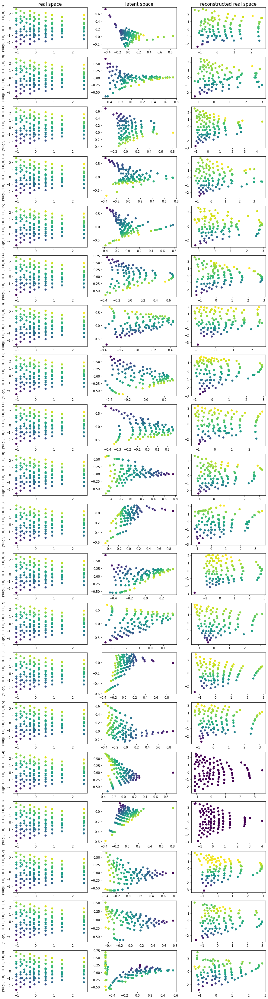

In [20]:
mygroups = ['div1div1','div1div2','rand1rand2','div1both','bothdiv1']
group = mygroups[4]
print(group,'\n')
res_filename = 'sythdiv_{}_{}_{}'.format(group,dataversion,rep)  
results_daa.plot_results(res_filename,ignore_color=False)

# 

Luigi: Using your NN (the original and my code version havnt been adapted yet) to calculate sigma 
    yields some sigmas with Negative Values! Hence, stddev of the t distribution is estimated to be negative,
    shouldnt be possible, as these sigmas are used in tfd.Normal(mu, sigma), which normally allows only pos values! Despite that, your NN works - but when trying to calculate Hellinger Distance with scipy.stats.multivariate_normal(mu,sigma), the sigma is rejected because its negative!
    
    For now, quick fix in function hyperpar_comparison, where sigma = abs(sigma) is set

In [21]:
from nets_benchmarking import performance_assessment as perf
from nets_benchmarking import func_collection as funcs
import pandas as pd 
mygroups = ['div1div1','div1div2','rand1rand2','div1both','bothdiv1']
filelst = []
for group in mygroups:
    res_filename = 'sythdiv_{}_{}_{}'.format(group,dataversion,rep)  
    filelst += [res_filename]
    
dim_latent_space = 2
zfixed = funcs.get_zfixed(dim_latent_space)
points = funcs.points_in_simplex(zfixed=zfixed,fineness=10)

hyperpar_df = perf.hyperpar_comparison(filelst,points,
                                       dumpinto='hyp',overwrite=False,
                                       displayrounded=3)

-> the displayed tuple entries indicate the (mean, std.dev), respectively
-> MSE_feats and MSE_targets calculate the mean squared error for feature and target reconstruction
-> lat_gauss and lat_uniform compare the summed-up and normalized t-distributions to 
   standard normal gauss and uniform distribution in triangle, respectively, via hellinger distance.
   Hellinger distance is a metric ranging between 0 and 1; here: the smaller, the better.
-> tot indicates total number of calculations for resp. hyperpar. 
-> err indicates how many calculations for respective hyperparameters failed

Tuple entries in hyperpar_df stand for (mean,std.dev) respectively:
                                            MSE_feats     MSE_targets       lat_gauss     lat_uniform tot err
res_(True,'luigi',1.0,1.0,1.0,1.0,0)   (0.054, 0.081)  (0.044, 0.065)  (0.408, 0.136)  (0.426, 0.125)  11   0
res_(True,'luigi',1.0,1.0,1.0,1.0,1)   (0.091, 0.106)  (0.074, 0.085)  (0.469, 0.213)    (0.475, 0.2)  11   2
res_(F